In [10]:
# most of this cell's code was run in notebook 'primeTau1oct25no2'
from sage.all import sigma, nth_prime
from sage.arith.all import moebius
import pickle
import ast

def nieburTau(n):
    def step1(n, k):
        return 35*k^4 - 52*k^3*n + 18*k^2*n^2
    def step2(n, k):
        return sigma(k) * sigma(n - k)
    def step3(n):
        ans = 0
        for k in range(1, n):
            ans += step1(n, k) * step2(n, k)
        return 24*ans
    return n^4 * sigma(n) - step3(n)


def primeTau(n):
    return nieburTau(nth_prime(n))


primeTau_list =[] 
for k in range(1, 501):
    primeTau_list.append([k,primeTau(k)])
    if k%100==0:
        print(k)

with open('/Users/barrybrent/data/run17oct25no15.txt', 'wb') as wfile:
    pickle.dump(primeTau_list, wfile) #output snipped

with open('/Users/barrybrent/data/run17oct25no15.txt', 'rb') as rfile:
    primeTau_list = pickle.load(rfile)
h_list=[[0,1]]+primeTau_list 
j_list=[(0,0)] 
for n in [1..500]:# so j(1) = 1 = h(0) as required.
    sm=0
    for r in [1..n-1]: 
        sm=sm+j_list[r][1]*h_list[n-r][1] 
    j_n=n*h_list[n][1]-sm
    j_list.append((n,j_n))

print(h_list[:10])
print()
print(j_list[:10])
    
with open('/Users/barrybrent/data/run17oct25no16.txt', 'wb') as wfile:
    pickle.dump(j_list, wfile) # ouput snipped
# That (0,0) shouldn't be there.

100
200
300
400
500
[[0, 1], [1, -24], [2, 252], [3, 4830], [4, -16744], [5, 534612], [6, -577738], [7, -6905934], [8, 10661420], [9, 18643272]]

[(0, 0), (1, -24), (2, -72), (3, 18810), (4, 518528), (5, 10323516), (6, 34401720), (7, -3989135538), (8, -155766935712), (9, -2992865260284)]


In [4]:
primeTau(1)

-24

In [12]:
def P_matrix(lst):
    lenlist = len(lst)
    columns = [lst]
    for k in range(1, lenlist):
        column = [0]*(k-1) + [-k] + lst
        column = column[:lenlist]
        columns.append(column)
    return matrix(columns).transpose()

# Increase PARI stack size to handle large polynomial root computations
pari.allocatemem(7*10^9)  # Allocate 7GB for PARI stack


import pickle
from sage.all import sigma, nth_prime, pari
import ast
import math
import time

from scipy.signal import find_peaks, correlate
from scipy.fft import fft, fftfreq
import numpy as np


def tau(n):
    def step1(n, k):
        return 35*k^4 - 52*k^3*n + 18*k^2*n^2
    def step2(n, k):
        return sigma(k) * sigma(n - k)
    def step3(n):
        ans = 0
        for k in range(1, n):
            ans=ans+step1(n, k) * step2(n, k)
        return 24*ans
    return n^4 * sigma(n) - step3(n)

def tau_prime(k):
            pn=nth_prime(k)
            return tau(pn)




    

from sage.all import sigma, nth_prime
from sage.arith.all import moebius
import pickle
import ast

def nieburTau(n):
    def step1(n, k):
        return 35*k^4 - 52*k^3*n + 18*k^2*n^2
    def step2(n, k):
        return sigma(k) * sigma(n - k)
    def step3(n):
        ans = 0
        for k in range(1, n):
            ans += step1(n, k) * step2(n, k)
        return 24*ans
    return n^4 * sigma(n) - step3(n)


def primeTau(n):
    return nieburTau(nth_prime(n))



with open('/Users/barrybrent/data/run17oct25no16.txt', 'rb') as rfile:
    j_list = pickle.load(rfile)


from sage.all import *
precision_bits = 100
CIF = ComplexIntervalField(precision_bits)
x = polygen(QQ)  # Can remain in preamble if all polynomials are in one variable
matrix_list=[]
charpol_list=[]
roots_list=[]
aar_list=[]
centers_list=[]
max_diameter_list=[]
mins_list=[]
maxes_list=[]
log_mins_list=[]
log_maxes_list=[]
no=[]
tests=[]
for n in range(1,10):
    lst = [j[1] for j in j_list[1:n+1]] # cuts out the dummy offset
    inpt=[j for j in lst]
    pl=P_matrix(inpt)
    test=pl.det()/(primeTau(n)*factorial(n))
    tests.append(test)
    print((n,test))

    
print("tests:")
print(tests)

(1, 1)
(2, 1)
(3, 1)
(4, 1)
(5, 1)
(6, 1)
(7, 1)
(8, 1)
(9, 1)
tests:
[1, 1, 1, 1, 1, 1, 1, 1, 1]


In [13]:
import pickle
from sage.all import sigma, nth_prime
import ast

def nieburTau(n):
    def step1(n, k):
        return 35*k^4 - 52*k^3*n + 18*k^2*n^2
    def step2(n, k):
        return sigma(k) * sigma(n - k)
    def step3(n):
        ans = 0
        for k in range(1, n):
            ans += step1(n, k) * step2(n, k)
        return 24*ans
    return n^4 * sigma(n) - step3(n)

def h(n):
    if n>0:
        return nieburTau(nth_prime(n)) # i.e., tauPrime(n)
    if n==0:
        return 1
        
with open('/Users/barrybrent/data/run17oct25no16.txt', 'rb') as rfile:
    j_list = pickle.load(rfile) #tauPrime(n) j-companion

def P_matrix(lst):
    lenlist=len(lst)
    columns=[lst]
    for k in range(1,lenlist):
        column=[0]*(k-1)
        column=column+[-k]
        column=flatten(column+[lst])
        column=column+[lst]
        column=column[:lenlist]
        columns+=[column]
    return (matrix(columns)).transpose()

from sage.all import *
precision_bits = 100
CIF = ComplexIntervalField(precision_bits)
x = polygen(QQ)  # Can remain in preamble if all polynomials are in one variable
matrix_list=[]
charpol_list=[]
roots_list=[]
aar_list=[]
centers_list=[]
max_diameter_list=[]
mins_list=[]
log_mins_list=[]
maxes_list=[]
log_maxes_list=[]
dets=[]
tests=[]
for n in range(1,4):
    print("------------------------------------------------------------------")
    print("n:",n,"undeformed:")
    undeformed_j_list=j_list[1:n+1]
    undeformed_inputs=[pair[1] for pair in undeformed_j_list]
    print("undeformed inputs:")
    print(undeformed_inputs)
    print()
    pl_undeformed=P_matrix(undeformed_inputs)
    undeformed_det=pl_undeformed.det()
    print("matrix:")
    show(pl_undeformed)
    print()
    print("h(n):",h(n),"det/n!:",undeformed_det/factorial(n))

------------------------------------------------------------------
n: 1 undeformed:
undeformed inputs:
[-24]

matrix:


[-24]


h(n): -24 det/n!: -24
------------------------------------------------------------------
n: 2 undeformed:
undeformed inputs:
[-24, -72]

matrix:


[-24  -1]
[-72 -24]


h(n): 252 det/n!: 252
------------------------------------------------------------------
n: 3 undeformed:
undeformed inputs:
[-24, -72, 18810]

matrix:


[  -24    -1     0]
[  -72   -24    -2]
[18810   -72   -24]


h(n): 4830 det/n!: 4830


----------------------------------------------------------------------------------------------------
(1, 0)
MINIMUM MODULI


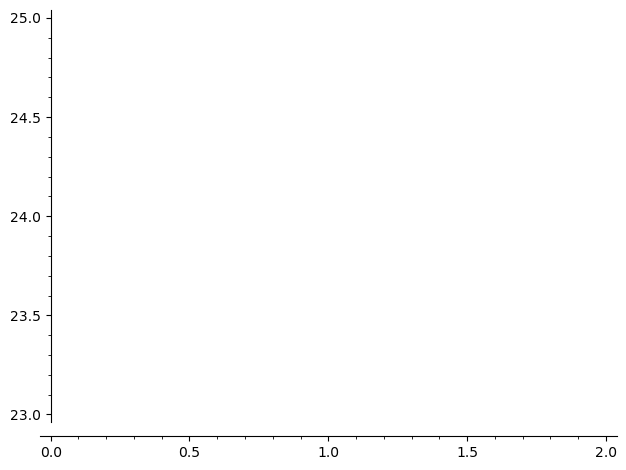

LOGS MINIMUM MODULI


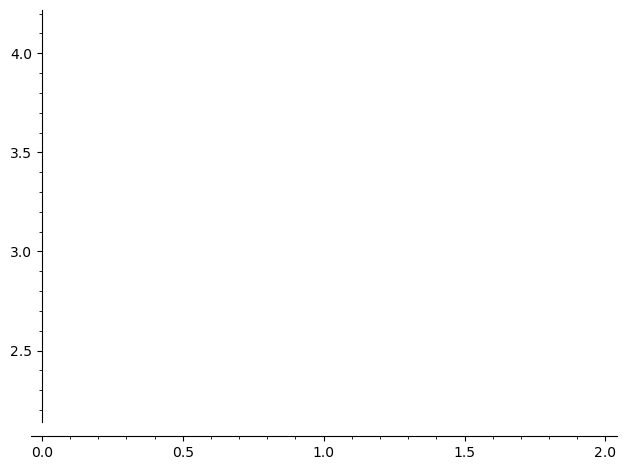

minimum logarithm of minimum modulus: 3.1780538303479456196469416013
MAXIMUM MODULI


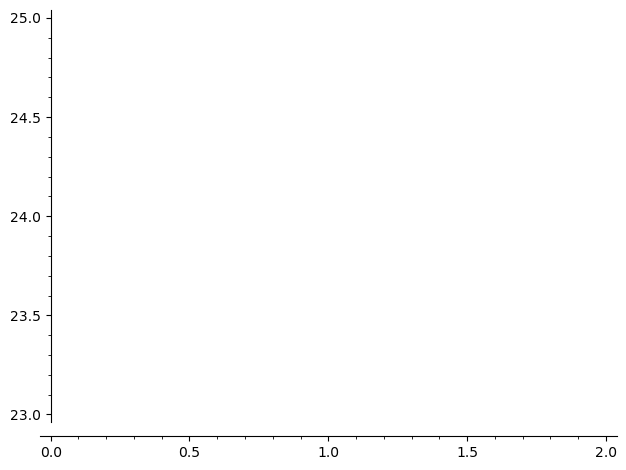

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(2, 0)
MINIMUM MODULI


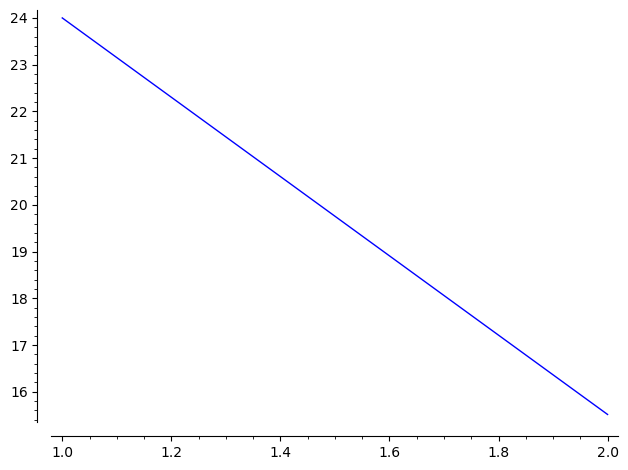

LOGS MINIMUM MODULI


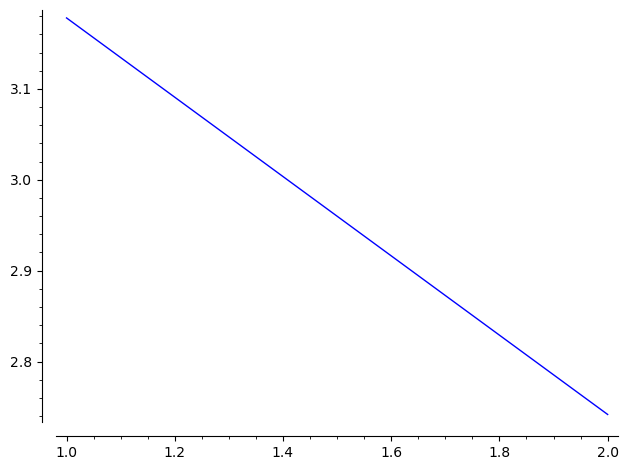

minimum logarithm of minimum modulus: 2.7417891621098149938440971635
MAXIMUM MODULI


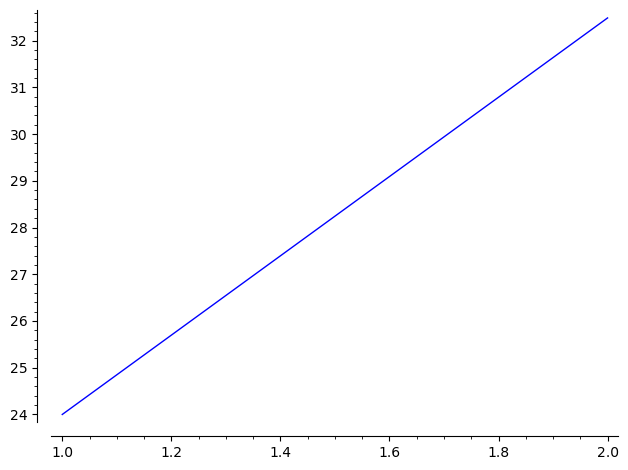

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(3, 0)
MINIMUM MODULI


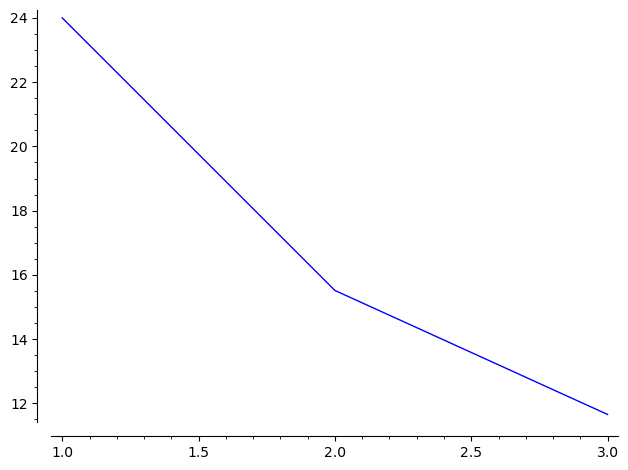

LOGS MINIMUM MODULI


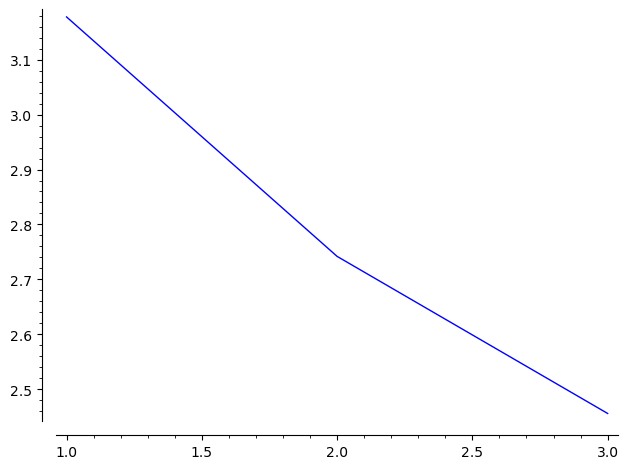

minimum logarithm of minimum modulus: 2.4555927979065595397004914080
MAXIMUM MODULI


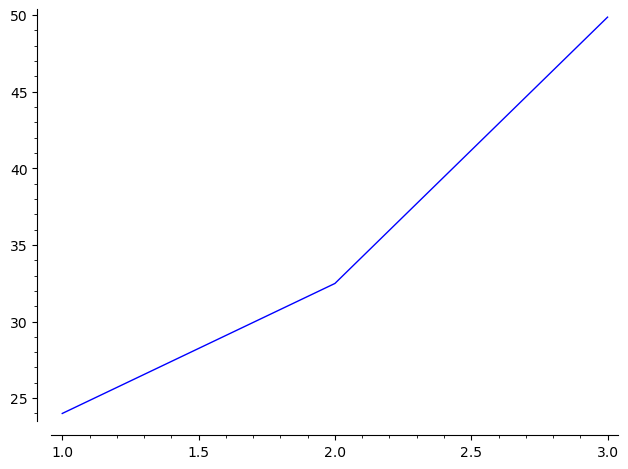

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(4, 0)
MINIMUM MODULI


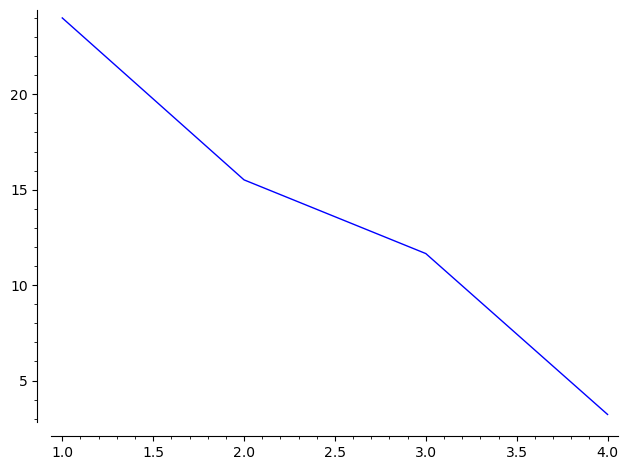

LOGS MINIMUM MODULI


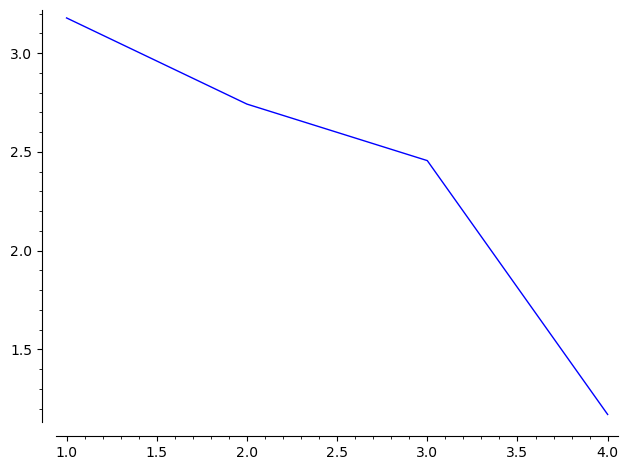

minimum logarithm of minimum modulus: 1.1701709544186771526159982686
MAXIMUM MODULI


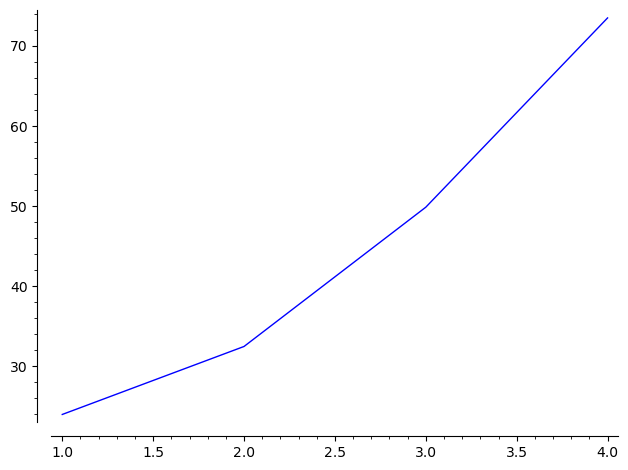

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(5, 0)
MINIMUM MODULI


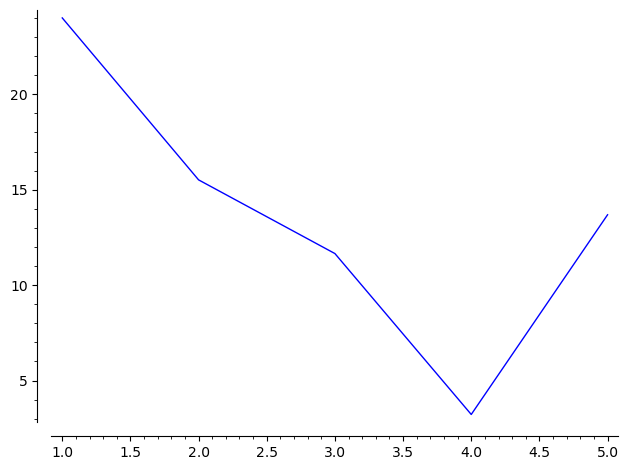

LOGS MINIMUM MODULI


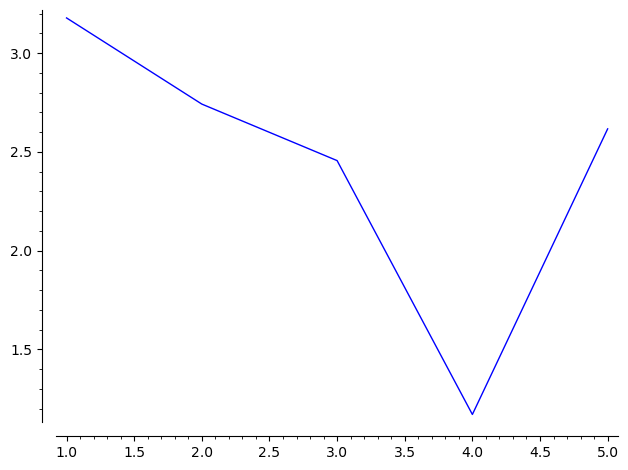

minimum logarithm of minimum modulus: 1.1701709544186771526159982686
MAXIMUM MODULI


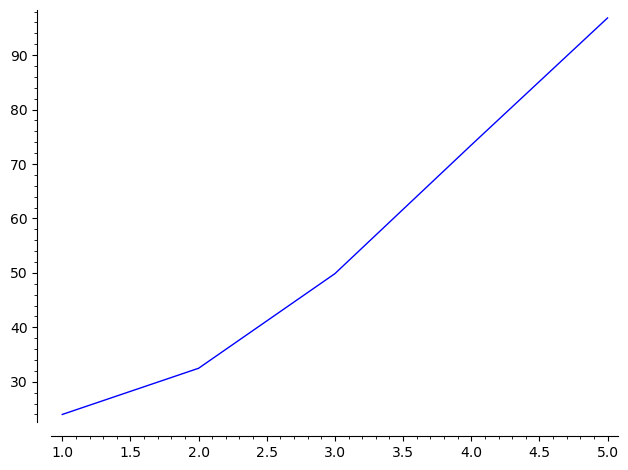

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(6, 0)
MINIMUM MODULI


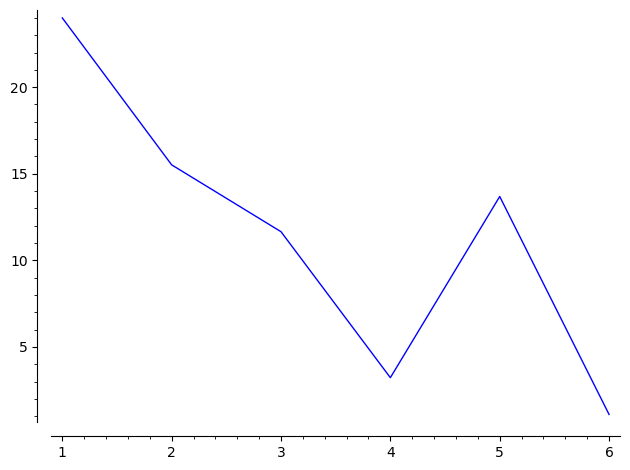

LOGS MINIMUM MODULI


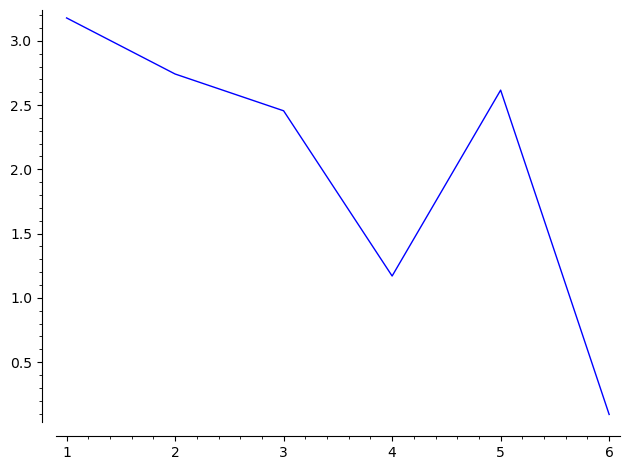

minimum logarithm of minimum modulus: 0.093046049028700661556241847026
MAXIMUM MODULI


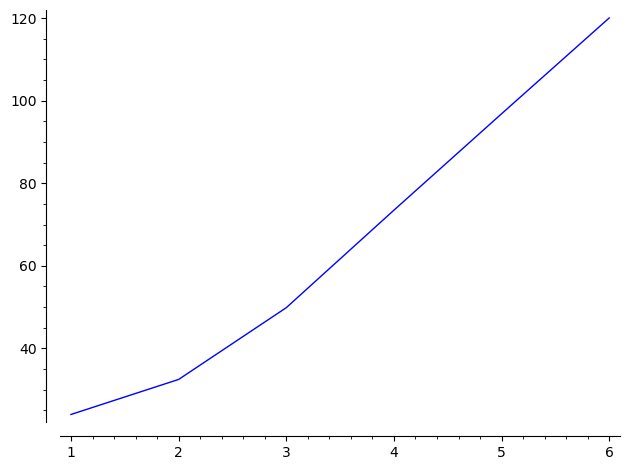

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(7, 0)
MINIMUM MODULI


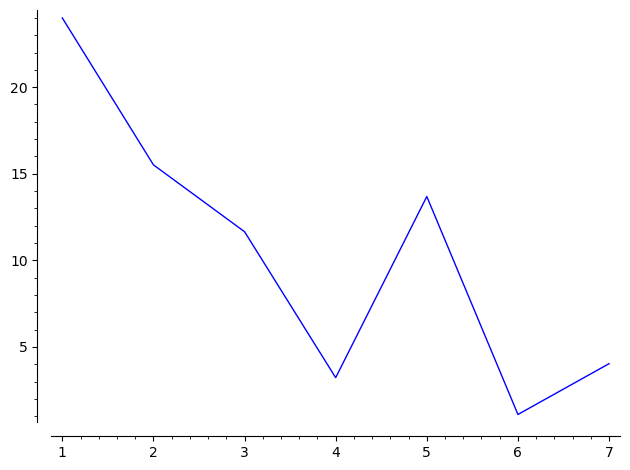

LOGS MINIMUM MODULI


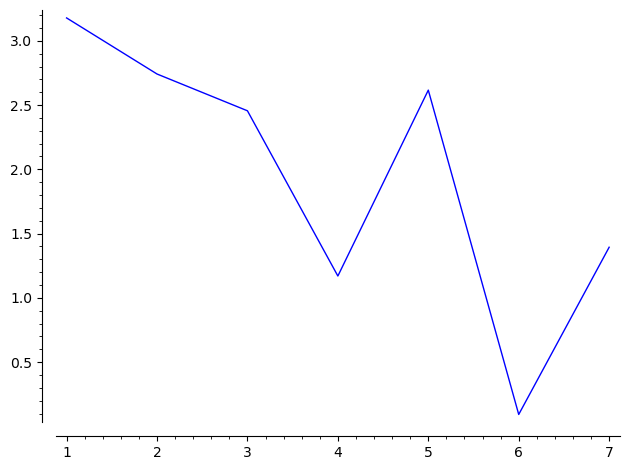

minimum logarithm of minimum modulus: 0.093046049028700661556241847026
MAXIMUM MODULI


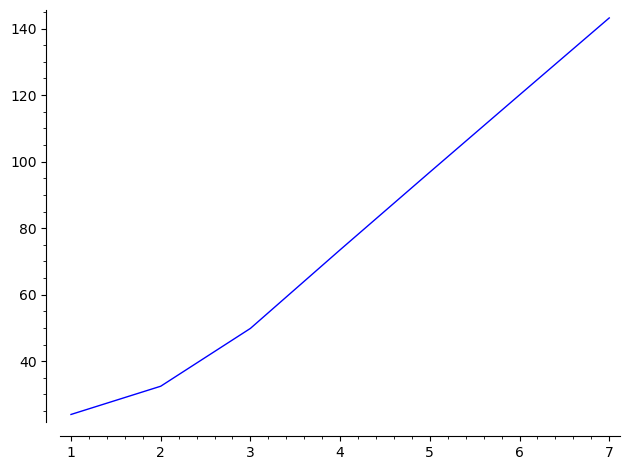

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(8, 0)
MINIMUM MODULI


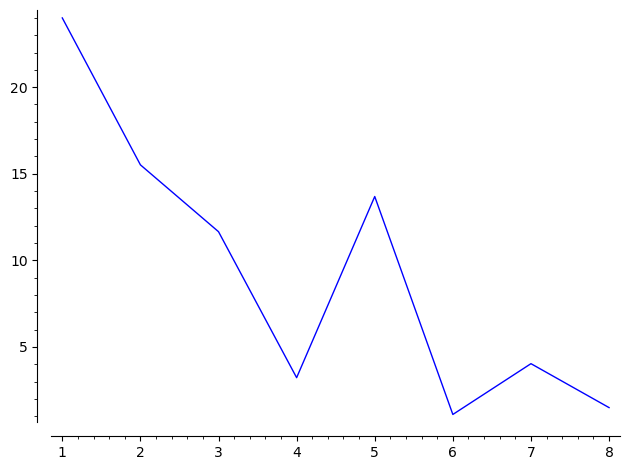

LOGS MINIMUM MODULI


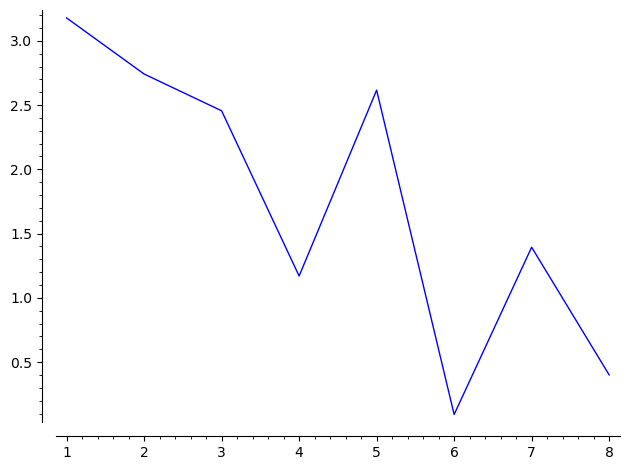

minimum logarithm of minimum modulus: 0.093046049028700661556241847026
MAXIMUM MODULI


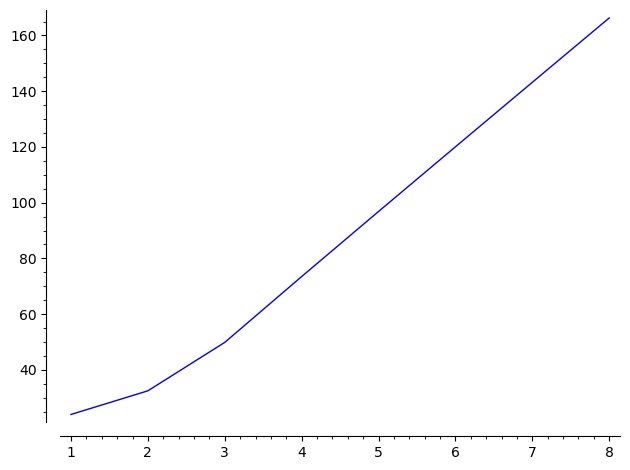

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(9, 0)
MINIMUM MODULI


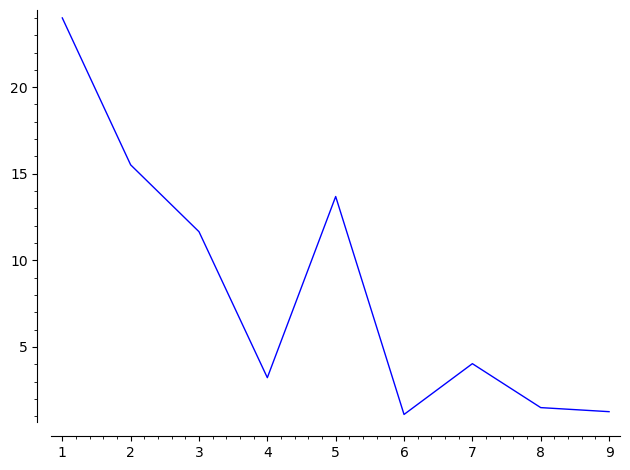

LOGS MINIMUM MODULI


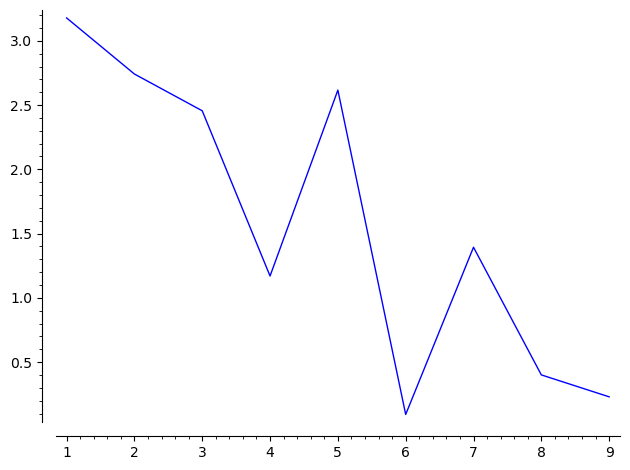

minimum logarithm of minimum modulus: 0.093046049028700661556241847026
MAXIMUM MODULI


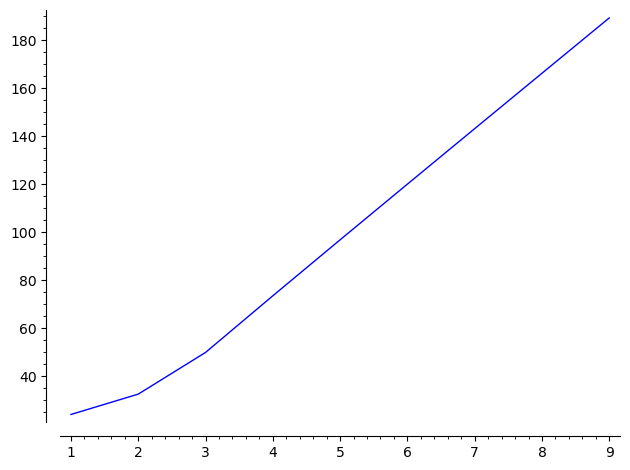

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(10, 0)
MINIMUM MODULI


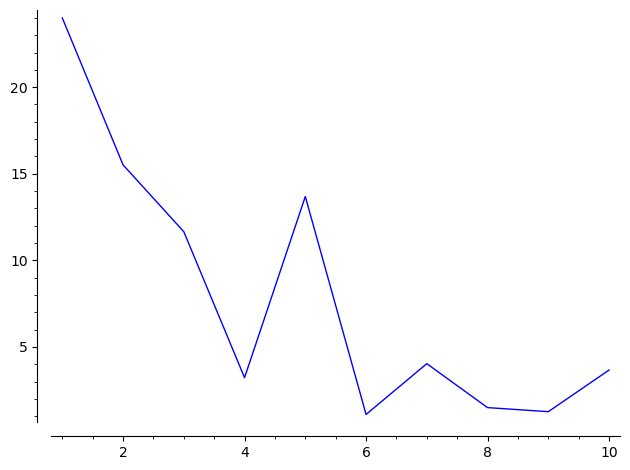

LOGS MINIMUM MODULI


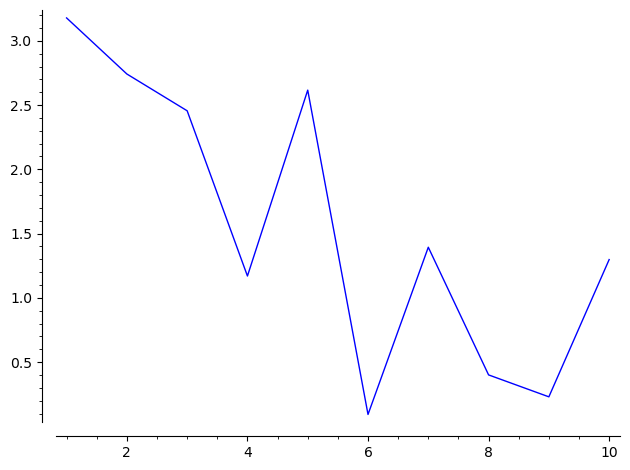

minimum logarithm of minimum modulus: 0.093046049028700661556241847026
MAXIMUM MODULI


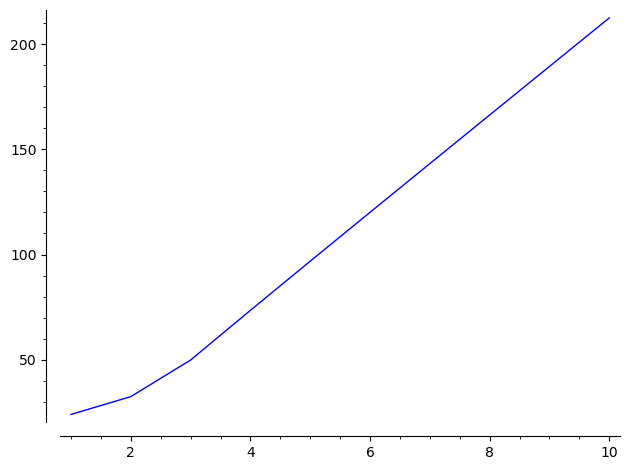

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(11, 0)
MINIMUM MODULI


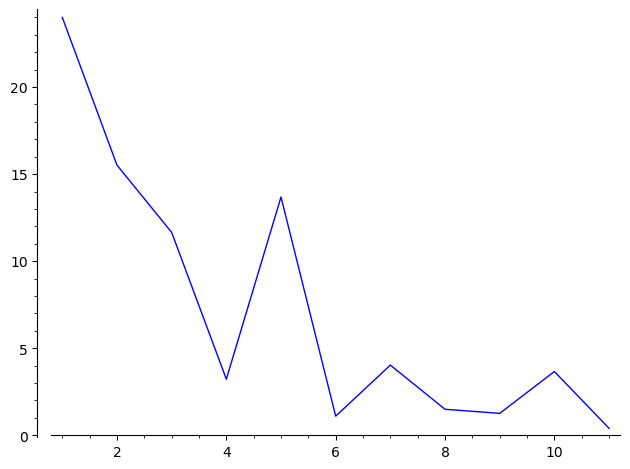

LOGS MINIMUM MODULI


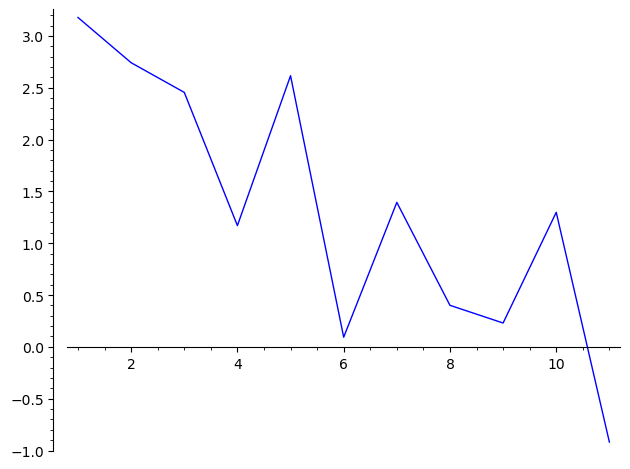

minimum logarithm of minimum modulus: -0.91843847282867748344461420721
MAXIMUM MODULI


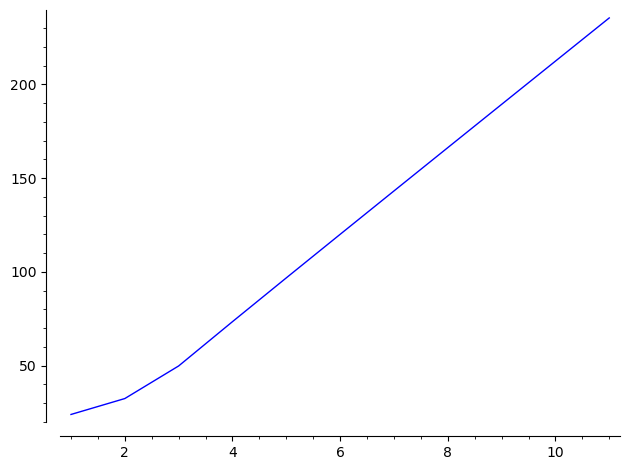

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(12, 0)
MINIMUM MODULI


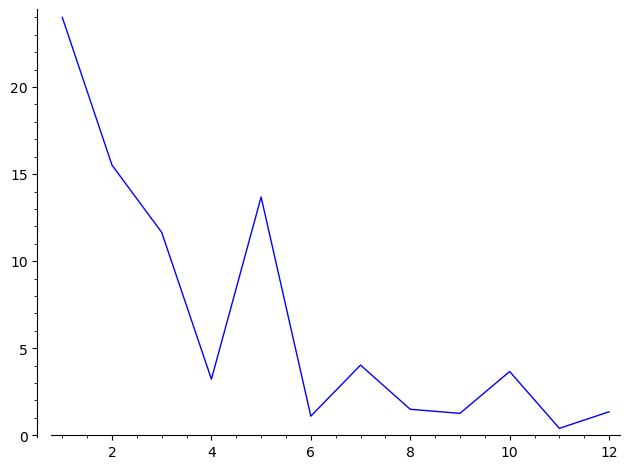

LOGS MINIMUM MODULI


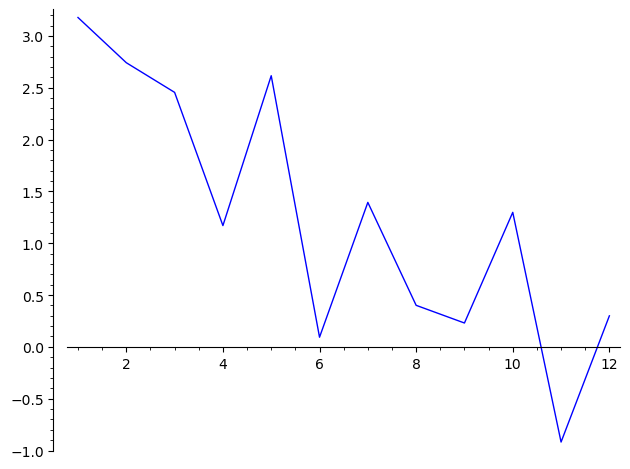

minimum logarithm of minimum modulus: -0.91843847282867748344461420721
MAXIMUM MODULI


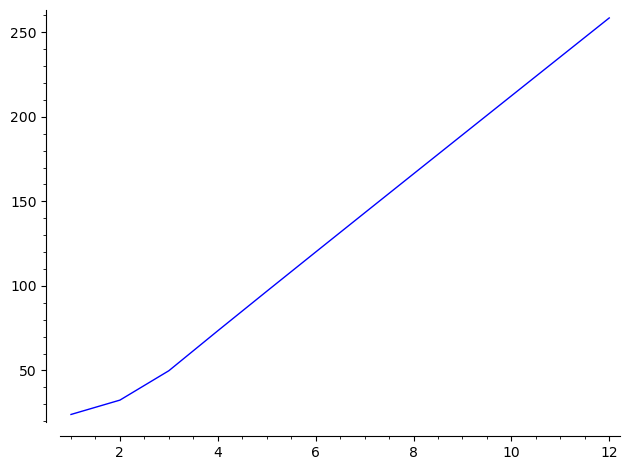

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(13, 0)
MINIMUM MODULI


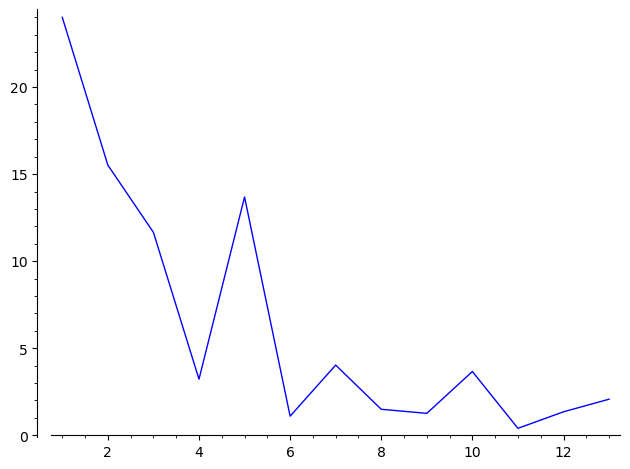

LOGS MINIMUM MODULI


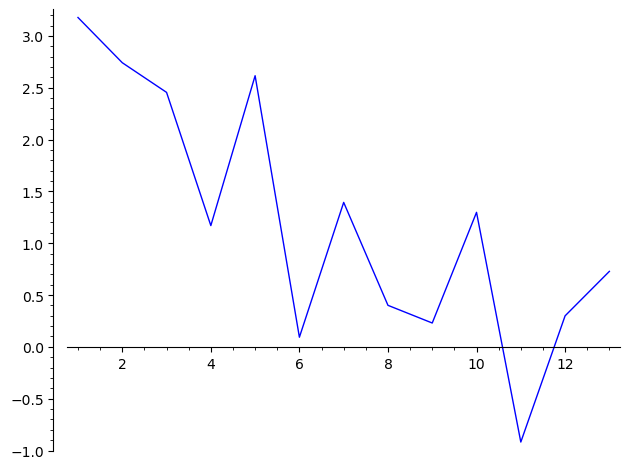

minimum logarithm of minimum modulus: -0.91843847282867748344461420721
MAXIMUM MODULI


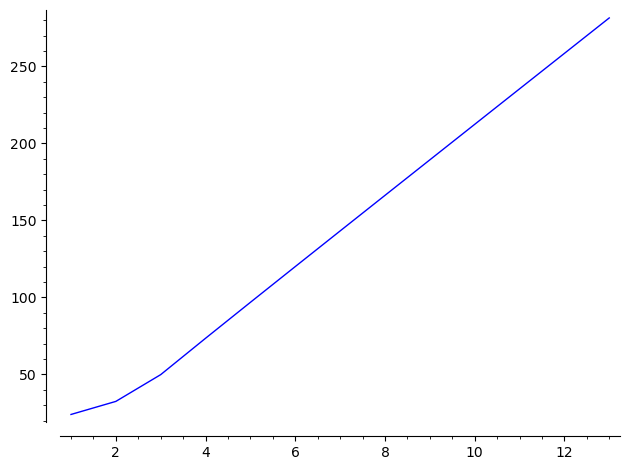

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(14, 0)
MINIMUM MODULI


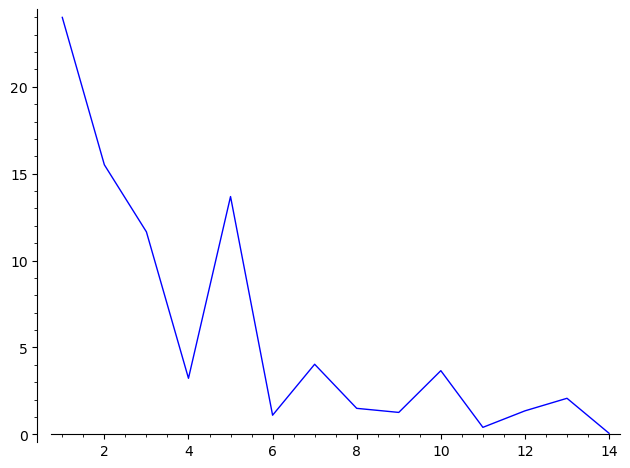

LOGS MINIMUM MODULI


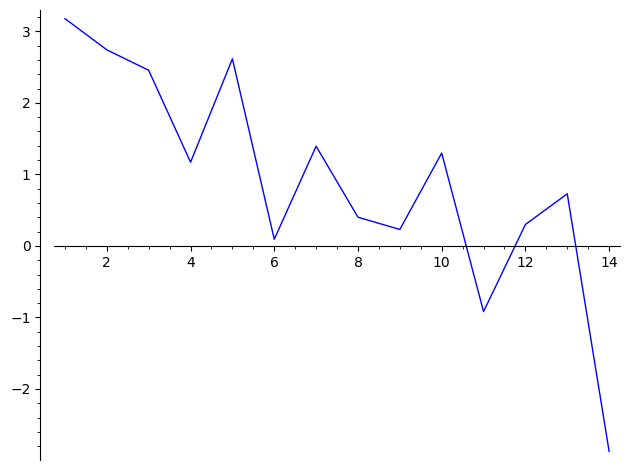

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


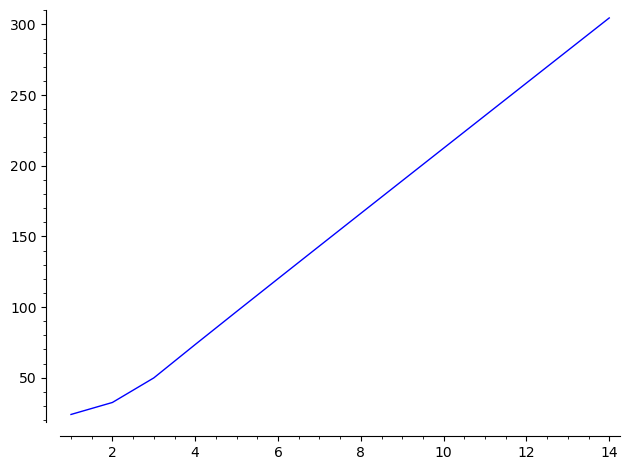

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(15, 0)
MINIMUM MODULI


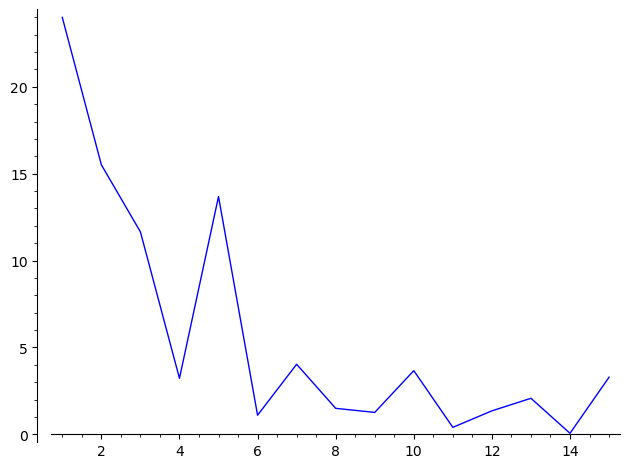

LOGS MINIMUM MODULI


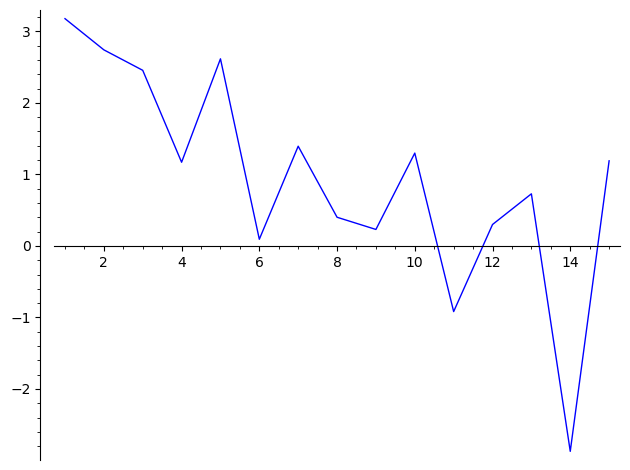

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


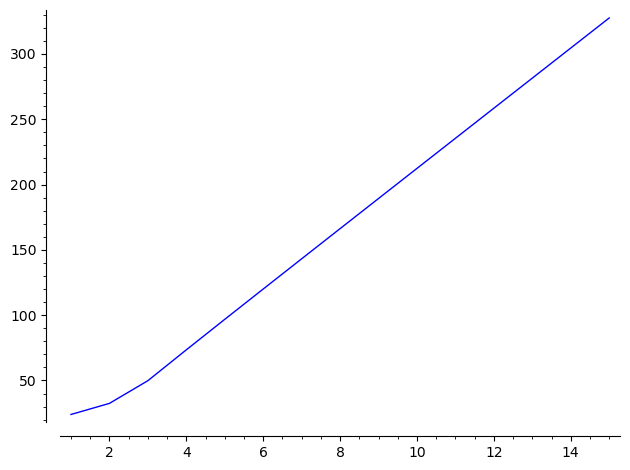

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(16, 0)
MINIMUM MODULI


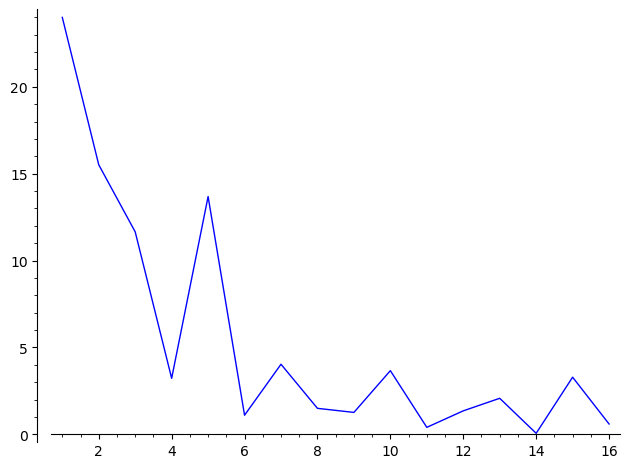

LOGS MINIMUM MODULI


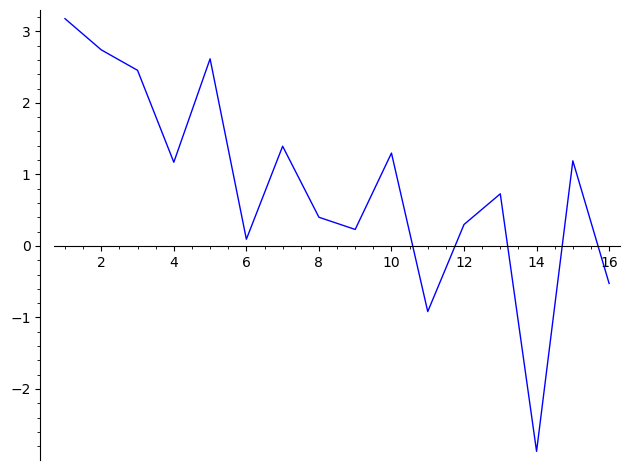

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


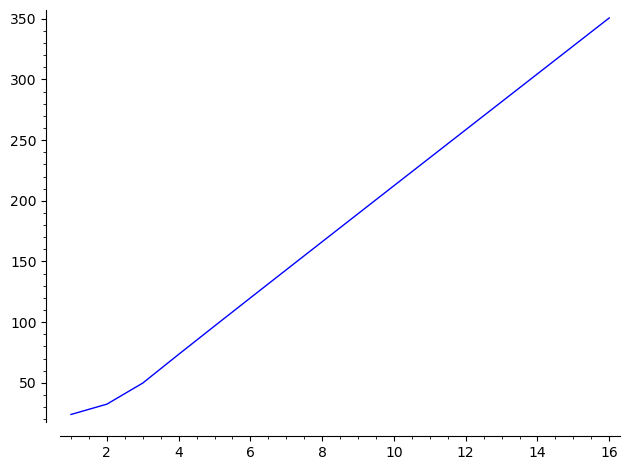

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(17, 0)
MINIMUM MODULI


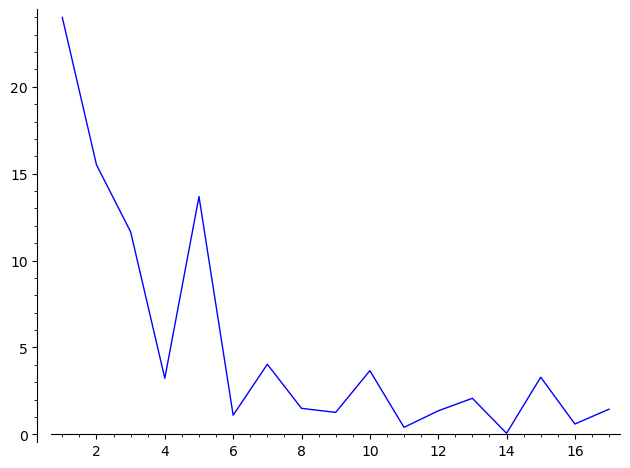

LOGS MINIMUM MODULI


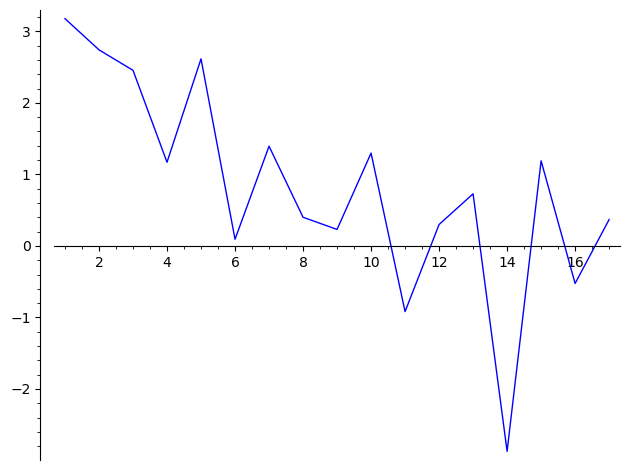

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


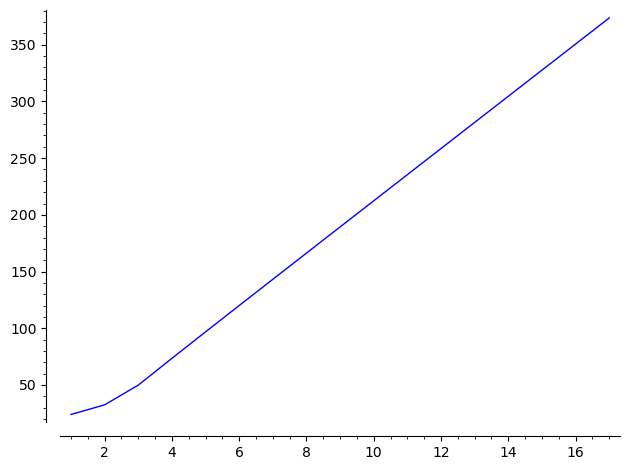

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(18, 0)
MINIMUM MODULI


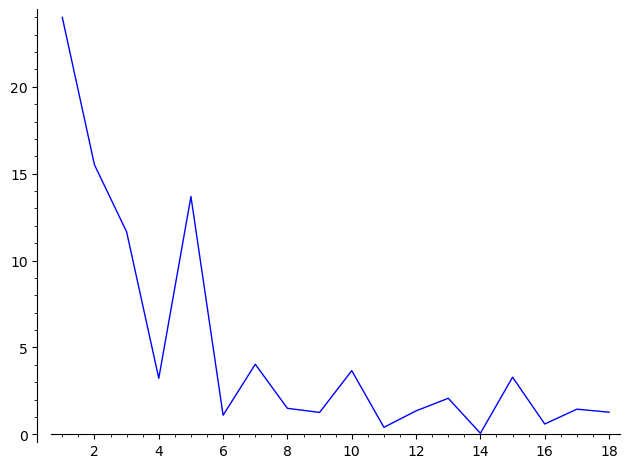

LOGS MINIMUM MODULI


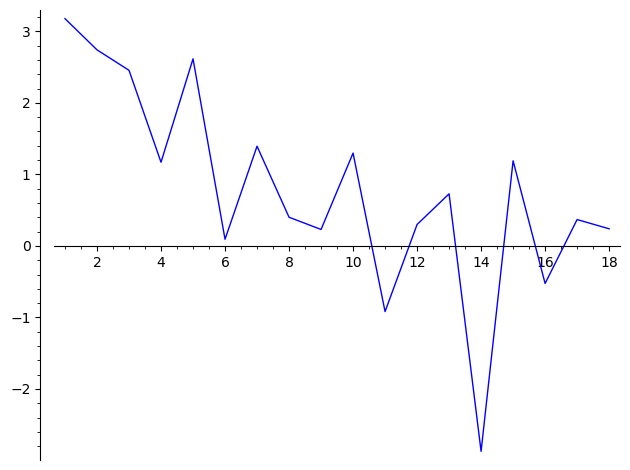

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


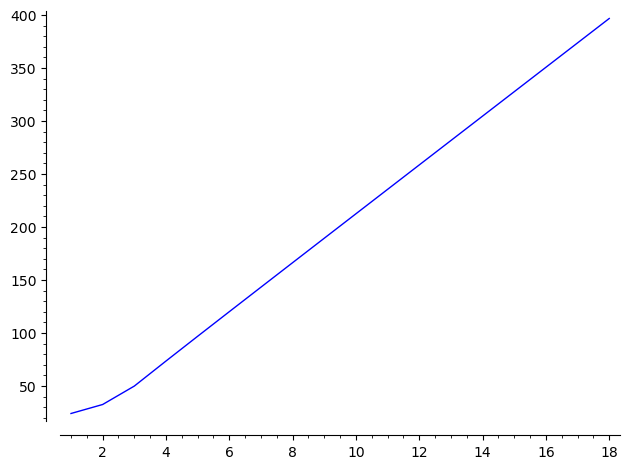

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(19, 0)
MINIMUM MODULI


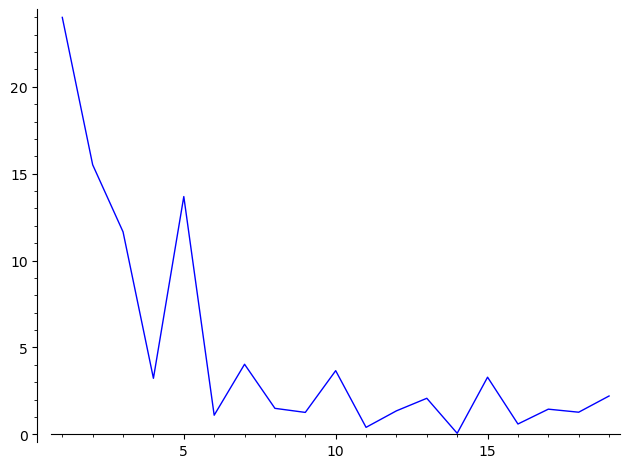

LOGS MINIMUM MODULI


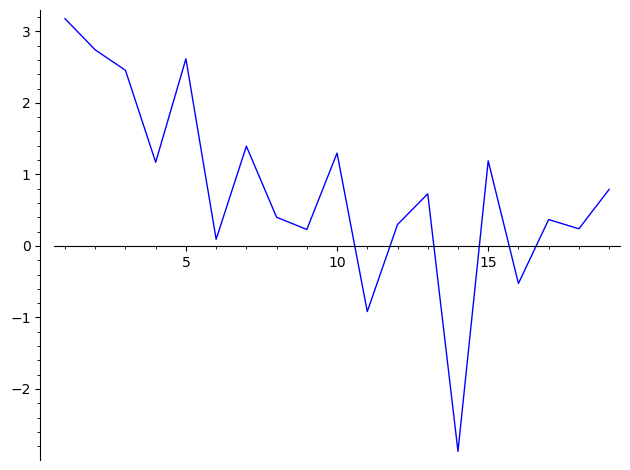

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


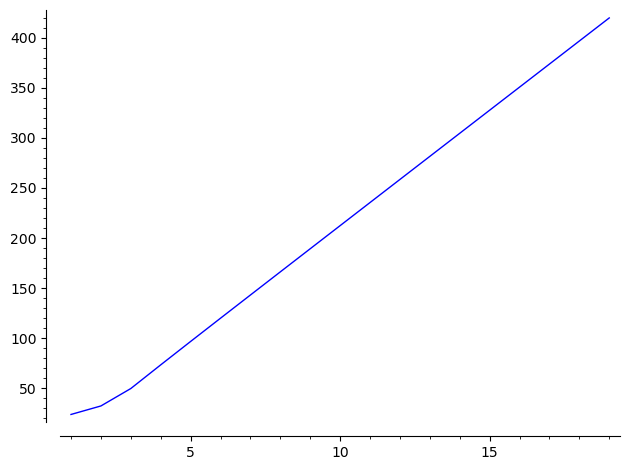

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(20, 0)
MINIMUM MODULI


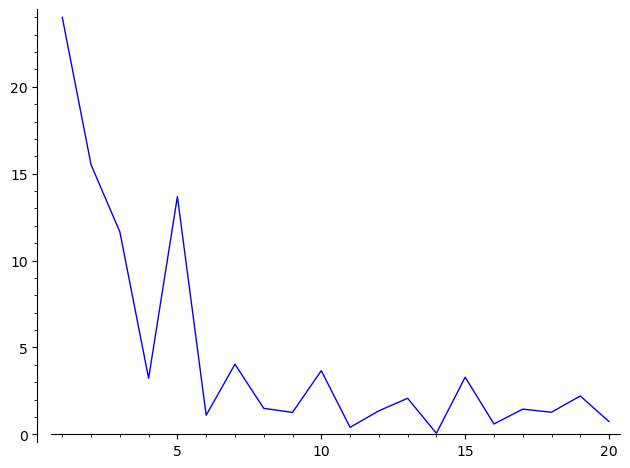

LOGS MINIMUM MODULI


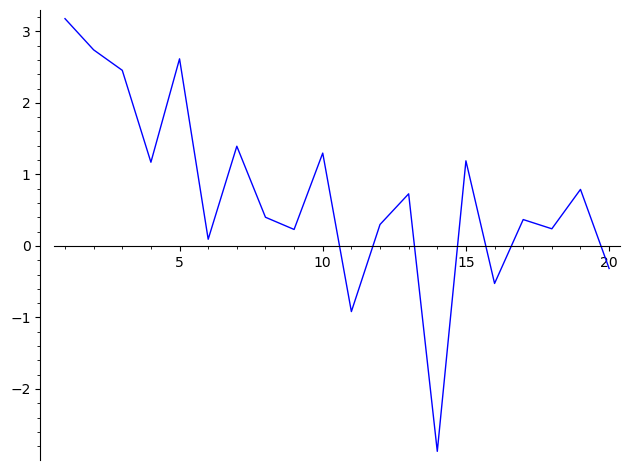

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


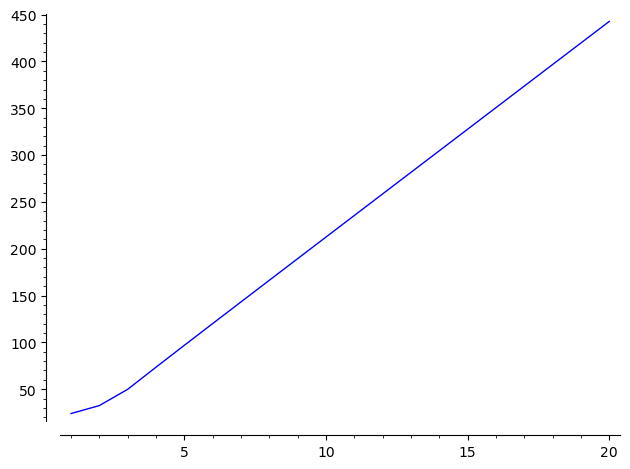

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(21, 0)
MINIMUM MODULI


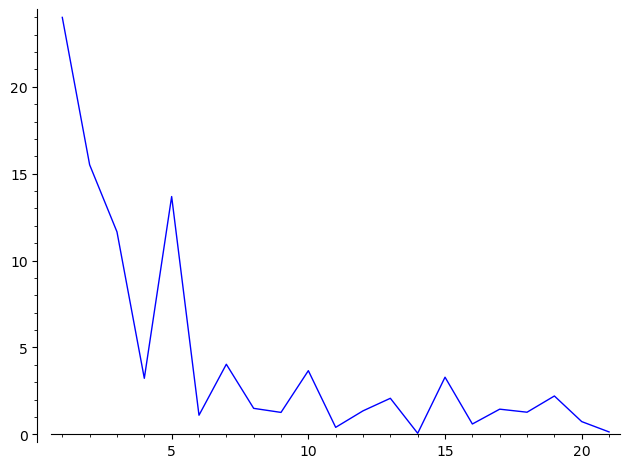

LOGS MINIMUM MODULI


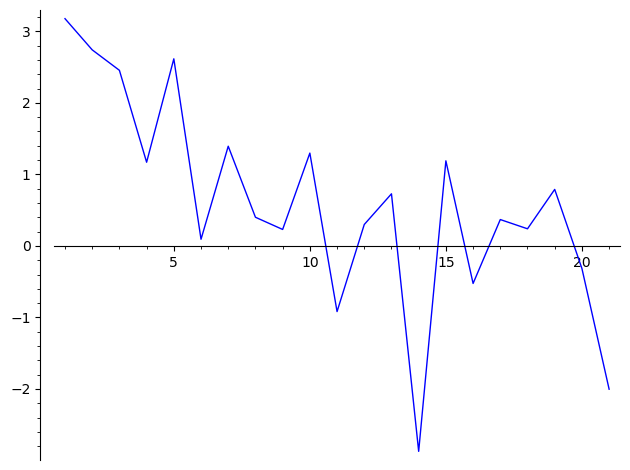

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


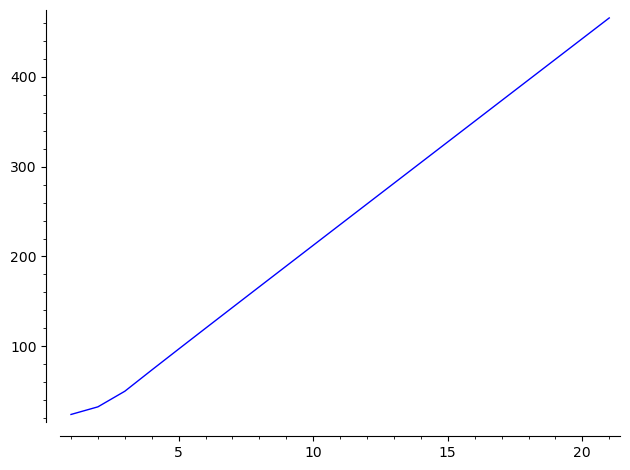

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(22, 0)
MINIMUM MODULI


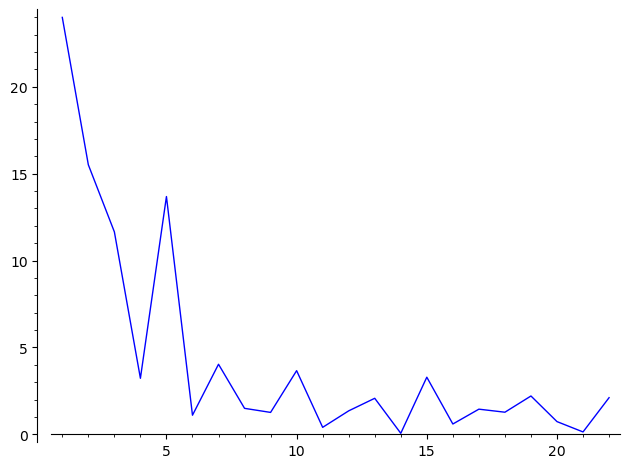

LOGS MINIMUM MODULI


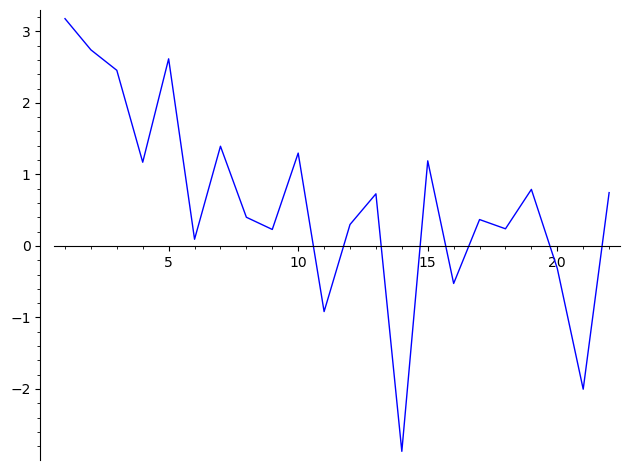

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


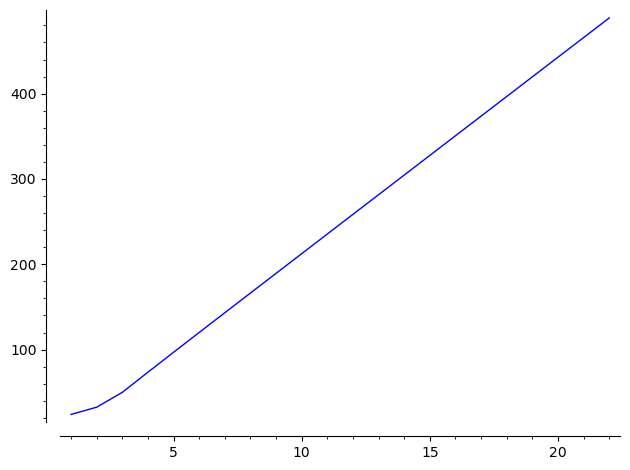

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(23, 0)
MINIMUM MODULI


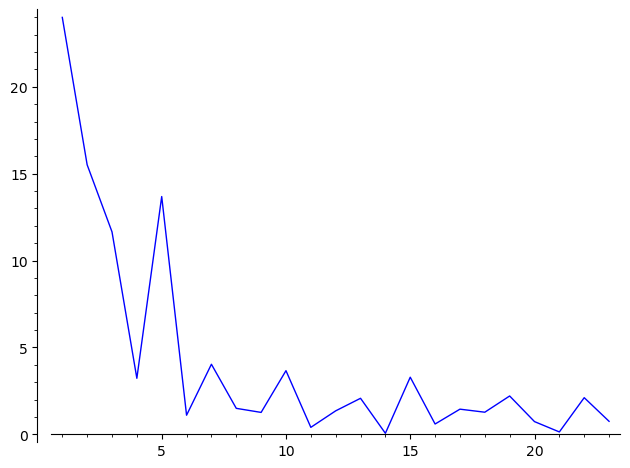

LOGS MINIMUM MODULI


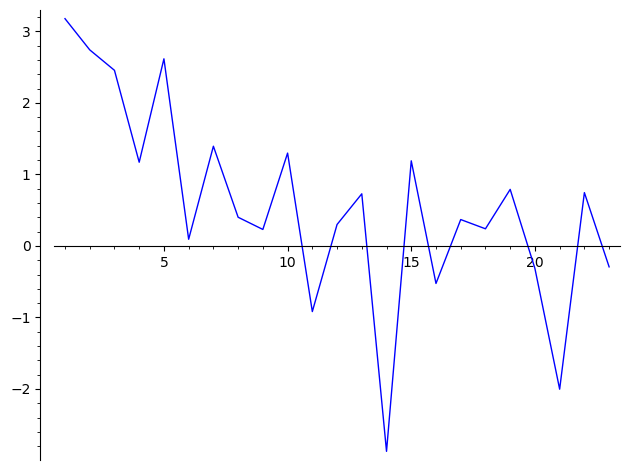

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


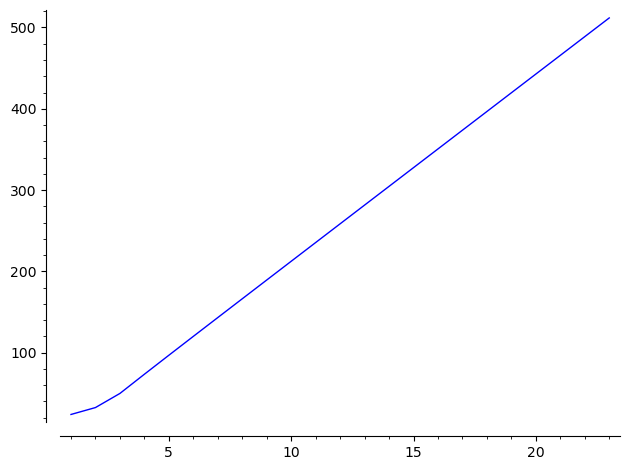

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(24, 0)
MINIMUM MODULI


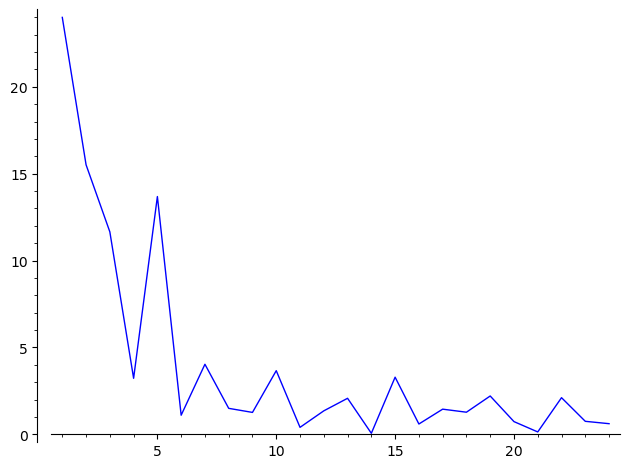

LOGS MINIMUM MODULI


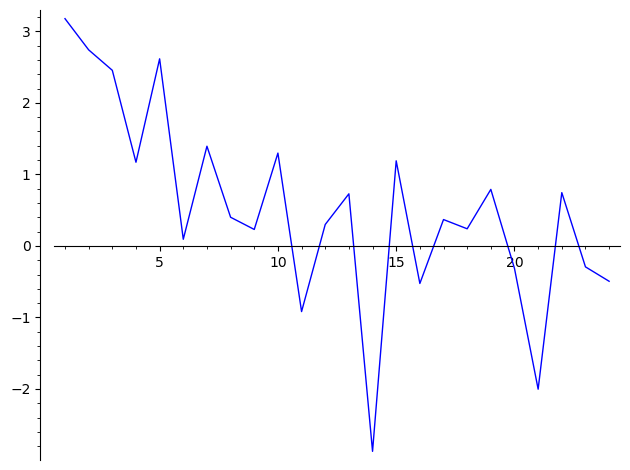

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


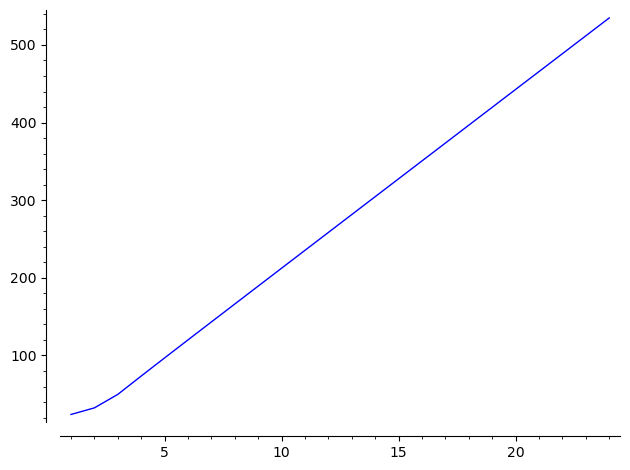

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(25, 0)
MINIMUM MODULI


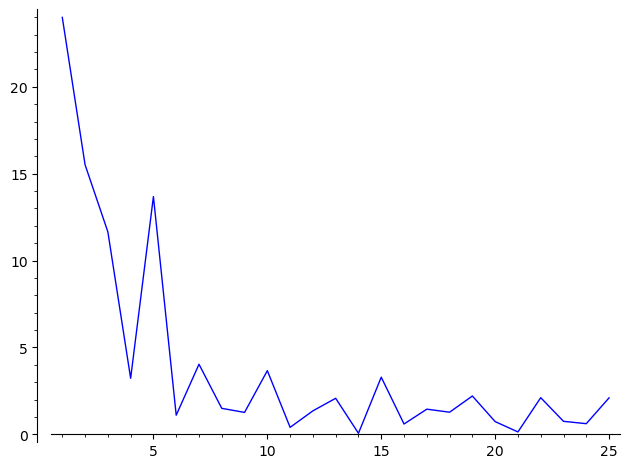

LOGS MINIMUM MODULI


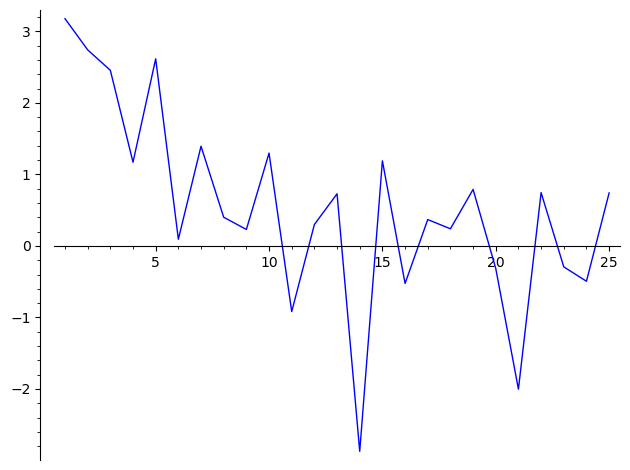

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


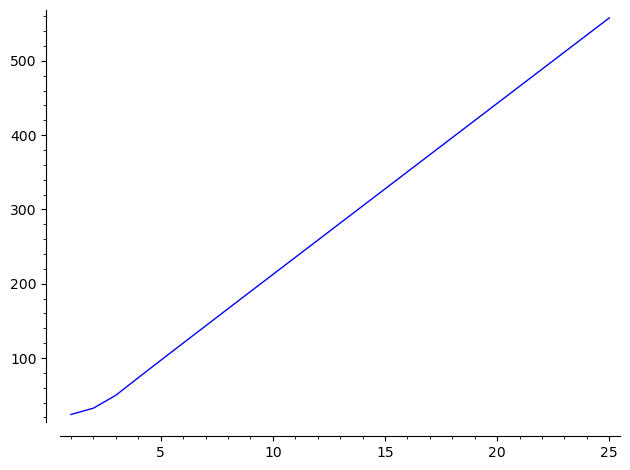

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(26, 0)
MINIMUM MODULI


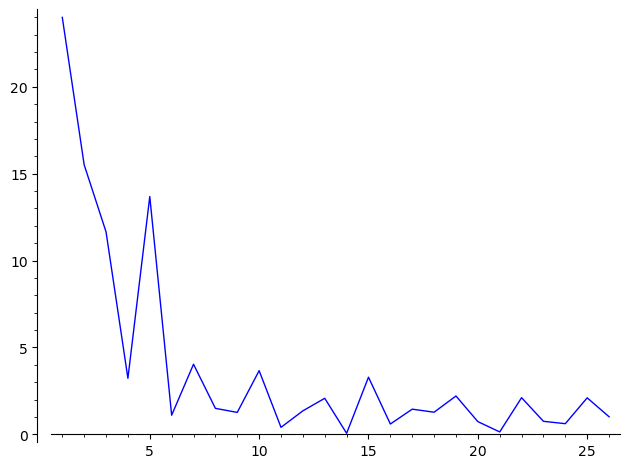

LOGS MINIMUM MODULI


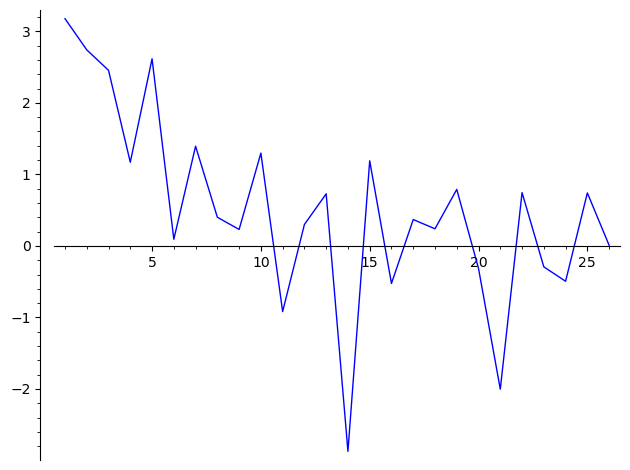

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


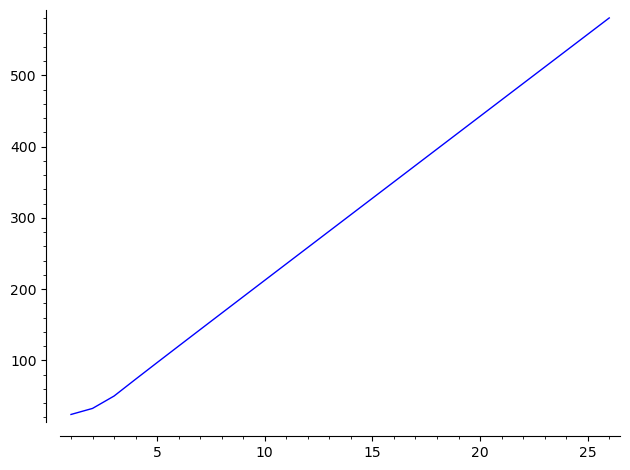

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(27, 0)
MINIMUM MODULI


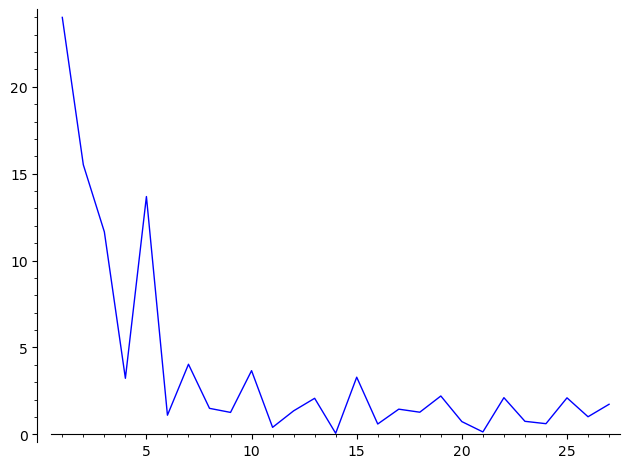

LOGS MINIMUM MODULI


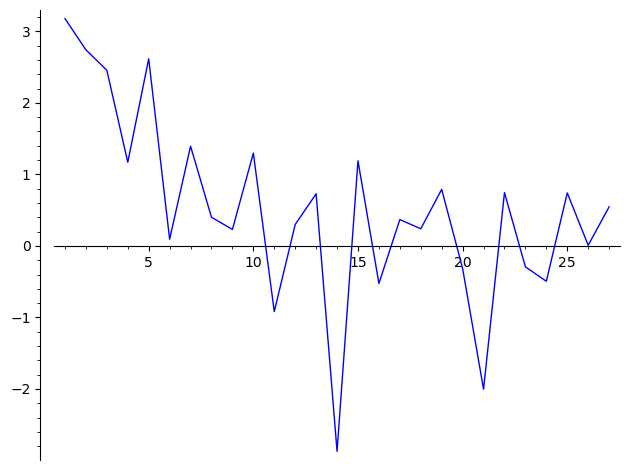

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


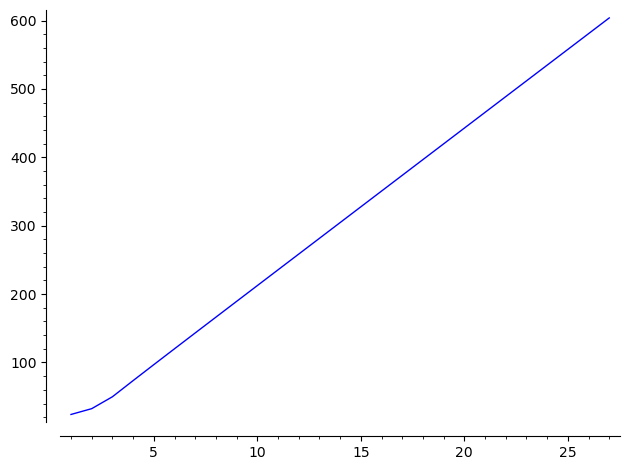

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(28, 0)
MINIMUM MODULI


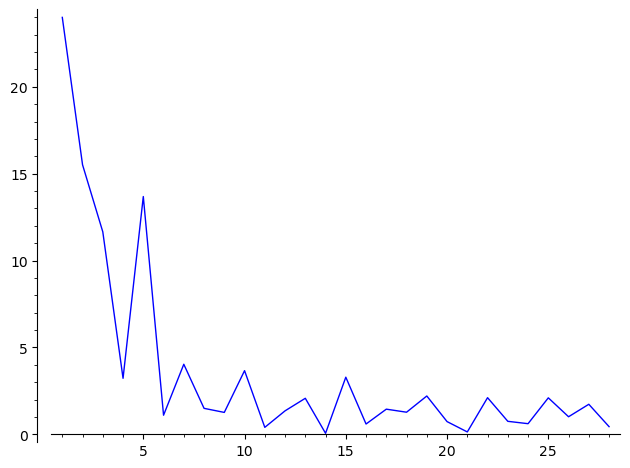

LOGS MINIMUM MODULI


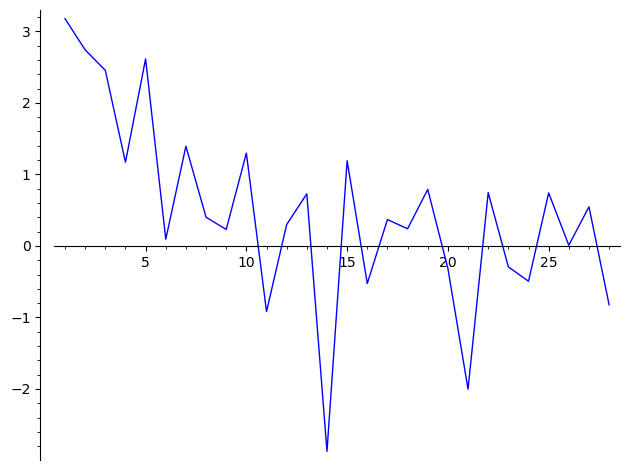

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


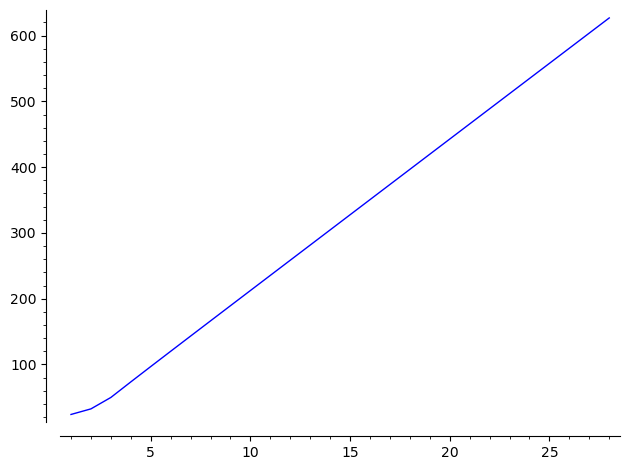

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(29, 0)
MINIMUM MODULI


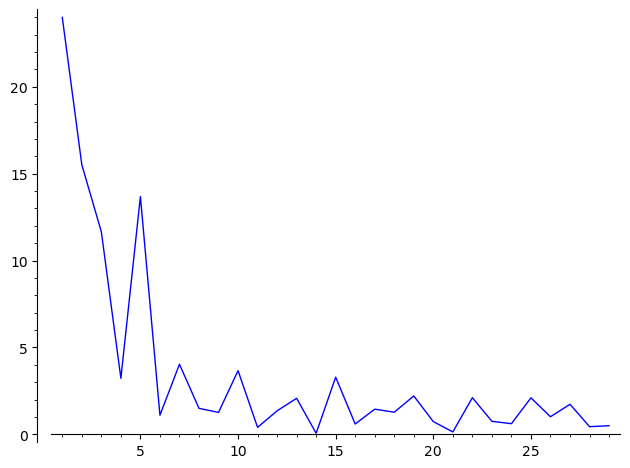

LOGS MINIMUM MODULI


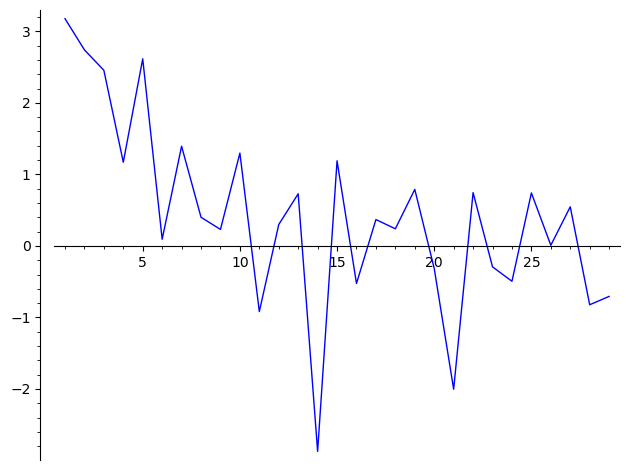

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


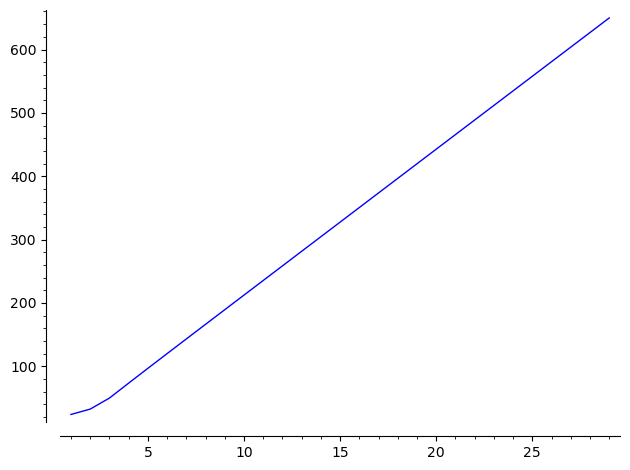

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(30, 0)
MINIMUM MODULI


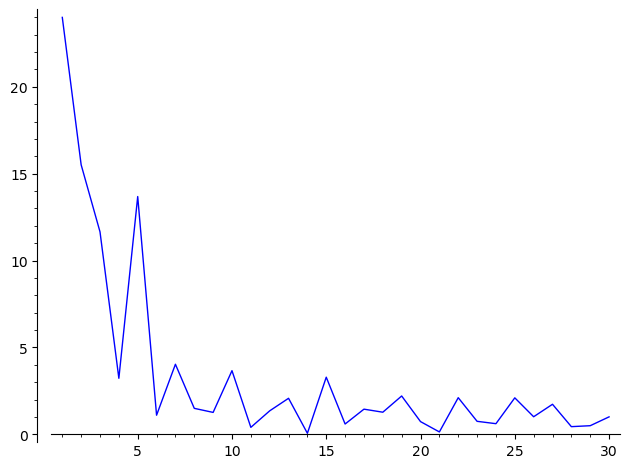

LOGS MINIMUM MODULI


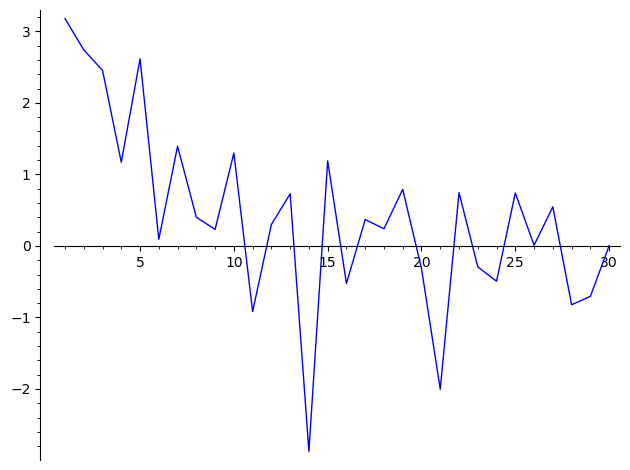

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


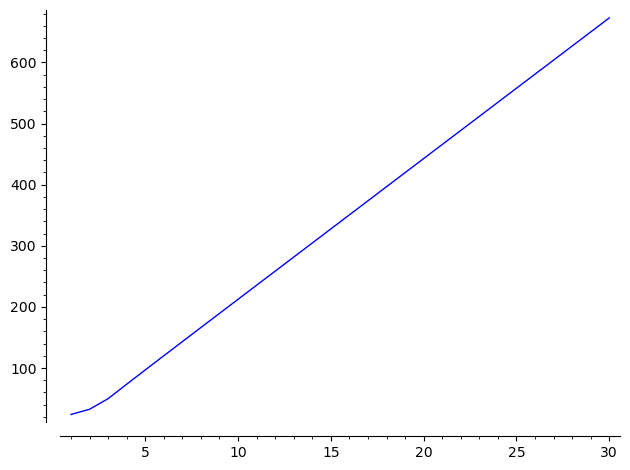

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(31, 0)
MINIMUM MODULI


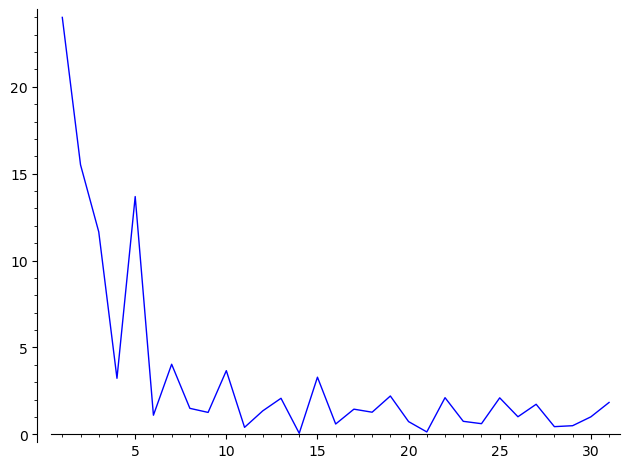

LOGS MINIMUM MODULI


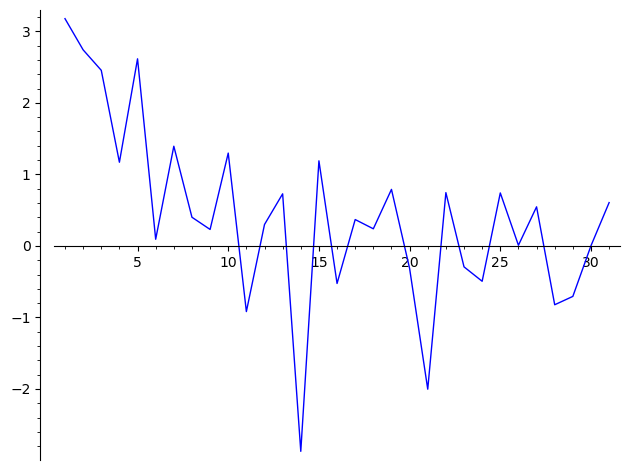

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


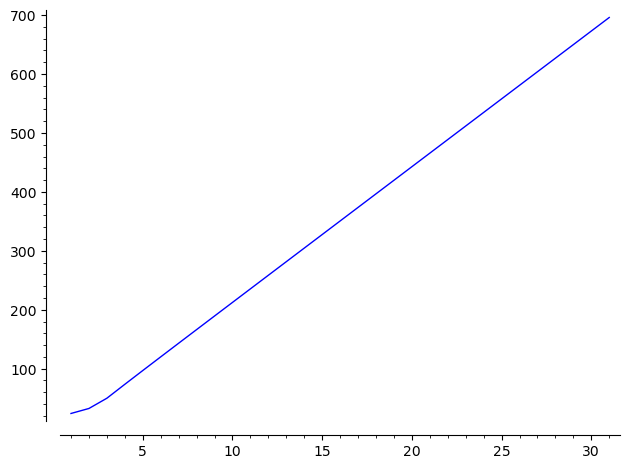

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(32, 0)
MINIMUM MODULI


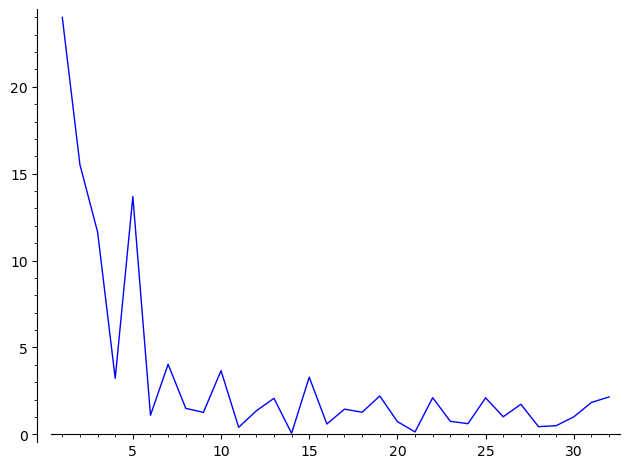

LOGS MINIMUM MODULI


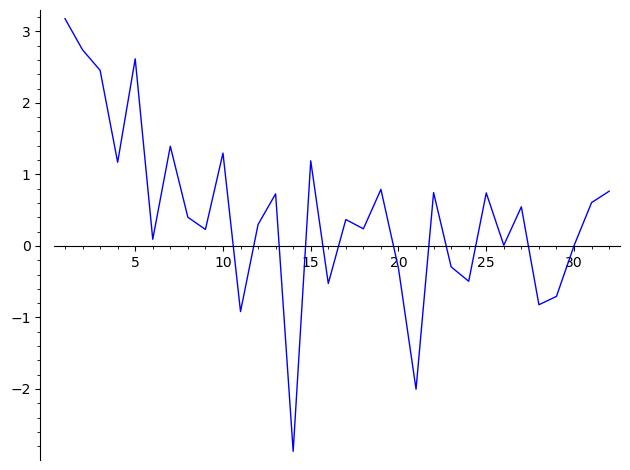

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


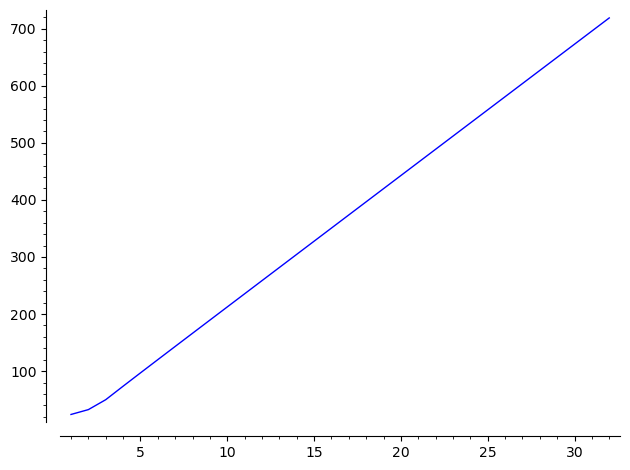

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(33, 0)
MINIMUM MODULI


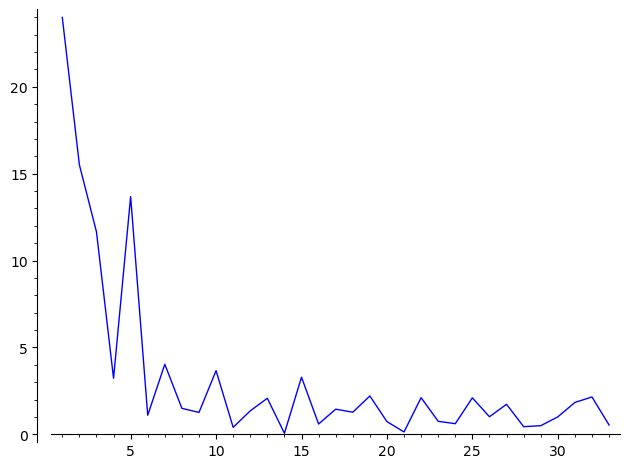

LOGS MINIMUM MODULI


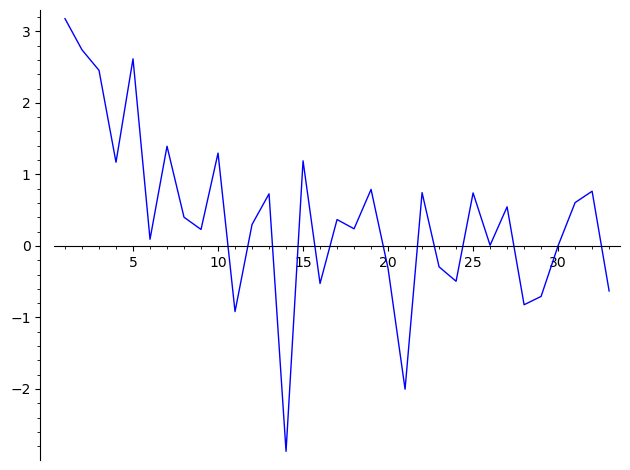

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


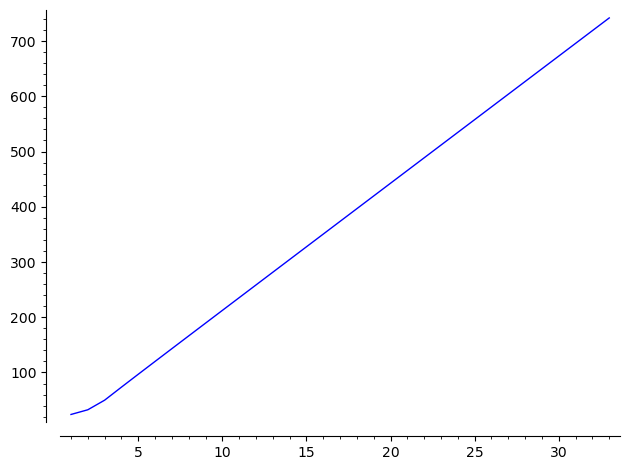

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(34, 0)
MINIMUM MODULI


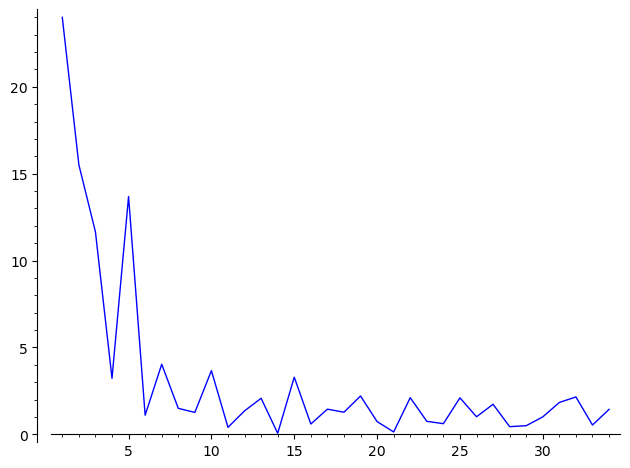

LOGS MINIMUM MODULI


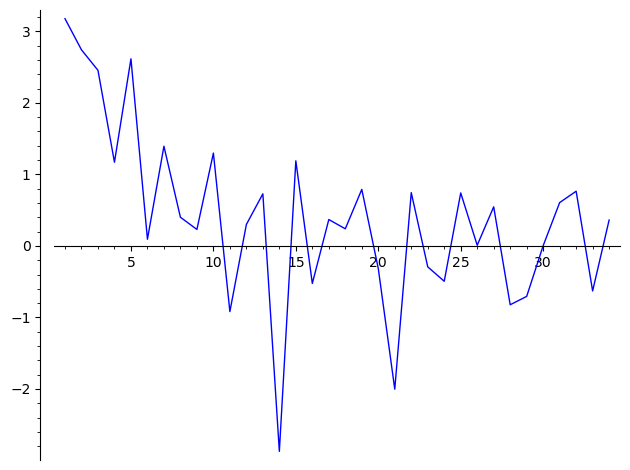

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


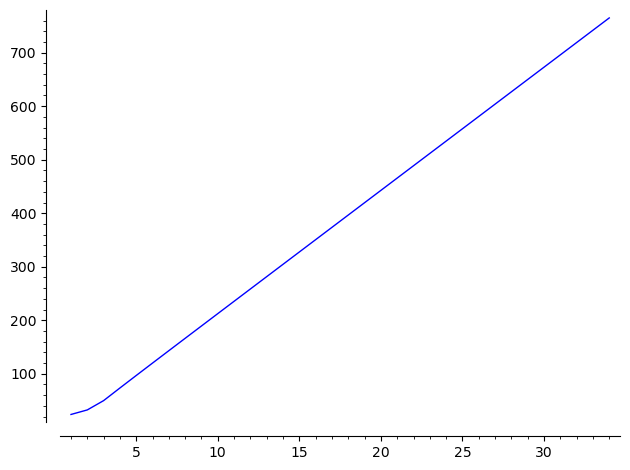

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(35, 0)
MINIMUM MODULI


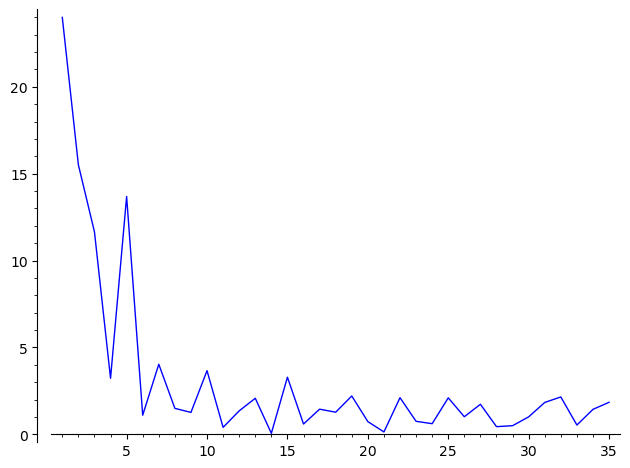

LOGS MINIMUM MODULI


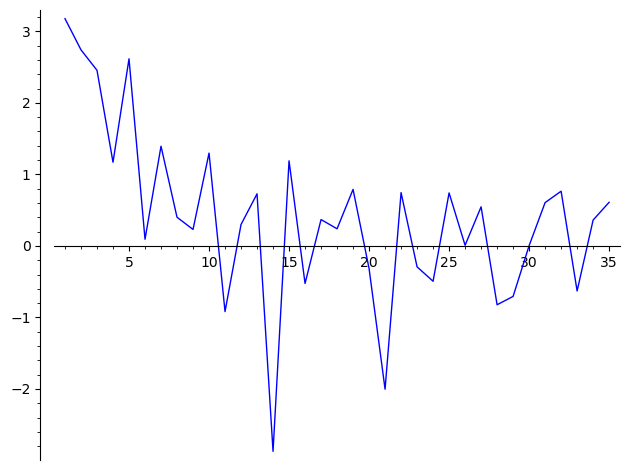

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


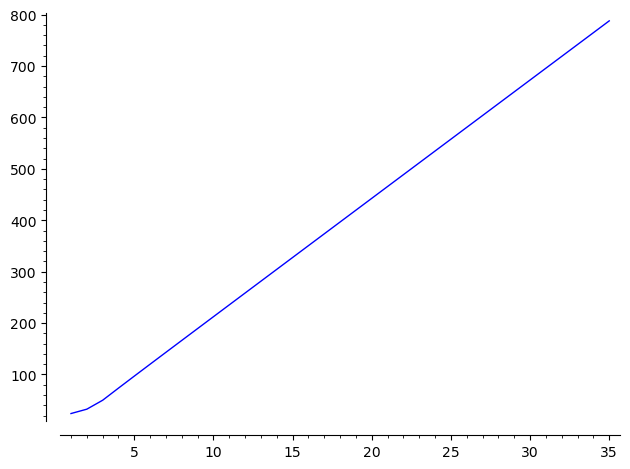

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(36, 0)
MINIMUM MODULI


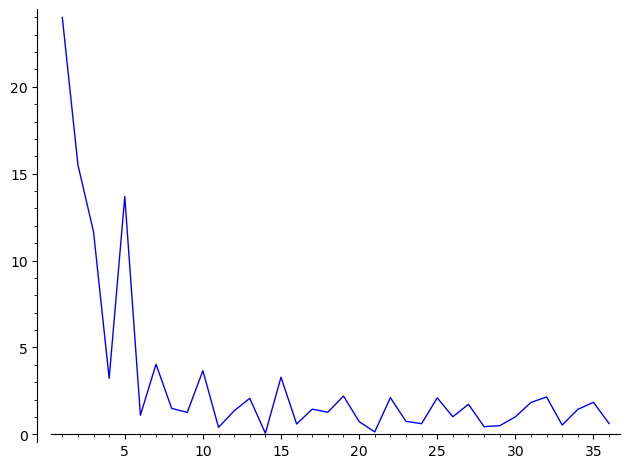

LOGS MINIMUM MODULI


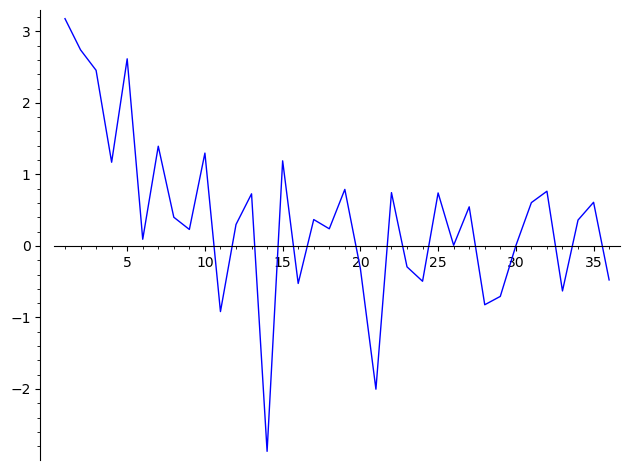

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


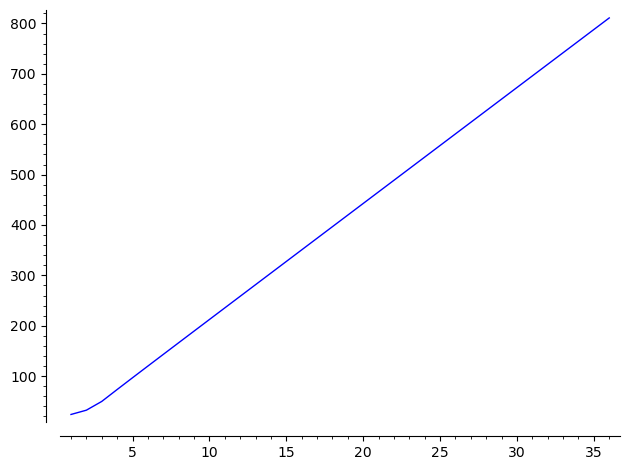

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(37, 0)
MINIMUM MODULI


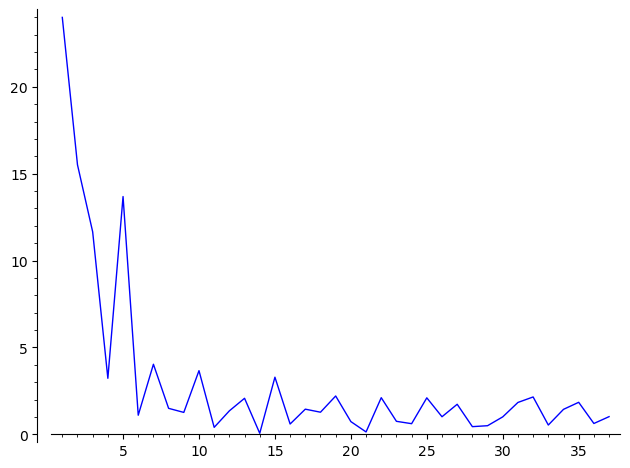

LOGS MINIMUM MODULI


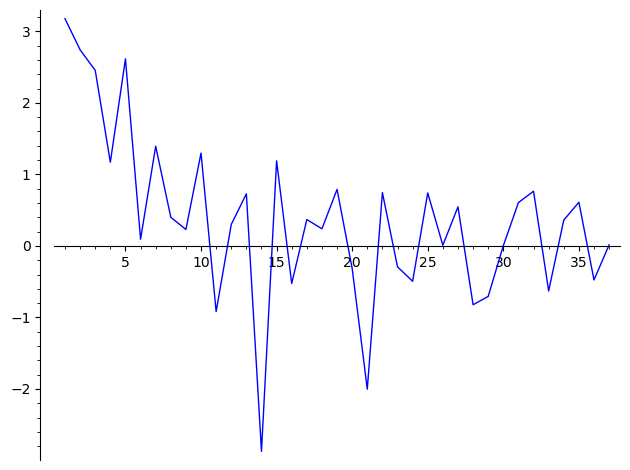

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


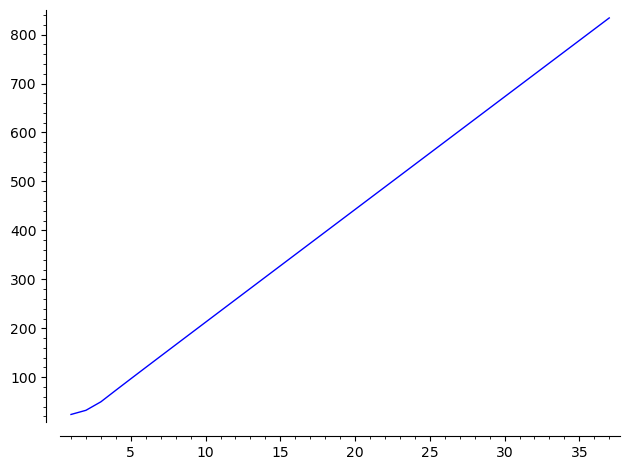

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(38, 0)
MINIMUM MODULI


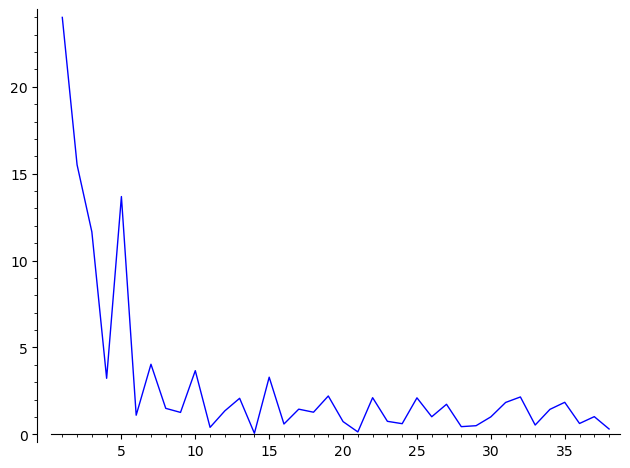

LOGS MINIMUM MODULI


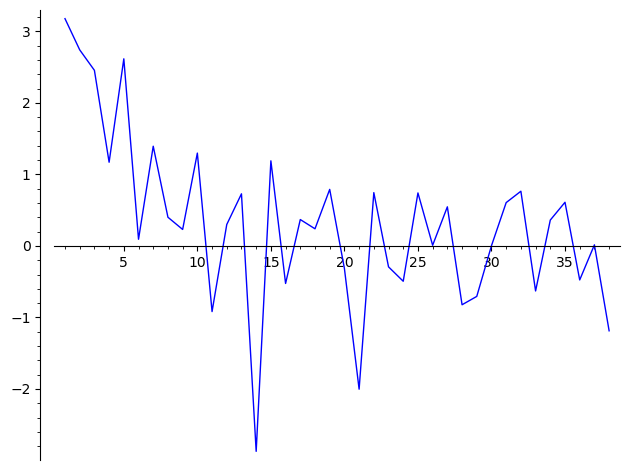

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


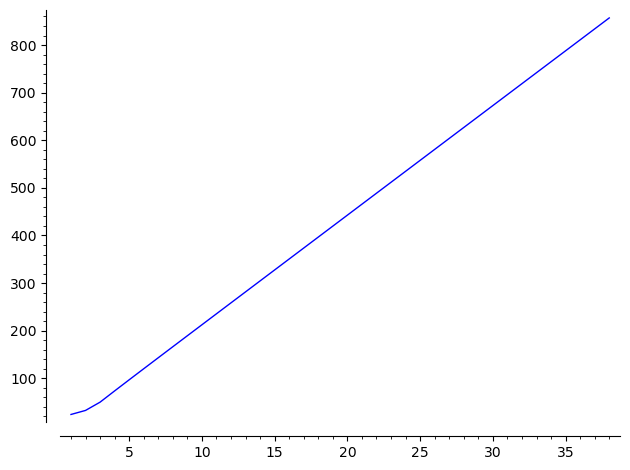

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(39, 0)
MINIMUM MODULI


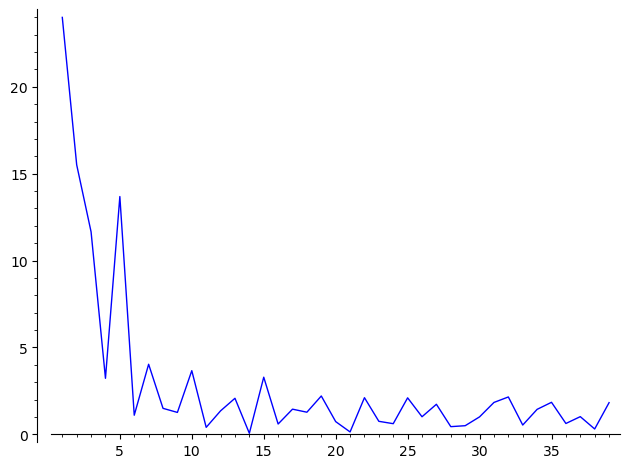

LOGS MINIMUM MODULI


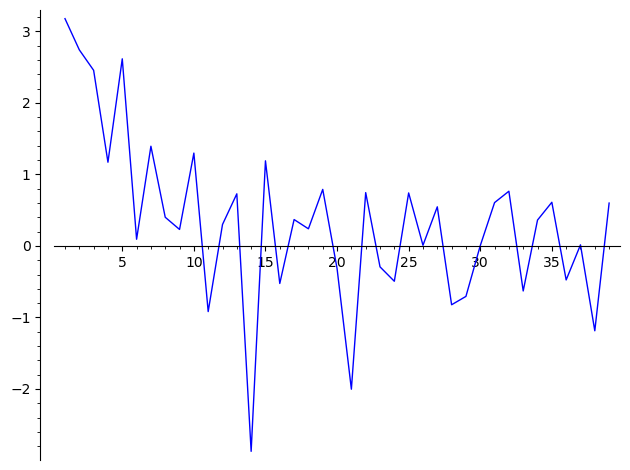

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


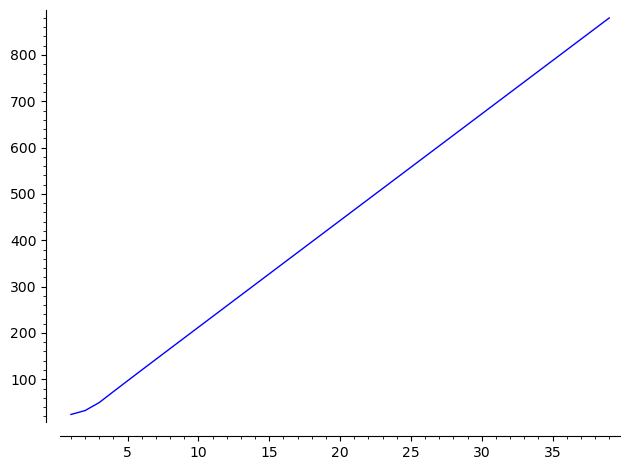

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(40, 0)
MINIMUM MODULI


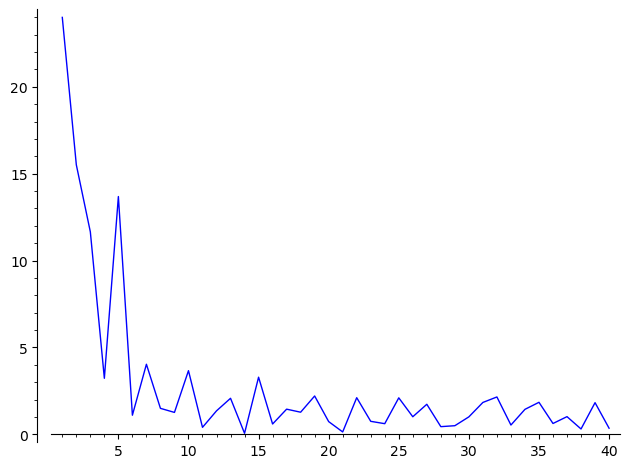

LOGS MINIMUM MODULI


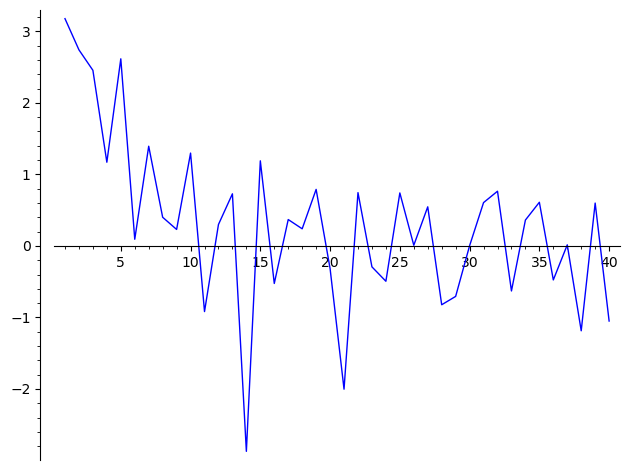

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


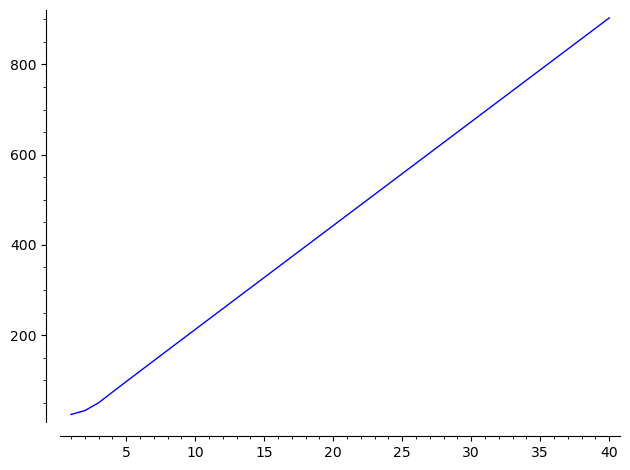

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(41, 0)
MINIMUM MODULI


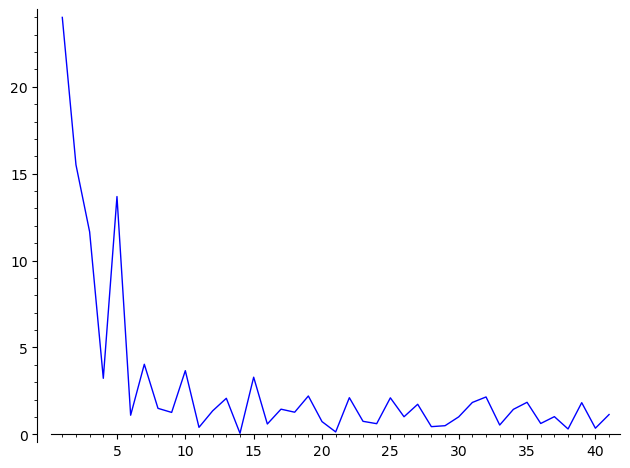

LOGS MINIMUM MODULI


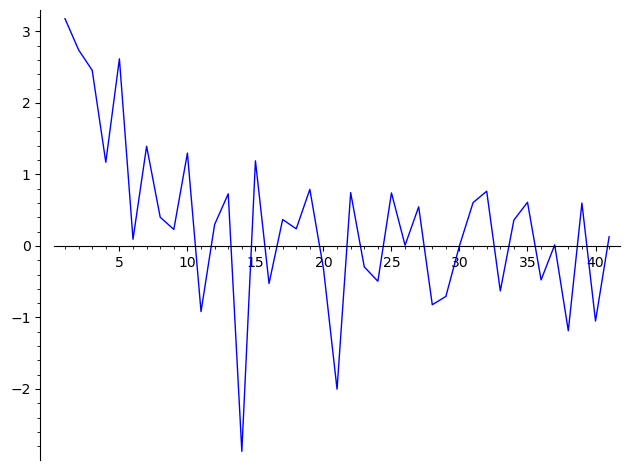

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


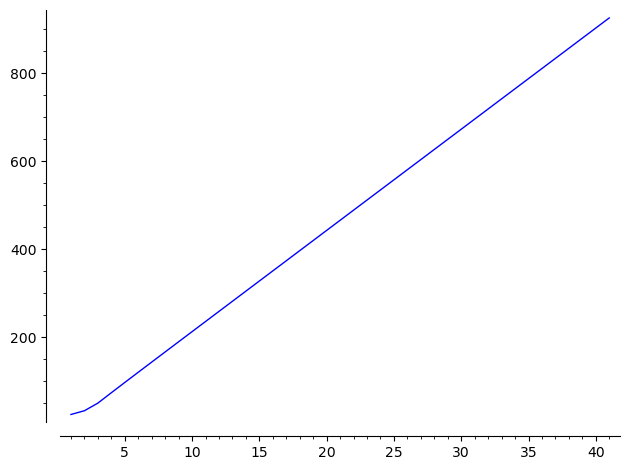

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(42, 0)
MINIMUM MODULI


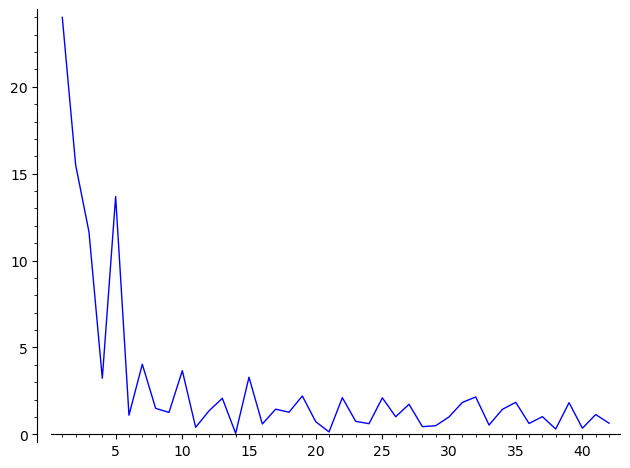

LOGS MINIMUM MODULI


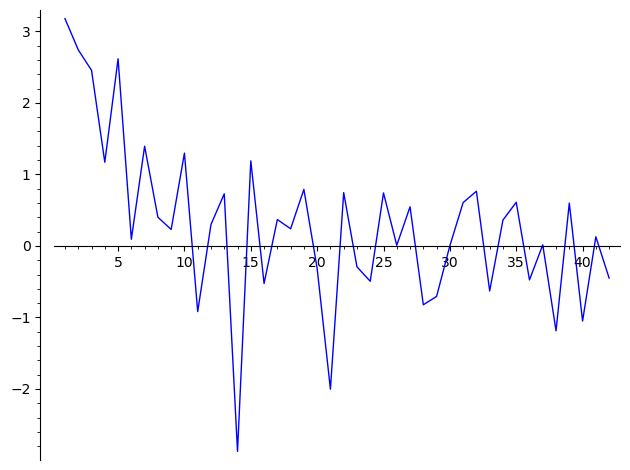

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


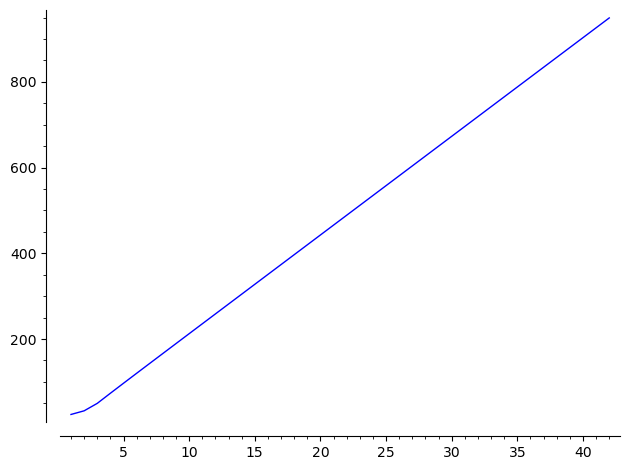

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(43, 0)
MINIMUM MODULI


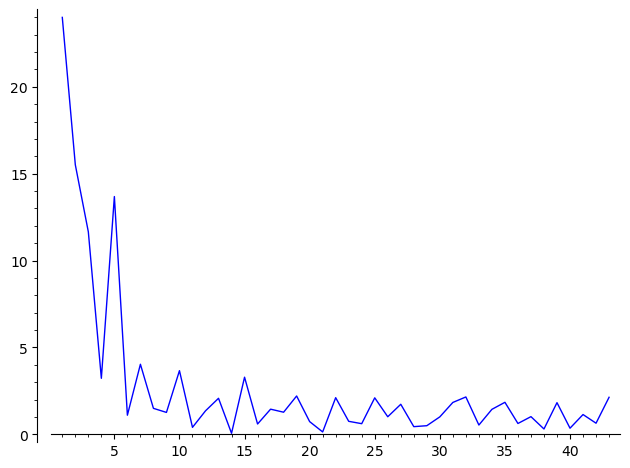

LOGS MINIMUM MODULI


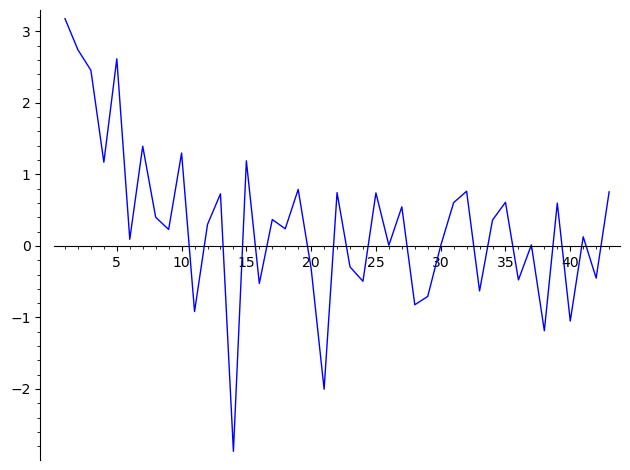

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


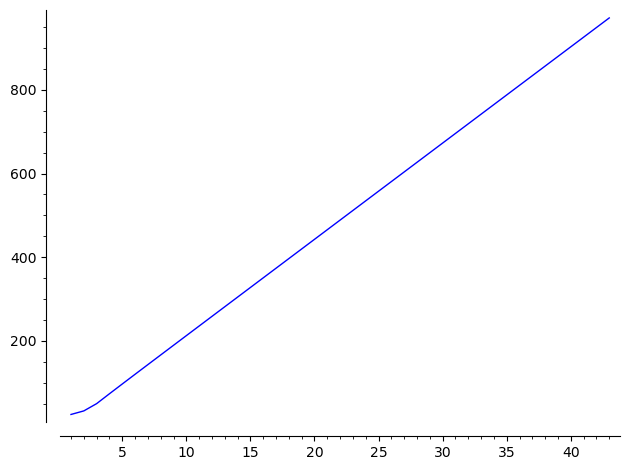

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(44, 0)
MINIMUM MODULI


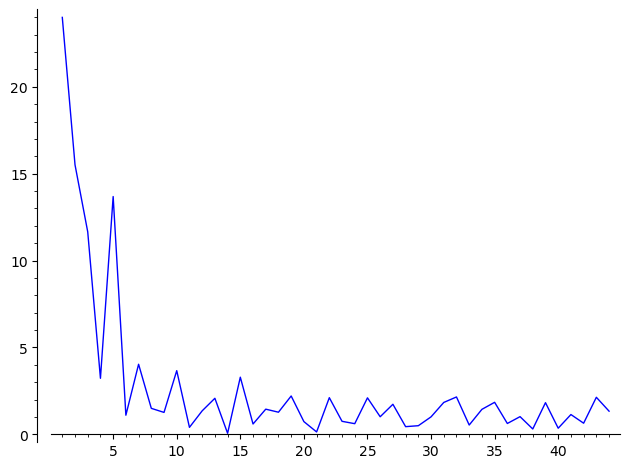

LOGS MINIMUM MODULI


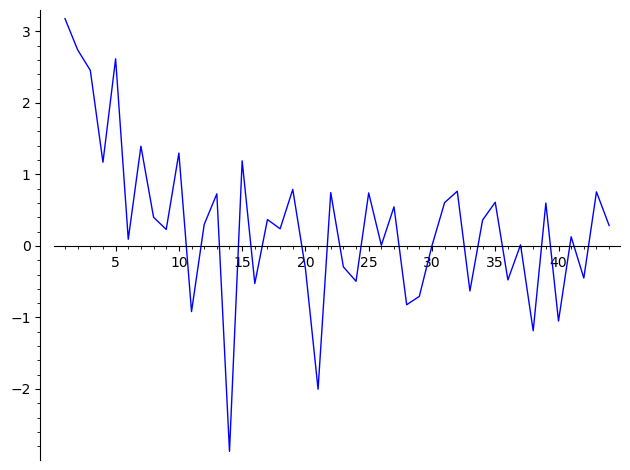

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


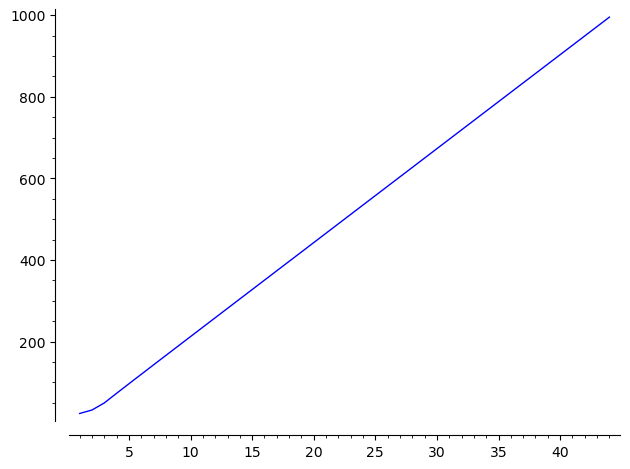

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(45, 0)
MINIMUM MODULI


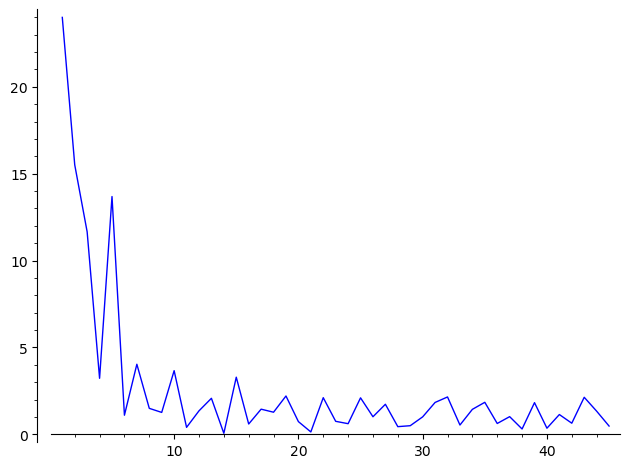

LOGS MINIMUM MODULI


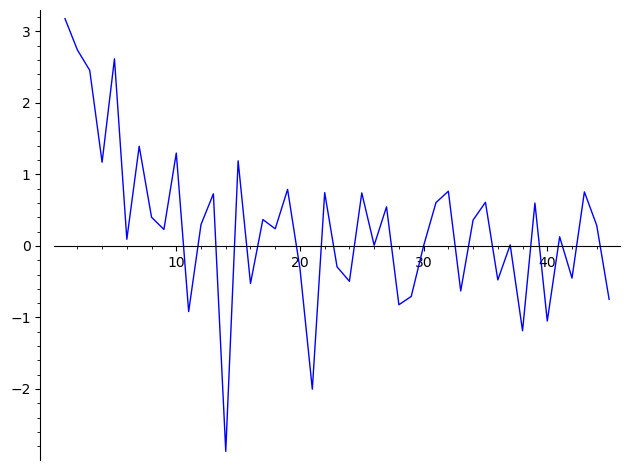

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


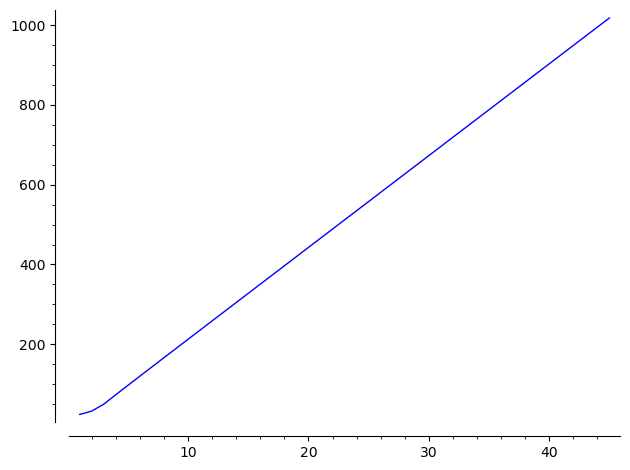

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(46, 0)
MINIMUM MODULI


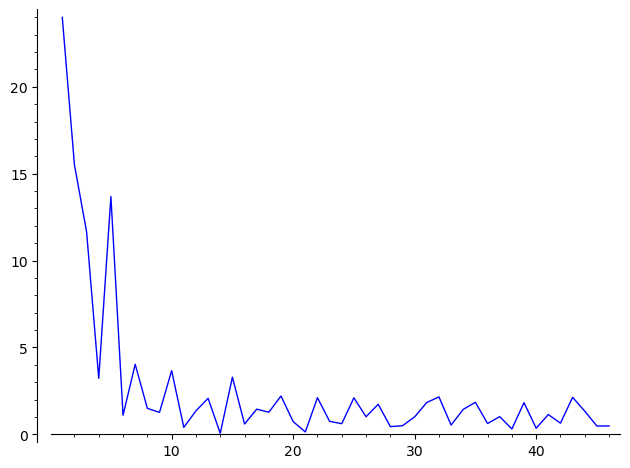

LOGS MINIMUM MODULI


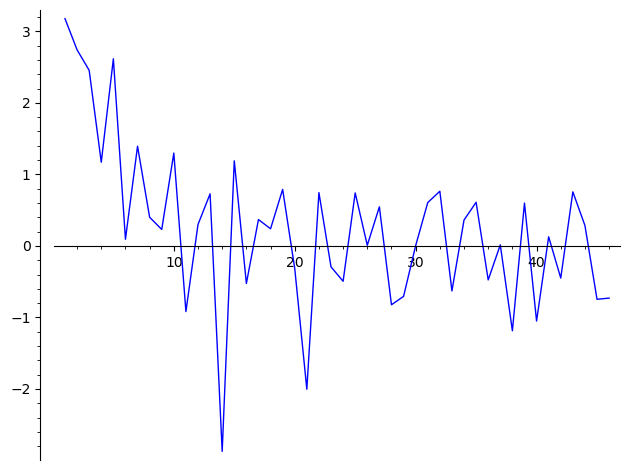

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


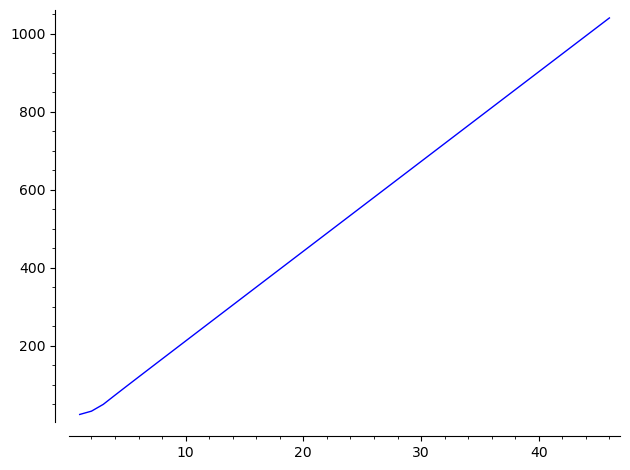

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(47, 0)
MINIMUM MODULI


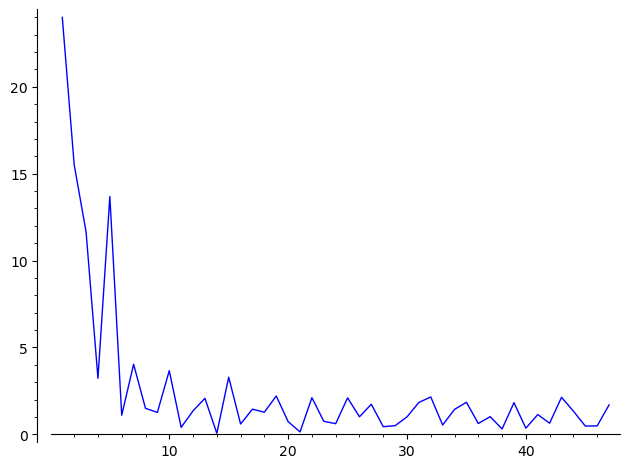

LOGS MINIMUM MODULI


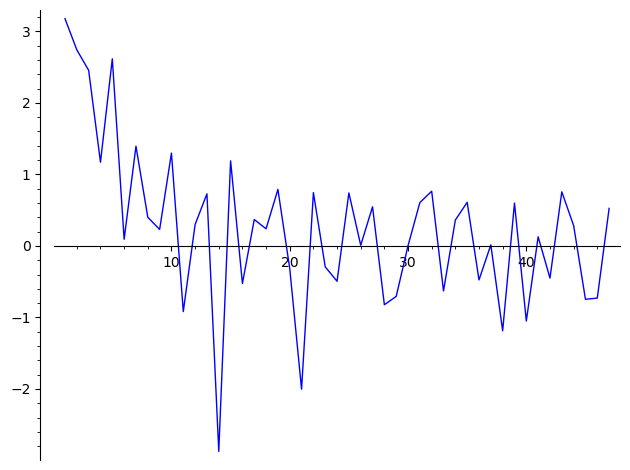

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


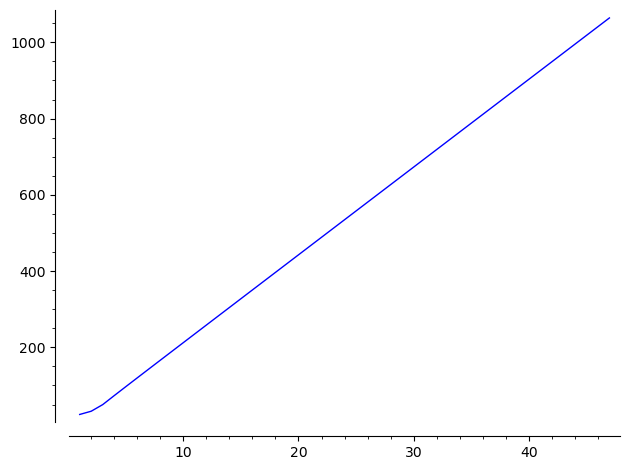

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(48, 0)
MINIMUM MODULI


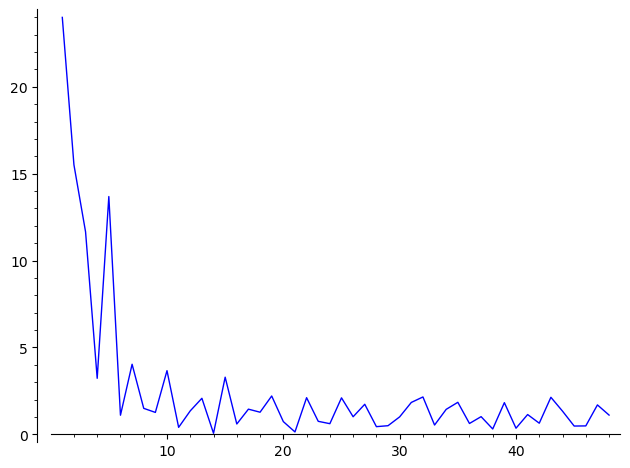

LOGS MINIMUM MODULI


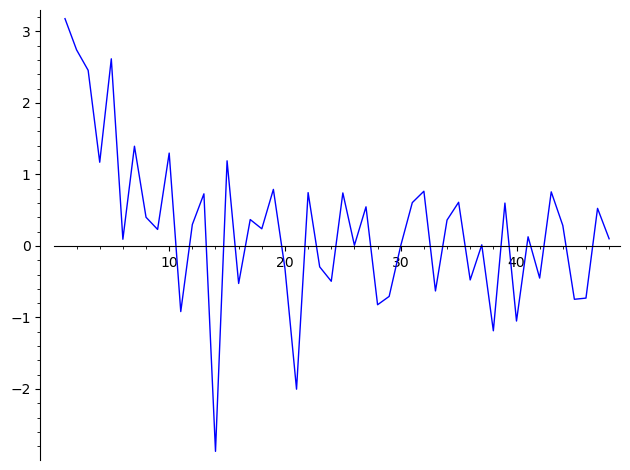

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


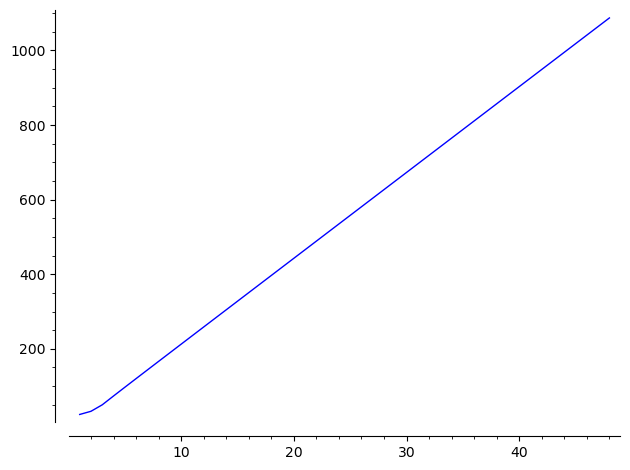

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(49, 0)
MINIMUM MODULI


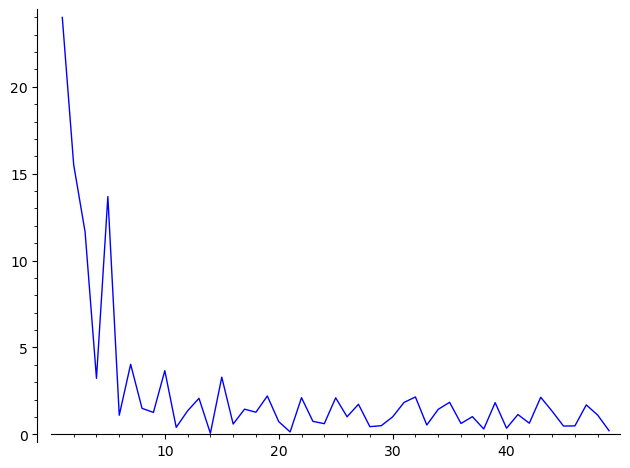

LOGS MINIMUM MODULI


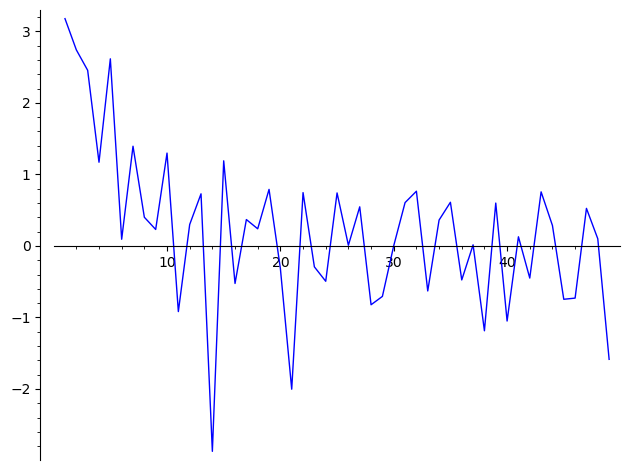

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


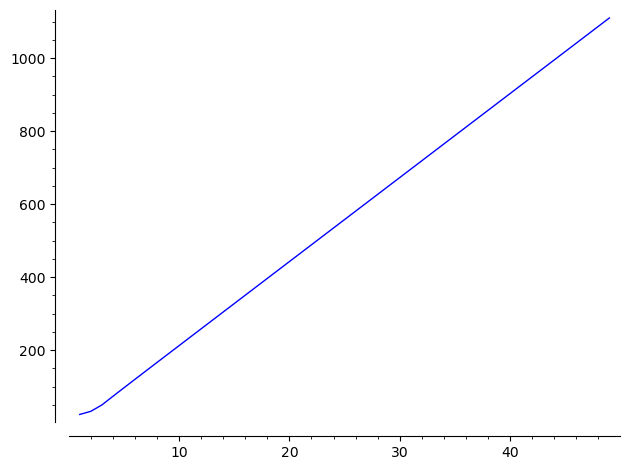

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(50, 0)
MINIMUM MODULI


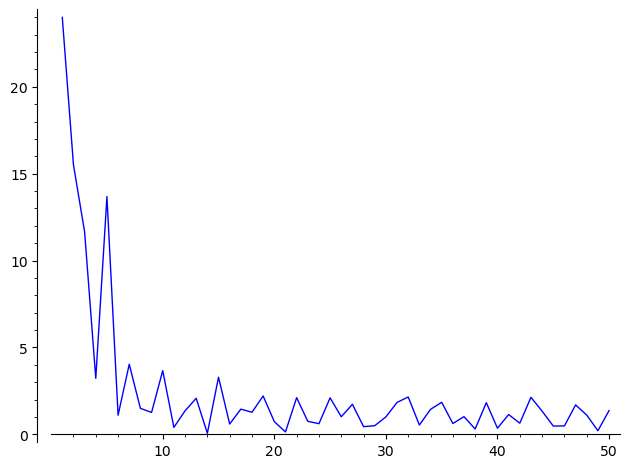

LOGS MINIMUM MODULI


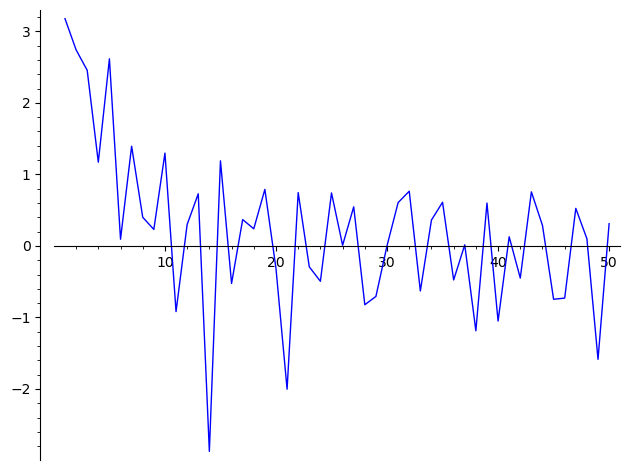

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


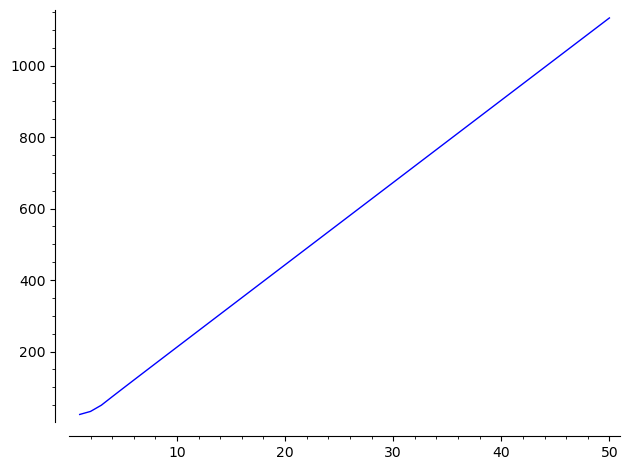

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(51, 0)
MINIMUM MODULI


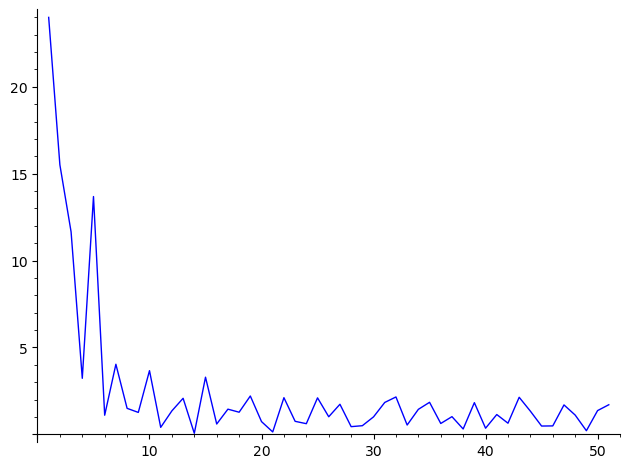

LOGS MINIMUM MODULI


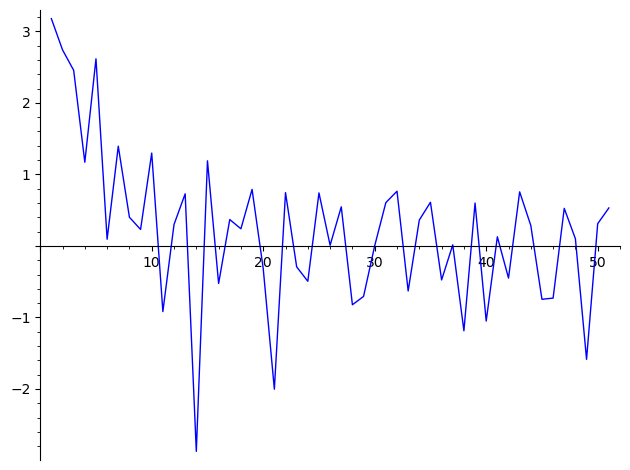

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


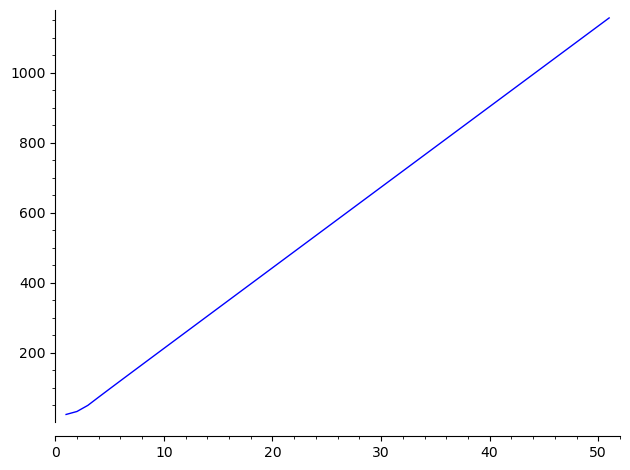

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(52, 0)
MINIMUM MODULI


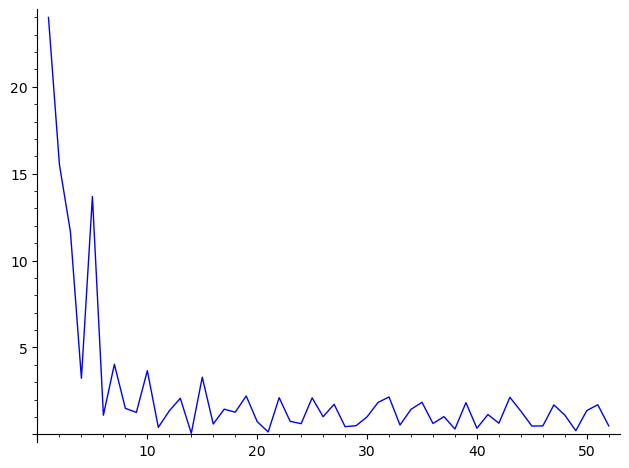

LOGS MINIMUM MODULI


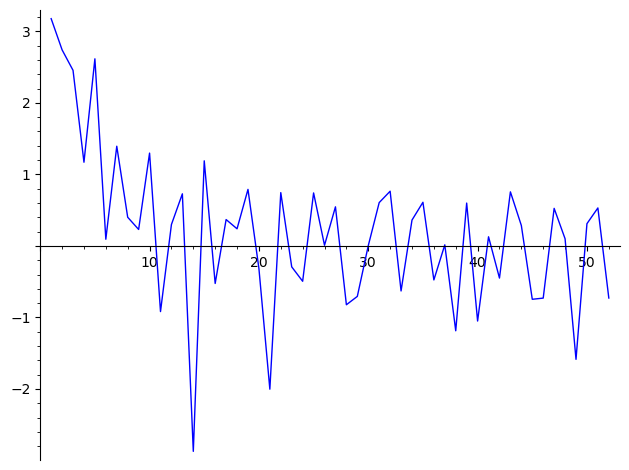

minimum logarithm of minimum modulus: -2.8729636161602637728115576480
MAXIMUM MODULI


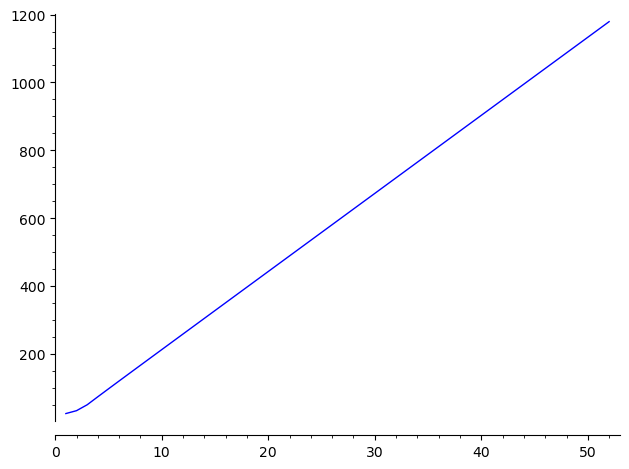

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(53, 0)
MINIMUM MODULI


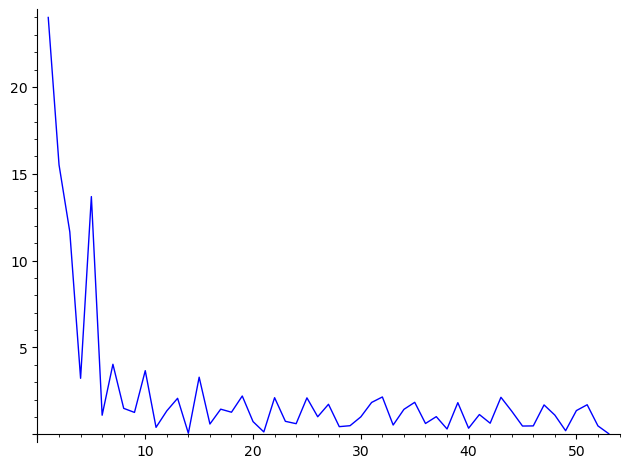

LOGS MINIMUM MODULI


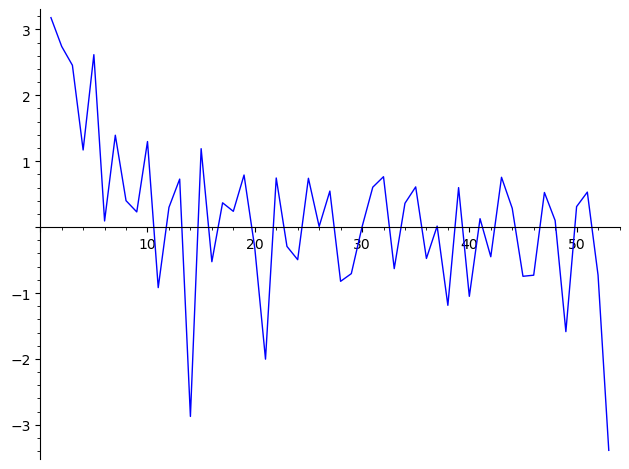

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


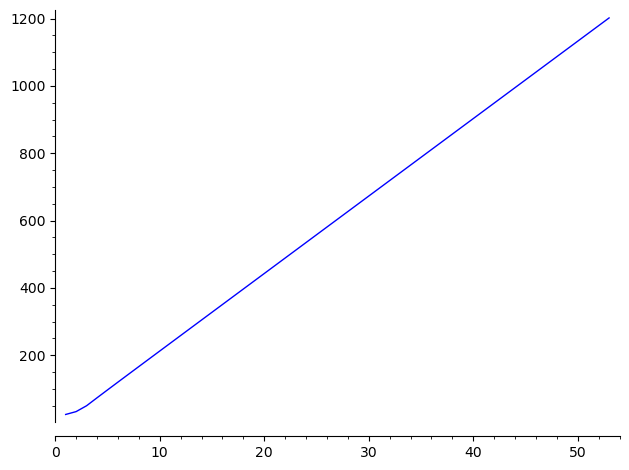

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(54, 0)
MINIMUM MODULI


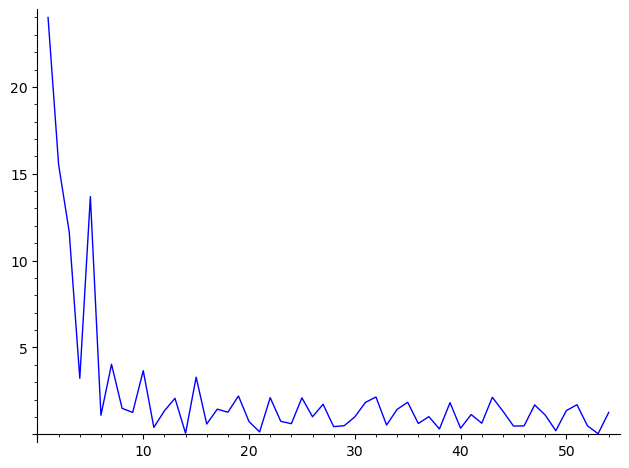

LOGS MINIMUM MODULI


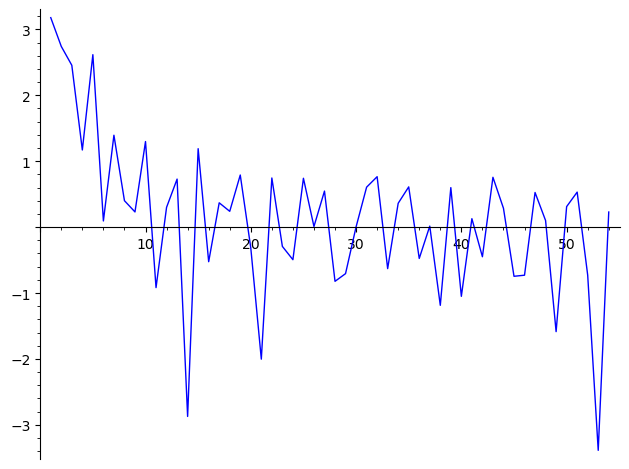

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


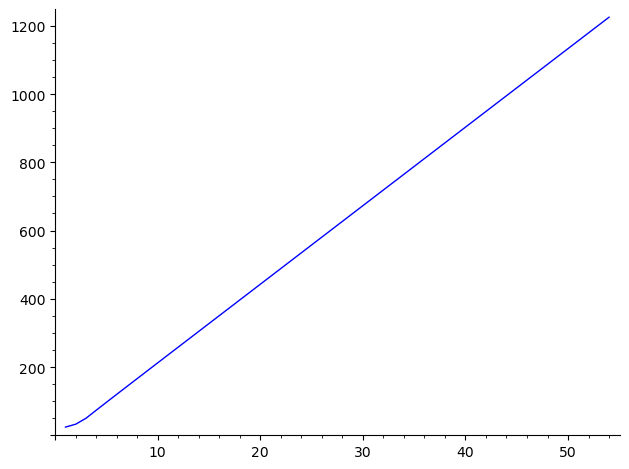

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(55, 0)
MINIMUM MODULI


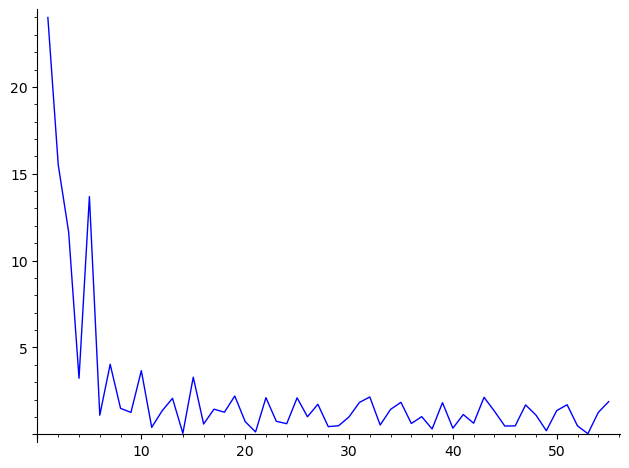

LOGS MINIMUM MODULI


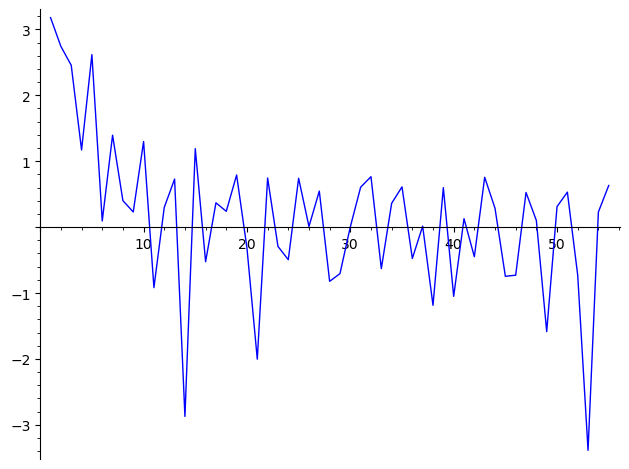

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


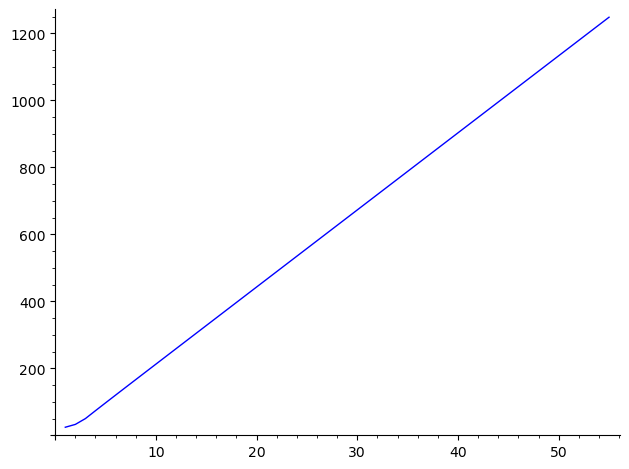

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(56, 0)
MINIMUM MODULI


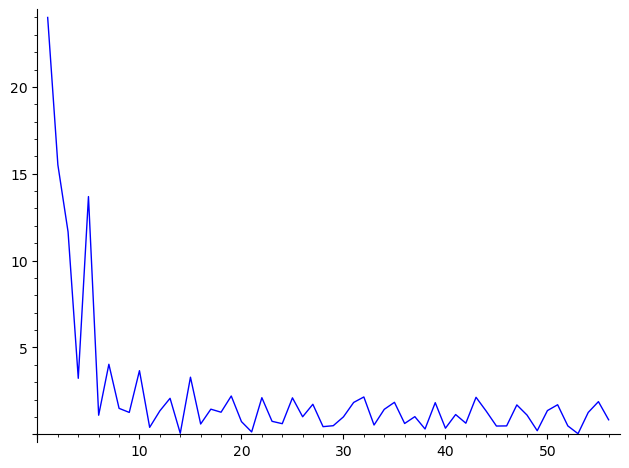

LOGS MINIMUM MODULI


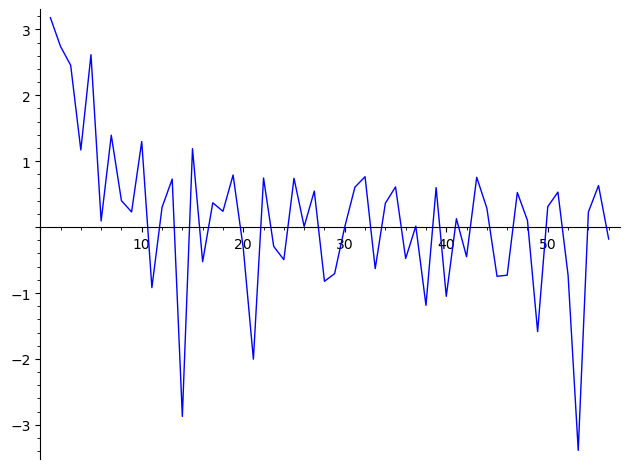

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


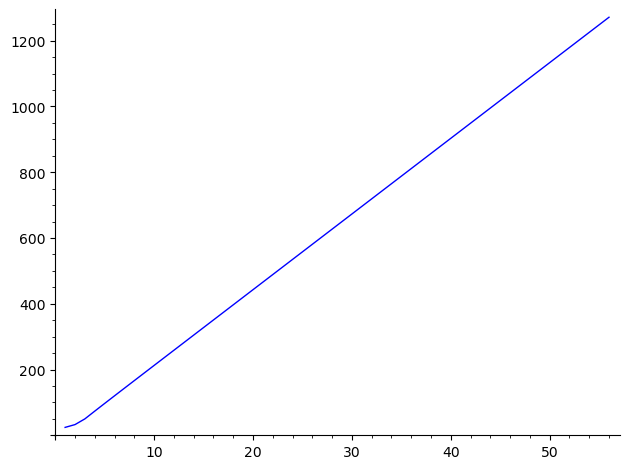

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(57, 0)
MINIMUM MODULI


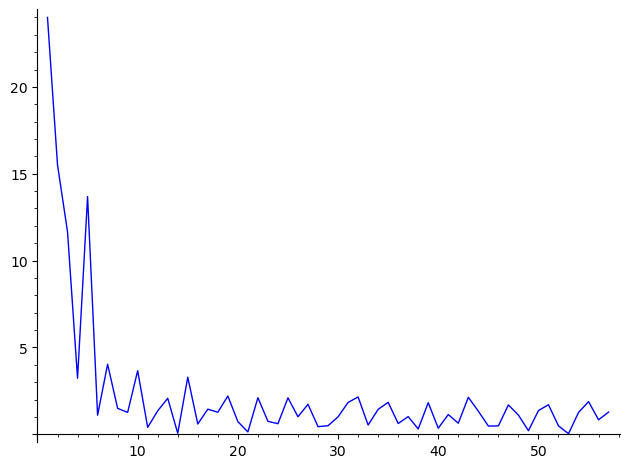

LOGS MINIMUM MODULI


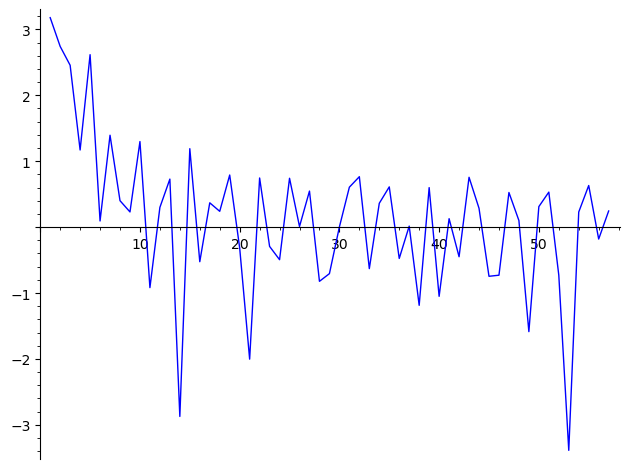

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


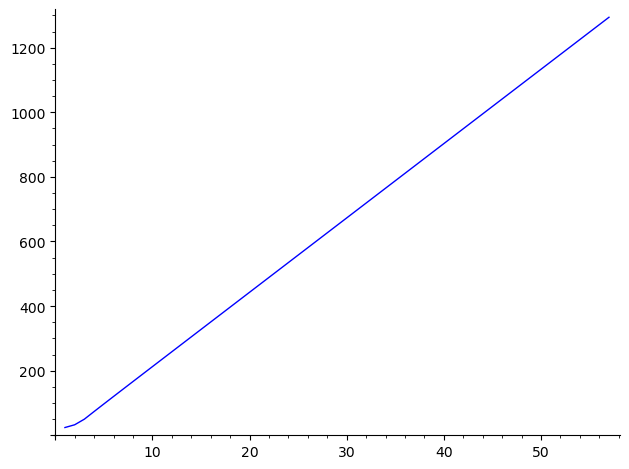

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(58, 0)
MINIMUM MODULI


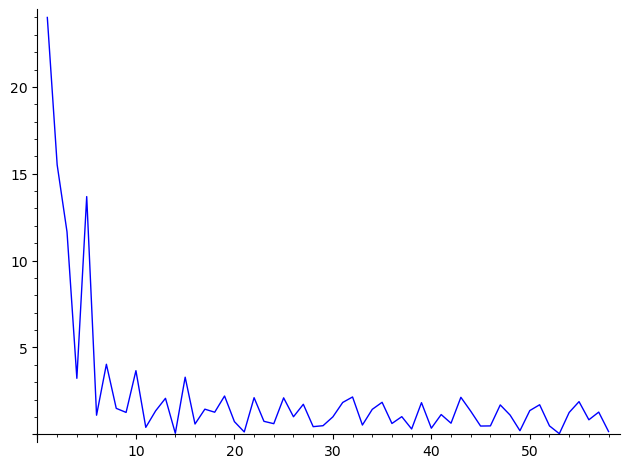

LOGS MINIMUM MODULI


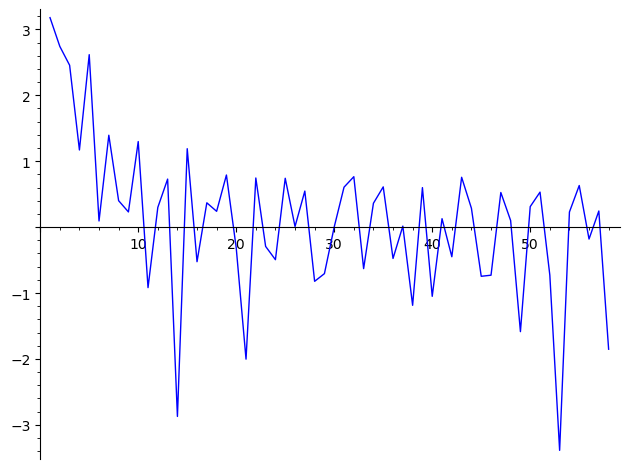

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


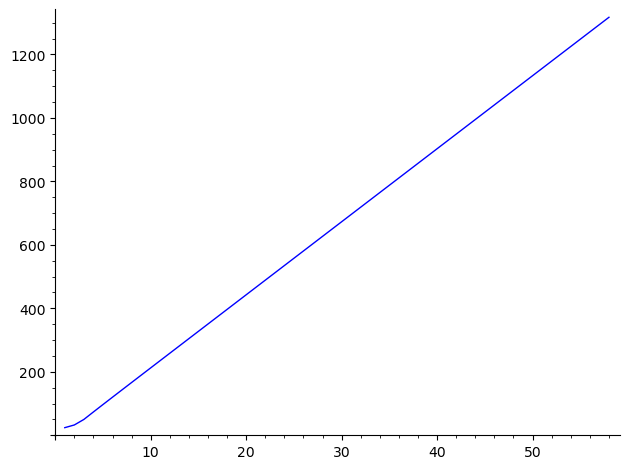

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(59, 0)
MINIMUM MODULI


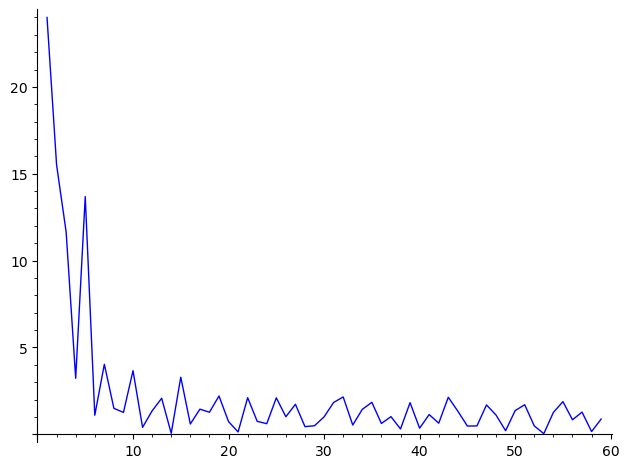

LOGS MINIMUM MODULI


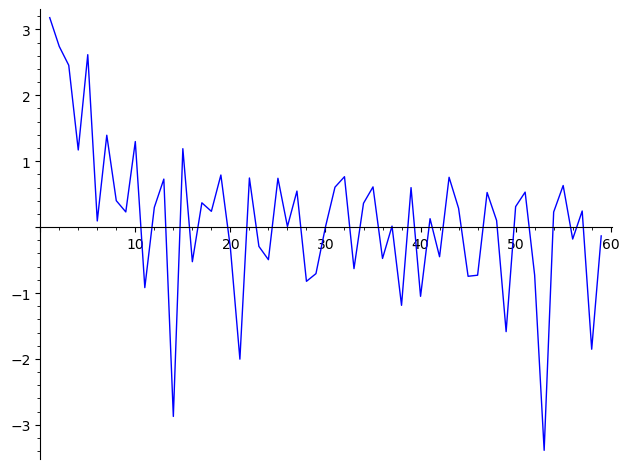

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


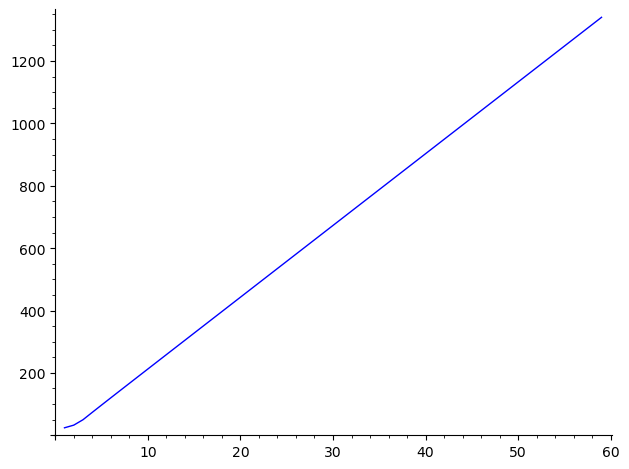

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(60, 0)
MINIMUM MODULI


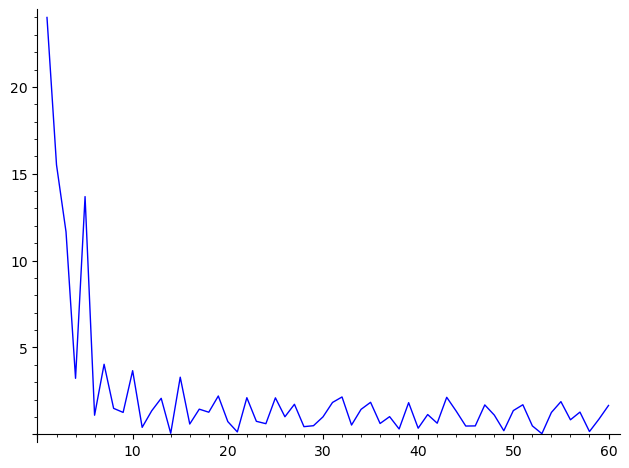

LOGS MINIMUM MODULI


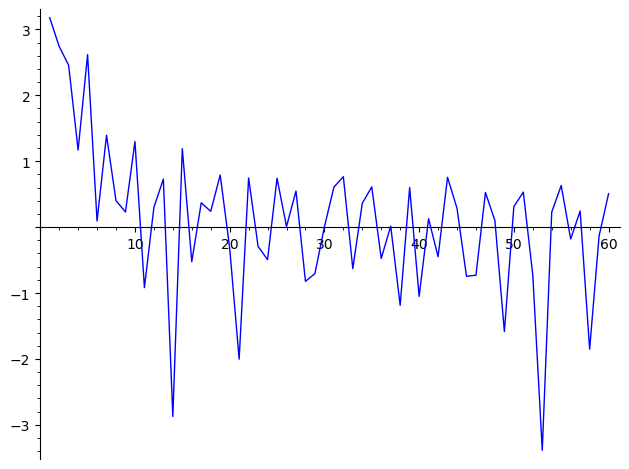

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


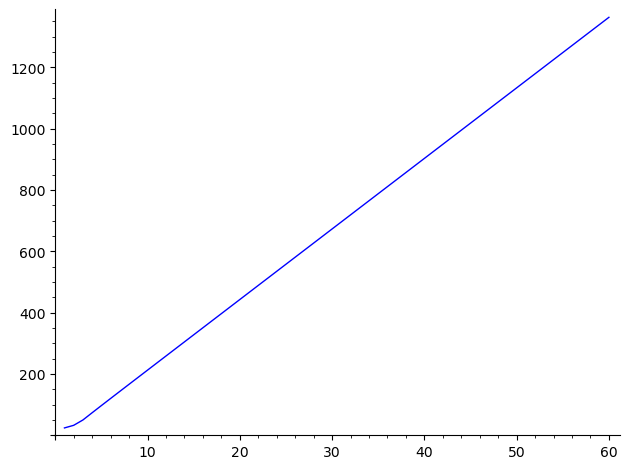

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(61, 0)
MINIMUM MODULI


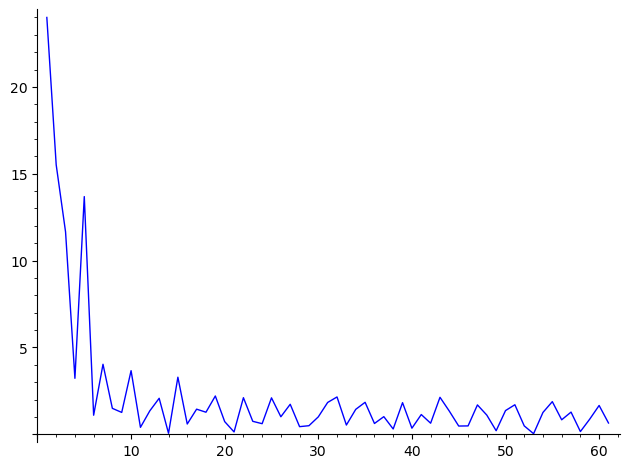

LOGS MINIMUM MODULI


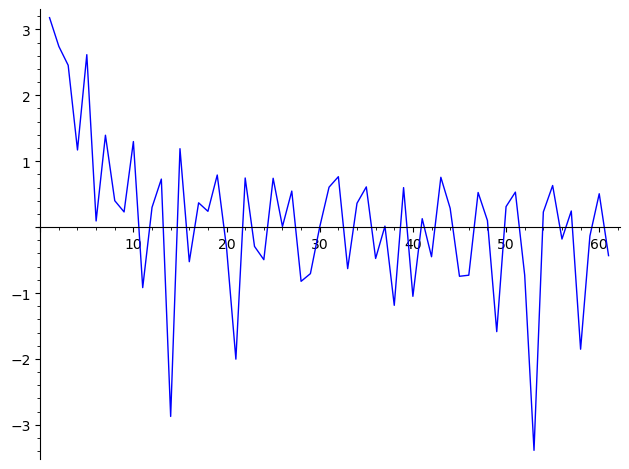

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


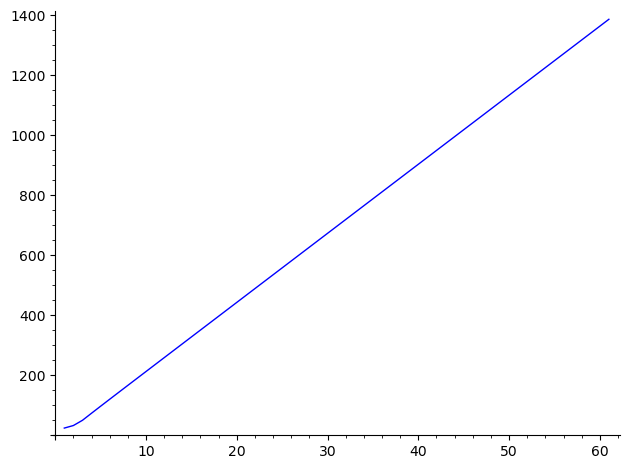

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(62, 0)
MINIMUM MODULI


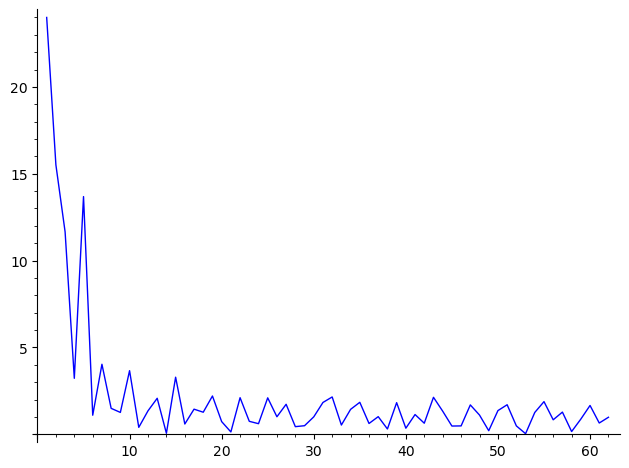

LOGS MINIMUM MODULI


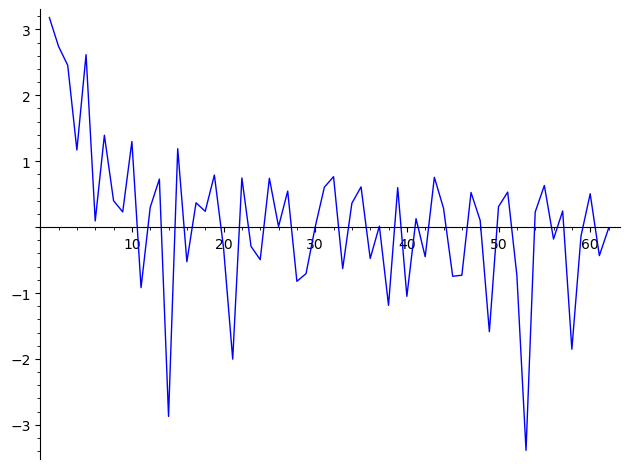

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


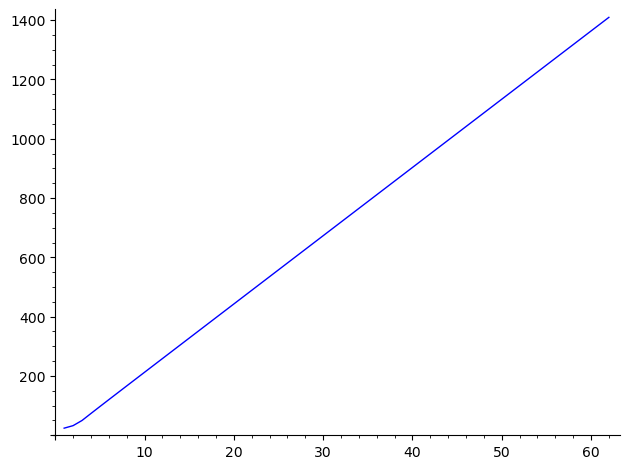

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(63, 0)
MINIMUM MODULI


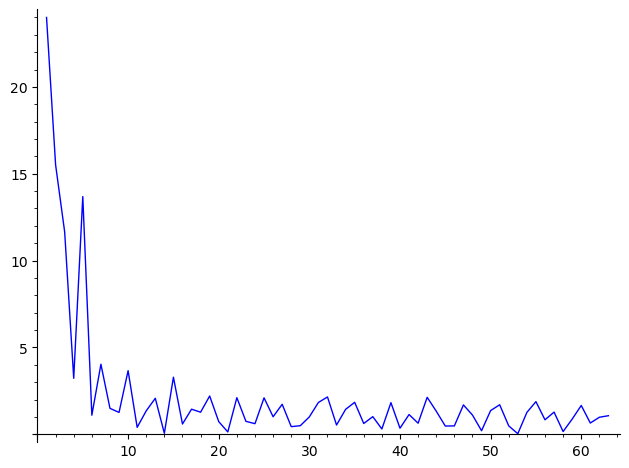

LOGS MINIMUM MODULI


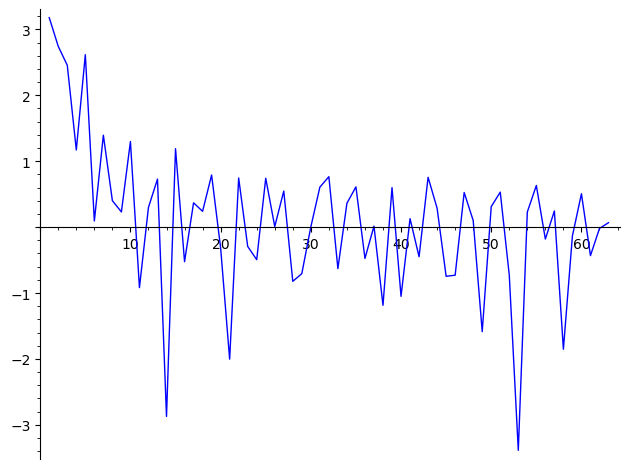

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


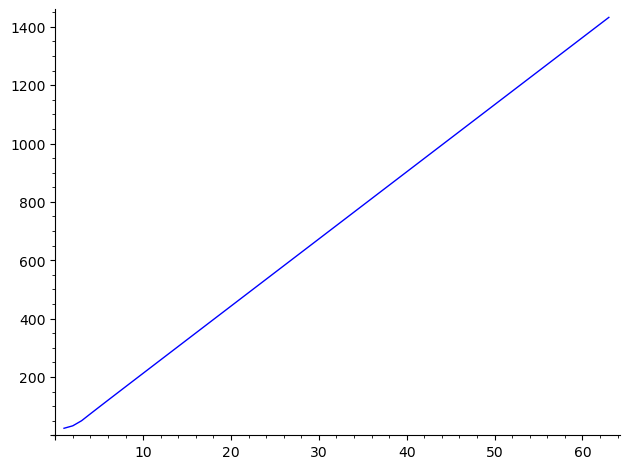

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(64, 0)
MINIMUM MODULI


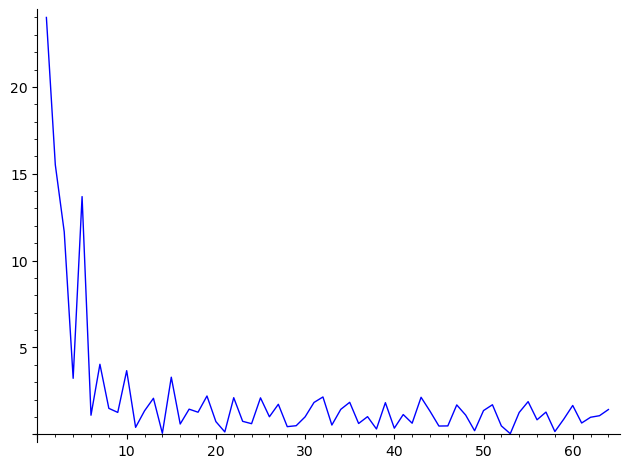

LOGS MINIMUM MODULI


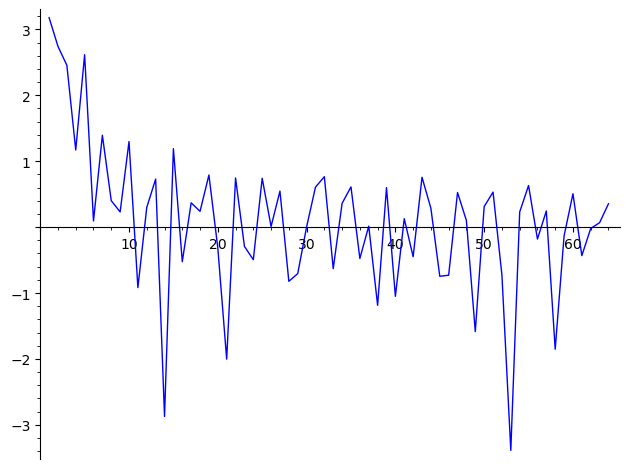

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


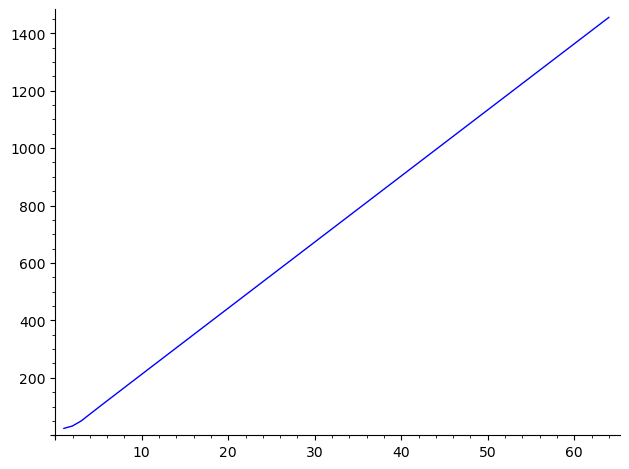

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(65, 0)
MINIMUM MODULI


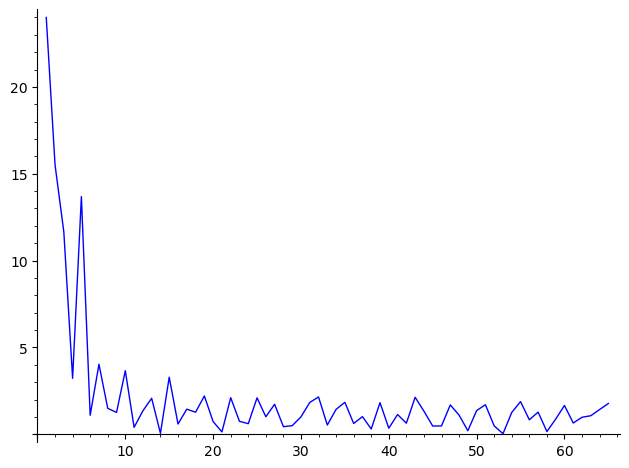

LOGS MINIMUM MODULI


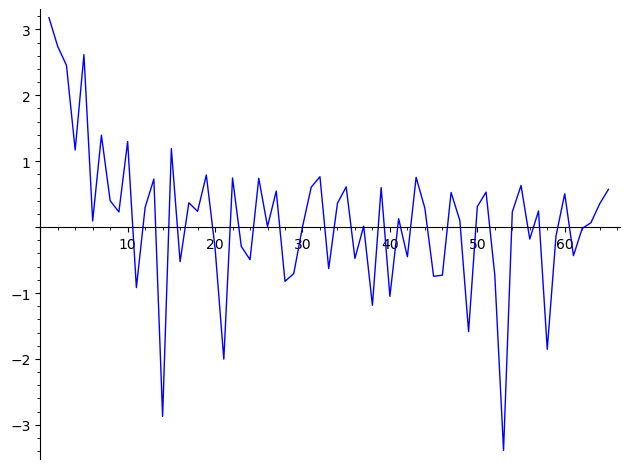

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


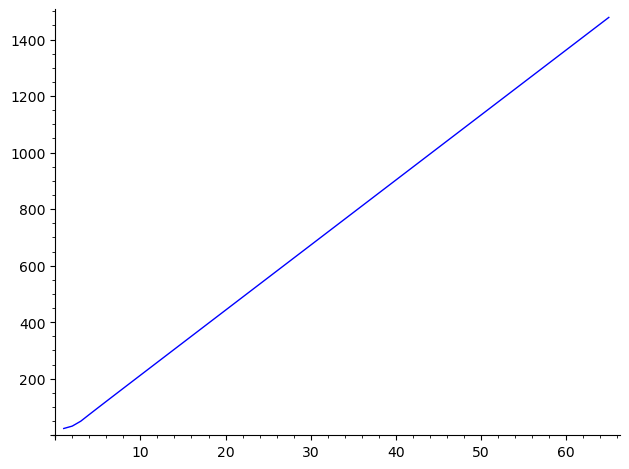

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(66, 0)
MINIMUM MODULI


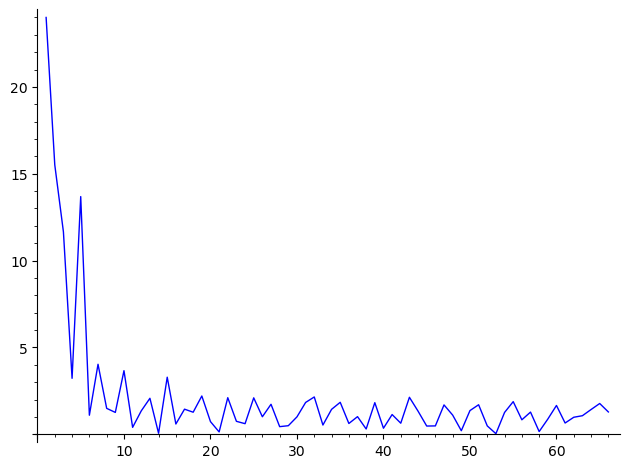

LOGS MINIMUM MODULI


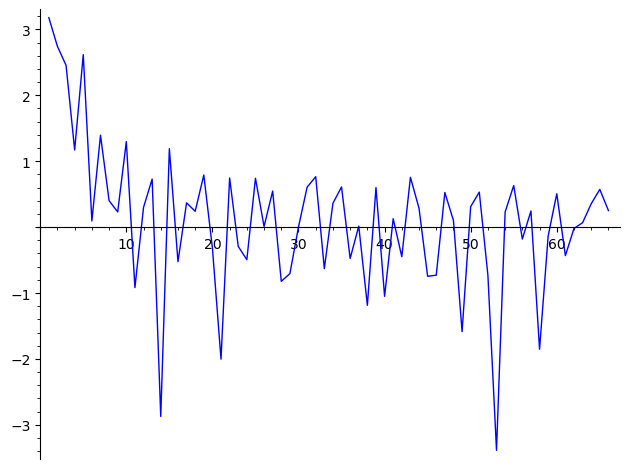

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


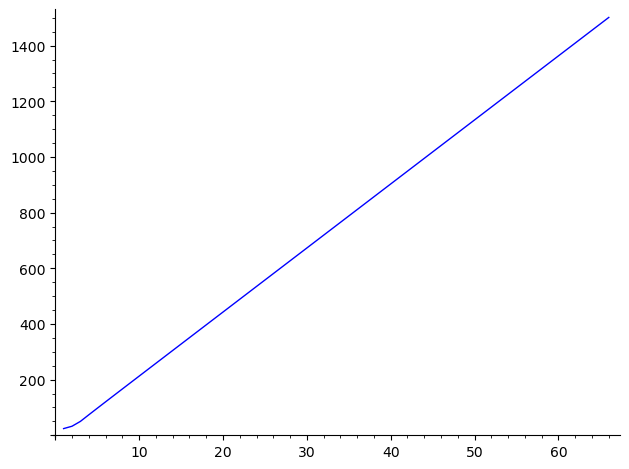

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(67, 0)
MINIMUM MODULI


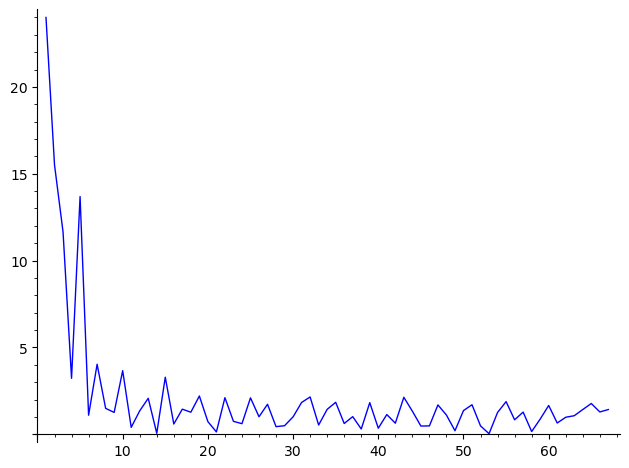

LOGS MINIMUM MODULI


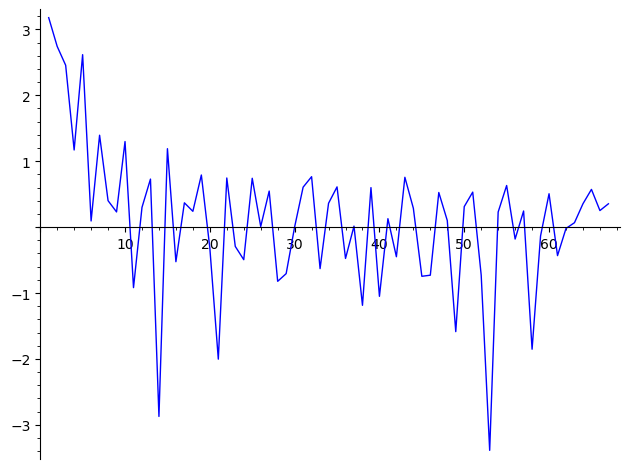

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


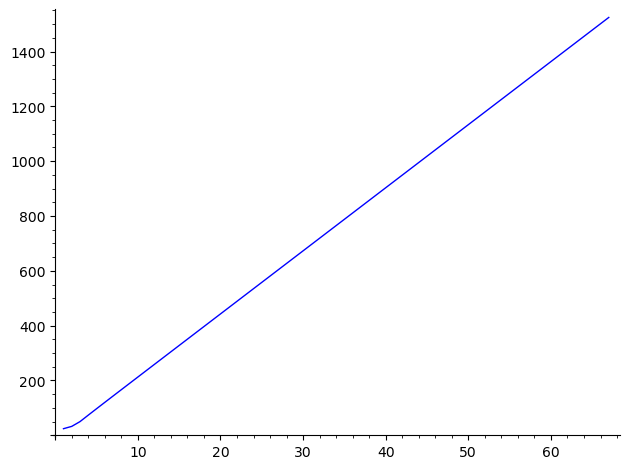

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(68, 0)
MINIMUM MODULI


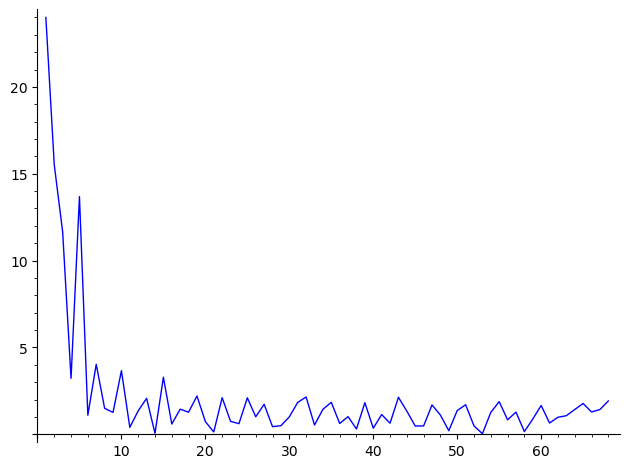

LOGS MINIMUM MODULI


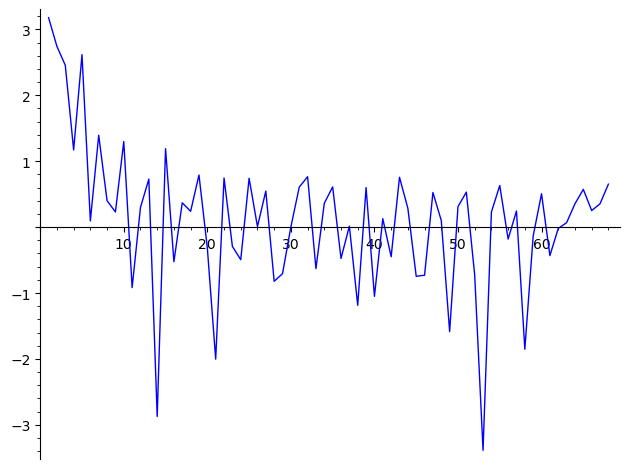

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


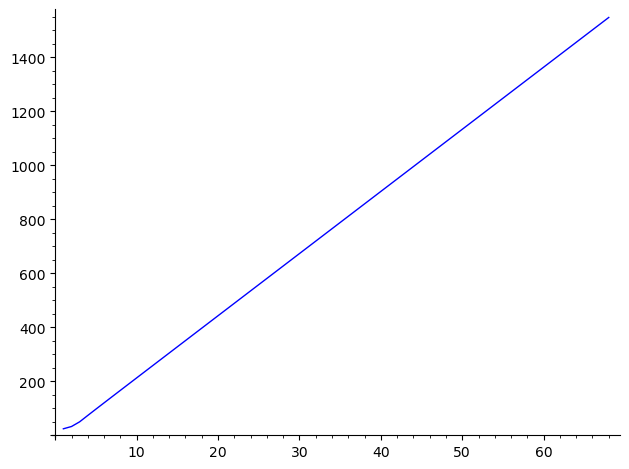

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(69, 0)
MINIMUM MODULI


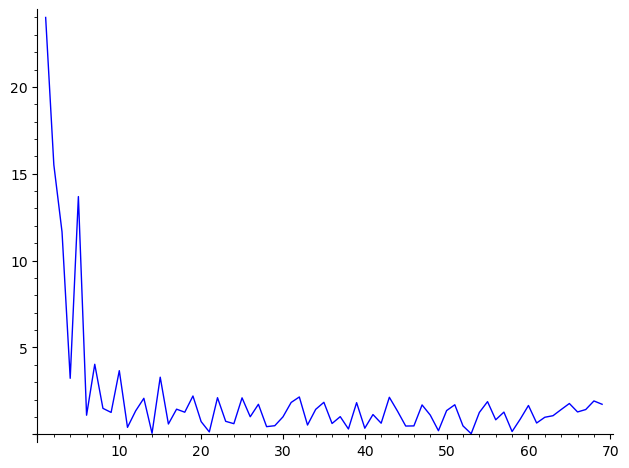

LOGS MINIMUM MODULI


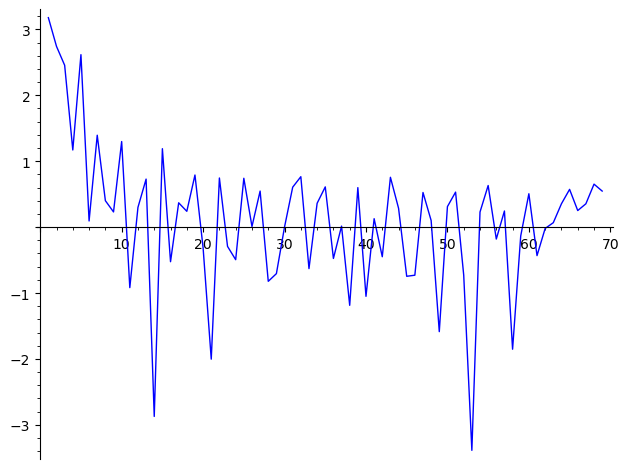

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


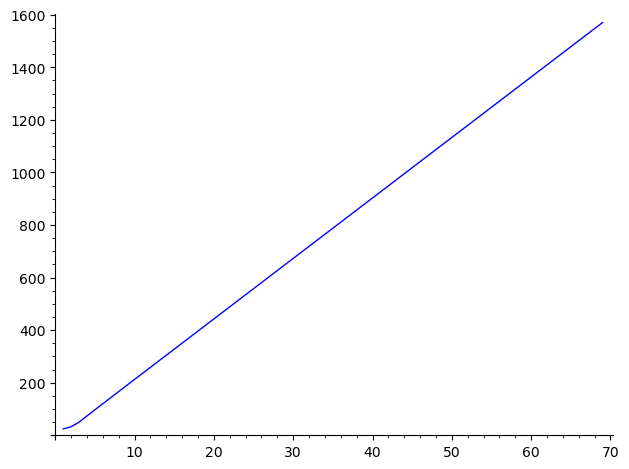

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(70, 0)
MINIMUM MODULI


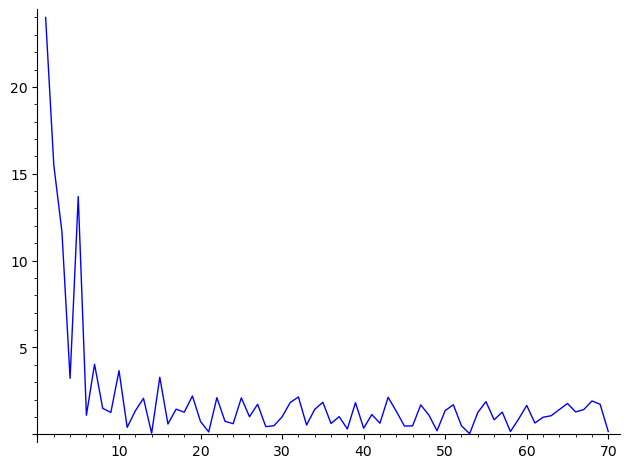

LOGS MINIMUM MODULI


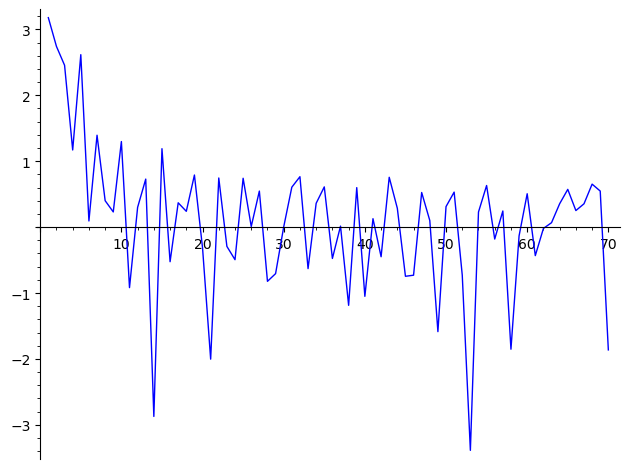

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


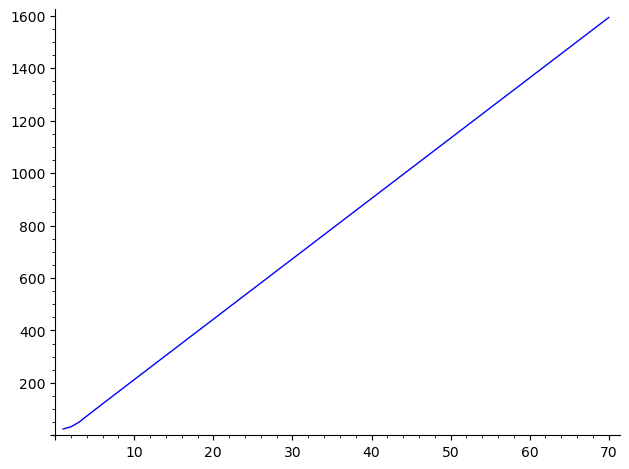

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(71, 0)
MINIMUM MODULI


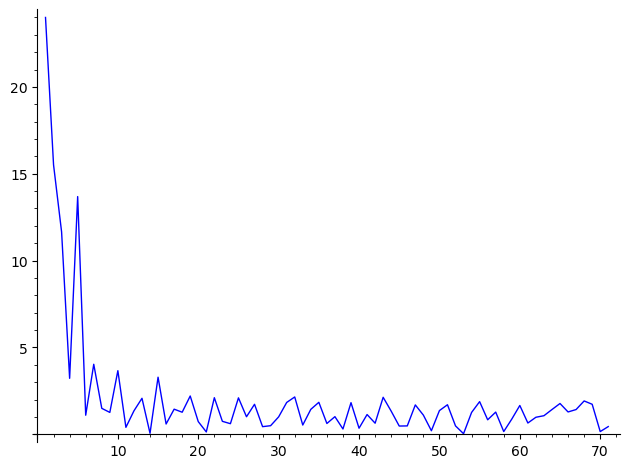

LOGS MINIMUM MODULI


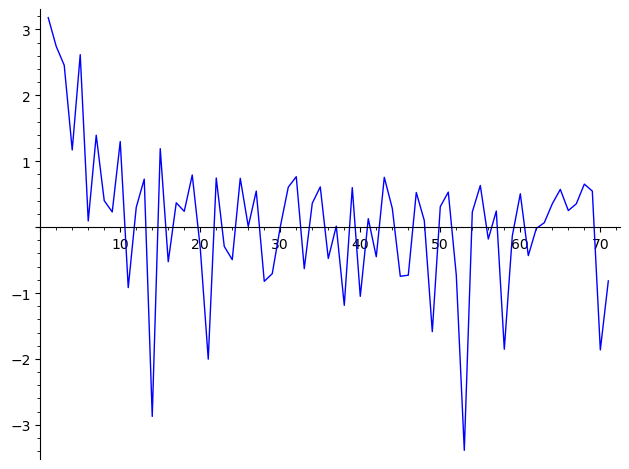

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


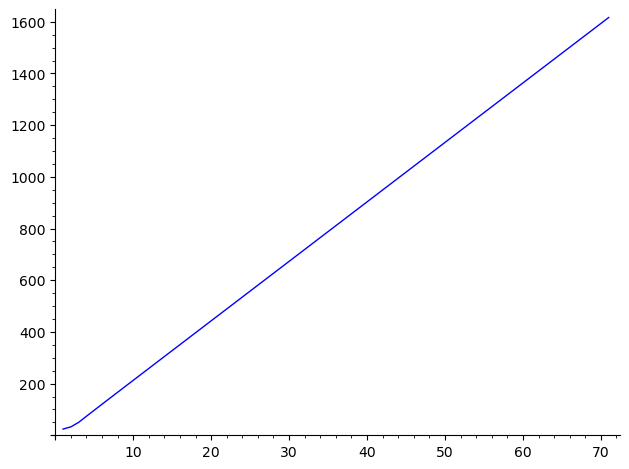

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(72, 0)
MINIMUM MODULI


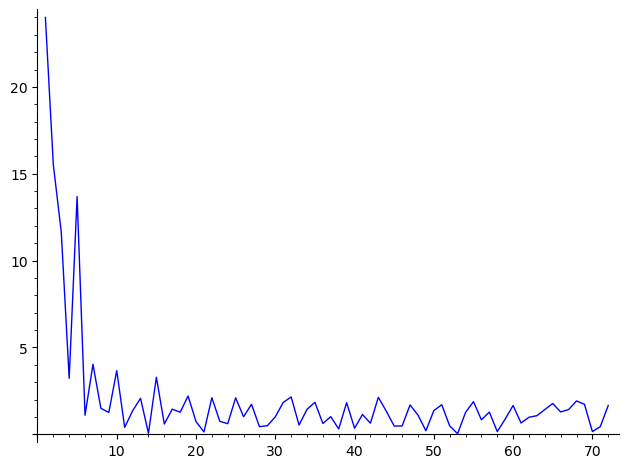

LOGS MINIMUM MODULI


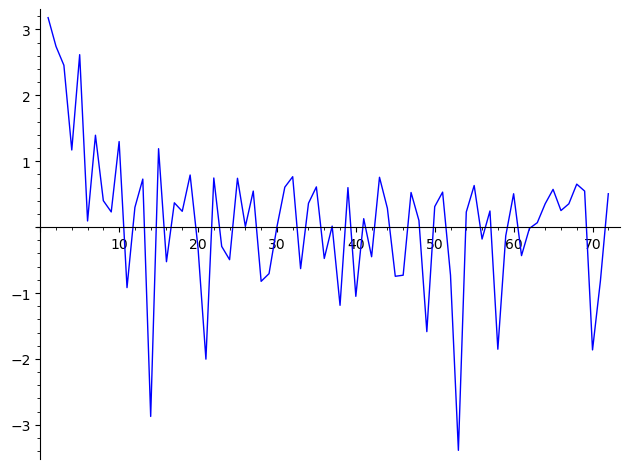

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


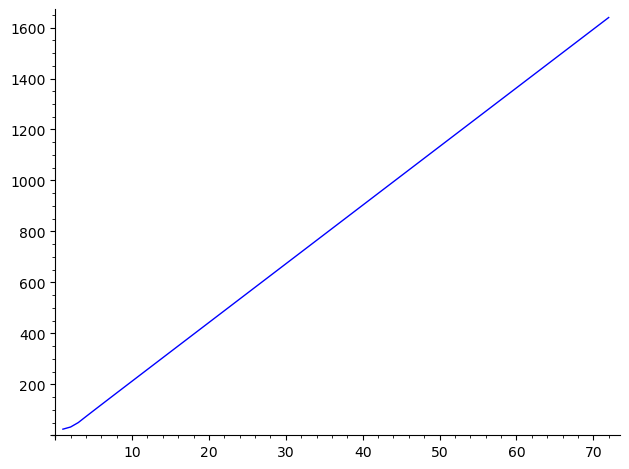

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(73, 0)
MINIMUM MODULI


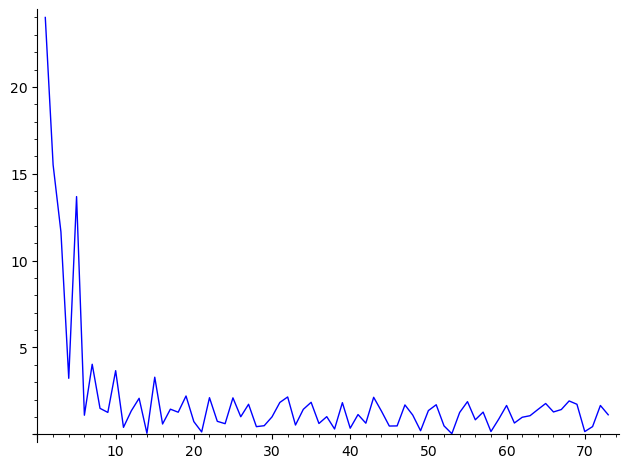

LOGS MINIMUM MODULI


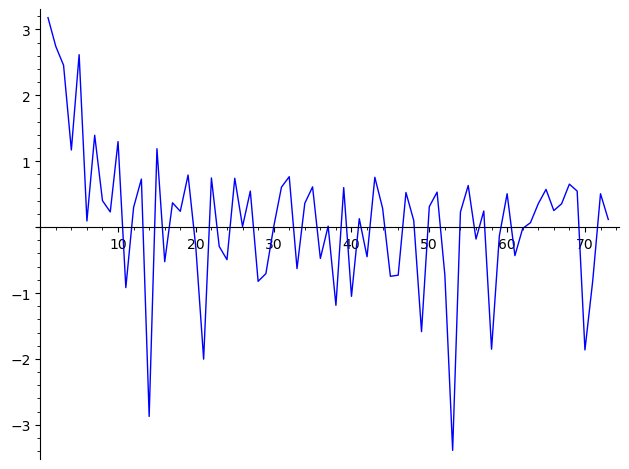

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


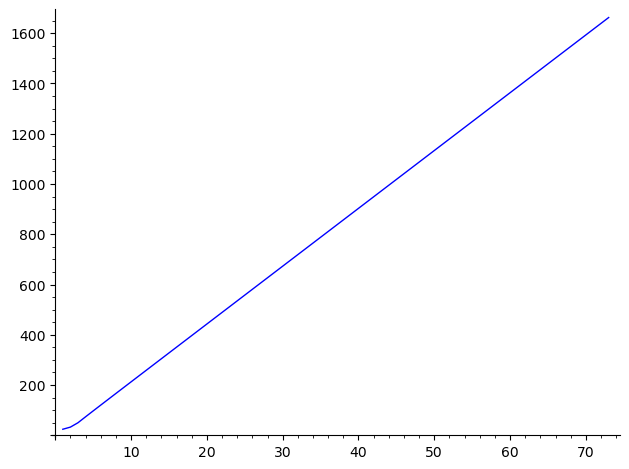

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(74, 0)
MINIMUM MODULI


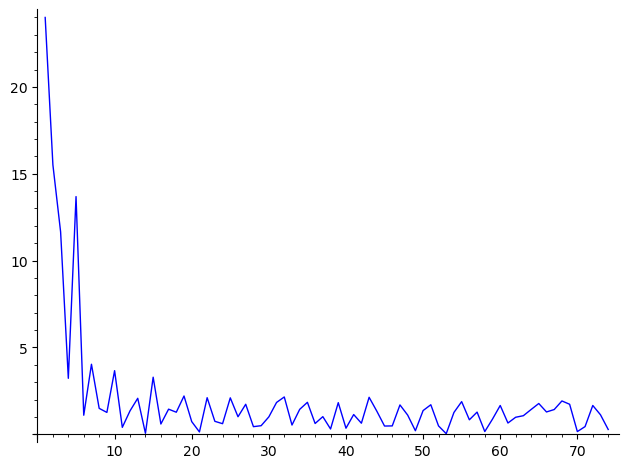

LOGS MINIMUM MODULI


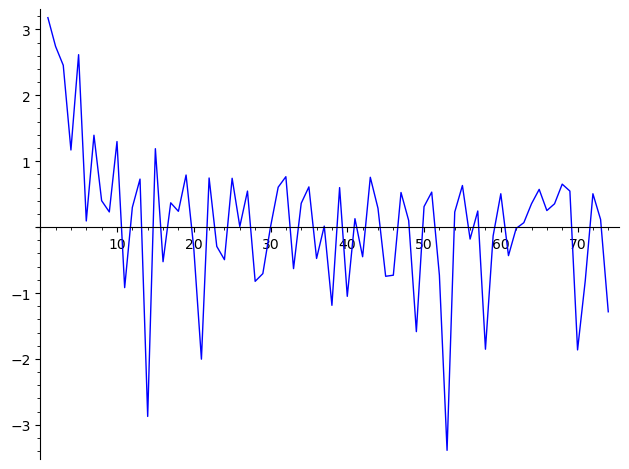

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


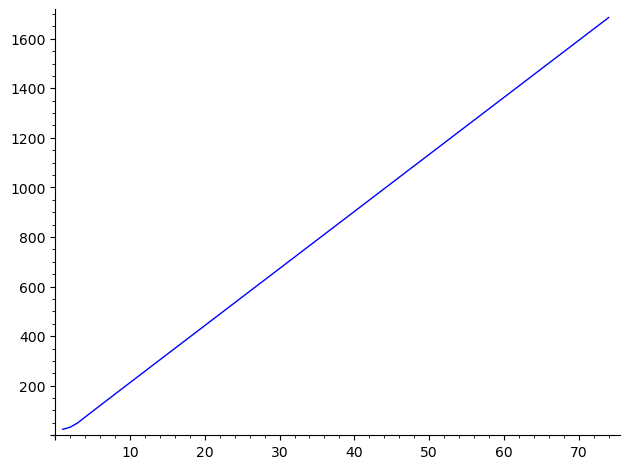

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(75, 0)
MINIMUM MODULI


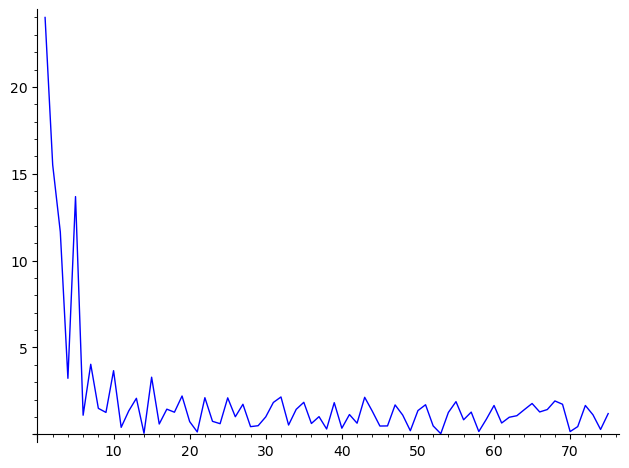

LOGS MINIMUM MODULI


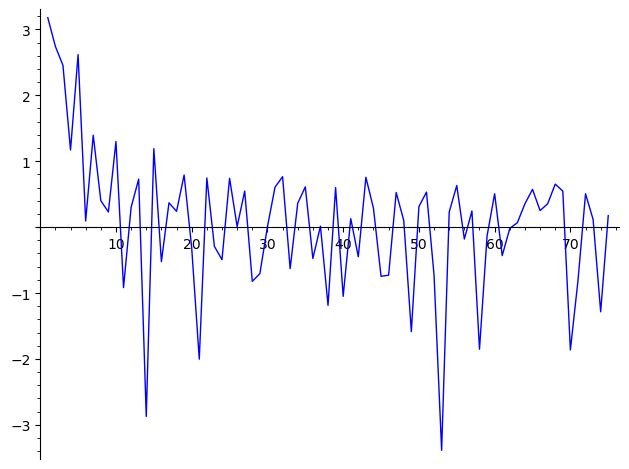

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


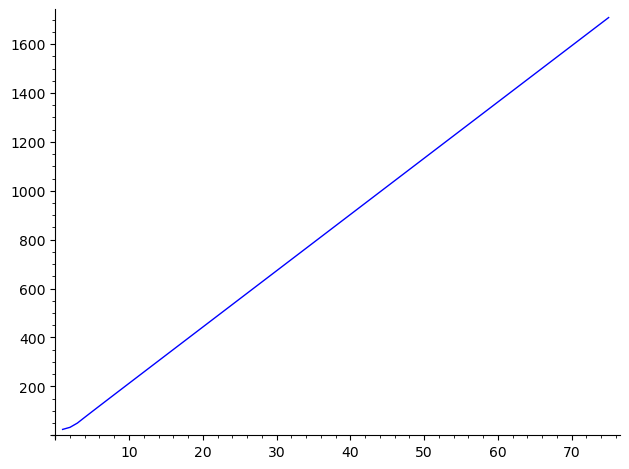

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(76, 0)
MINIMUM MODULI


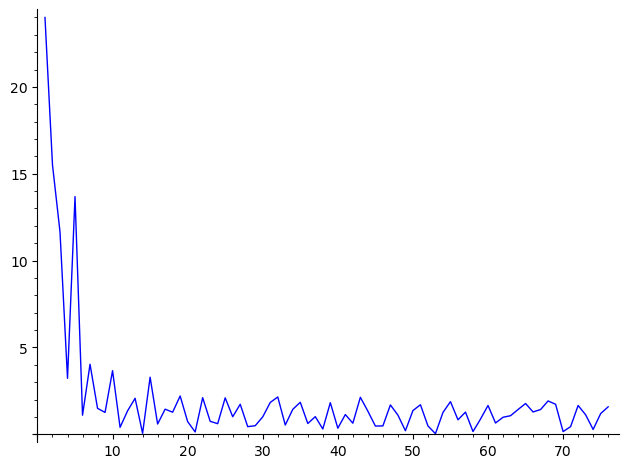

LOGS MINIMUM MODULI


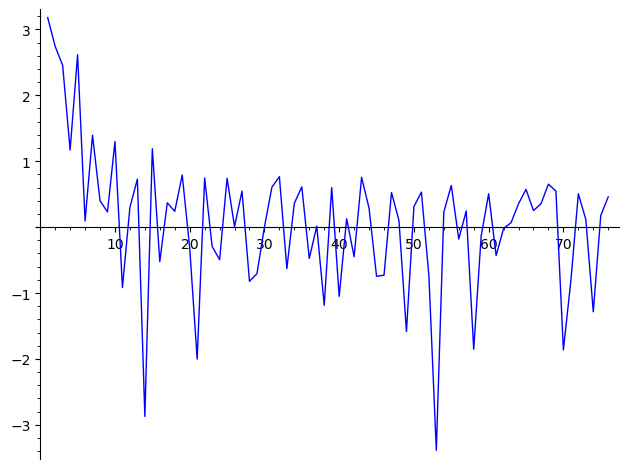

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


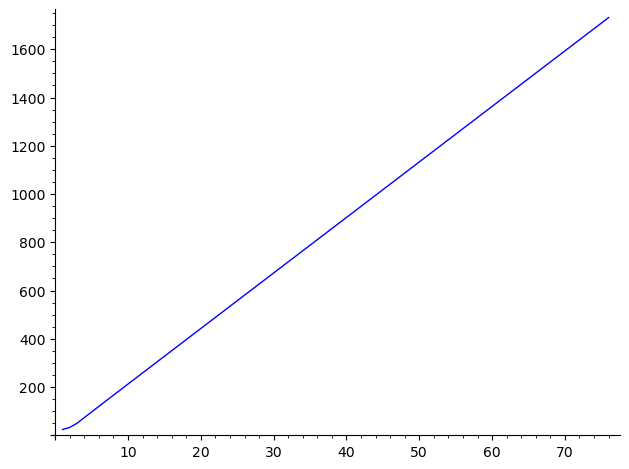

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(77, 0)
MINIMUM MODULI


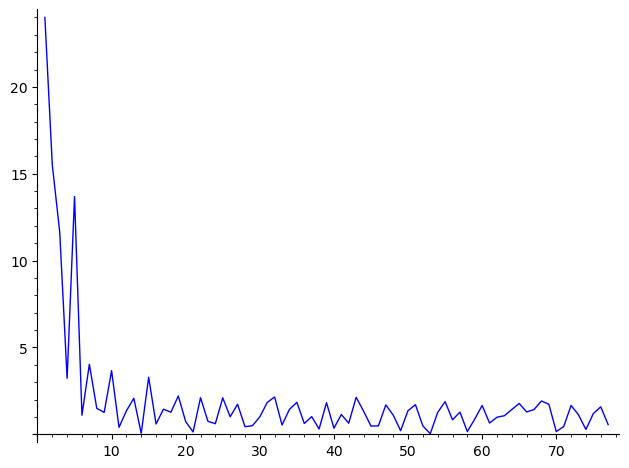

LOGS MINIMUM MODULI


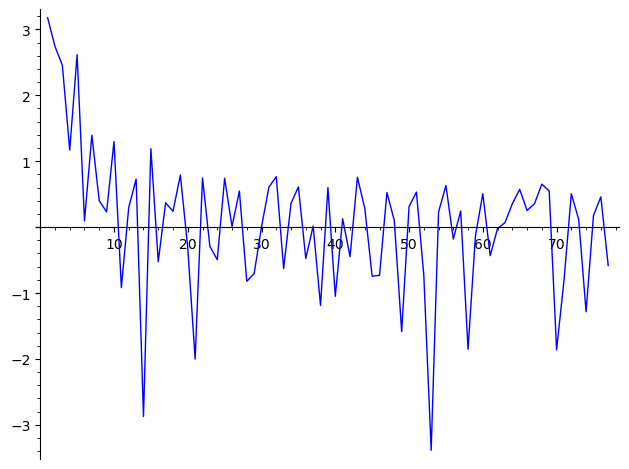

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


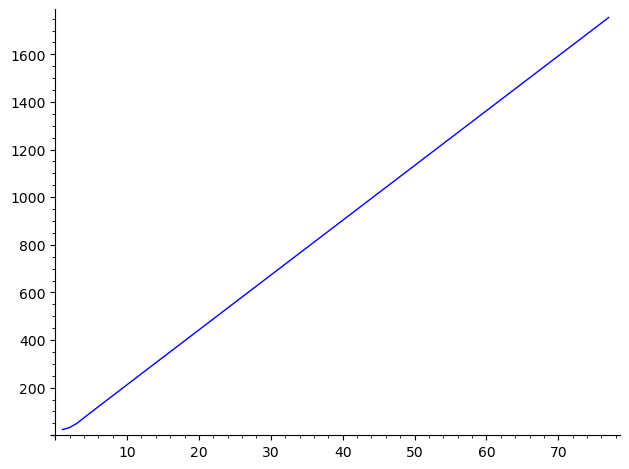

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(78, 0)
MINIMUM MODULI


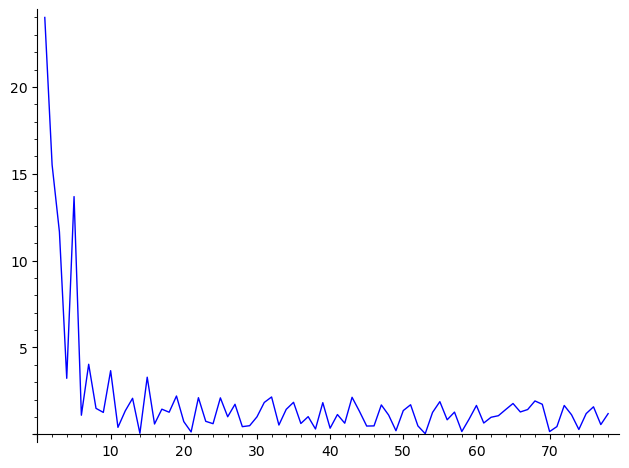

LOGS MINIMUM MODULI


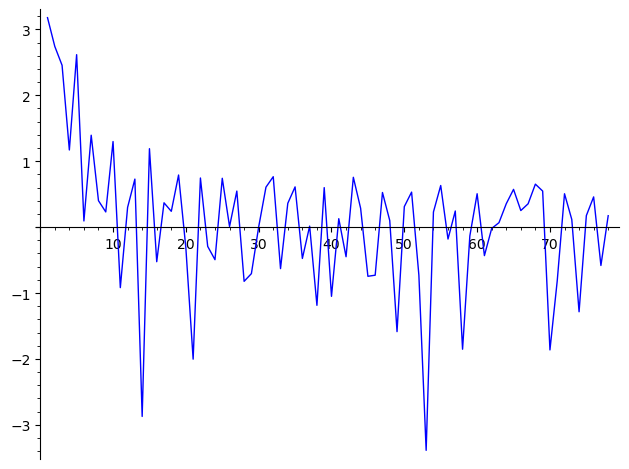

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


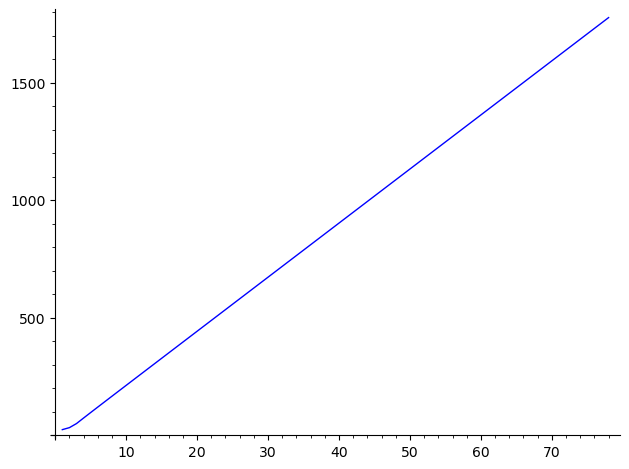

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(79, 0)
MINIMUM MODULI


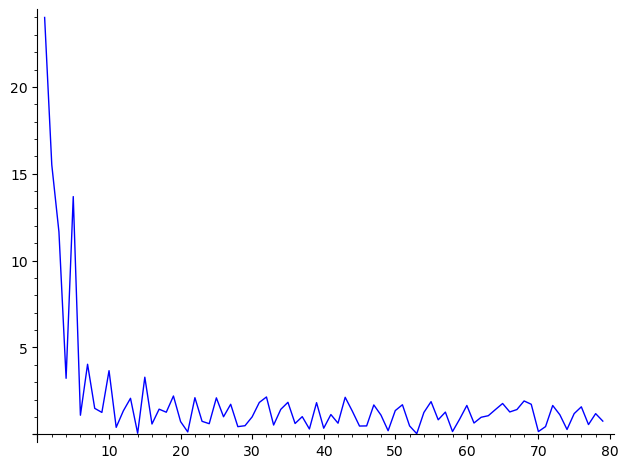

LOGS MINIMUM MODULI


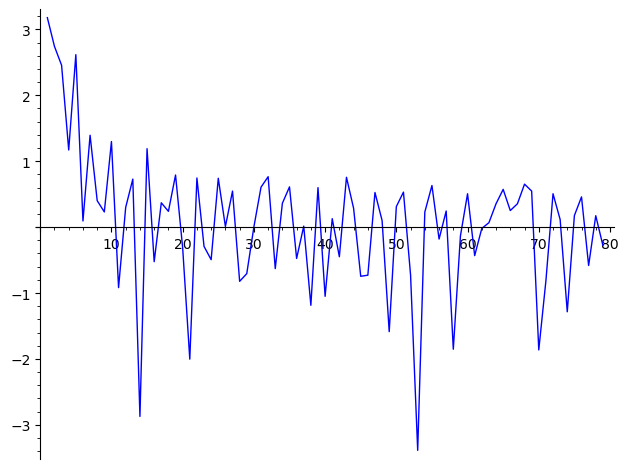

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


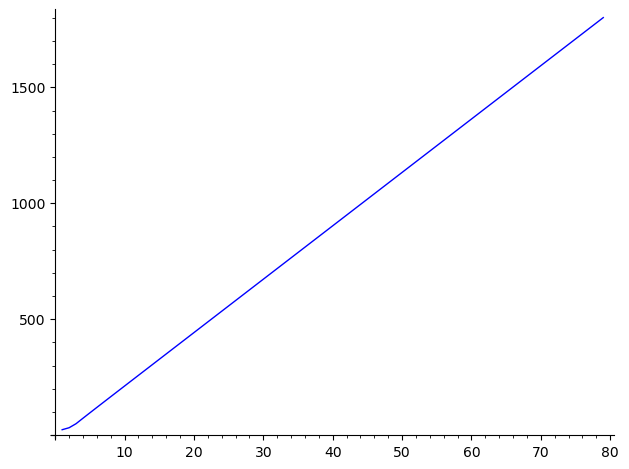

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(80, 0)
MINIMUM MODULI


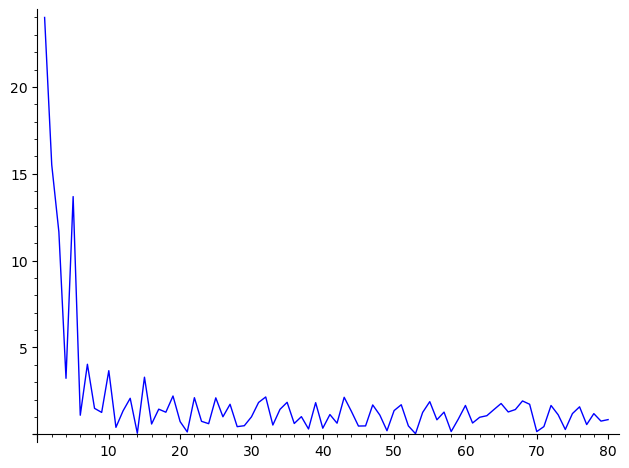

LOGS MINIMUM MODULI


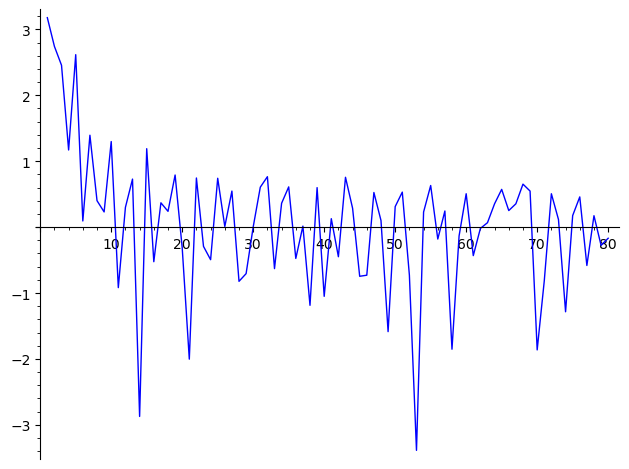

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


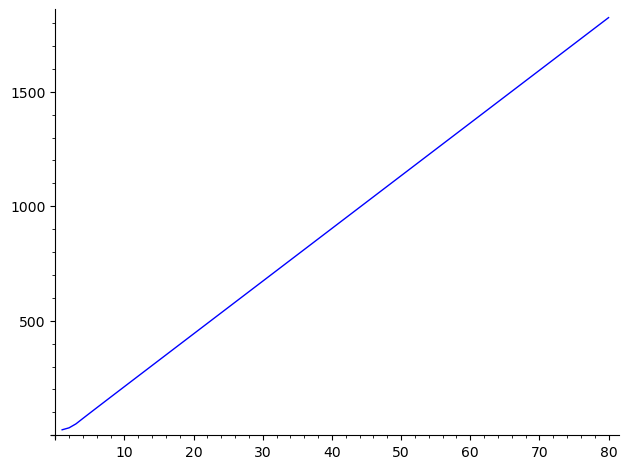

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(81, 0)
MINIMUM MODULI


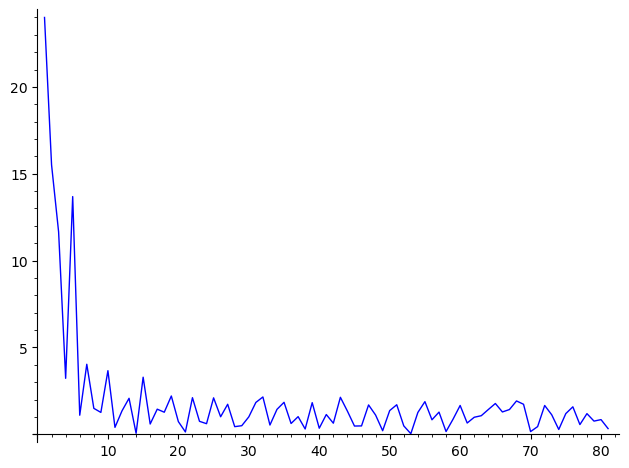

LOGS MINIMUM MODULI


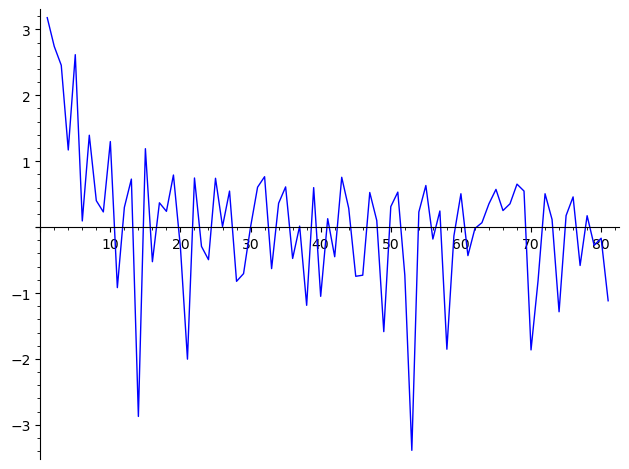

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


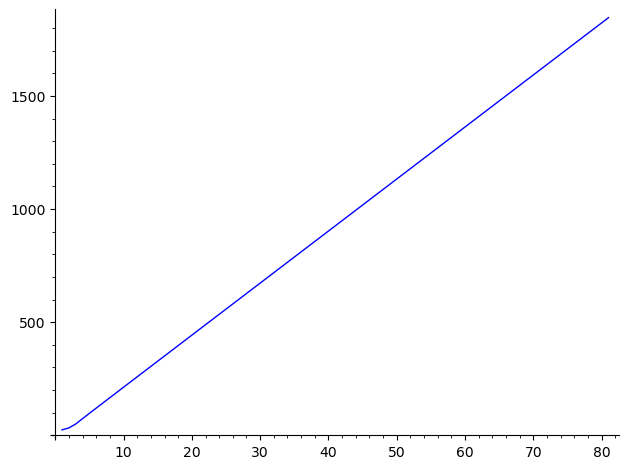

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(82, 0)
MINIMUM MODULI


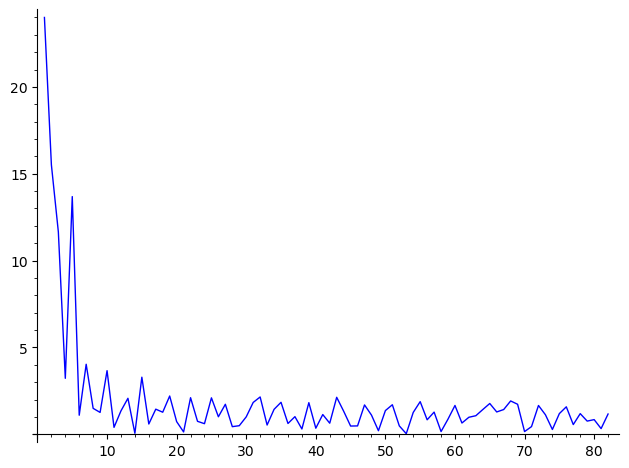

LOGS MINIMUM MODULI


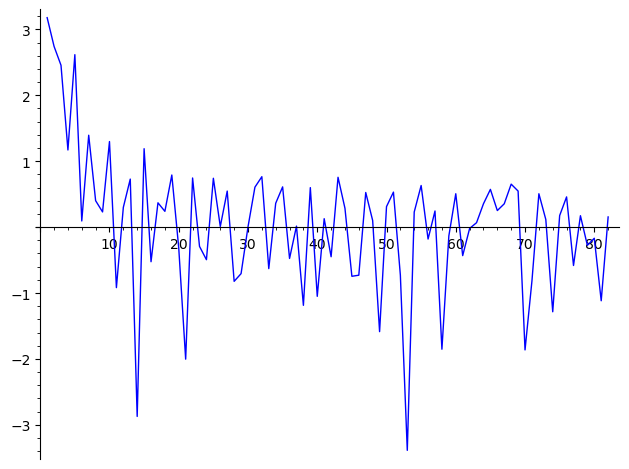

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


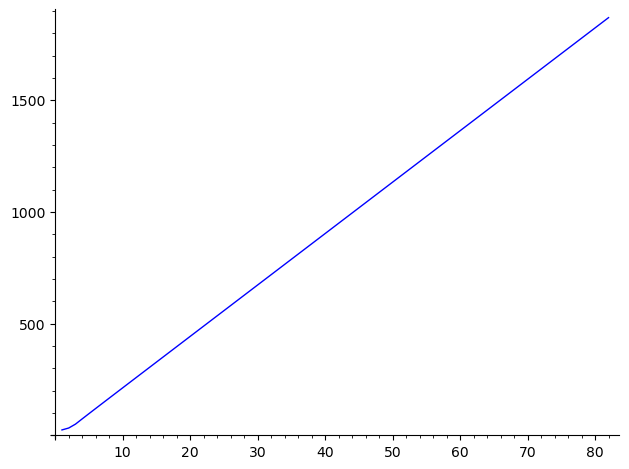

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(83, 0)
MINIMUM MODULI


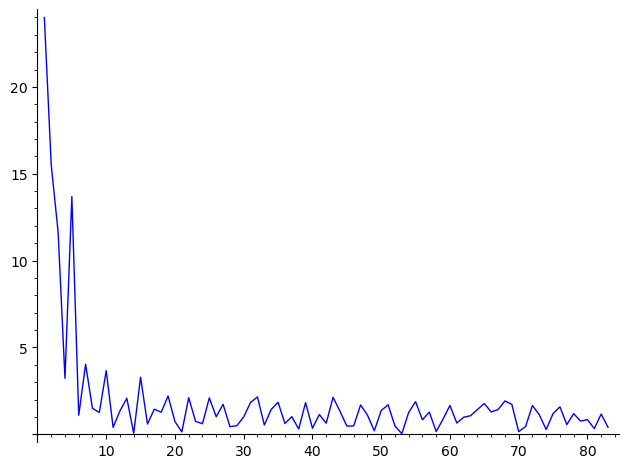

LOGS MINIMUM MODULI


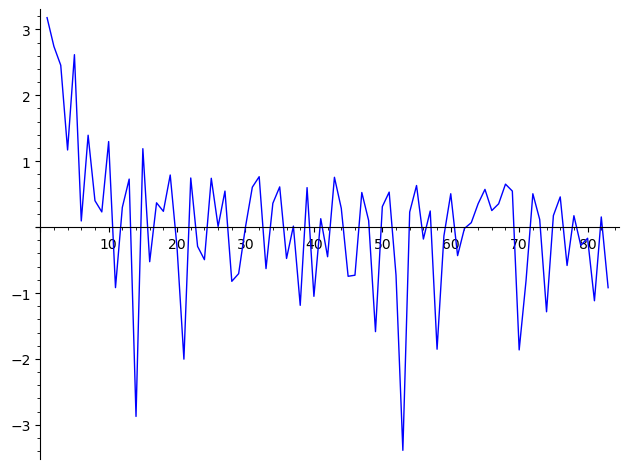

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


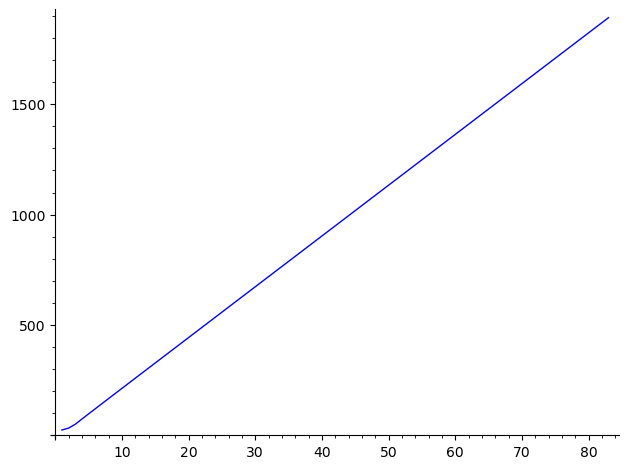

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(84, 0)
MINIMUM MODULI


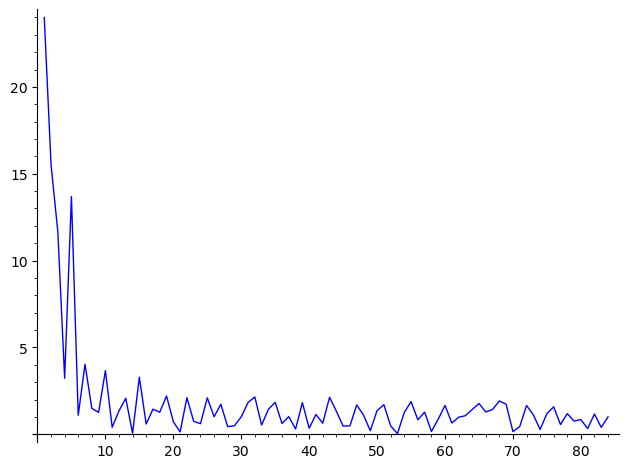

LOGS MINIMUM MODULI


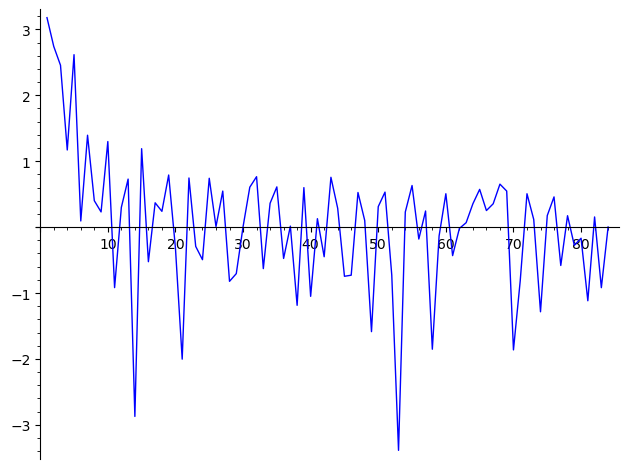

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


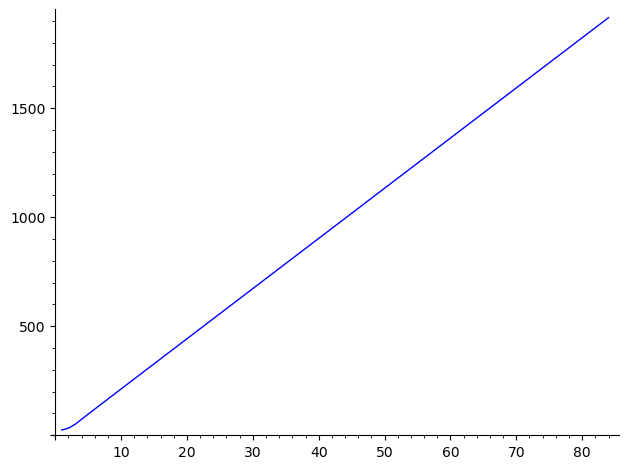

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(85, 0)
MINIMUM MODULI


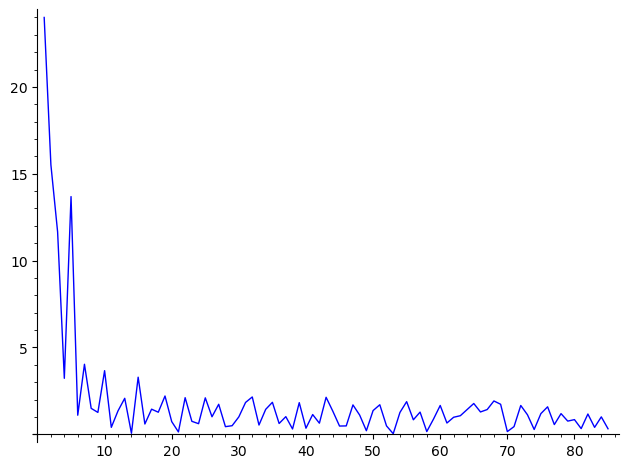

LOGS MINIMUM MODULI


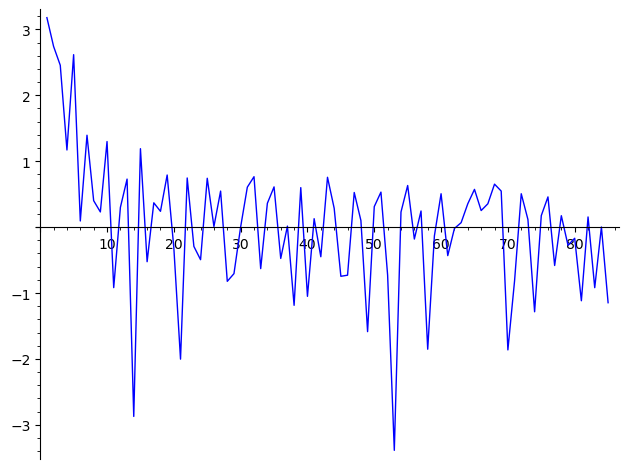

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


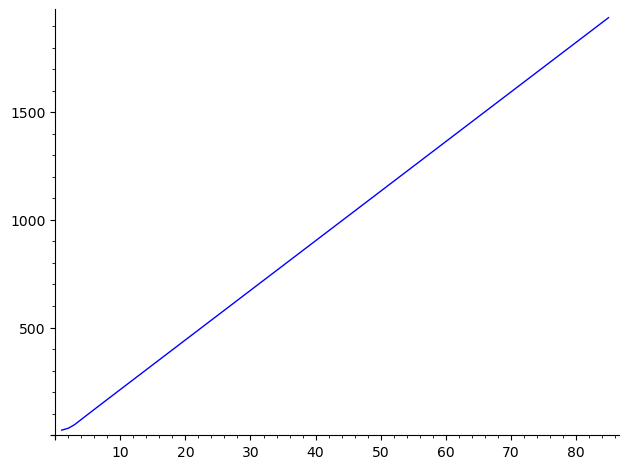

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(86, 0)
MINIMUM MODULI


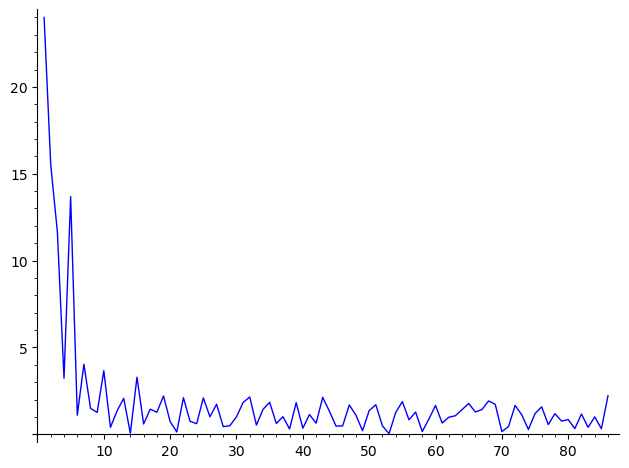

LOGS MINIMUM MODULI


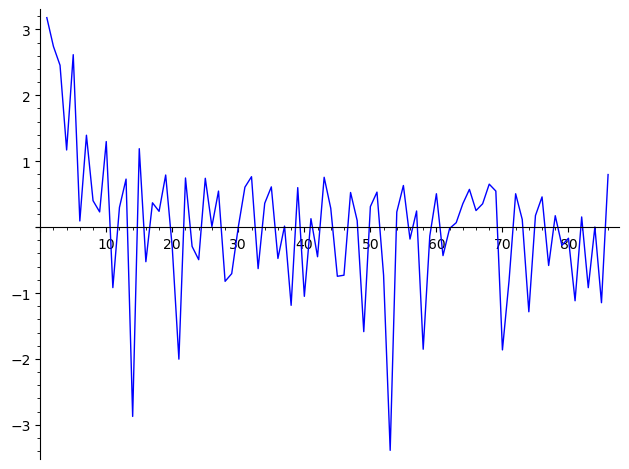

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


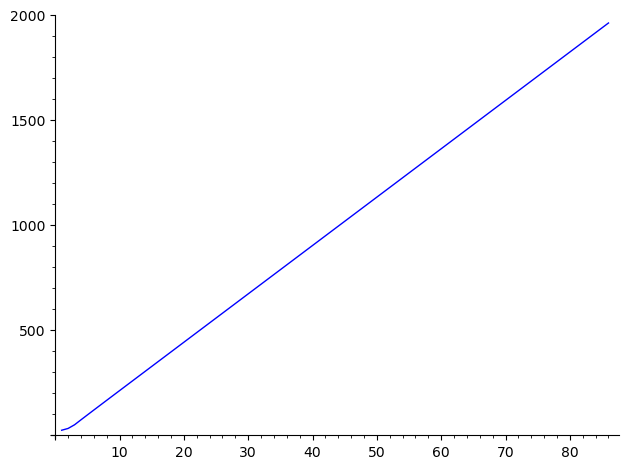

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(87, 0)
MINIMUM MODULI


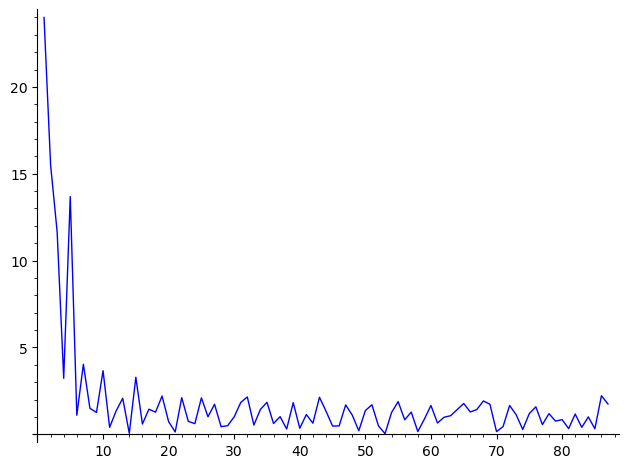

LOGS MINIMUM MODULI


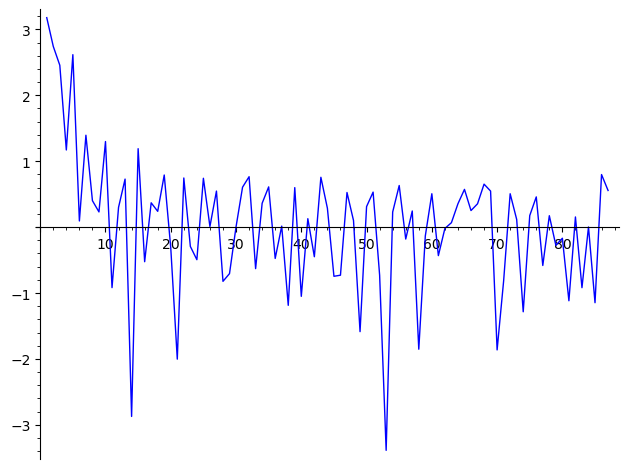

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


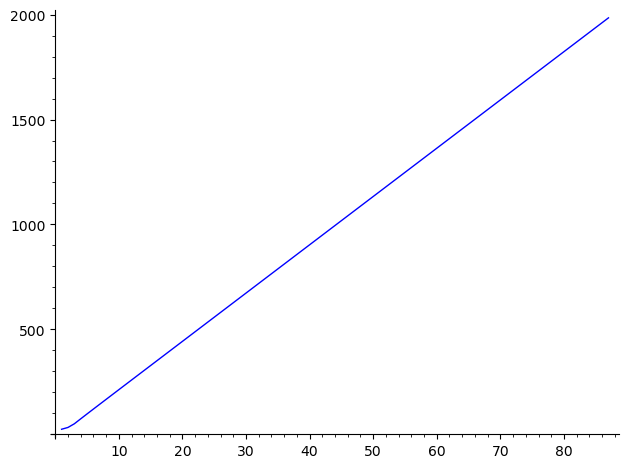

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(88, 0)
MINIMUM MODULI


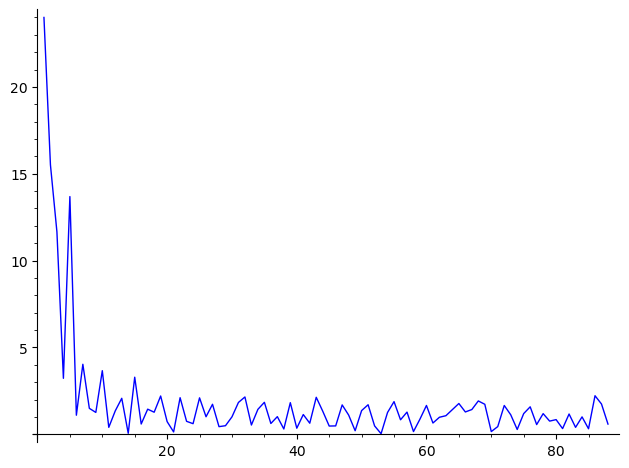

LOGS MINIMUM MODULI


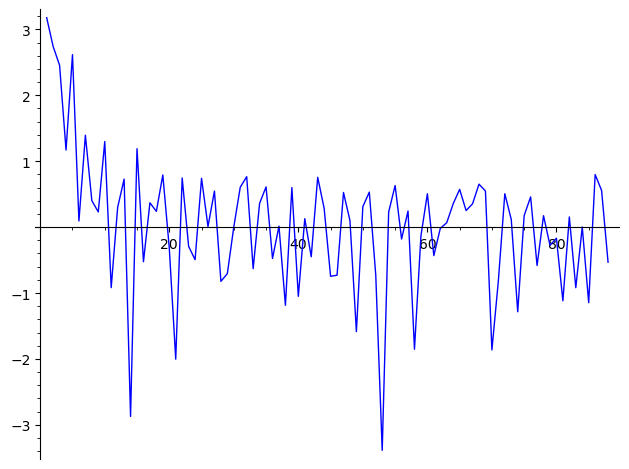

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


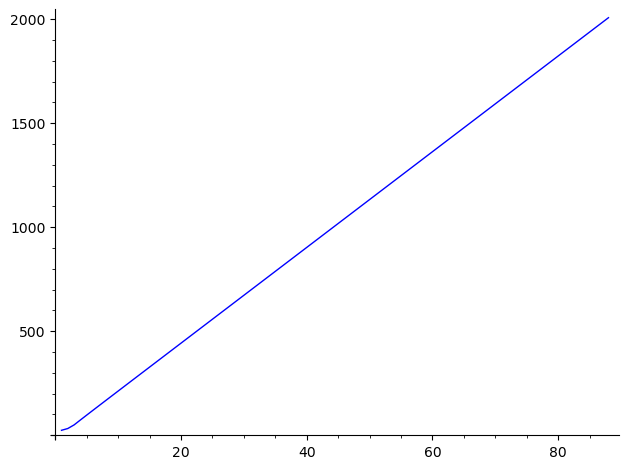

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(89, 0)
MINIMUM MODULI


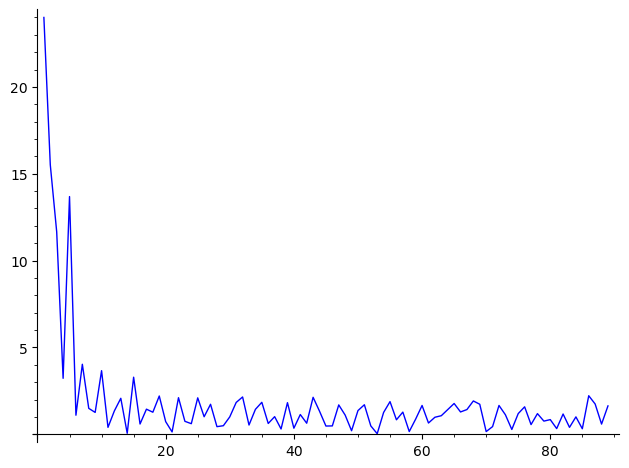

LOGS MINIMUM MODULI


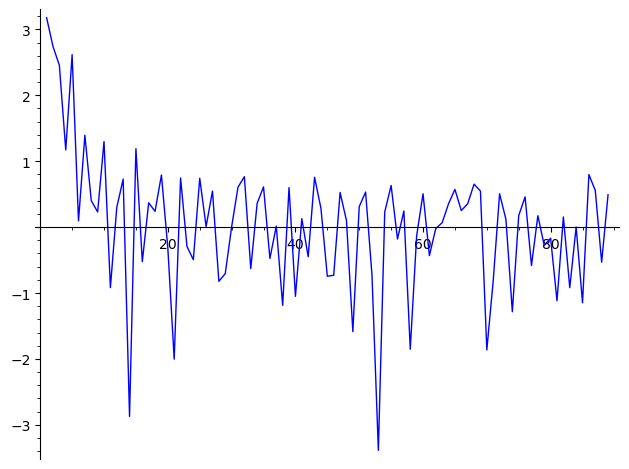

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


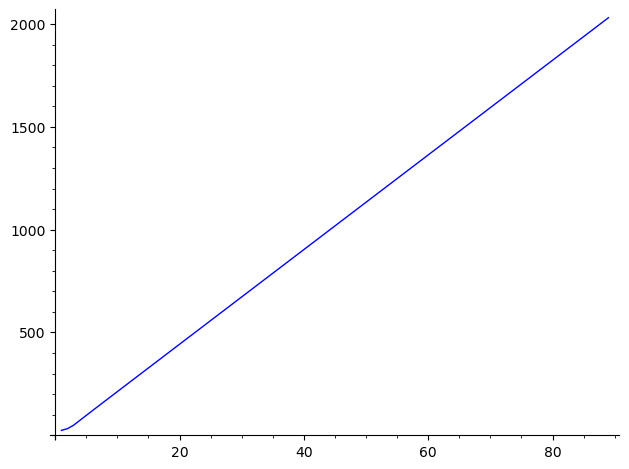

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(90, 0)
MINIMUM MODULI


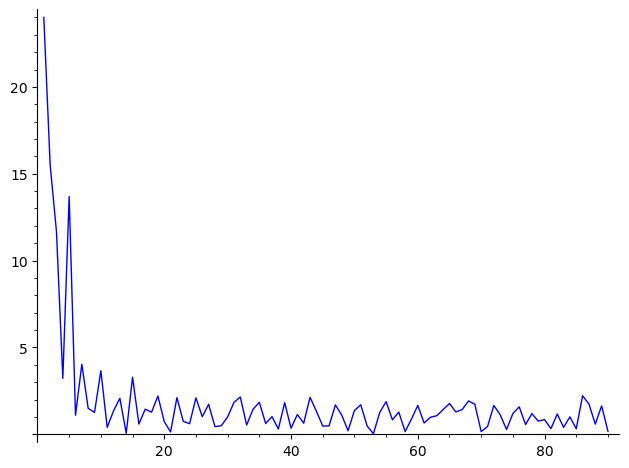

LOGS MINIMUM MODULI


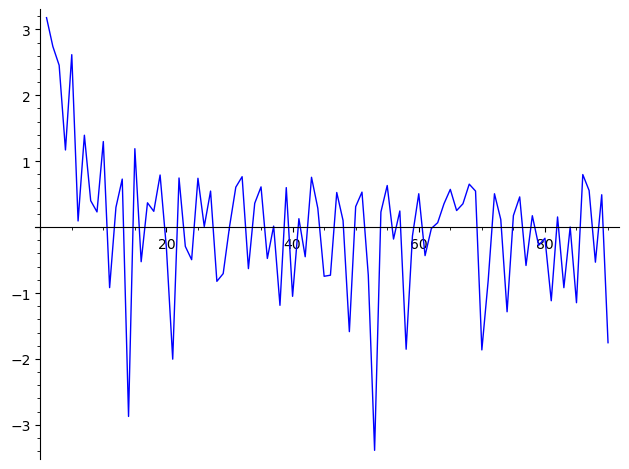

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


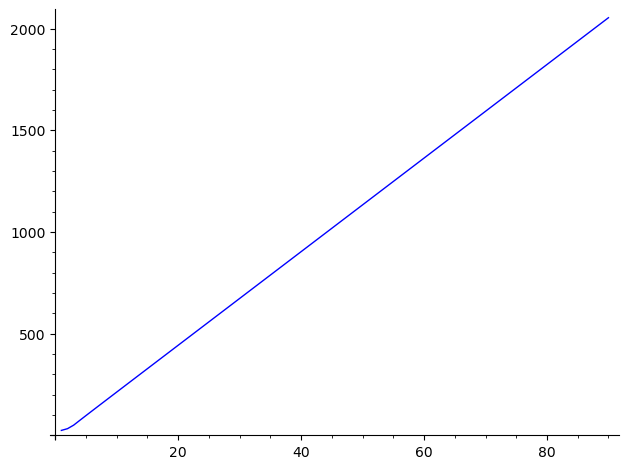

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(91, 0)
MINIMUM MODULI


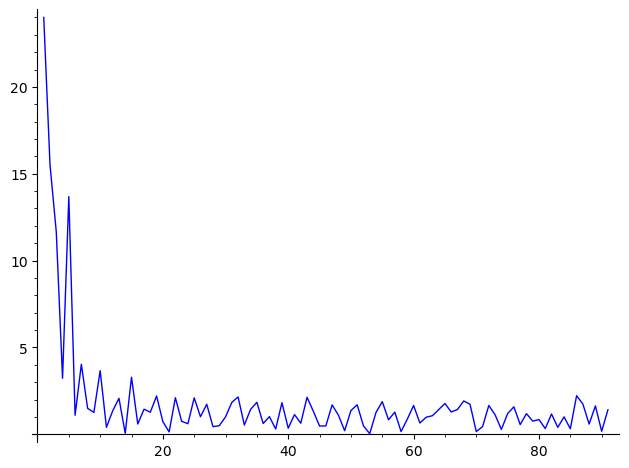

LOGS MINIMUM MODULI


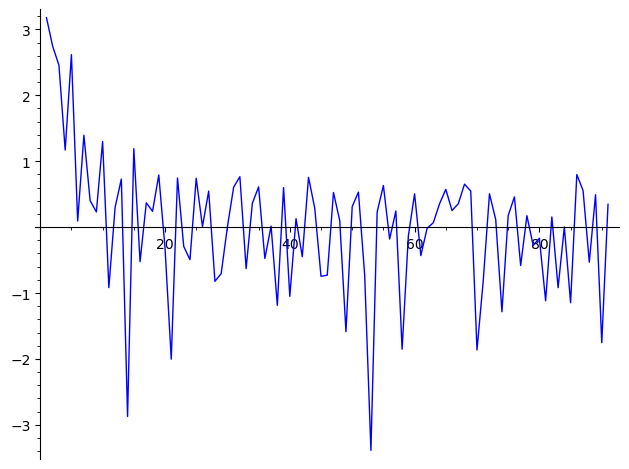

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


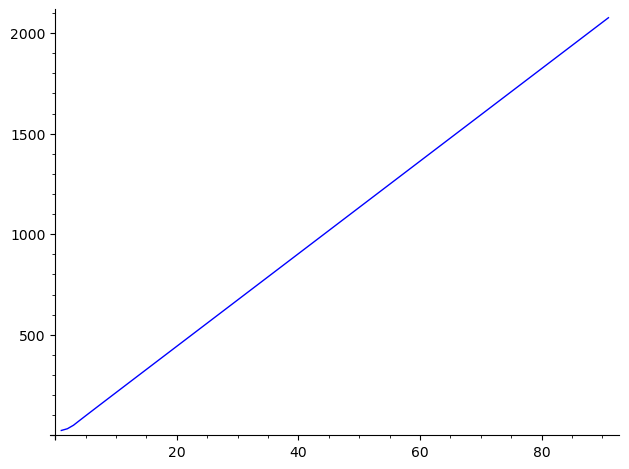

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(92, 0)
MINIMUM MODULI


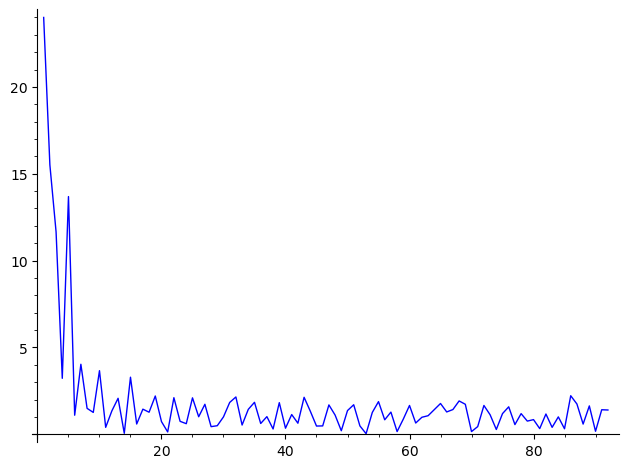

LOGS MINIMUM MODULI


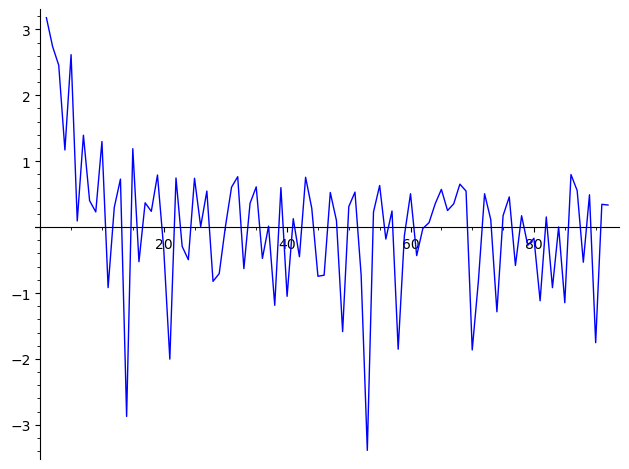

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


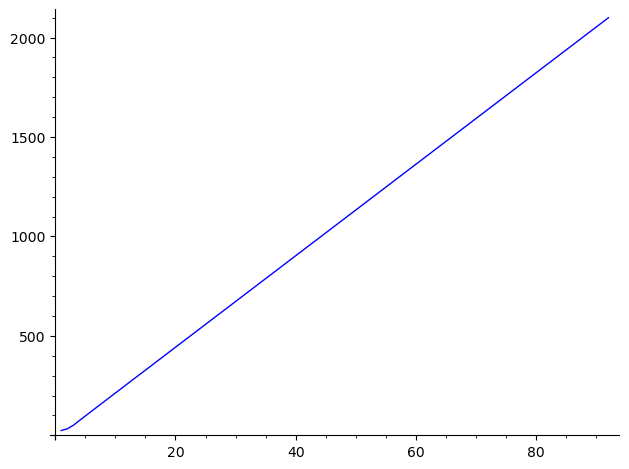

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(93, 0)
MINIMUM MODULI


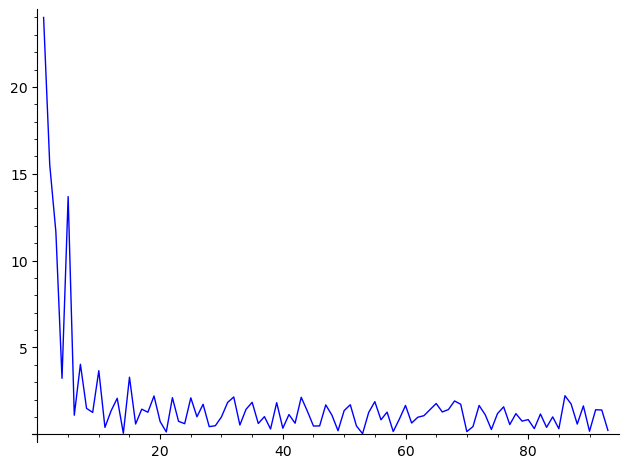

LOGS MINIMUM MODULI


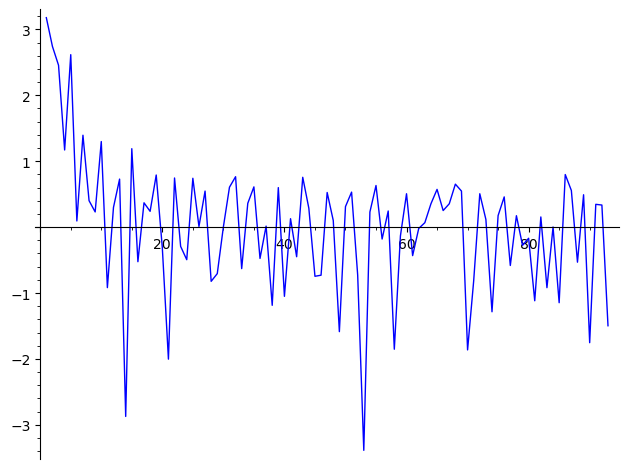

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


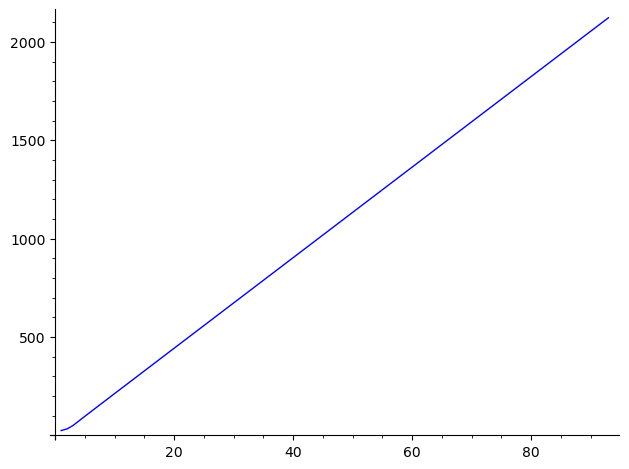

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(94, 0)
MINIMUM MODULI


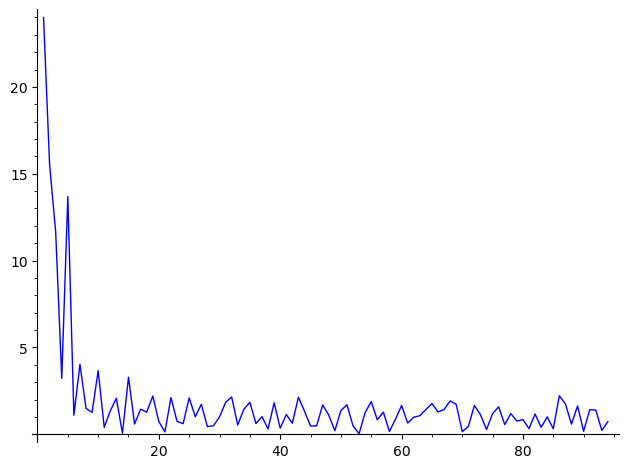

LOGS MINIMUM MODULI


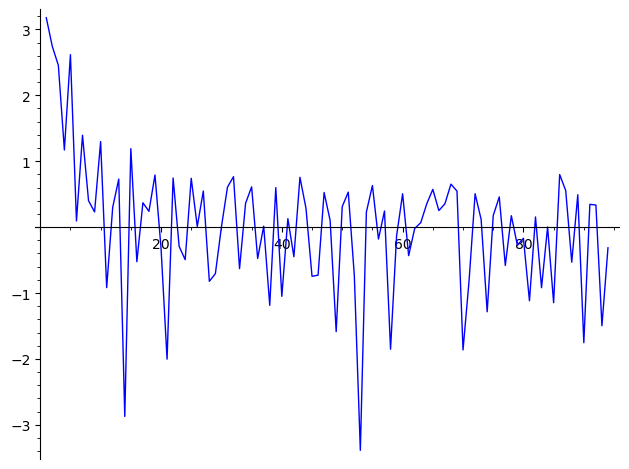

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


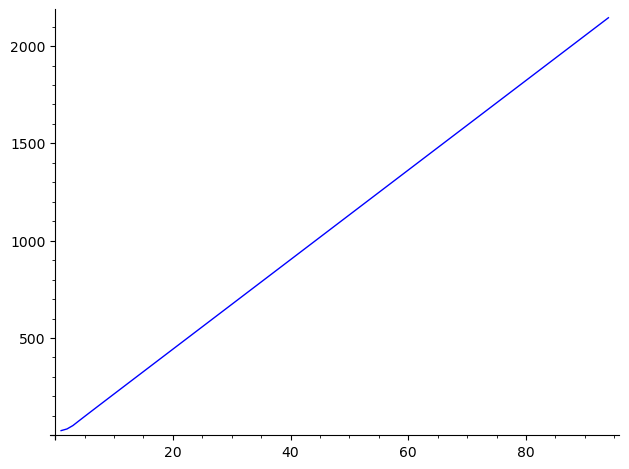

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(95, 0)
MINIMUM MODULI


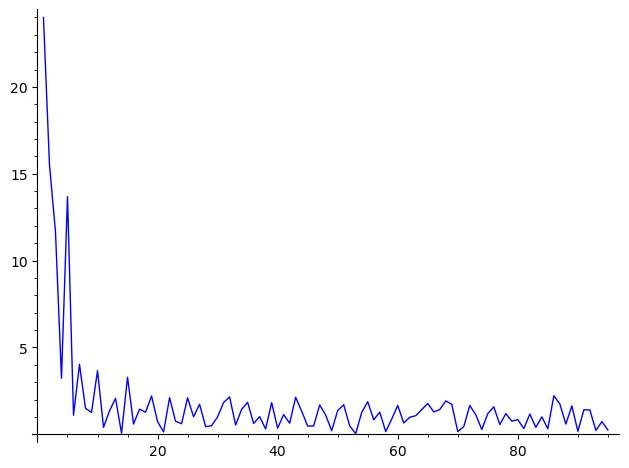

LOGS MINIMUM MODULI


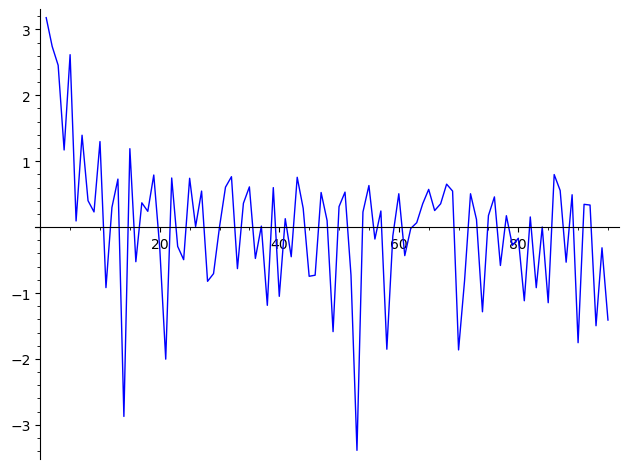

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


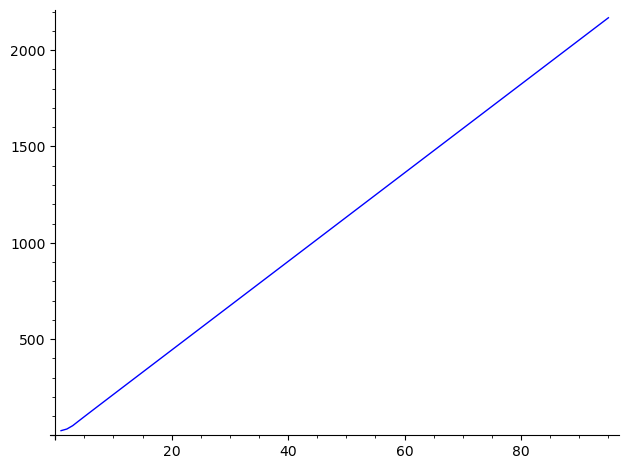

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(96, 0)
MINIMUM MODULI


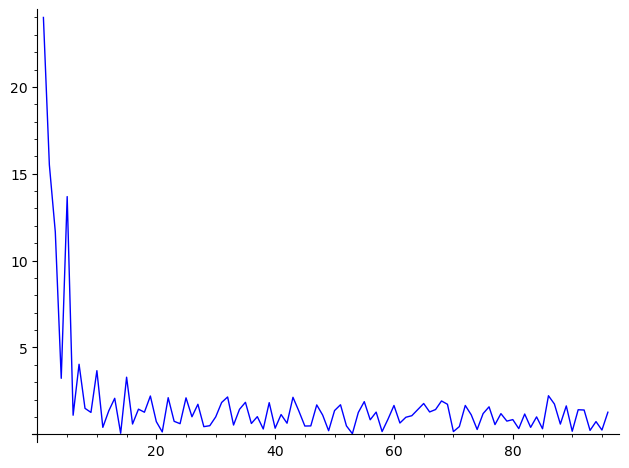

LOGS MINIMUM MODULI


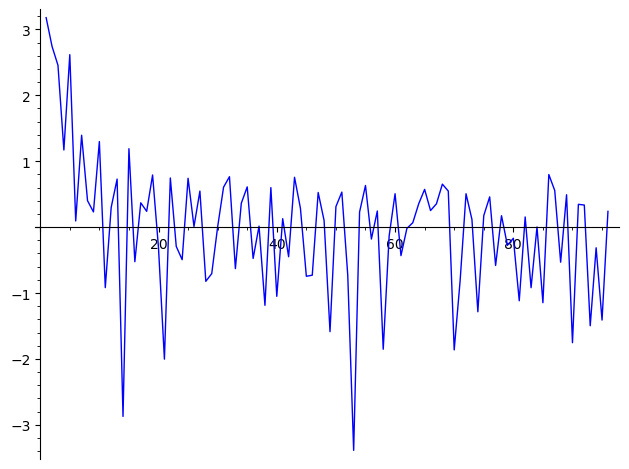

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


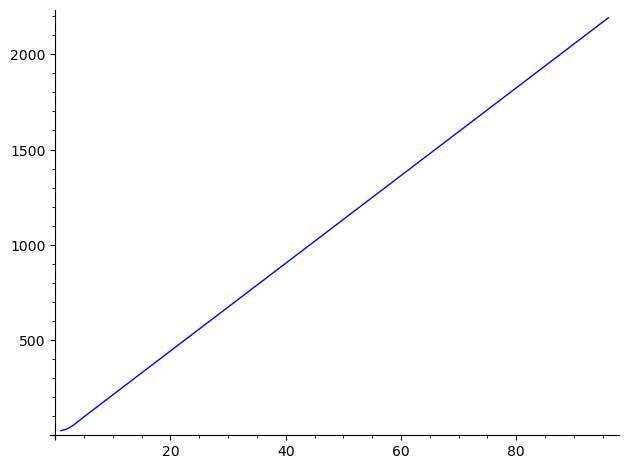

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(97, 0)
MINIMUM MODULI


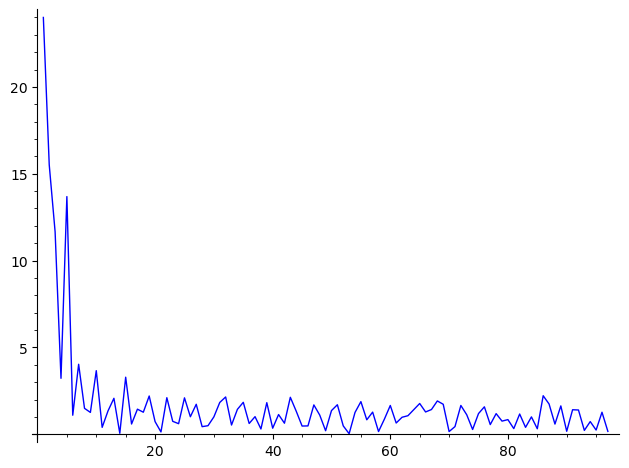

LOGS MINIMUM MODULI


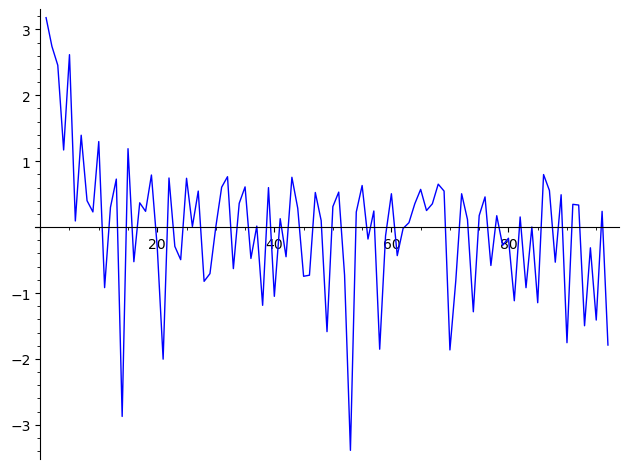

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


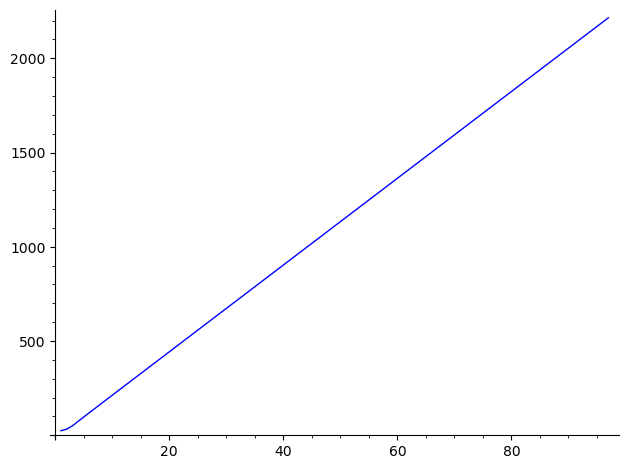

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(98, 0)
MINIMUM MODULI


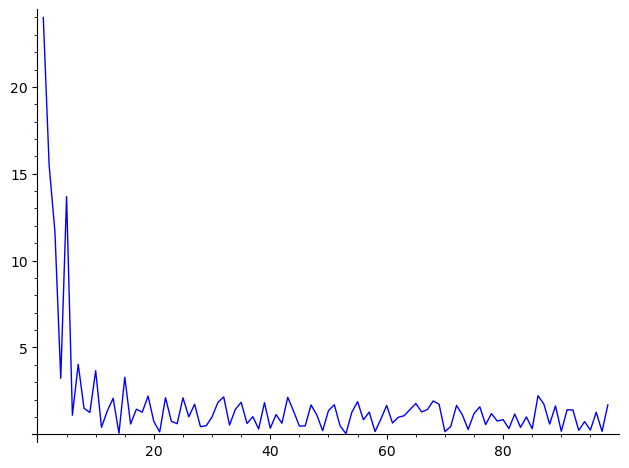

LOGS MINIMUM MODULI


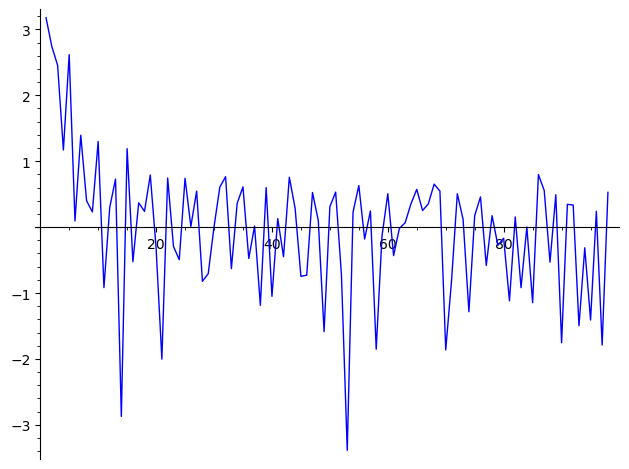

minimum logarithm of minimum modulus: -3.3875396376065374462108725824
MAXIMUM MODULI


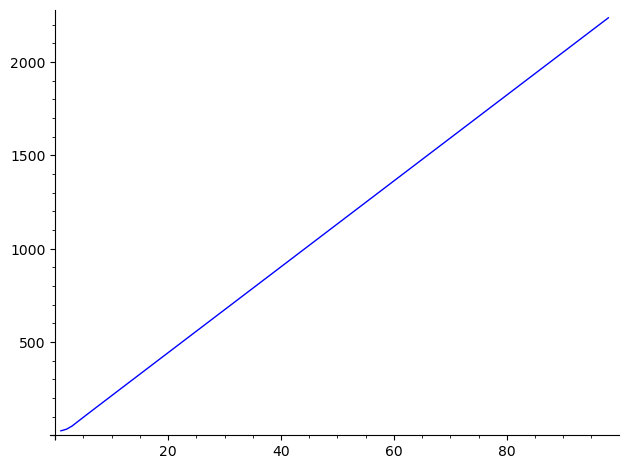

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(99, 0)
MINIMUM MODULI


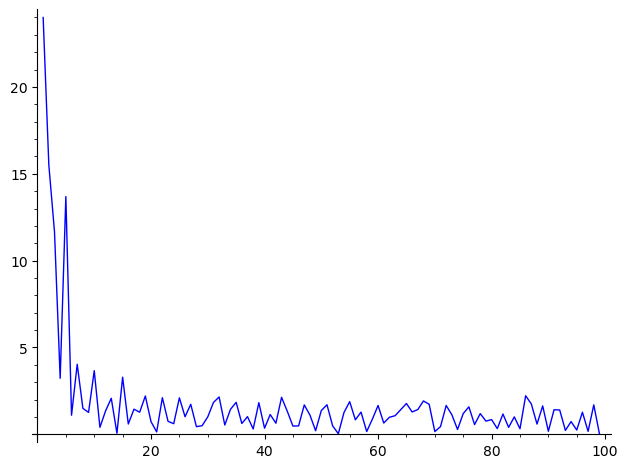

LOGS MINIMUM MODULI


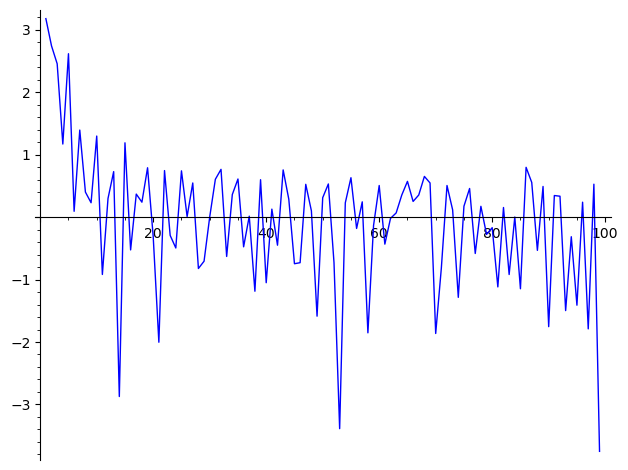

minimum logarithm of minimum modulus: -3.7509437192901918056186845584
MAXIMUM MODULI


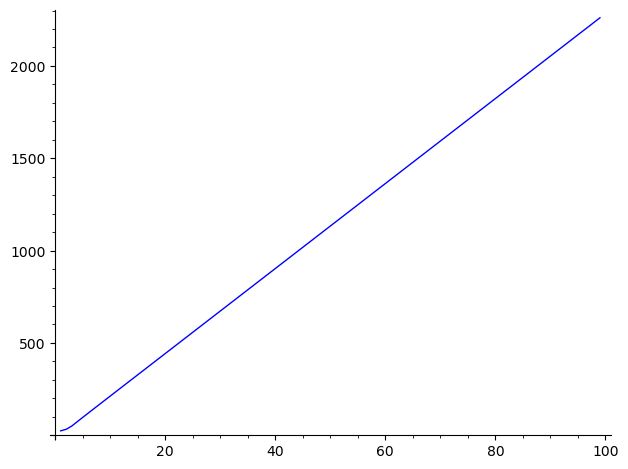

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(100, 0)
MINIMUM MODULI


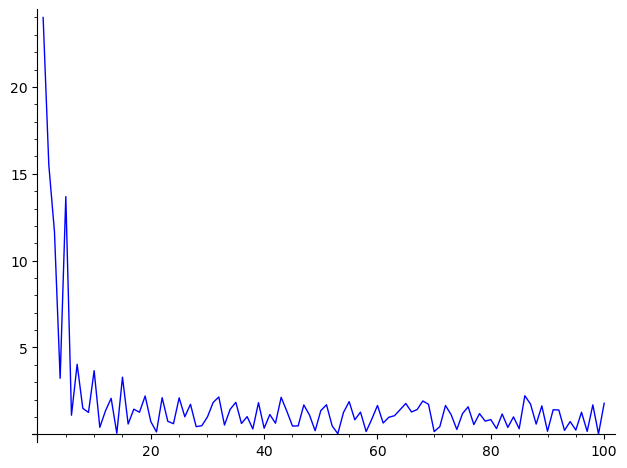

LOGS MINIMUM MODULI


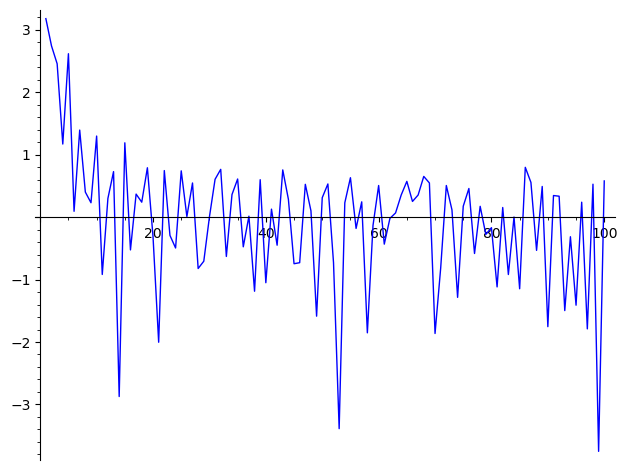

minimum logarithm of minimum modulus: -3.7509437192901918056186845584
MAXIMUM MODULI


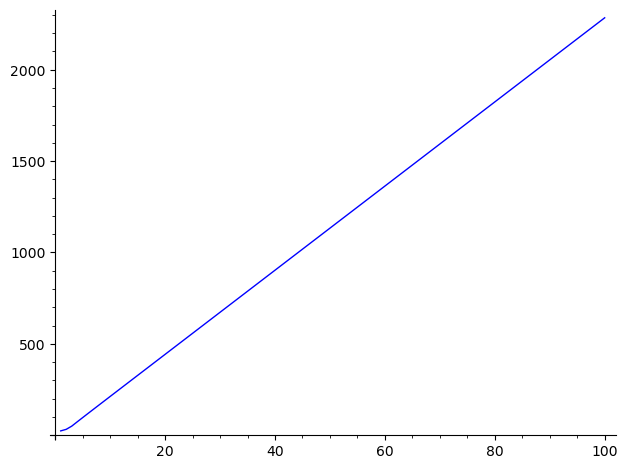

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(101, 0)
MINIMUM MODULI


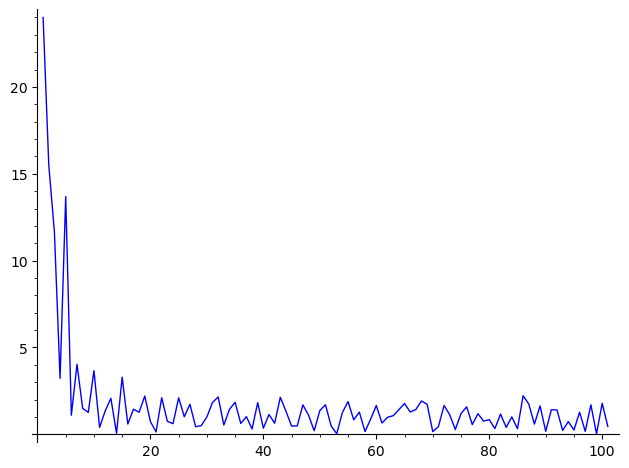

LOGS MINIMUM MODULI


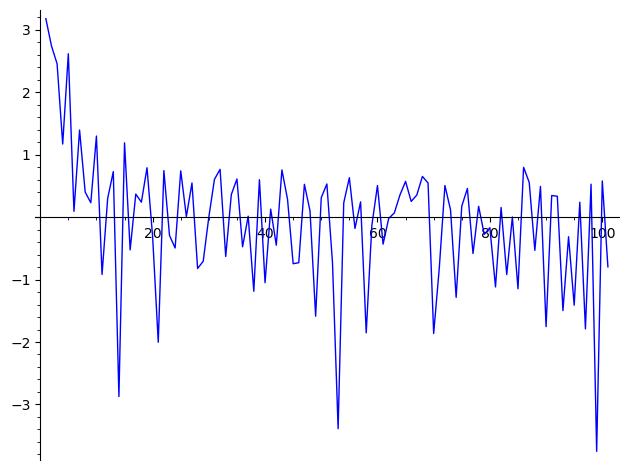

minimum logarithm of minimum modulus: -3.7509437192901918056186845584
MAXIMUM MODULI


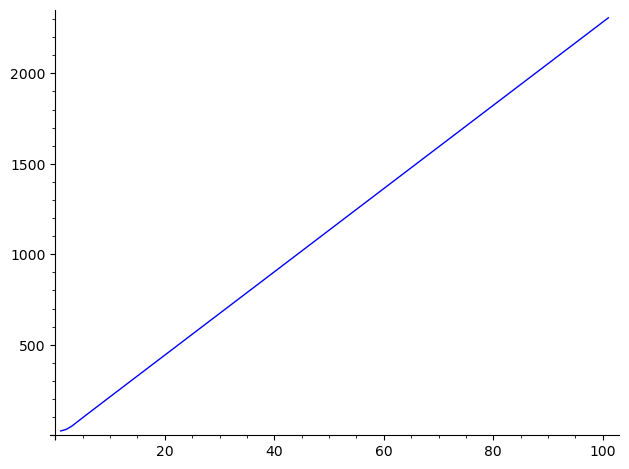

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(102, 0)
MINIMUM MODULI


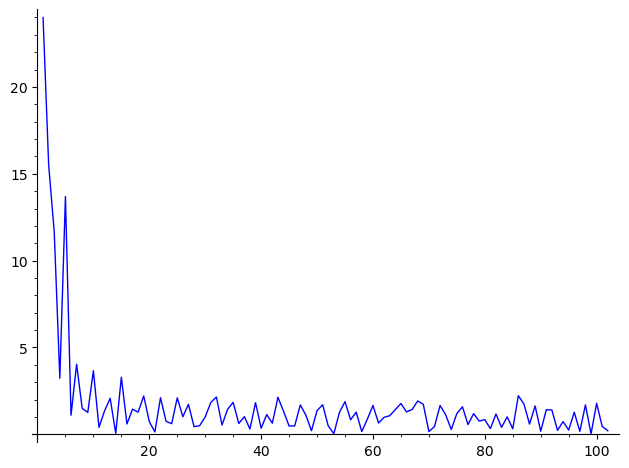

LOGS MINIMUM MODULI


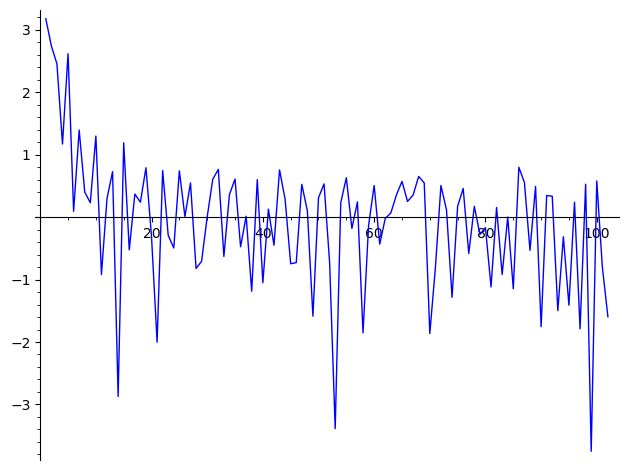

minimum logarithm of minimum modulus: -3.7509437192901918056186845584
MAXIMUM MODULI


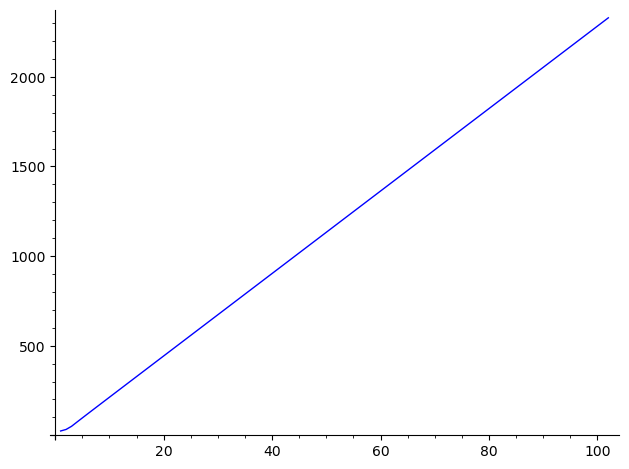

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(103, 0)
MINIMUM MODULI


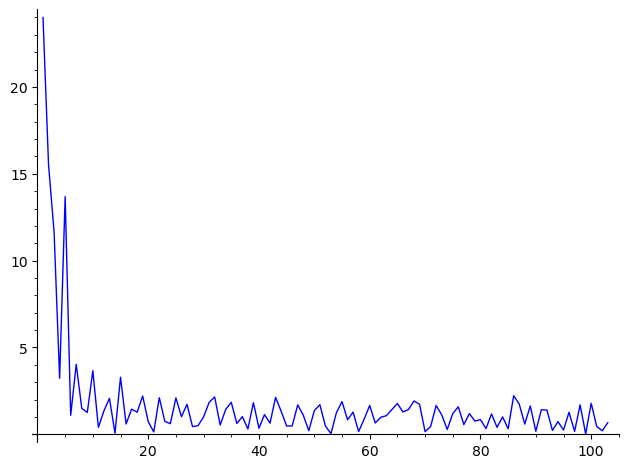

LOGS MINIMUM MODULI


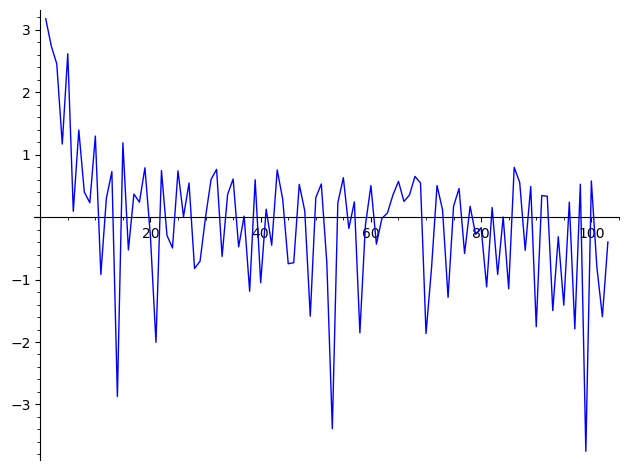

minimum logarithm of minimum modulus: -3.7509437192901918056186845584
MAXIMUM MODULI


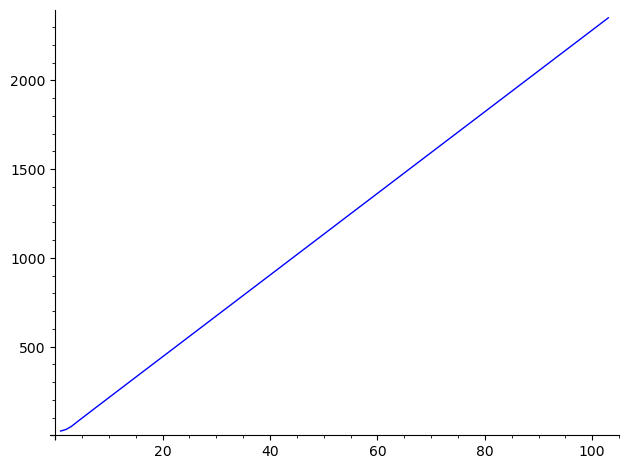

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(104, 0)
MINIMUM MODULI


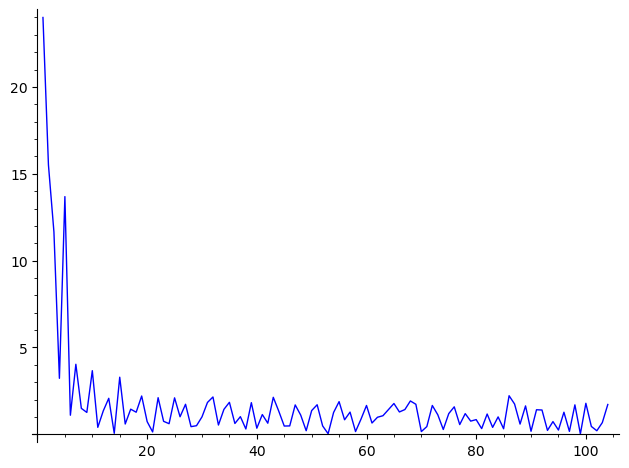

LOGS MINIMUM MODULI


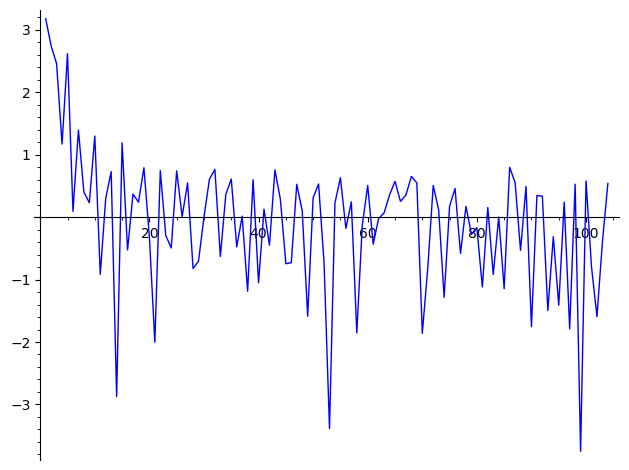

minimum logarithm of minimum modulus: -3.7509437192901918056186845584
MAXIMUM MODULI


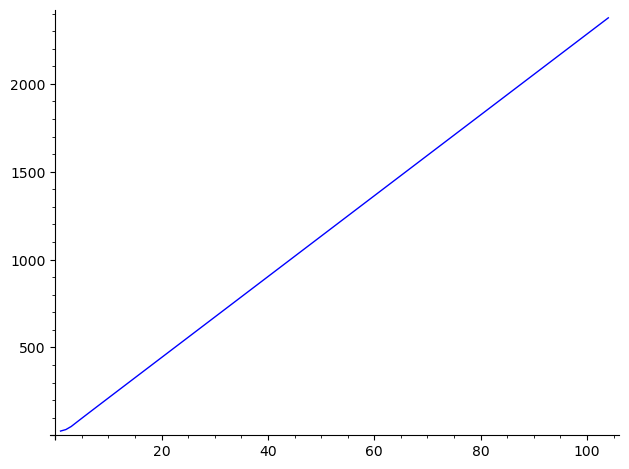

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(105, 0)
MINIMUM MODULI


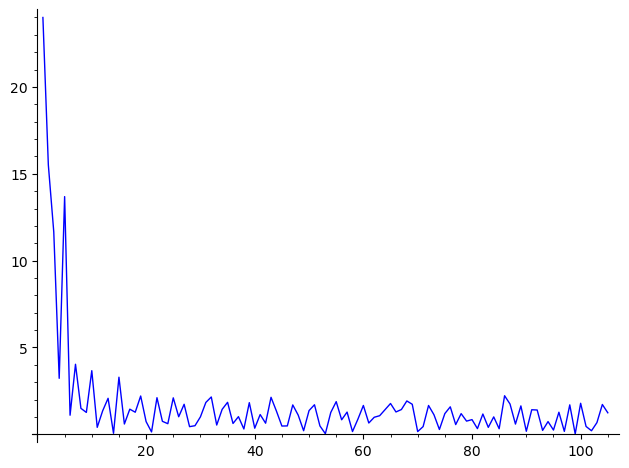

LOGS MINIMUM MODULI


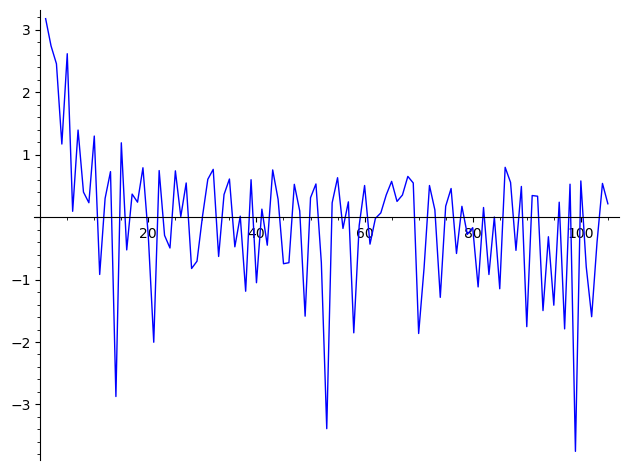

minimum logarithm of minimum modulus: -3.7509437192901918056186845584
MAXIMUM MODULI


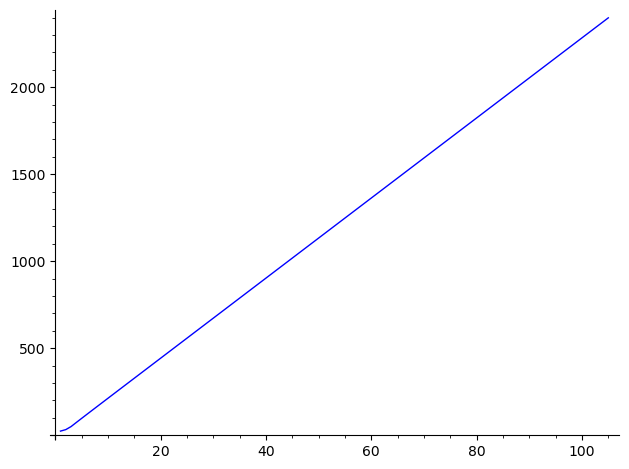

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(106, 0)
MINIMUM MODULI


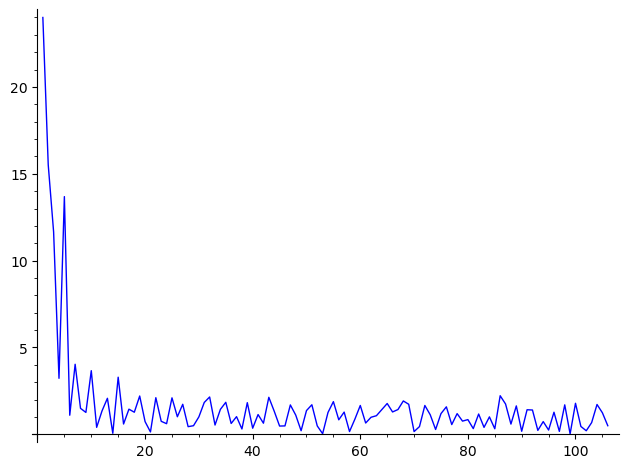

LOGS MINIMUM MODULI


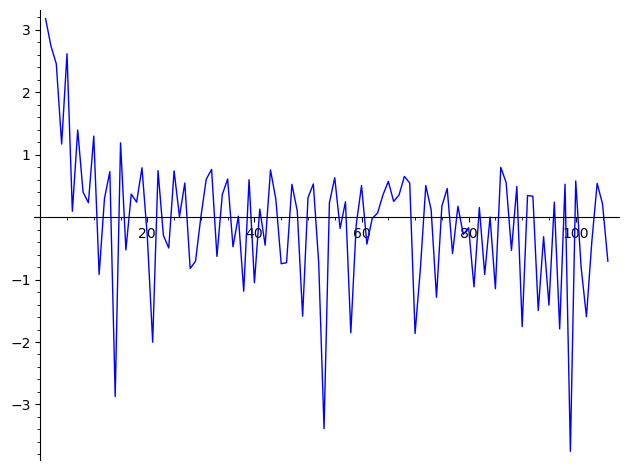

minimum logarithm of minimum modulus: -3.7509437192901918056186845584
MAXIMUM MODULI


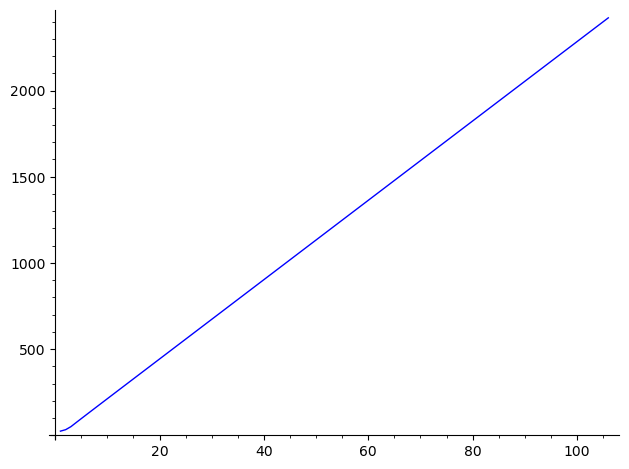

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(107, 0)
MINIMUM MODULI


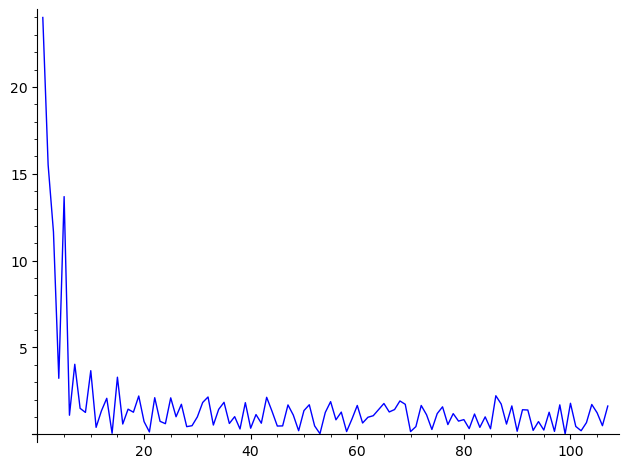

LOGS MINIMUM MODULI


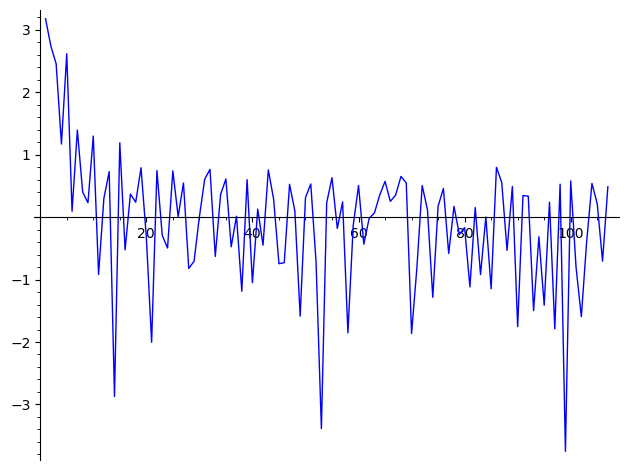

minimum logarithm of minimum modulus: -3.7509437192901918056186845584
MAXIMUM MODULI


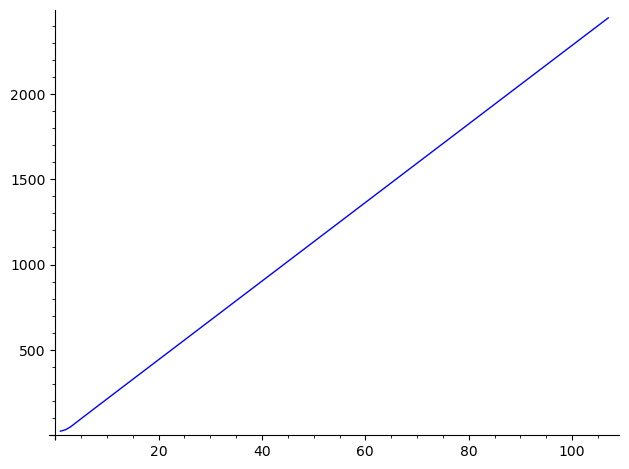

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(108, 0)
MINIMUM MODULI


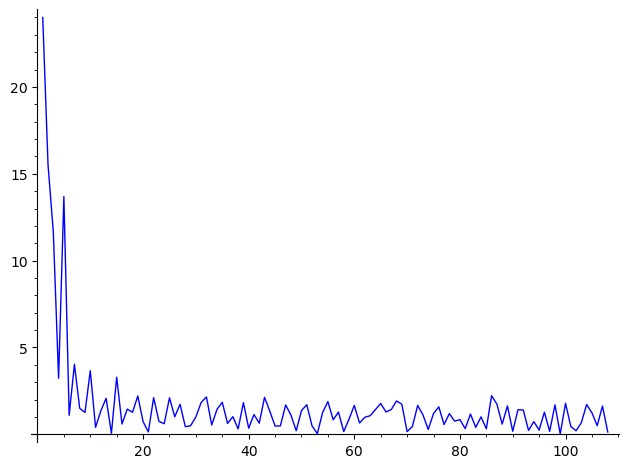

LOGS MINIMUM MODULI


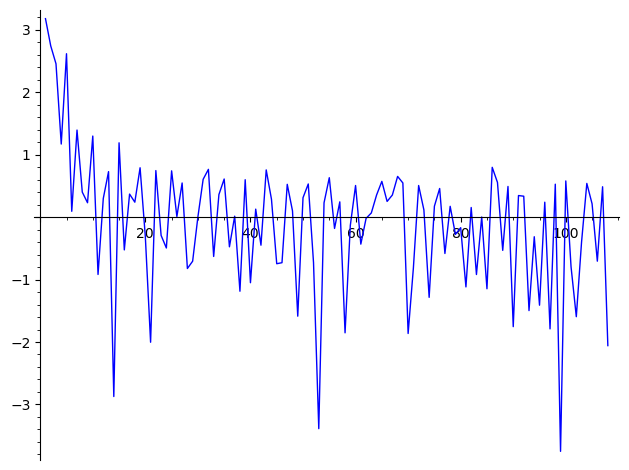

minimum logarithm of minimum modulus: -3.7509437192901918056186845584
MAXIMUM MODULI


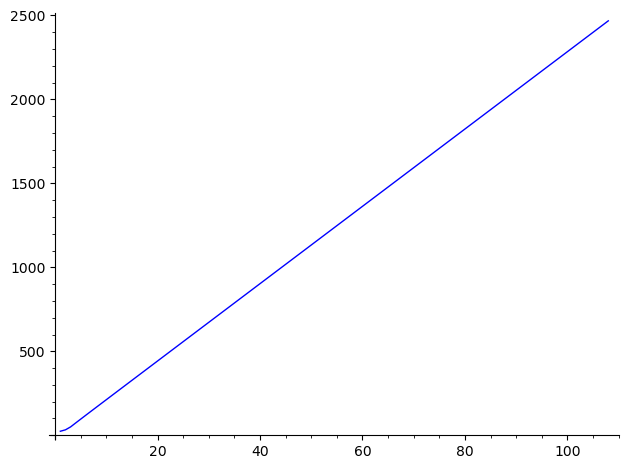

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(109, 0)
MINIMUM MODULI


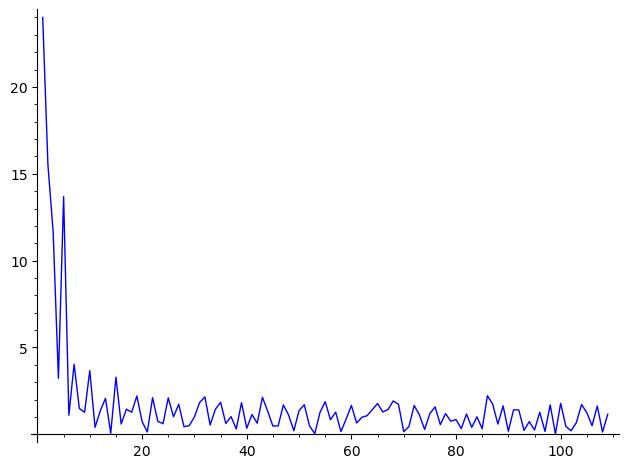

LOGS MINIMUM MODULI


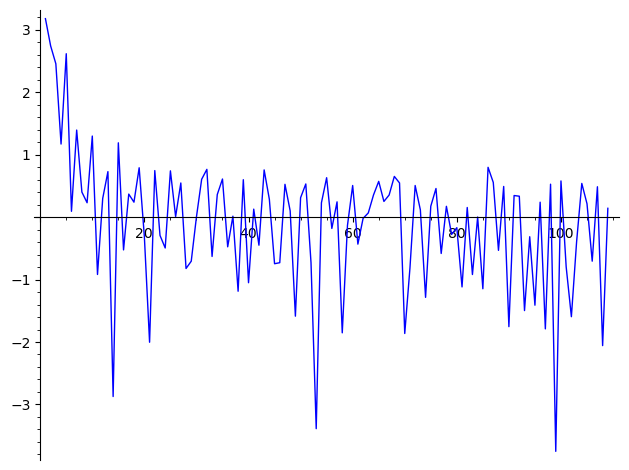

minimum logarithm of minimum modulus: -3.7509437192901918056186845584
MAXIMUM MODULI


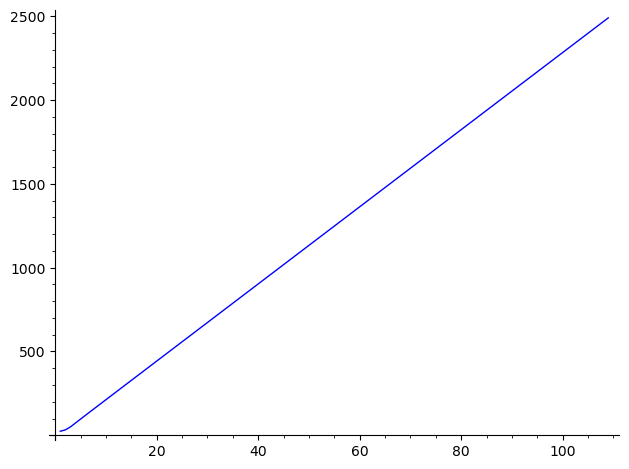

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(110, 0)
MINIMUM MODULI


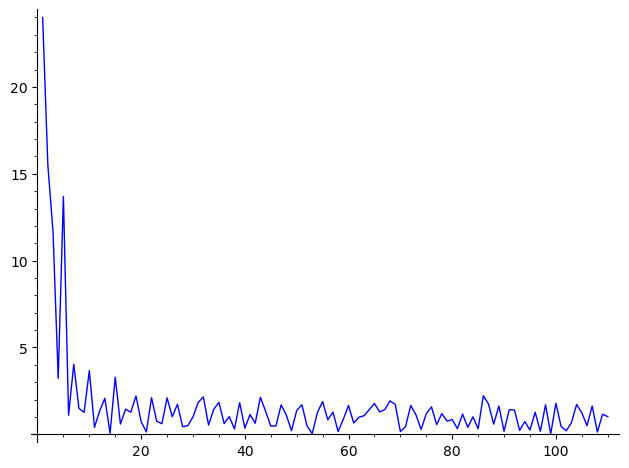

LOGS MINIMUM MODULI


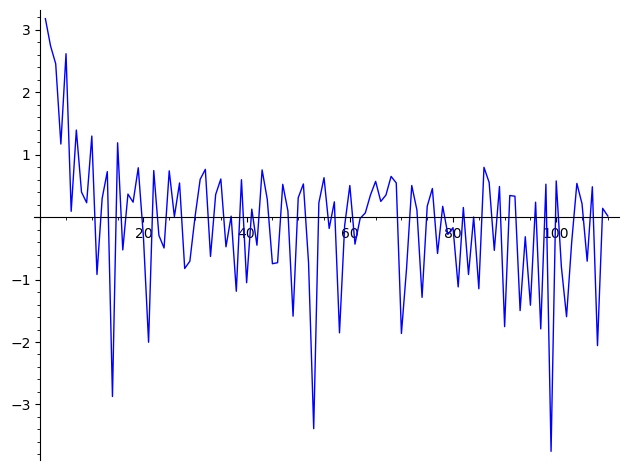

minimum logarithm of minimum modulus: -3.7509437192901918056186845584
MAXIMUM MODULI


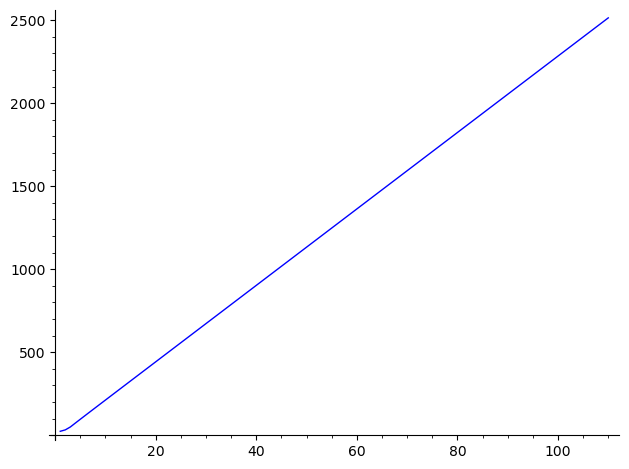

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(111, 0)
MINIMUM MODULI


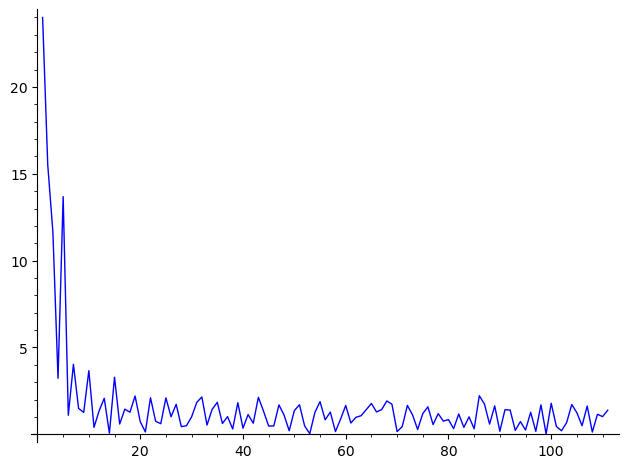

LOGS MINIMUM MODULI


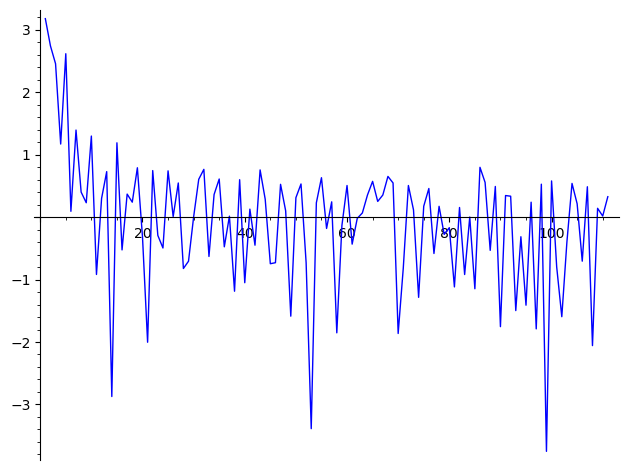

minimum logarithm of minimum modulus: -3.7509437192901918056186845584
MAXIMUM MODULI


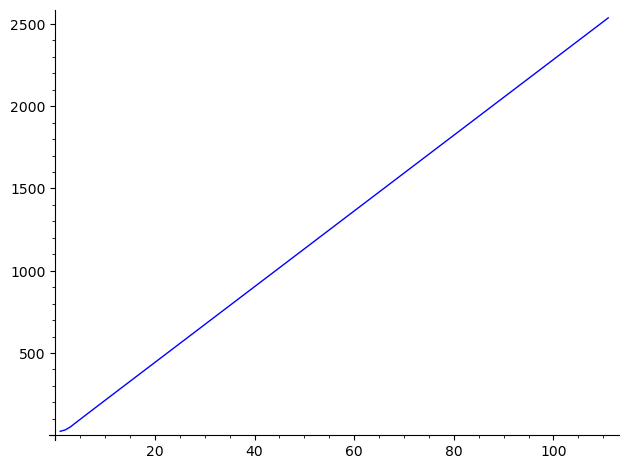

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(112, 0)
MINIMUM MODULI


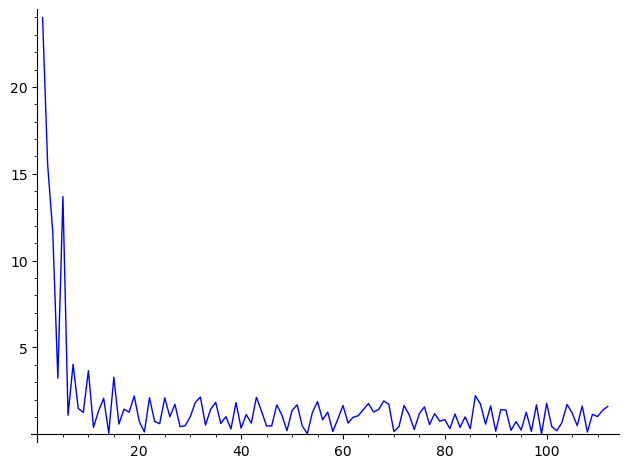

LOGS MINIMUM MODULI


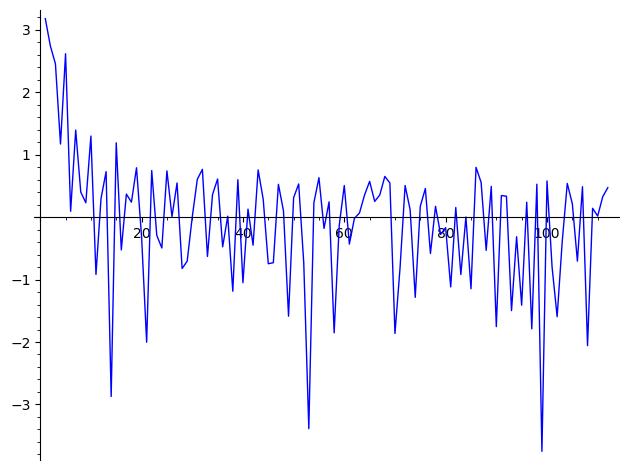

minimum logarithm of minimum modulus: -3.7509437192901918056186845584
MAXIMUM MODULI


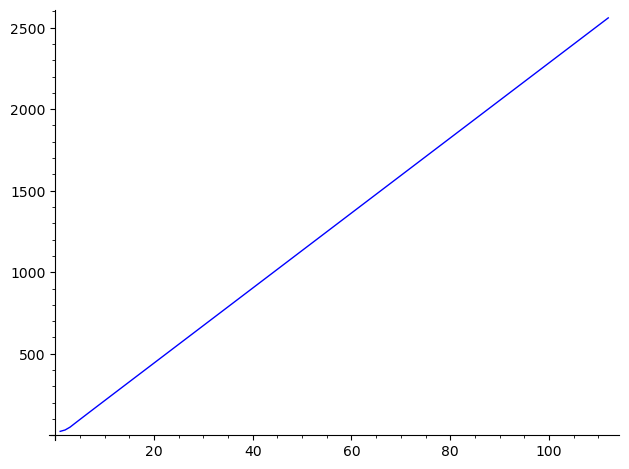

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(113, 0)
MINIMUM MODULI


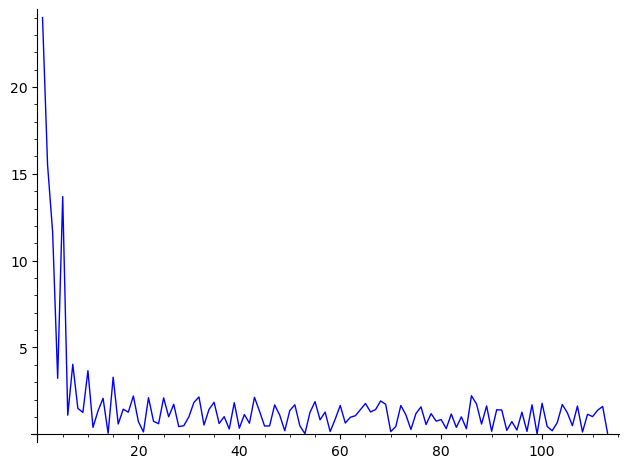

LOGS MINIMUM MODULI


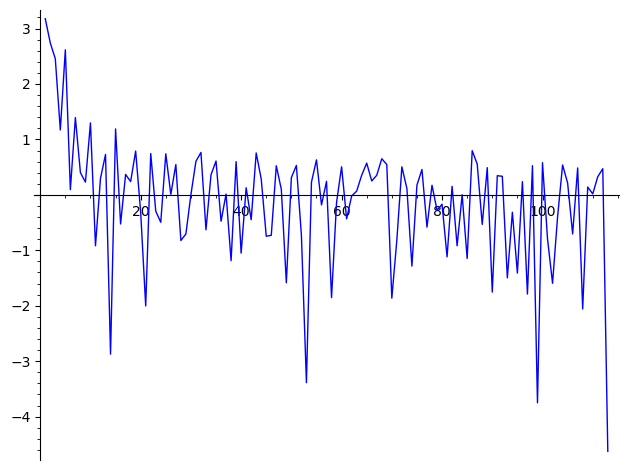

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


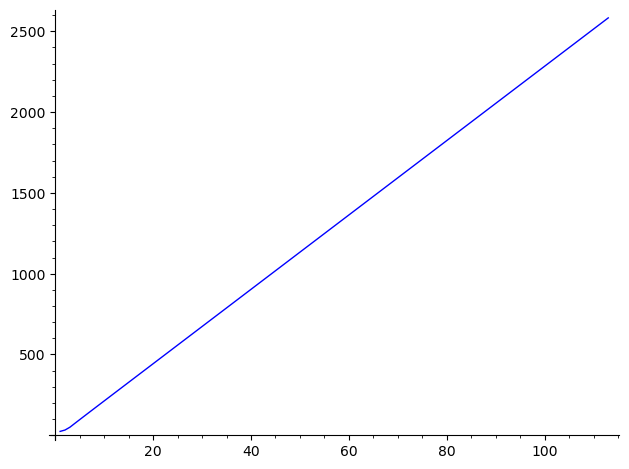

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(114, 0)
MINIMUM MODULI


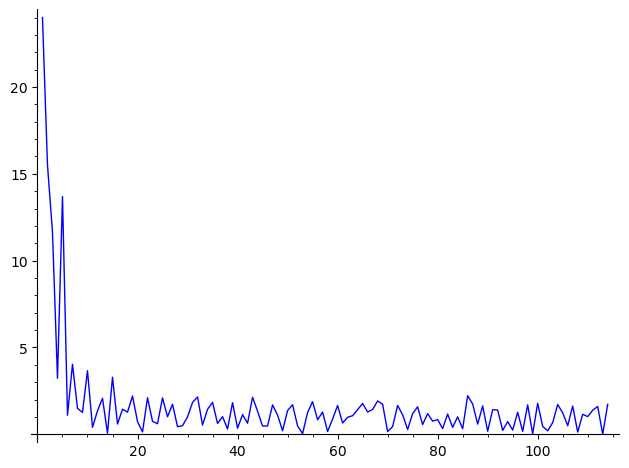

LOGS MINIMUM MODULI


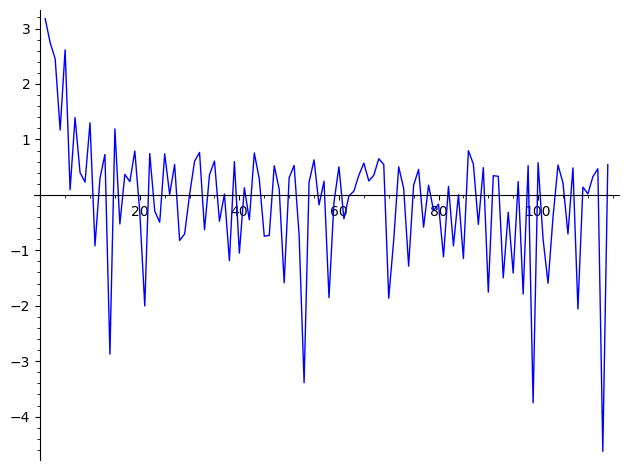

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


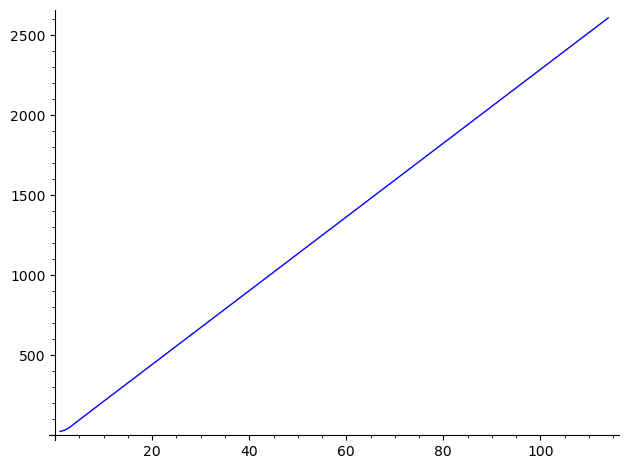

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(115, 0)
MINIMUM MODULI


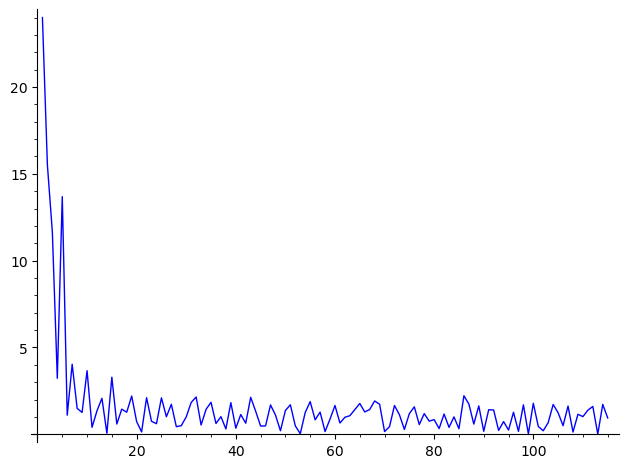

LOGS MINIMUM MODULI


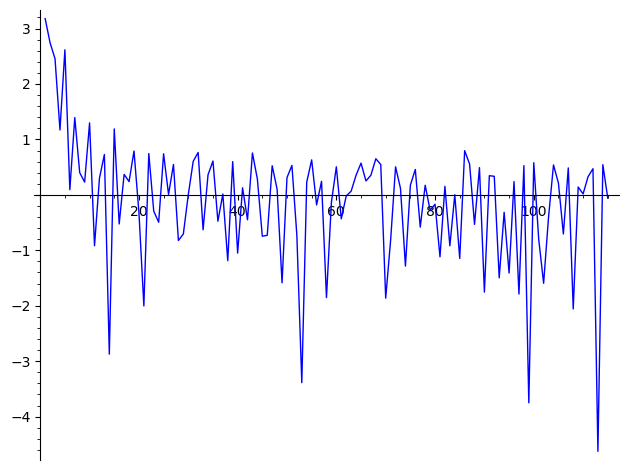

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


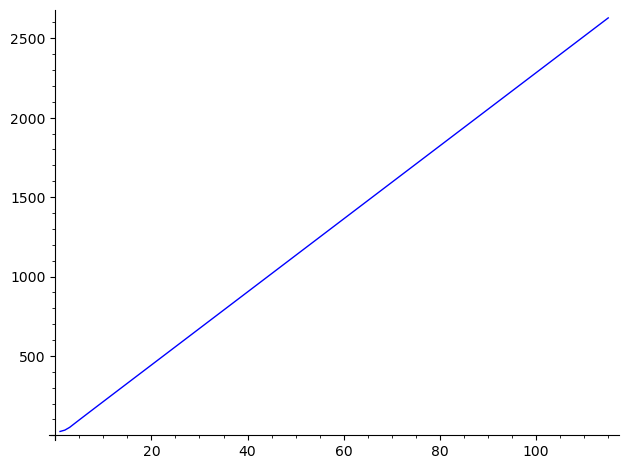

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(116, 0)
MINIMUM MODULI


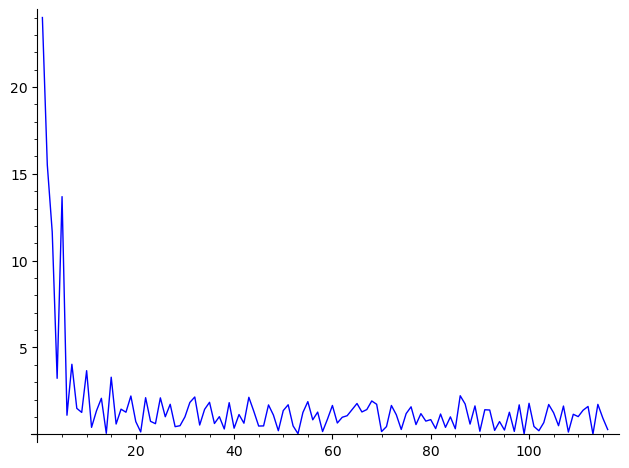

LOGS MINIMUM MODULI


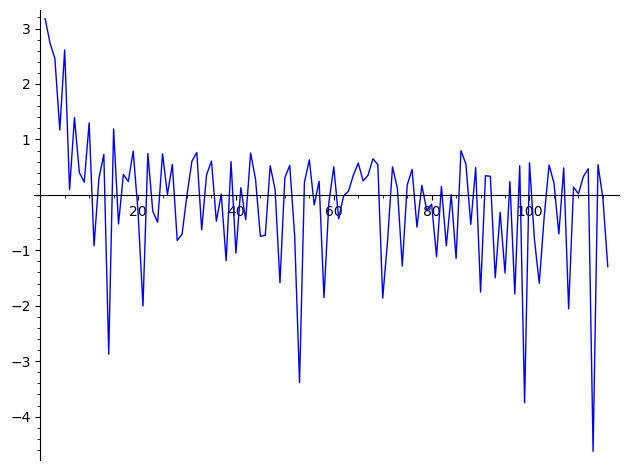

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


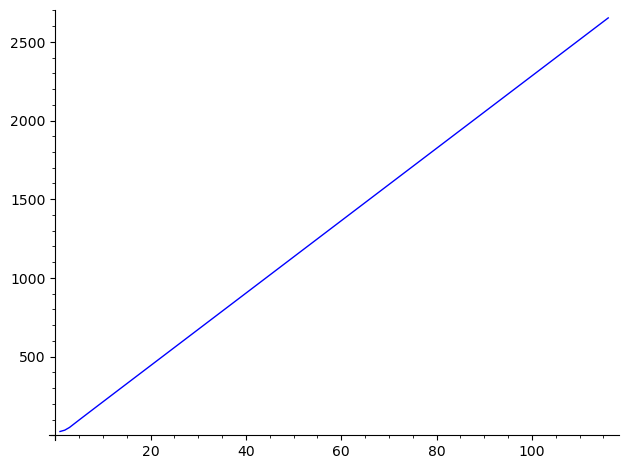

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(117, 0)
MINIMUM MODULI


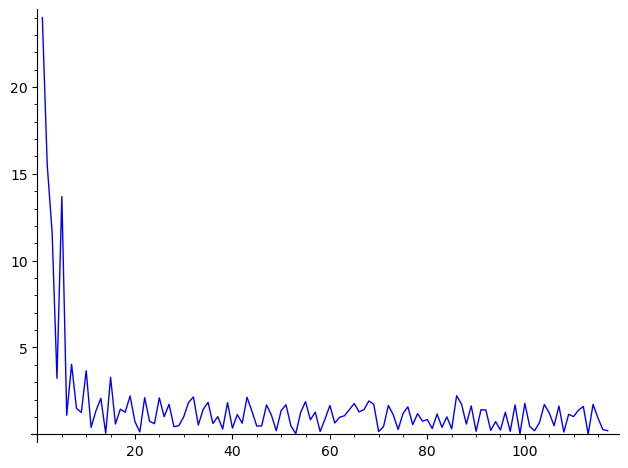

LOGS MINIMUM MODULI


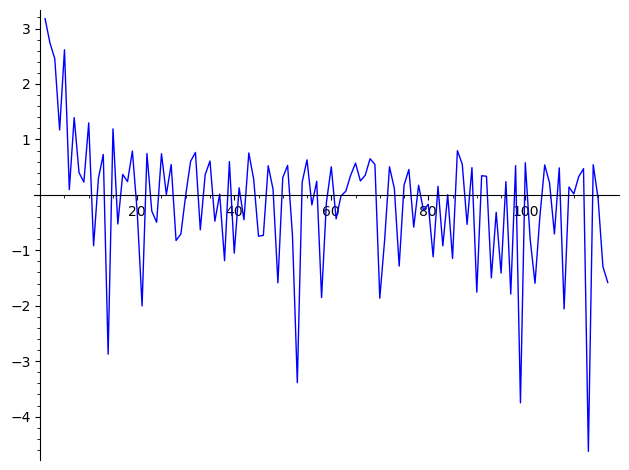

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


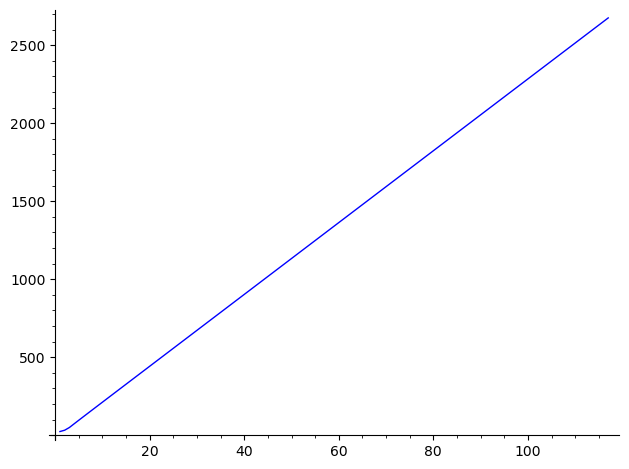

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(118, 0)
MINIMUM MODULI


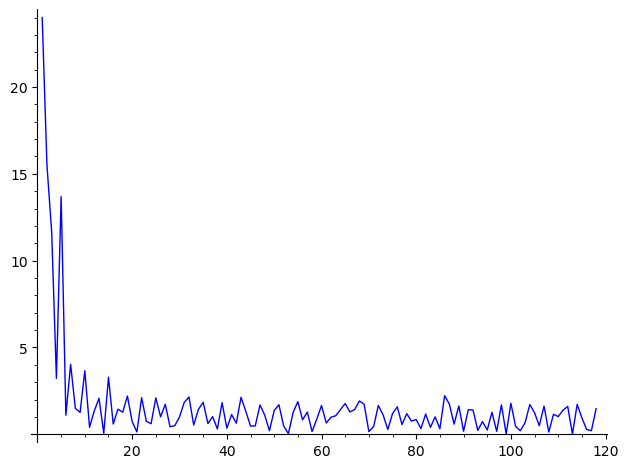

LOGS MINIMUM MODULI


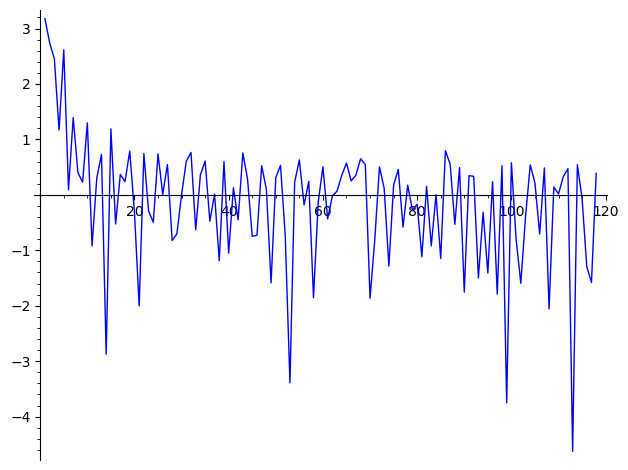

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


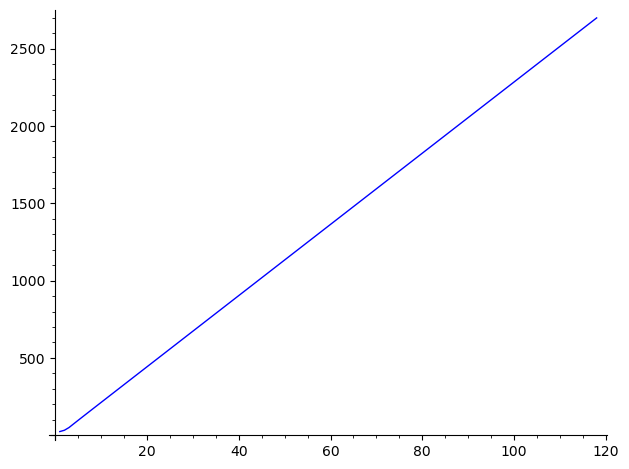

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(119, 0)
MINIMUM MODULI


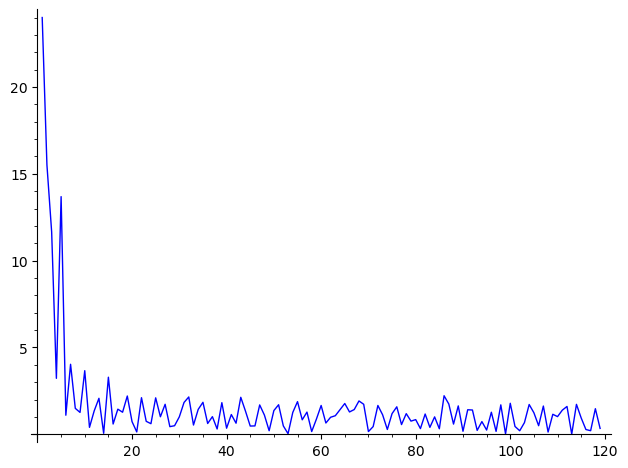

LOGS MINIMUM MODULI


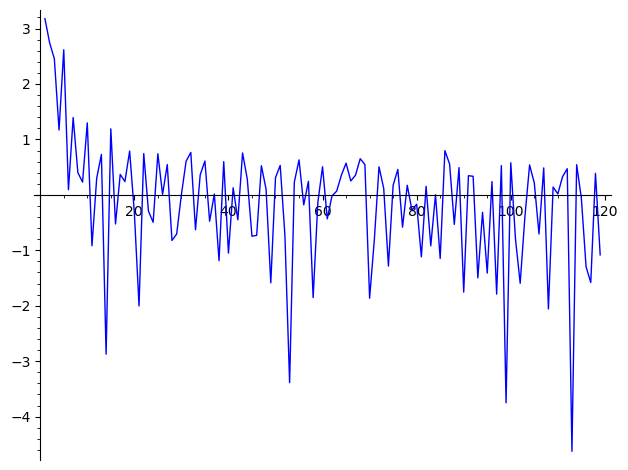

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


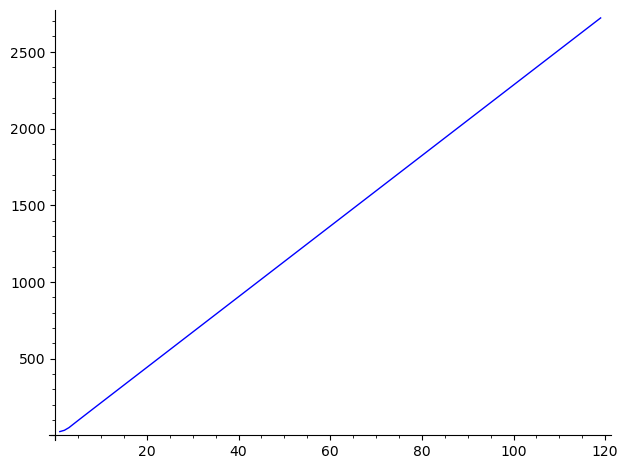

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(120, 0)
MINIMUM MODULI


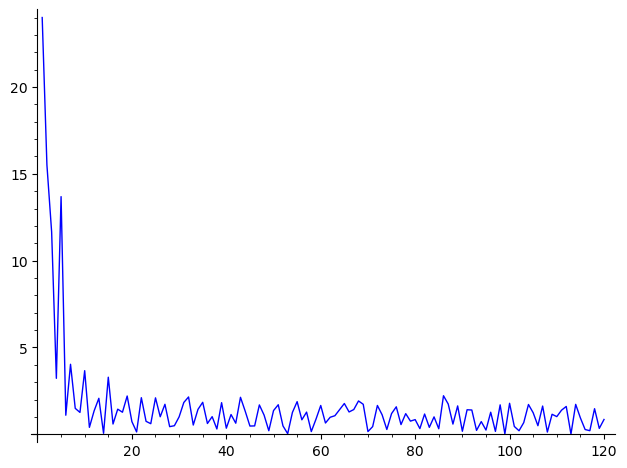

LOGS MINIMUM MODULI


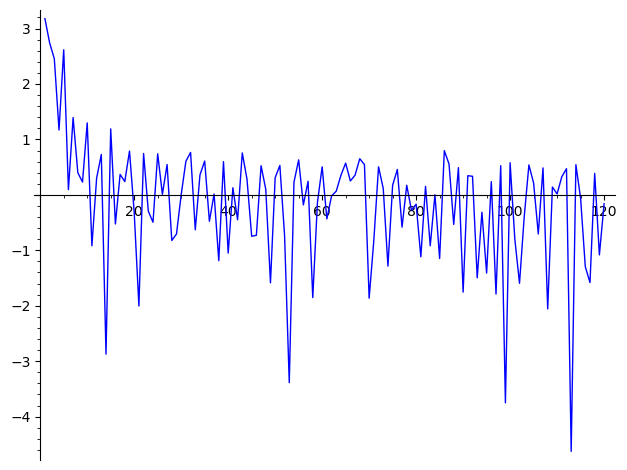

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


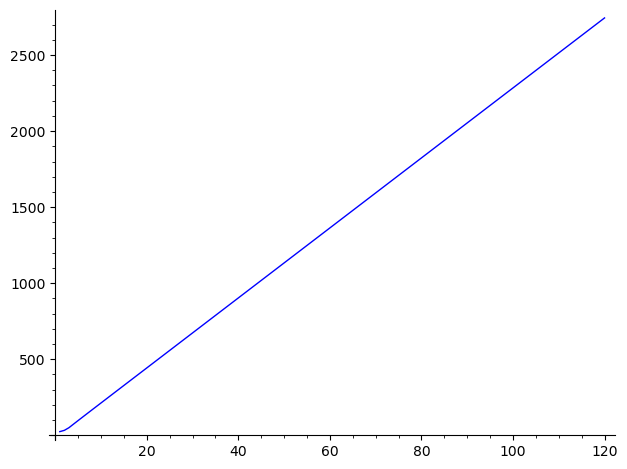

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(121, 0)
MINIMUM MODULI


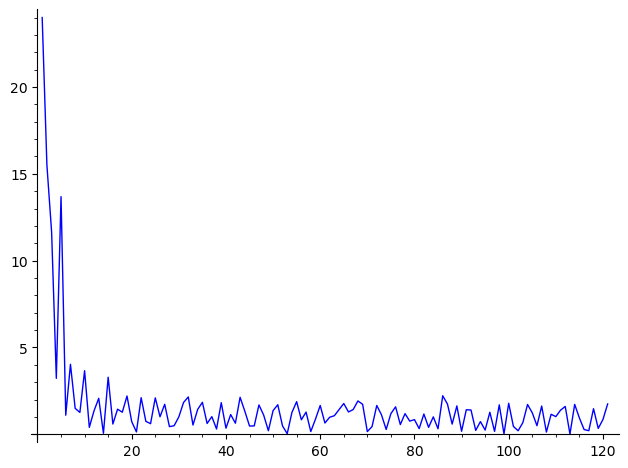

LOGS MINIMUM MODULI


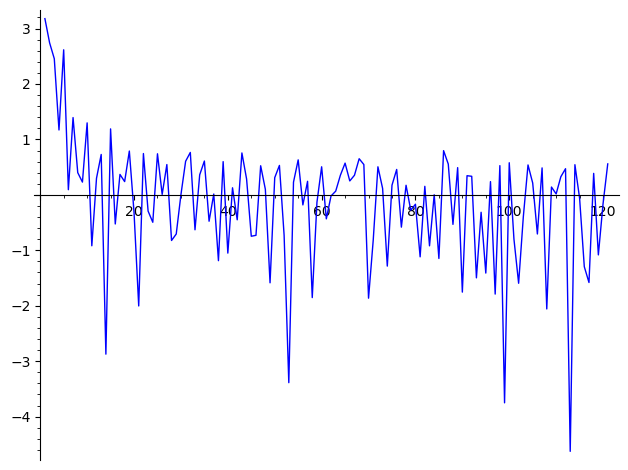

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


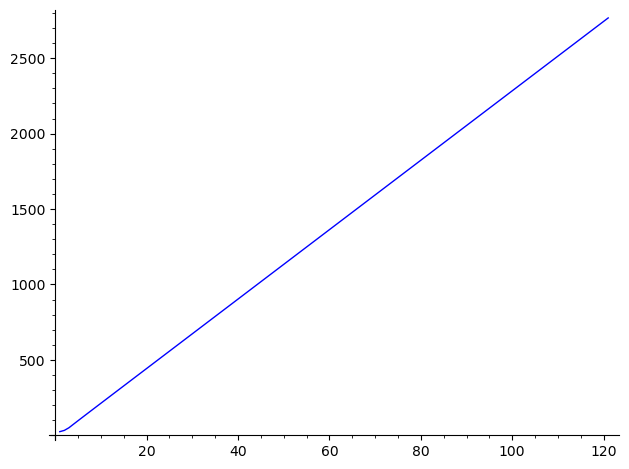

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(122, 0)
MINIMUM MODULI


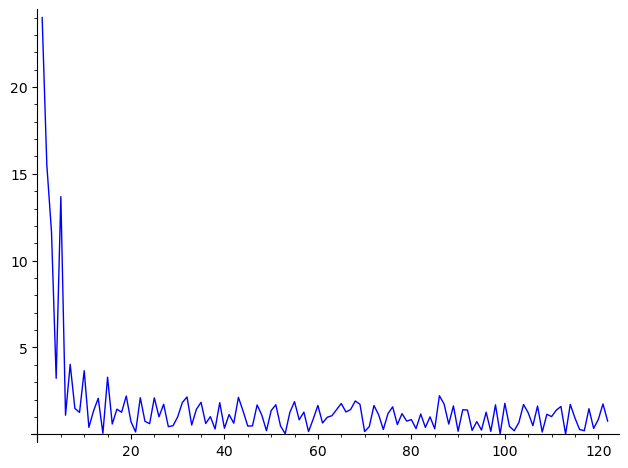

LOGS MINIMUM MODULI


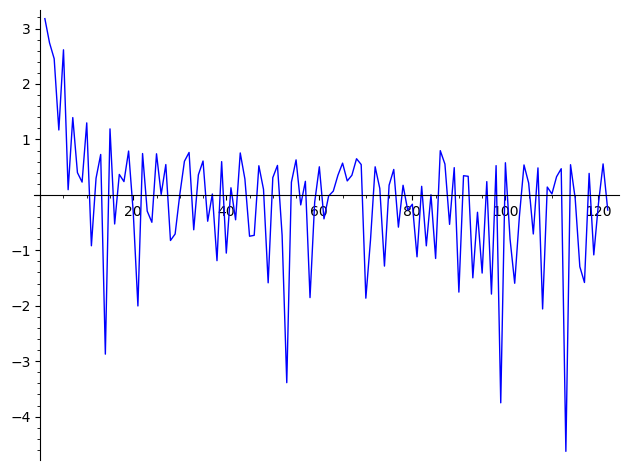

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


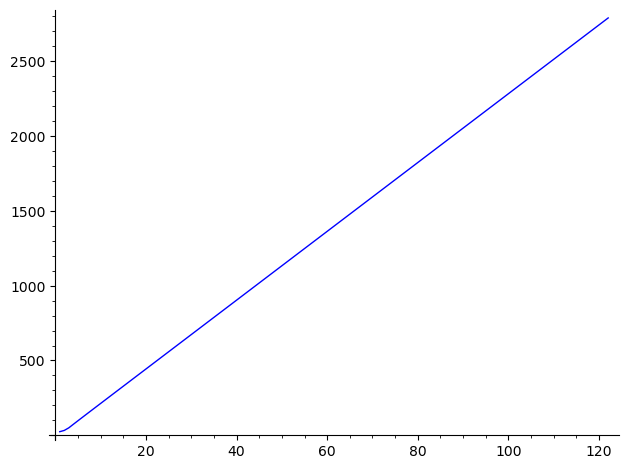

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(123, 0)
MINIMUM MODULI


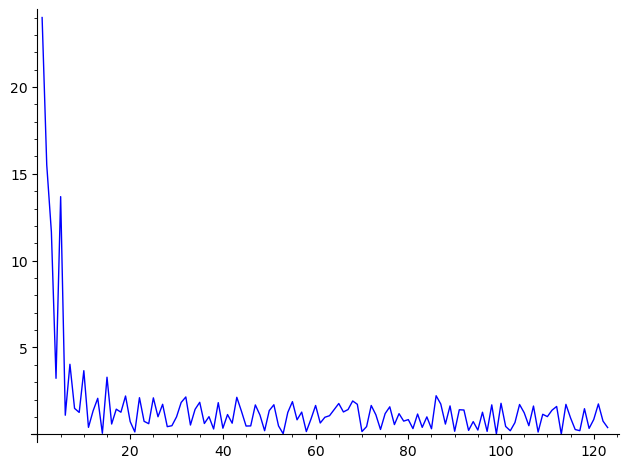

LOGS MINIMUM MODULI


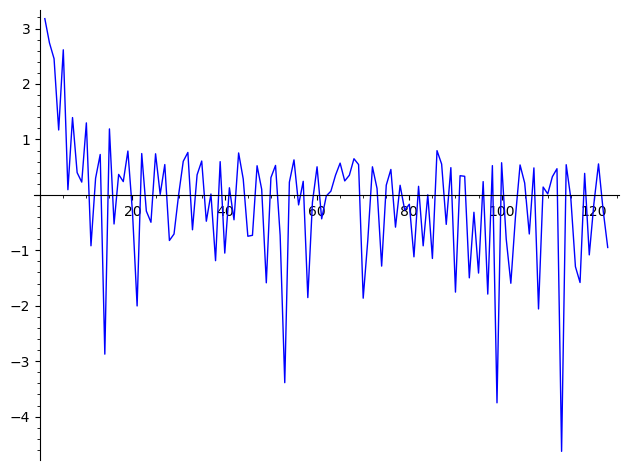

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


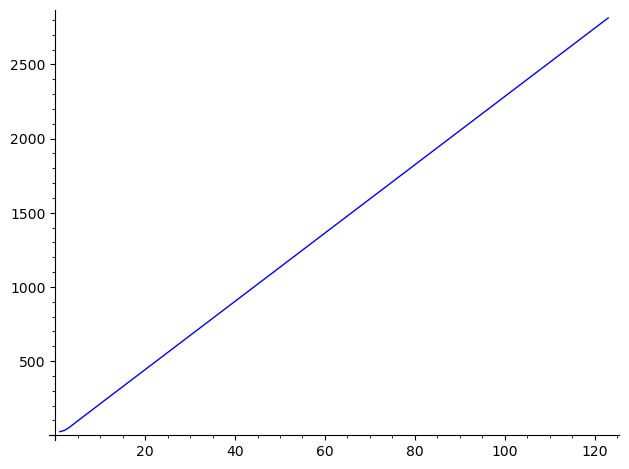

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(124, 0)
MINIMUM MODULI


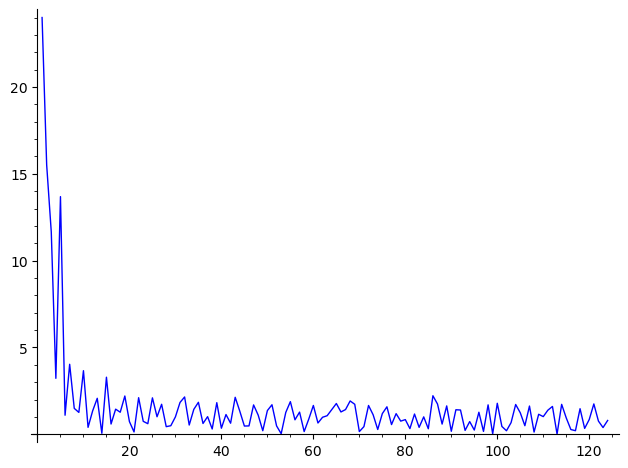

LOGS MINIMUM MODULI


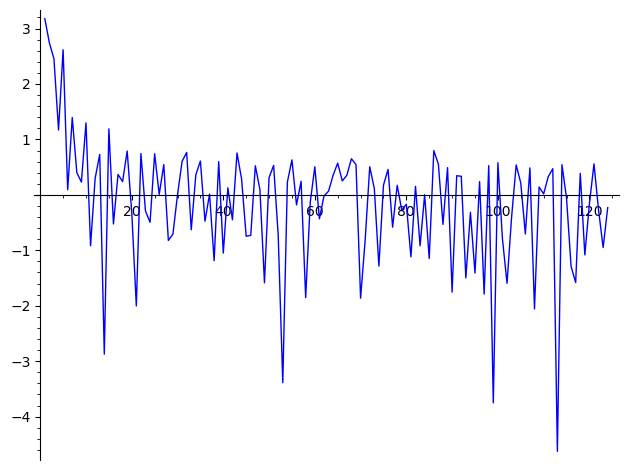

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


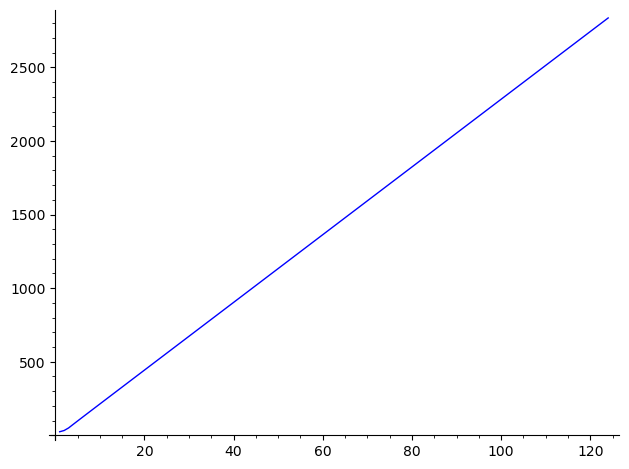

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(125, 0)
MINIMUM MODULI


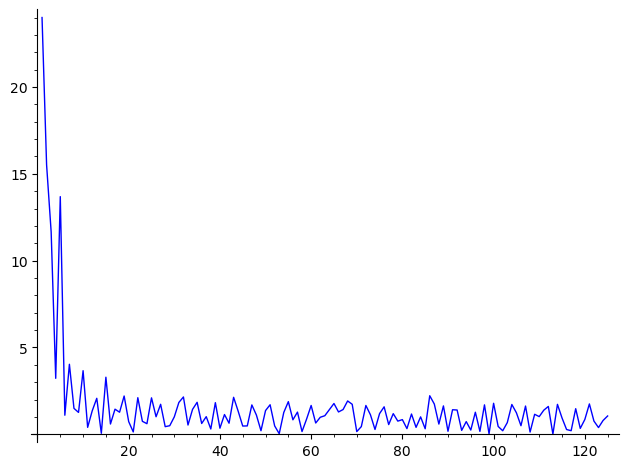

LOGS MINIMUM MODULI


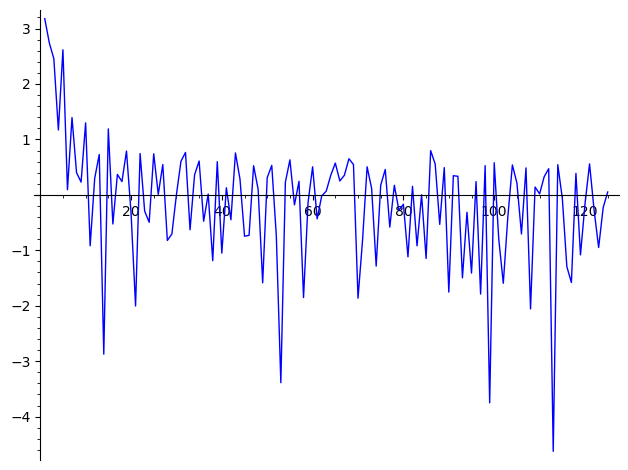

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


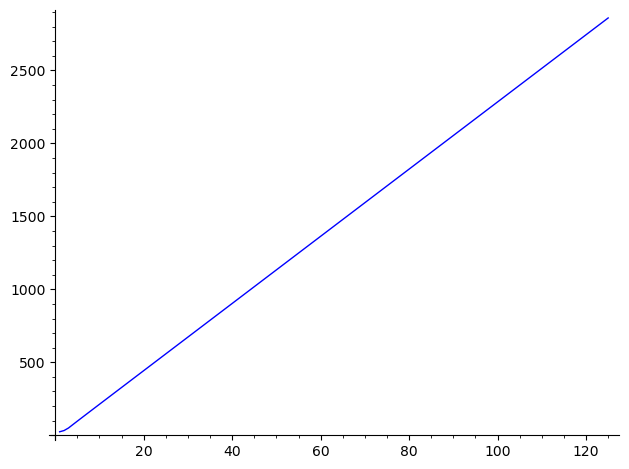

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(126, 0)
MINIMUM MODULI


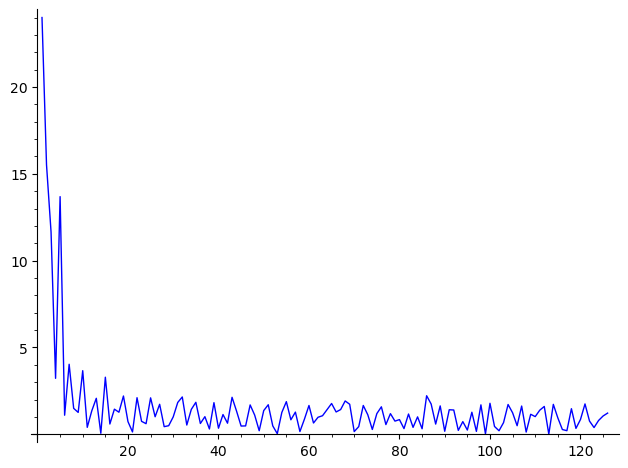

LOGS MINIMUM MODULI


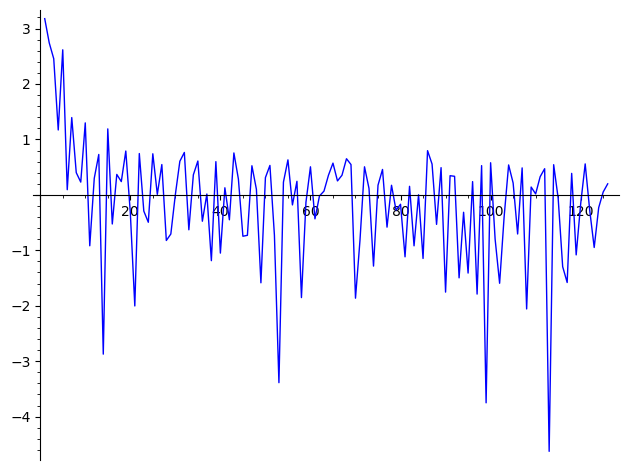

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


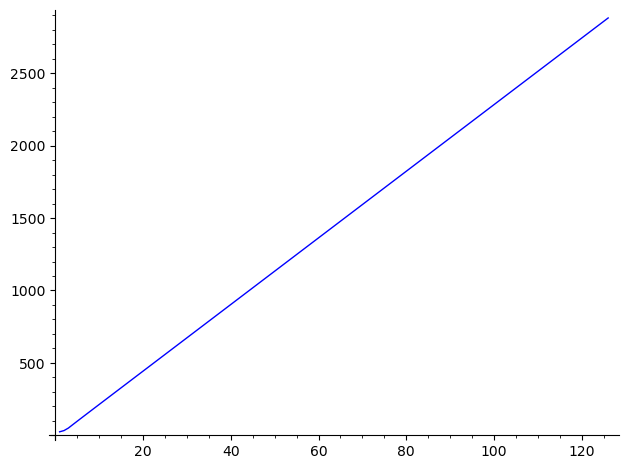

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(127, 0)
MINIMUM MODULI


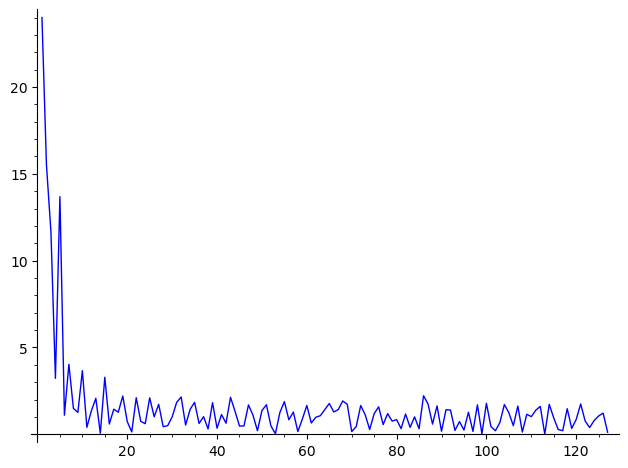

LOGS MINIMUM MODULI


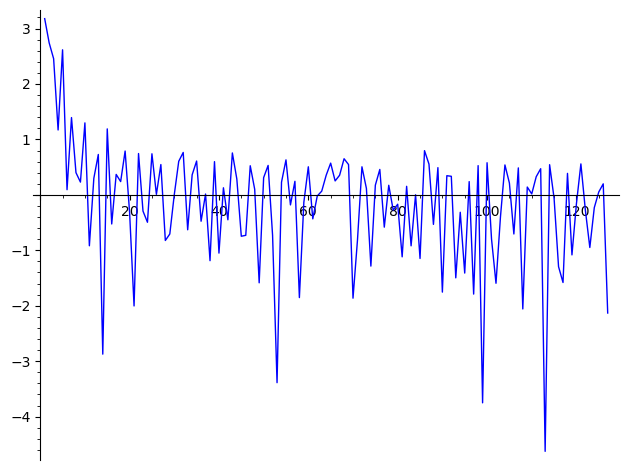

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


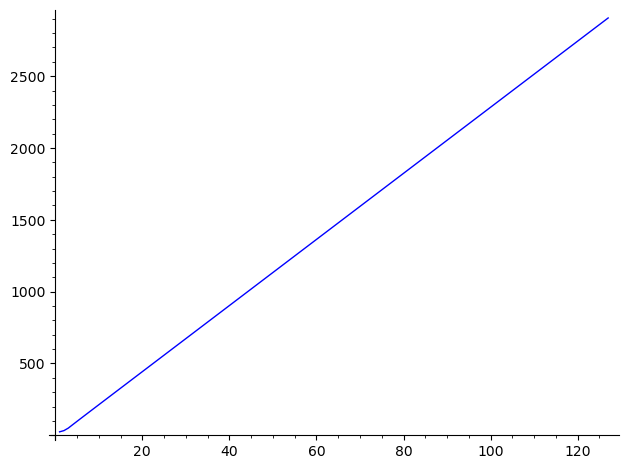

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(128, 0)
MINIMUM MODULI


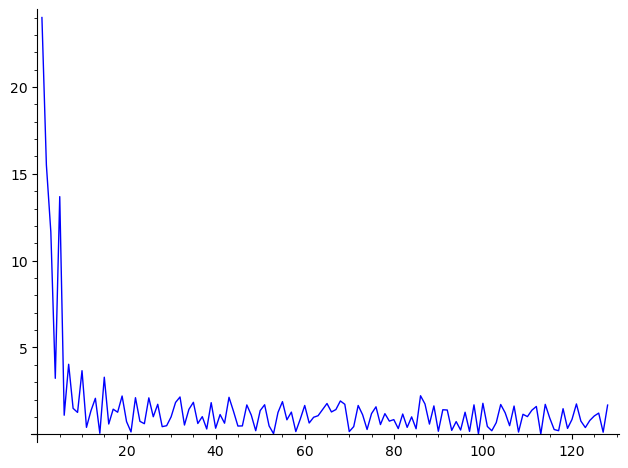

LOGS MINIMUM MODULI


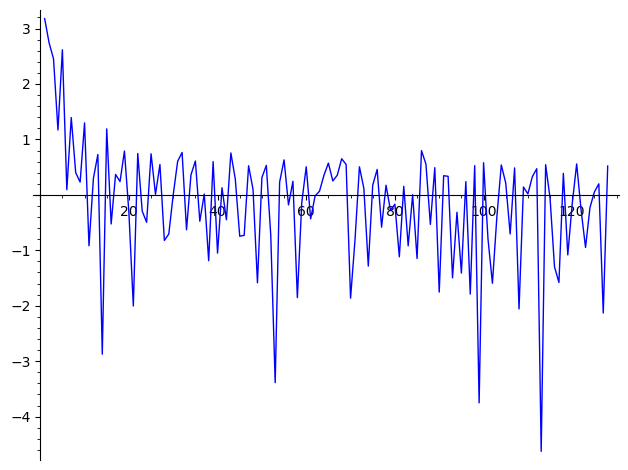

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


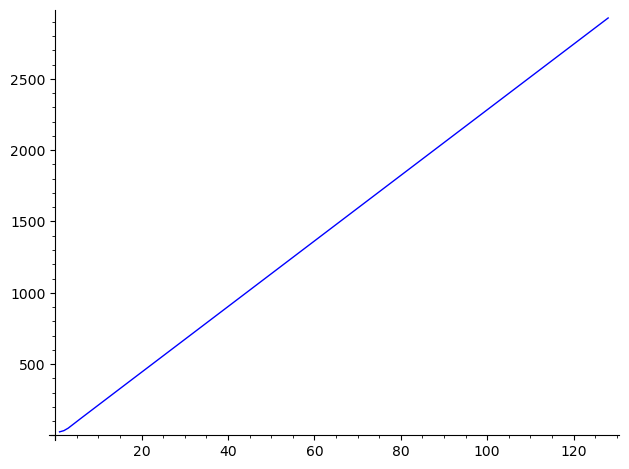

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(129, 0)
MINIMUM MODULI


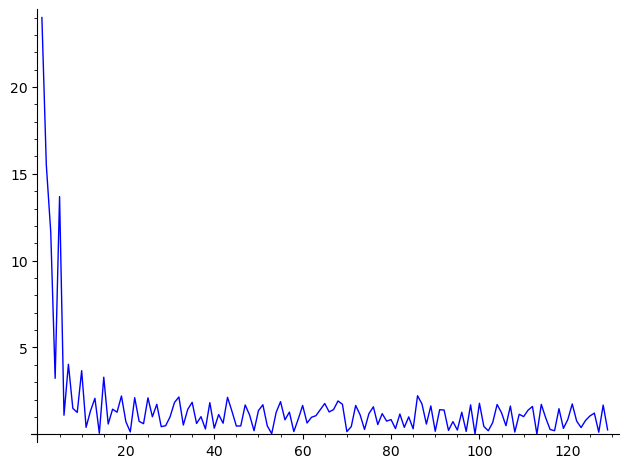

LOGS MINIMUM MODULI


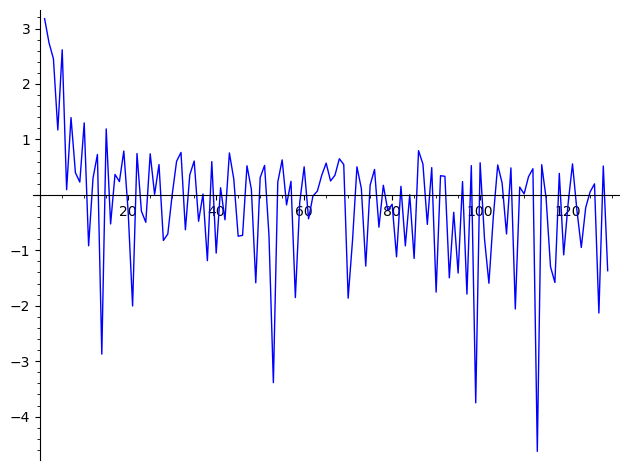

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


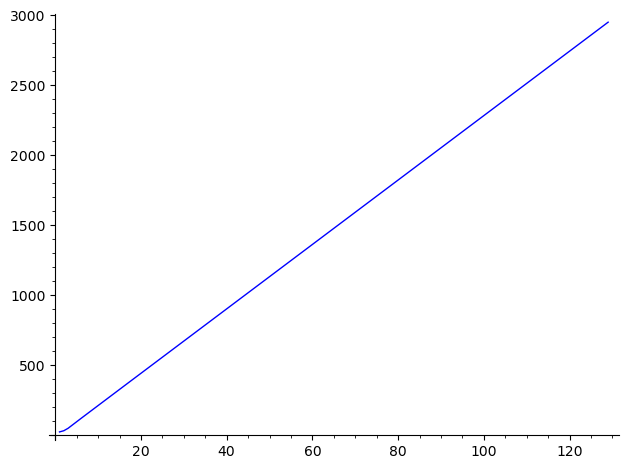

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(130, 0)
MINIMUM MODULI


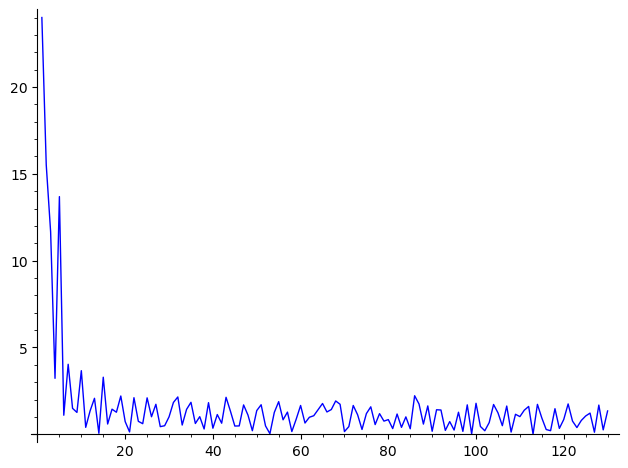

LOGS MINIMUM MODULI


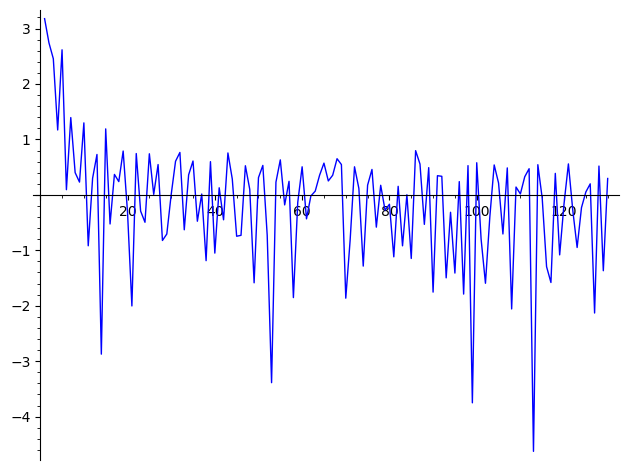

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


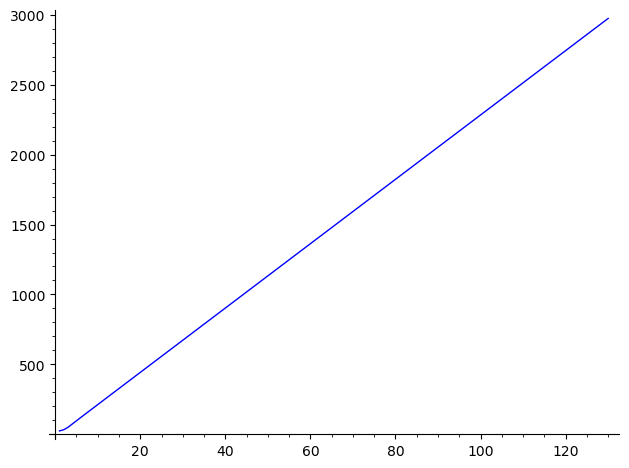

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(131, 0)
MINIMUM MODULI


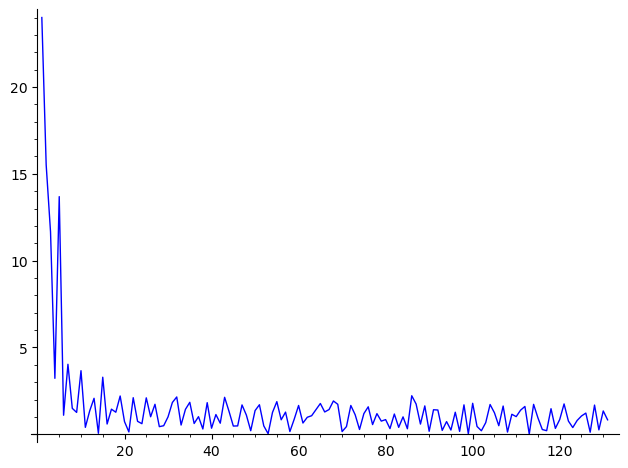

LOGS MINIMUM MODULI


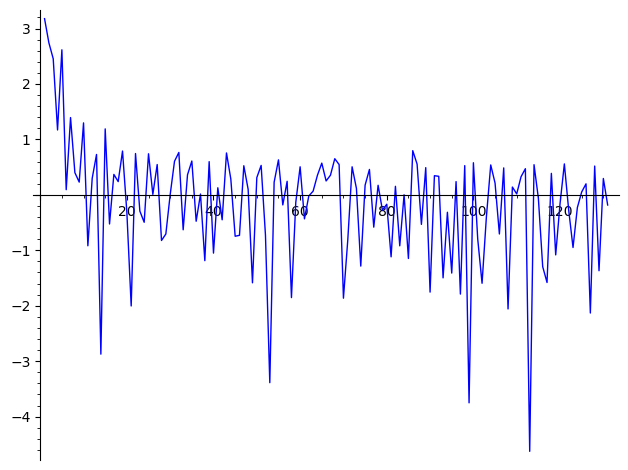

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


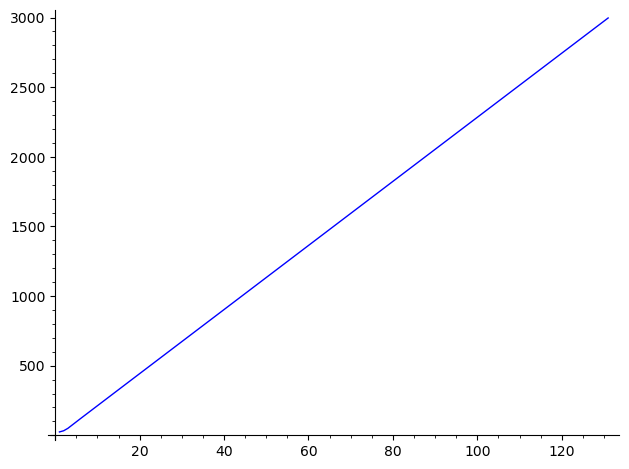

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(132, 0)
MINIMUM MODULI


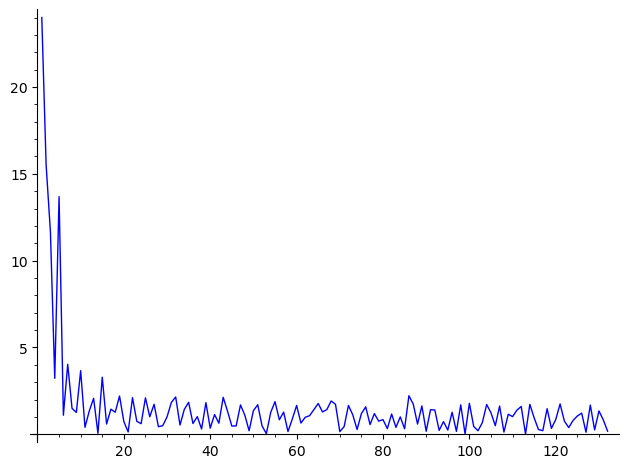

LOGS MINIMUM MODULI


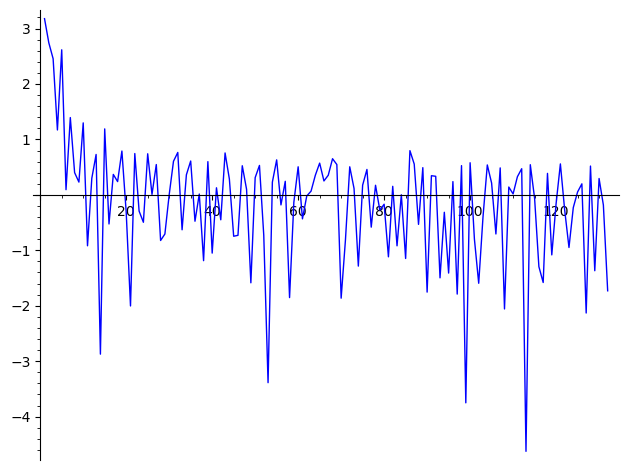

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


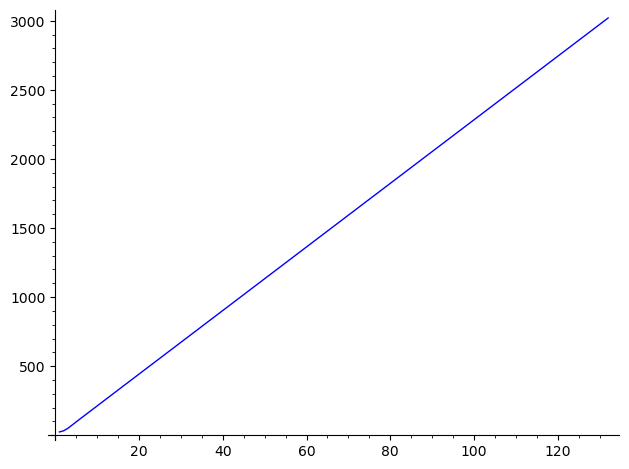

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(133, 0)
MINIMUM MODULI


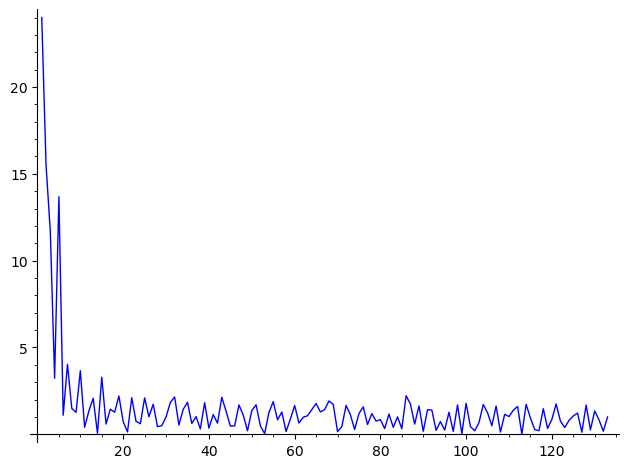

LOGS MINIMUM MODULI


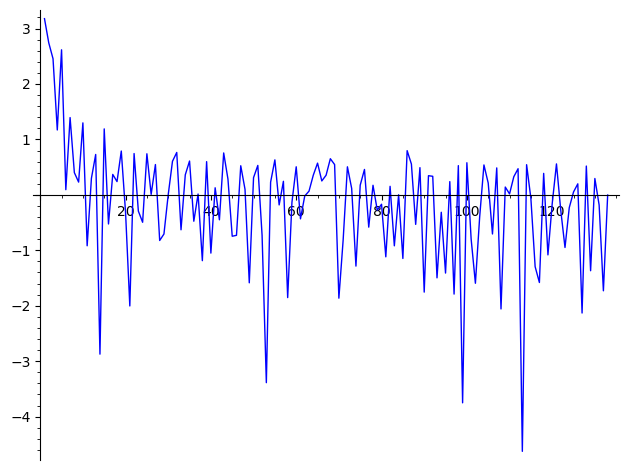

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


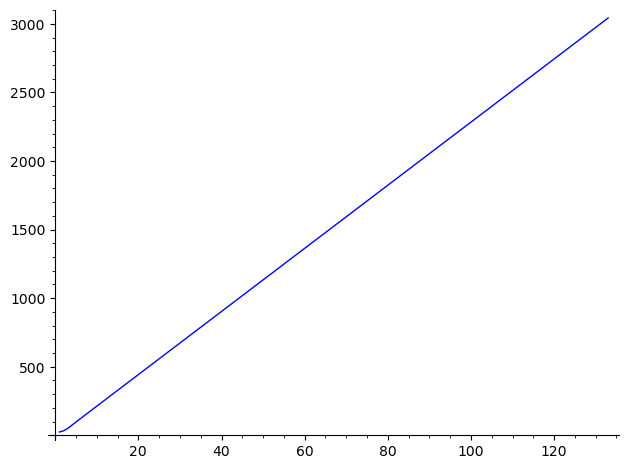

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(134, 0)
MINIMUM MODULI


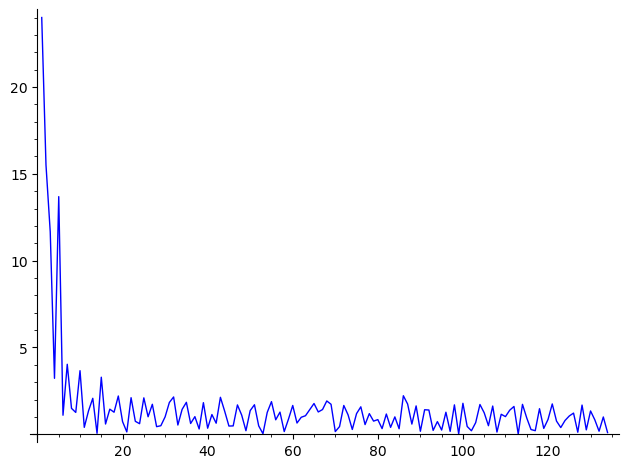

LOGS MINIMUM MODULI


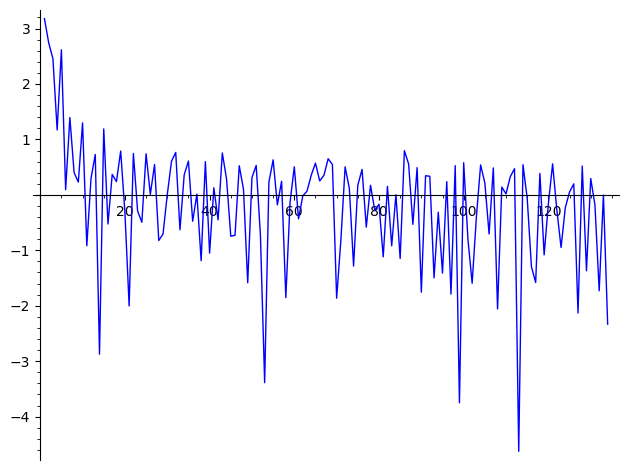

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


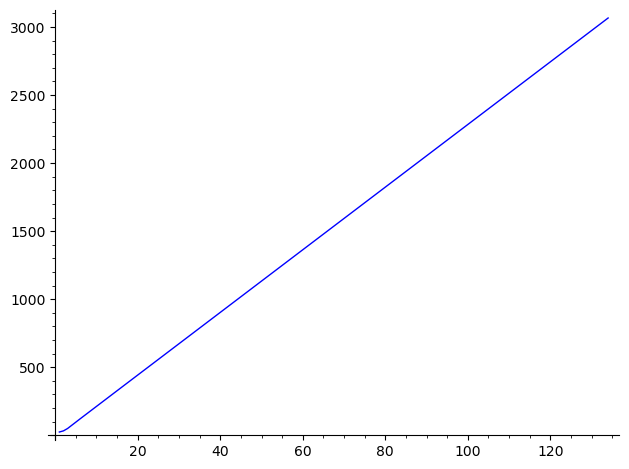

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(135, 0)
MINIMUM MODULI


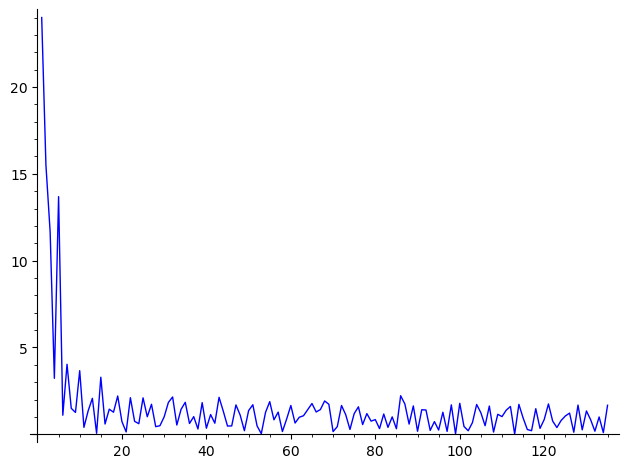

LOGS MINIMUM MODULI


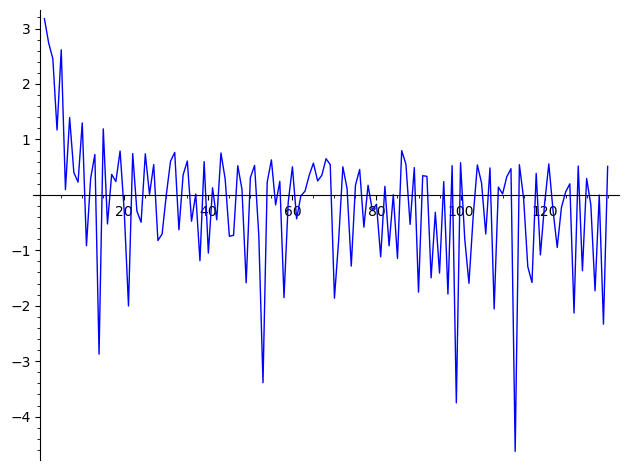

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


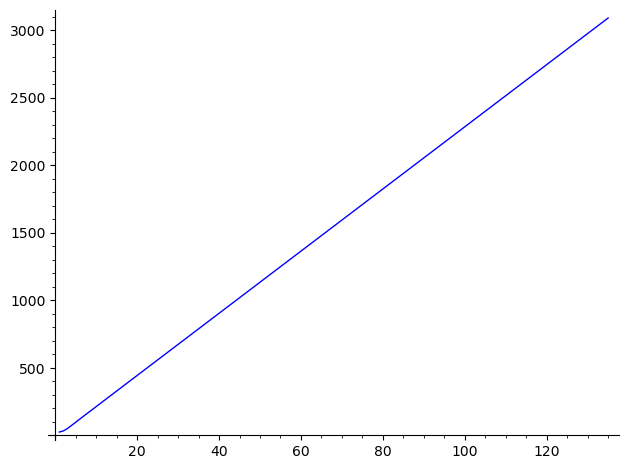

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(136, 0)
MINIMUM MODULI


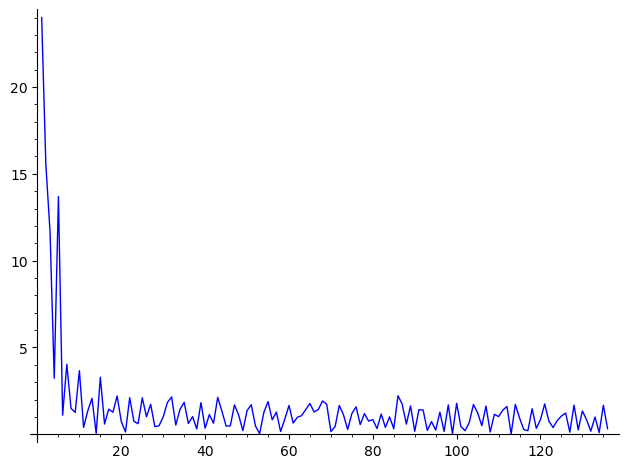

LOGS MINIMUM MODULI


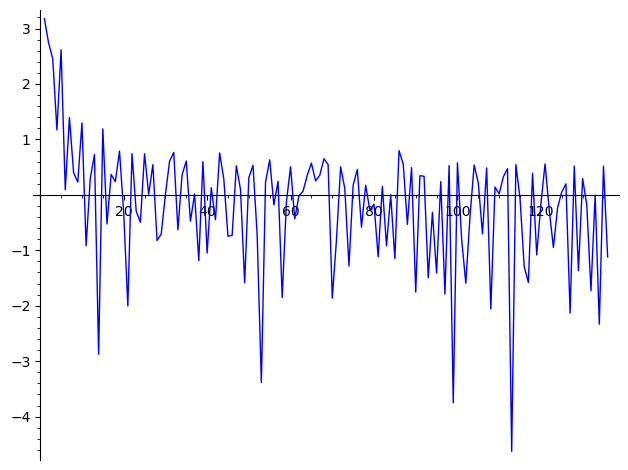

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


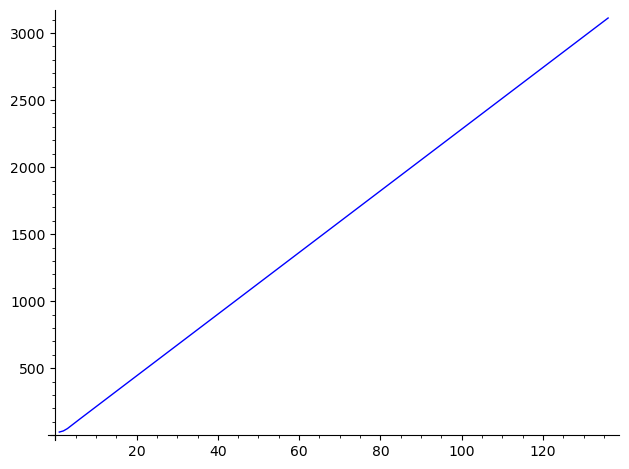

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(137, 0)
MINIMUM MODULI


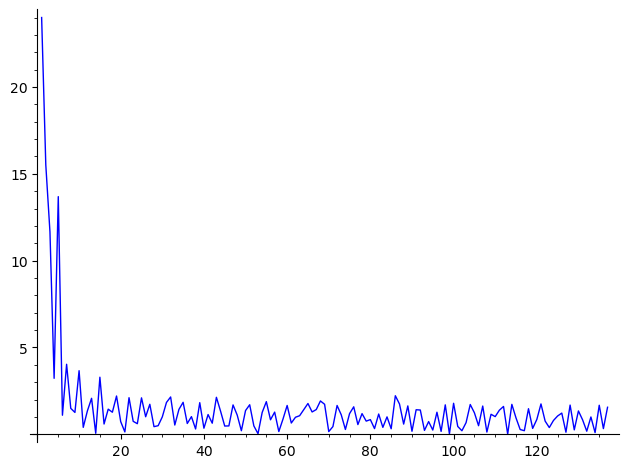

LOGS MINIMUM MODULI


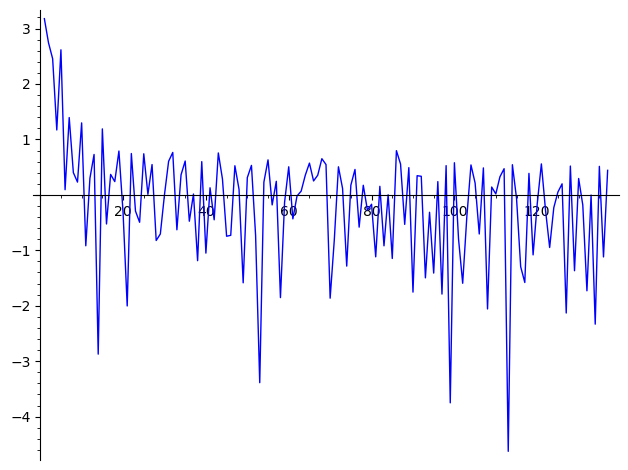

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


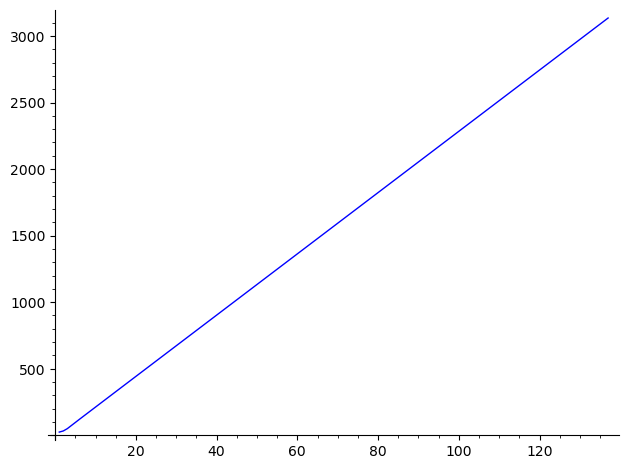

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(138, 0)
MINIMUM MODULI


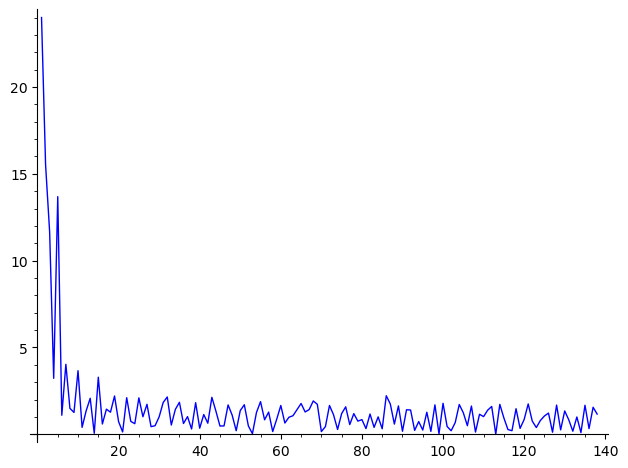

LOGS MINIMUM MODULI


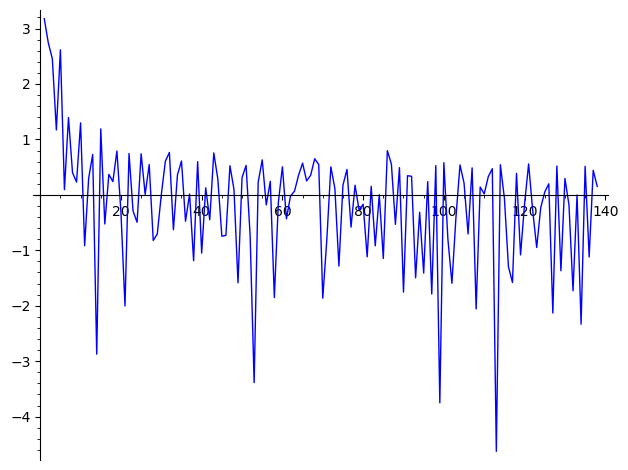

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


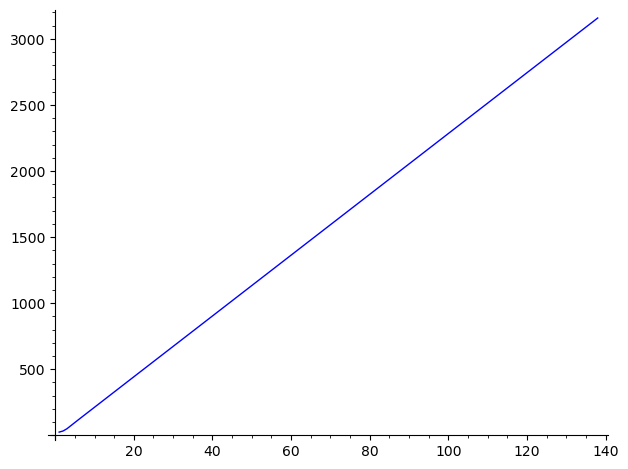

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(139, 0)
MINIMUM MODULI


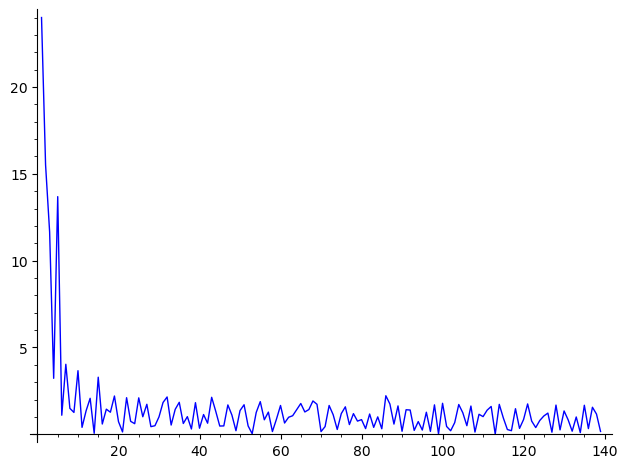

LOGS MINIMUM MODULI


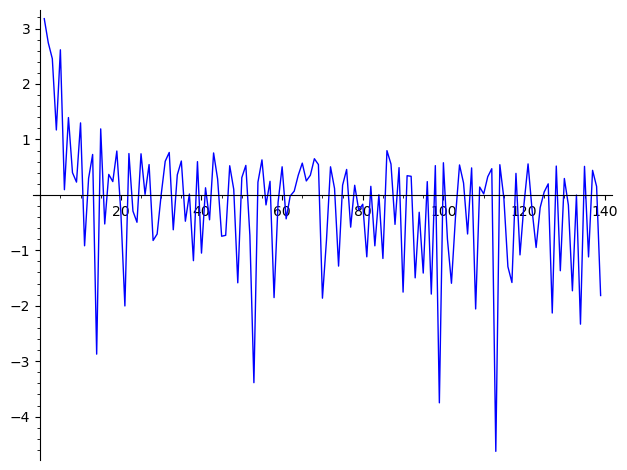

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


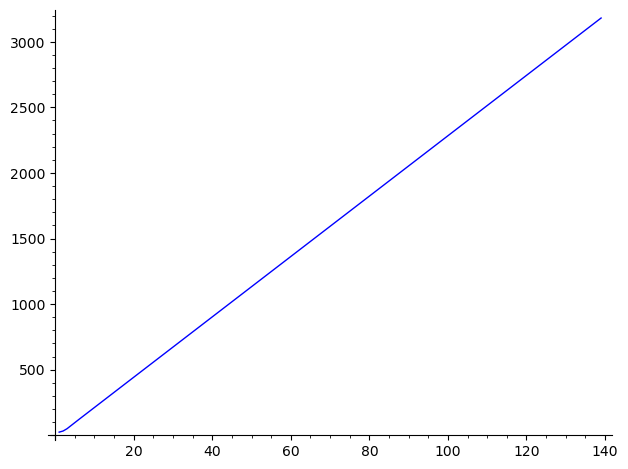

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(140, 0)
MINIMUM MODULI


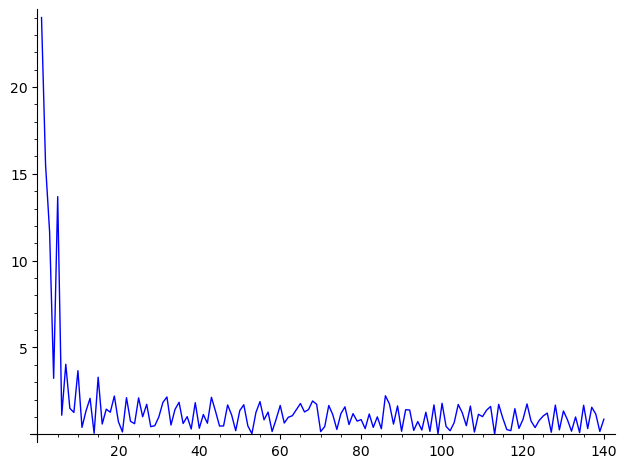

LOGS MINIMUM MODULI


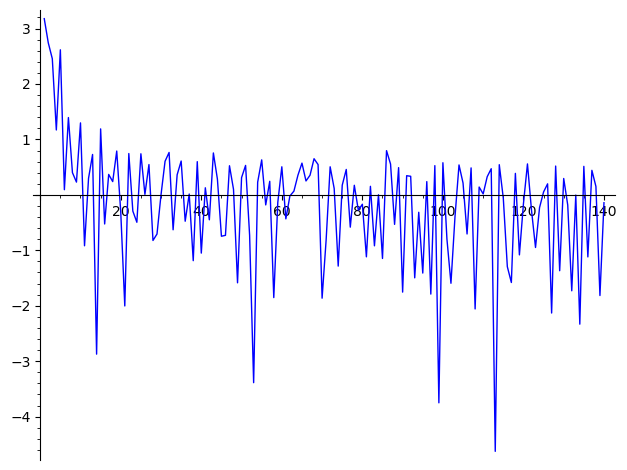

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


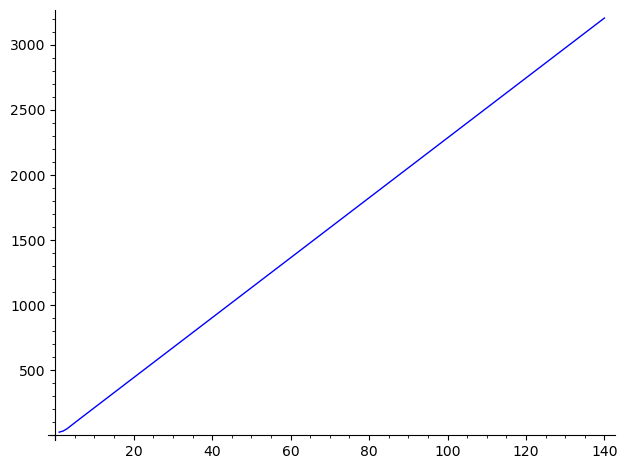

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(141, 0)
MINIMUM MODULI


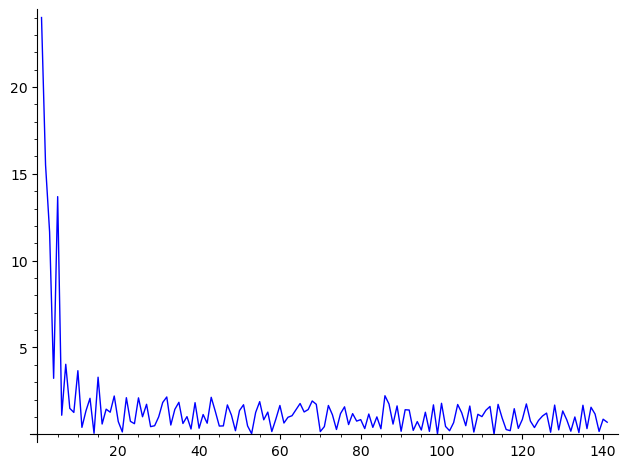

LOGS MINIMUM MODULI


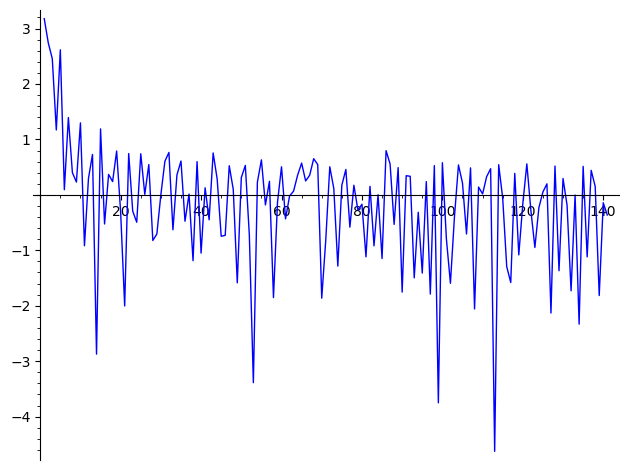

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


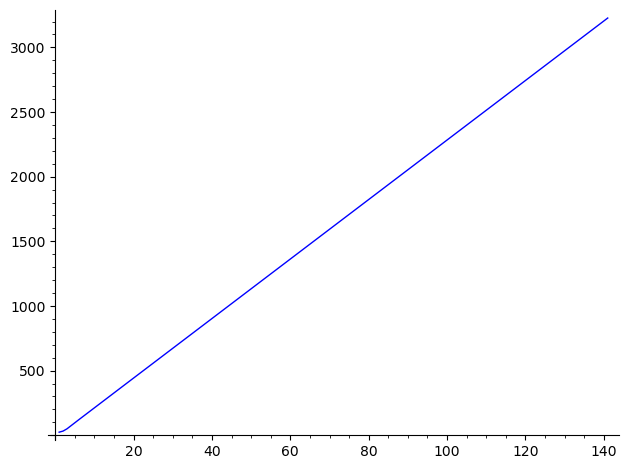

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(142, 0)
MINIMUM MODULI


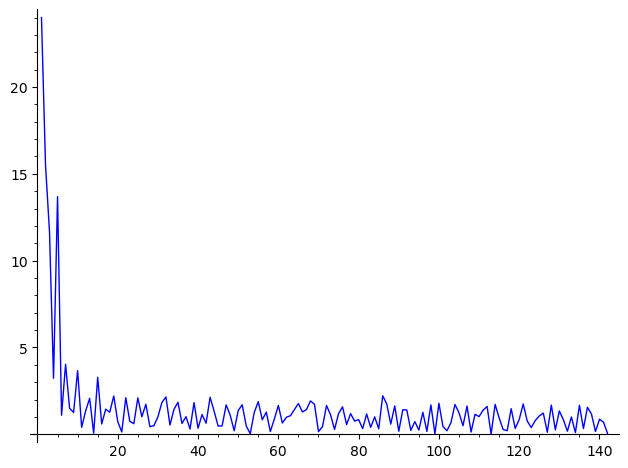

LOGS MINIMUM MODULI


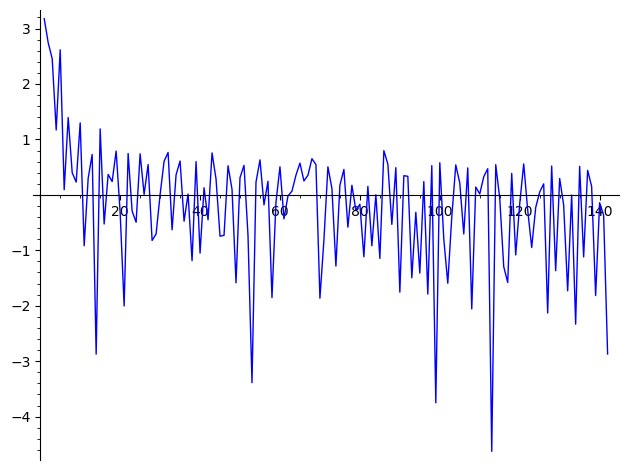

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


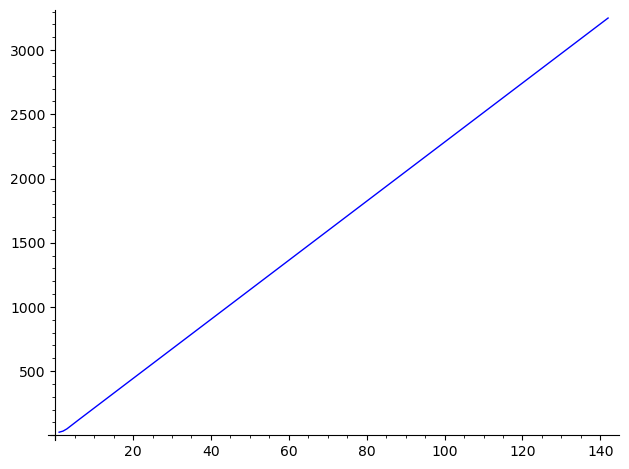

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(143, 0)
MINIMUM MODULI


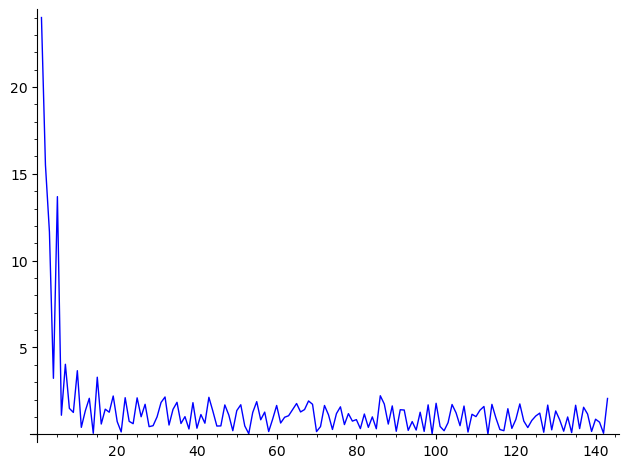

LOGS MINIMUM MODULI


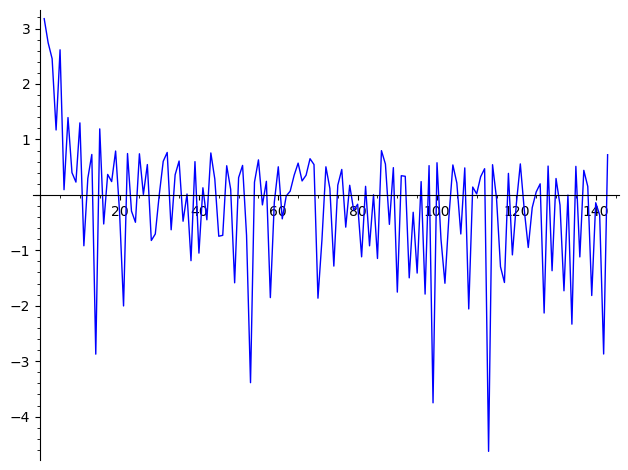

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


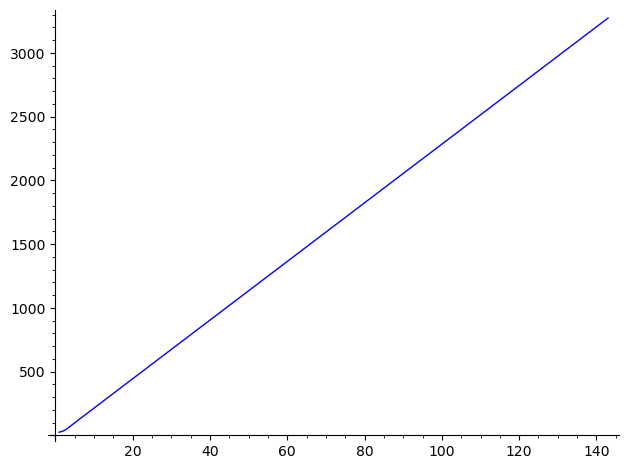

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(144, 0)
MINIMUM MODULI


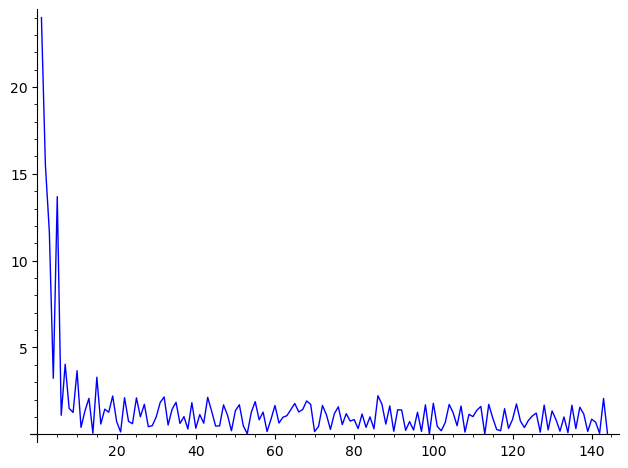

LOGS MINIMUM MODULI


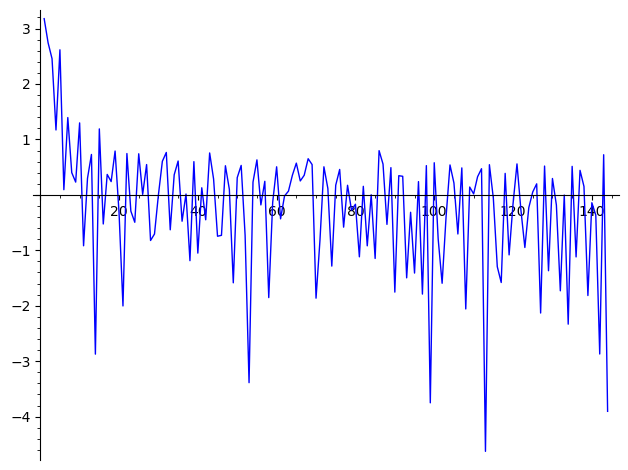

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


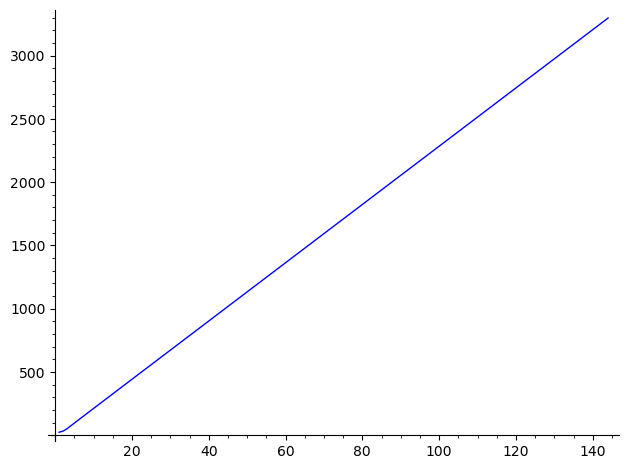

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(145, 0)
MINIMUM MODULI


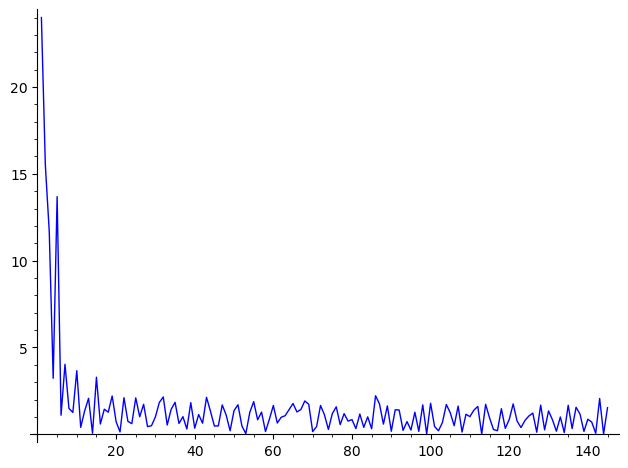

LOGS MINIMUM MODULI


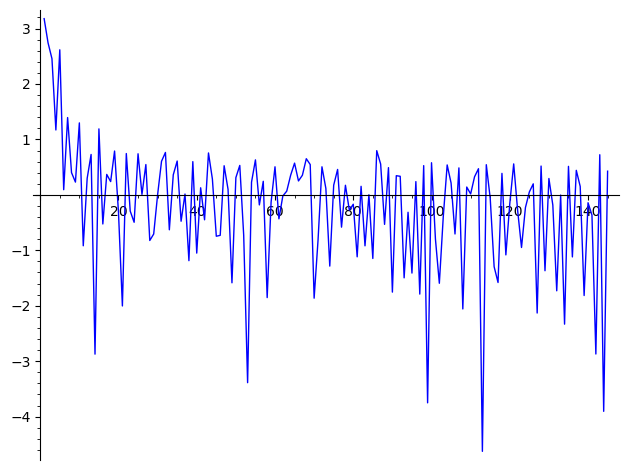

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


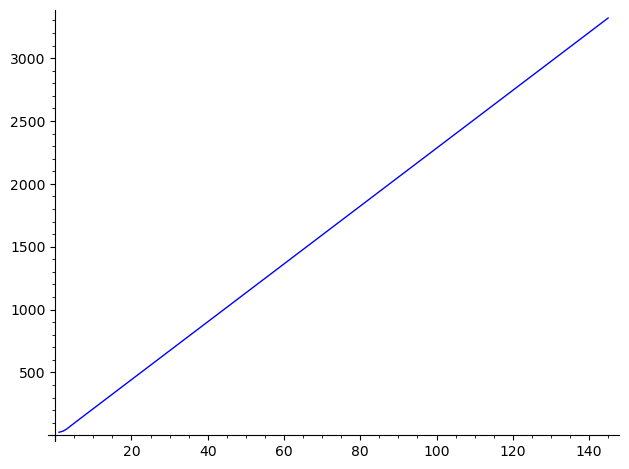

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(146, 0)
MINIMUM MODULI


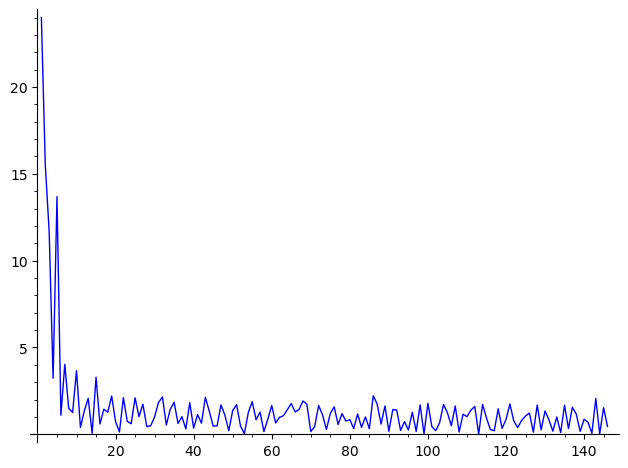

LOGS MINIMUM MODULI


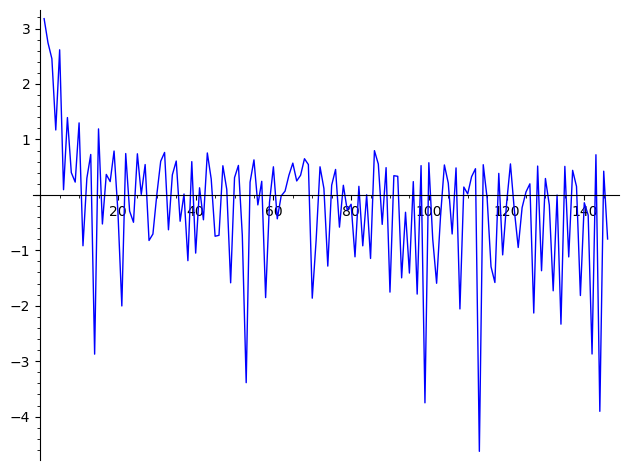

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


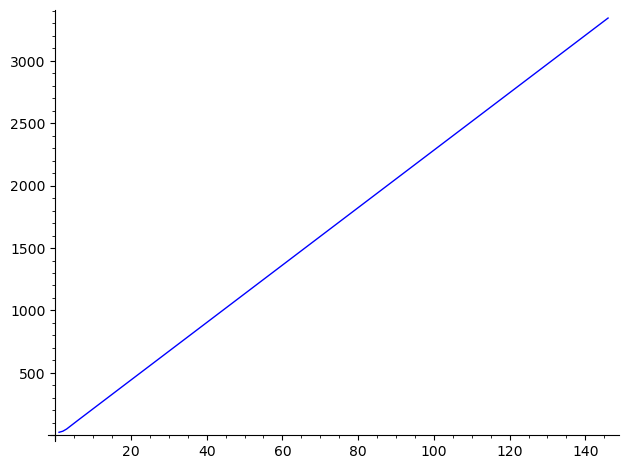

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(147, 0)
MINIMUM MODULI


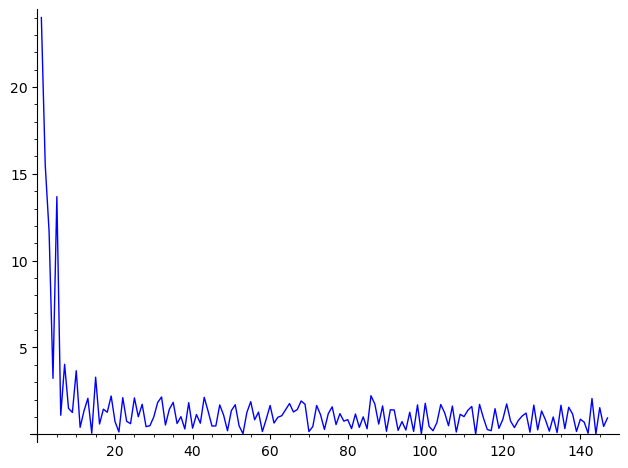

LOGS MINIMUM MODULI


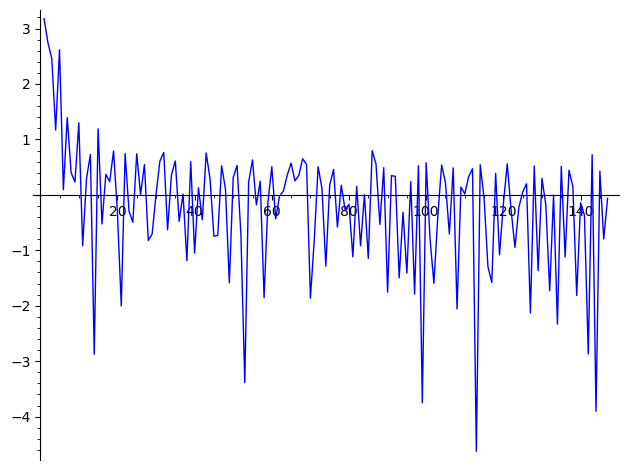

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


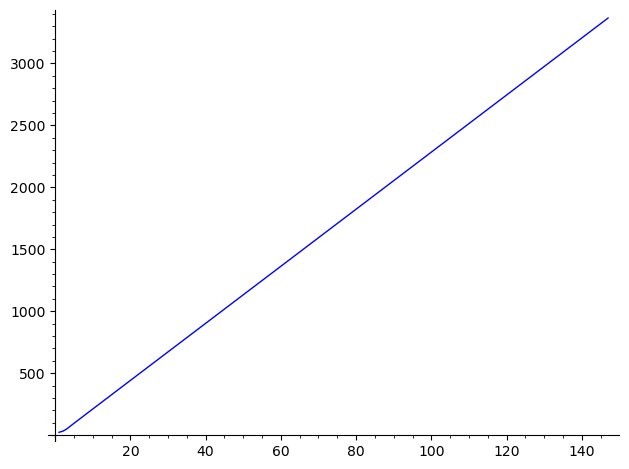

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(148, 0)
MINIMUM MODULI


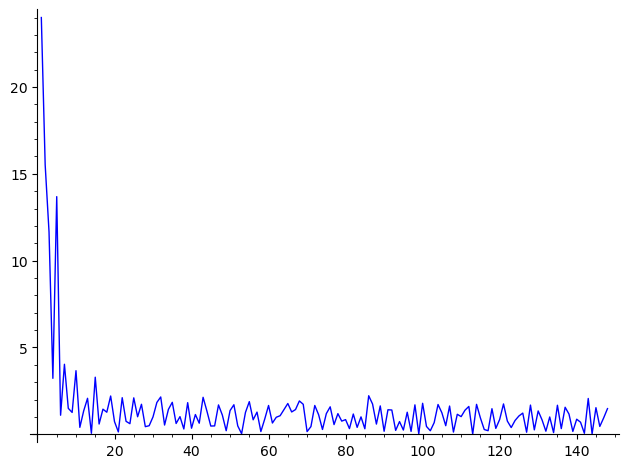

LOGS MINIMUM MODULI


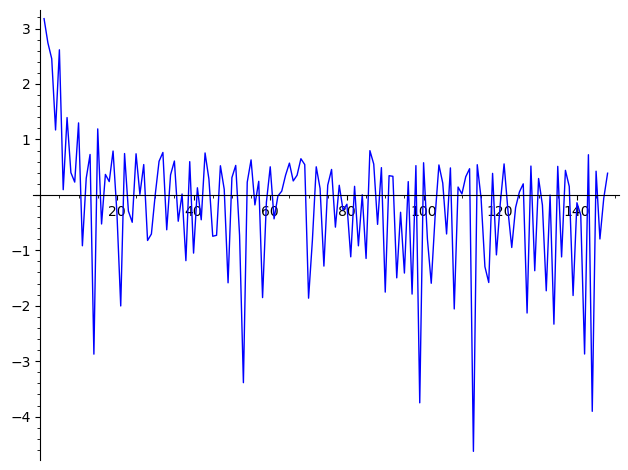

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


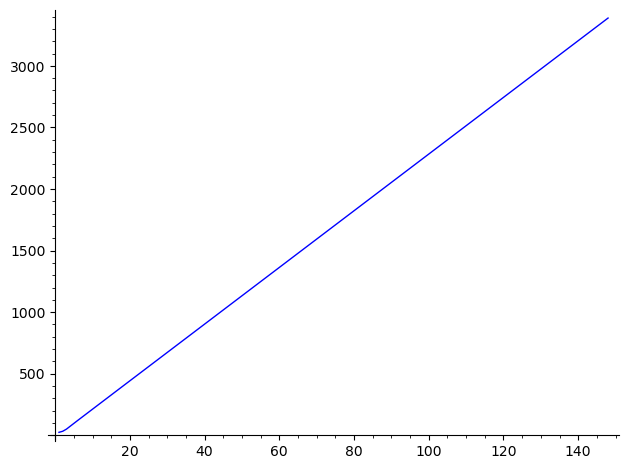

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(149, 0)
MINIMUM MODULI


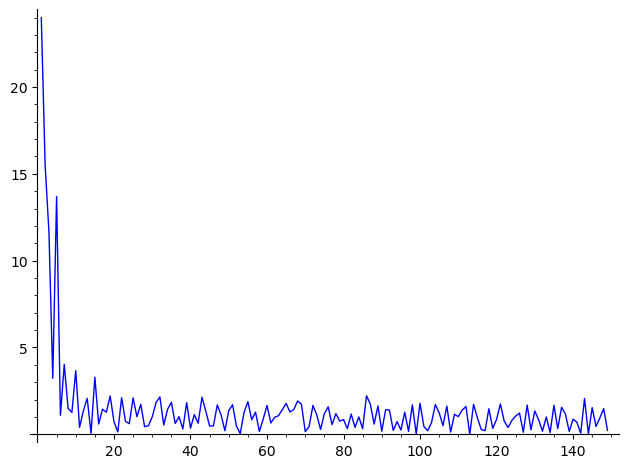

LOGS MINIMUM MODULI


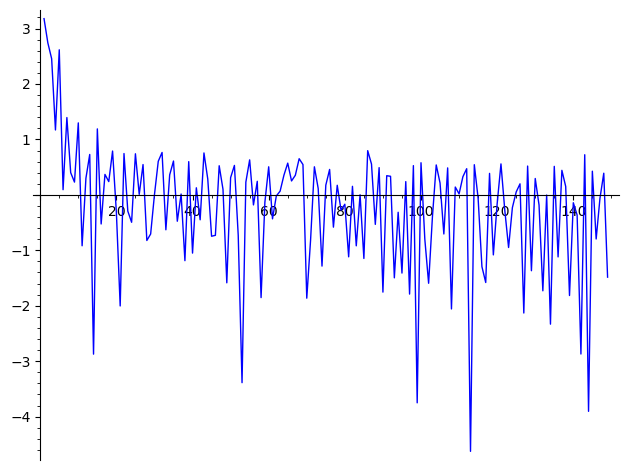

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


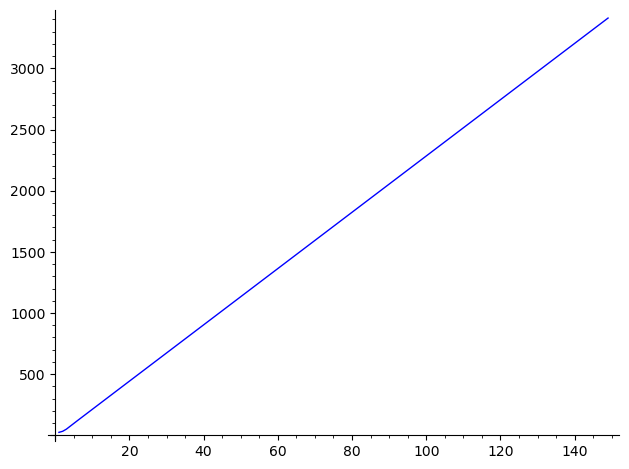

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(150, 0)
MINIMUM MODULI


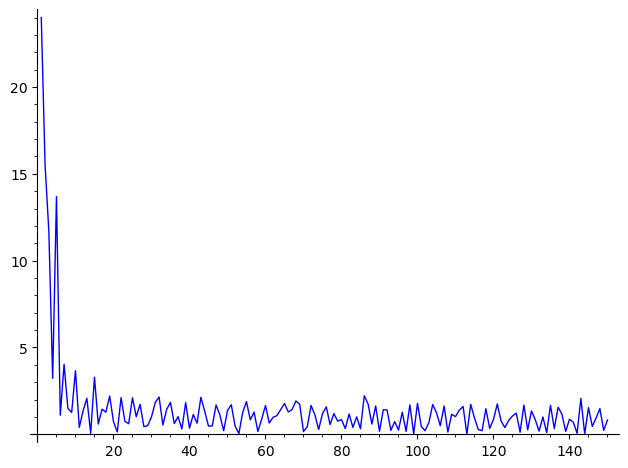

LOGS MINIMUM MODULI


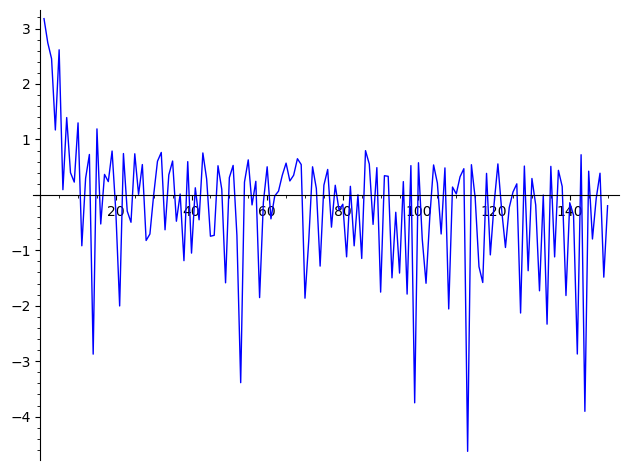

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


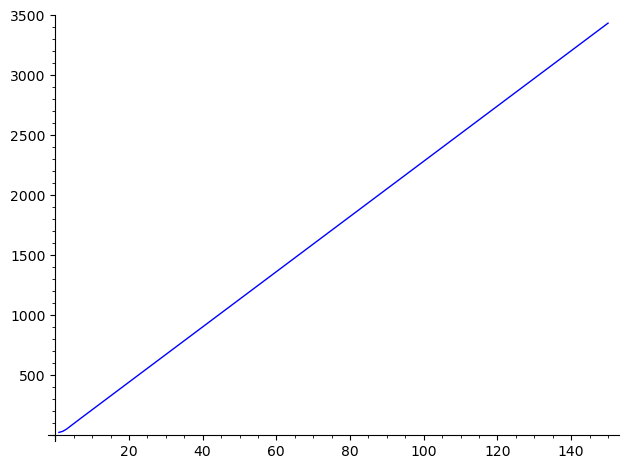

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(151, 0)
MINIMUM MODULI


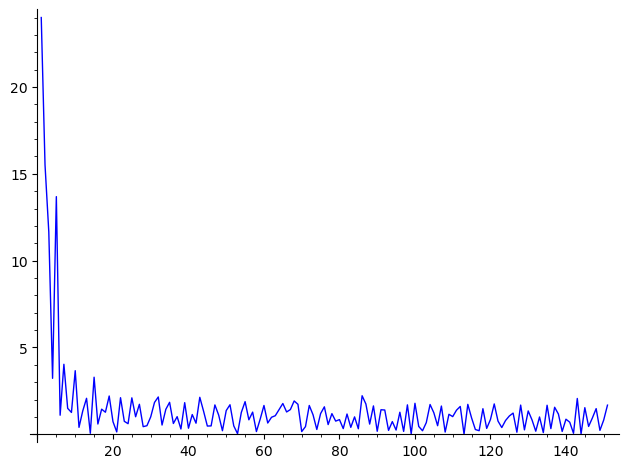

LOGS MINIMUM MODULI


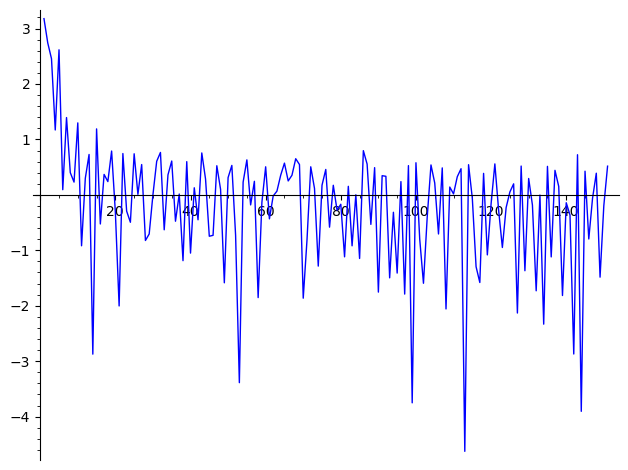

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


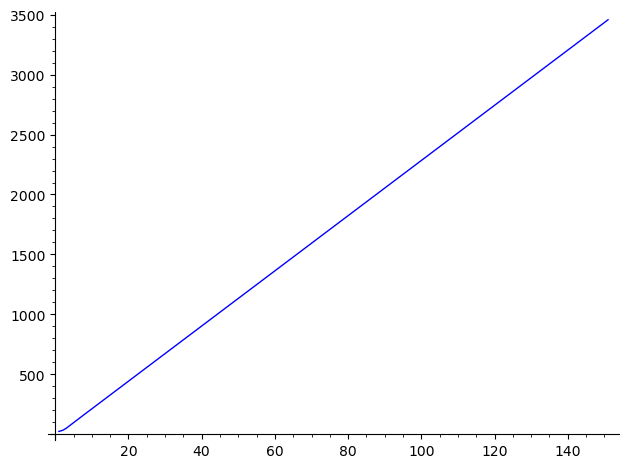

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(152, 0)
MINIMUM MODULI


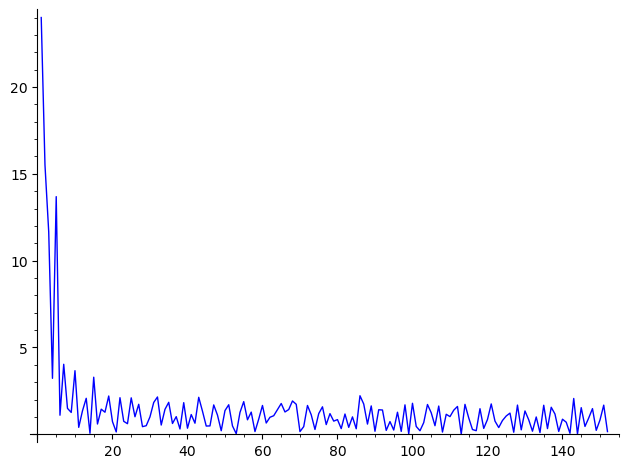

LOGS MINIMUM MODULI


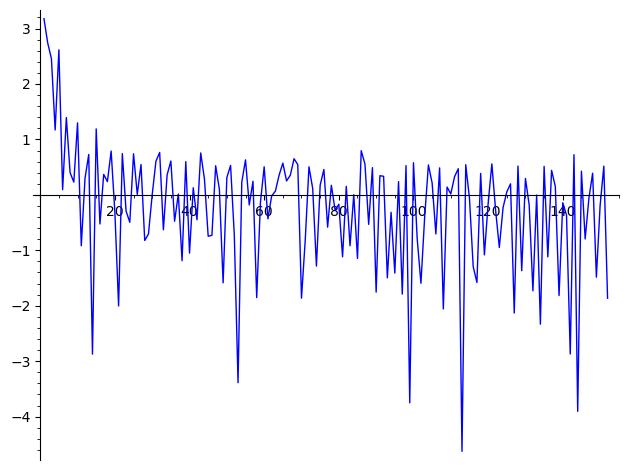

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


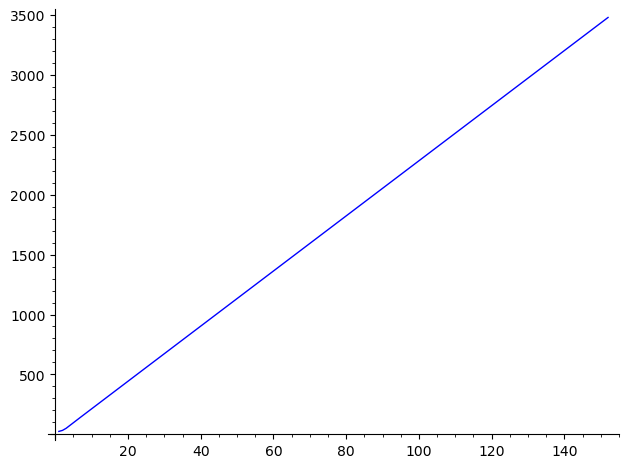

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(153, 0)
MINIMUM MODULI


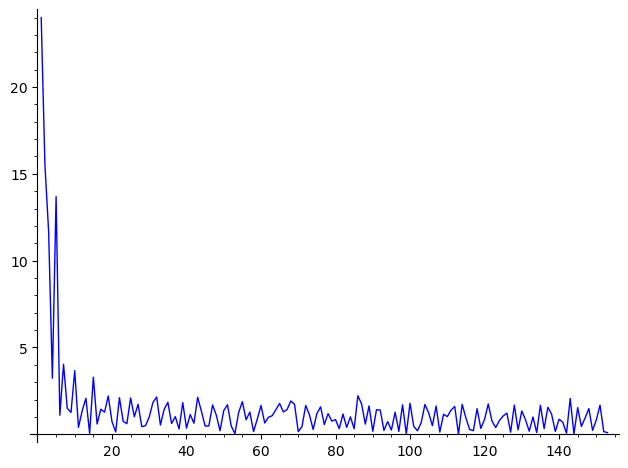

LOGS MINIMUM MODULI


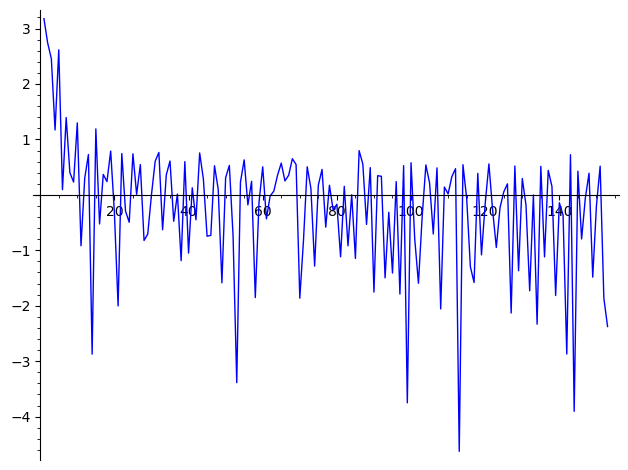

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


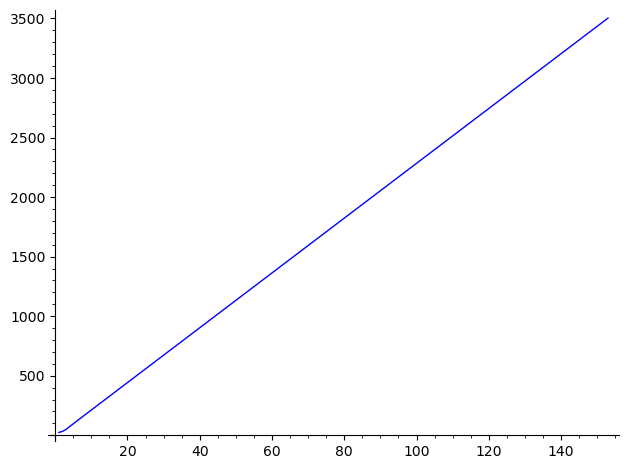

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(154, 0)
MINIMUM MODULI


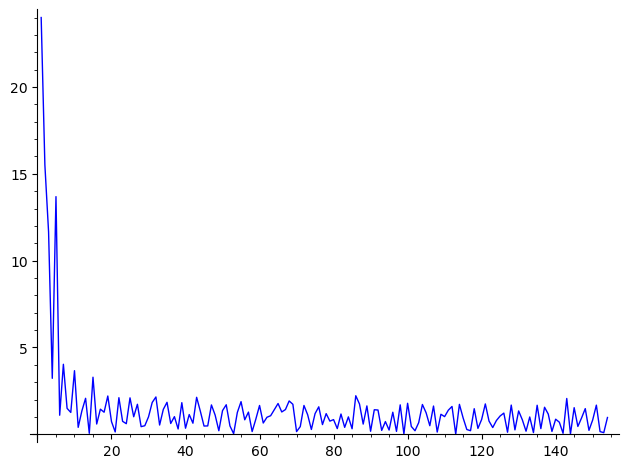

LOGS MINIMUM MODULI


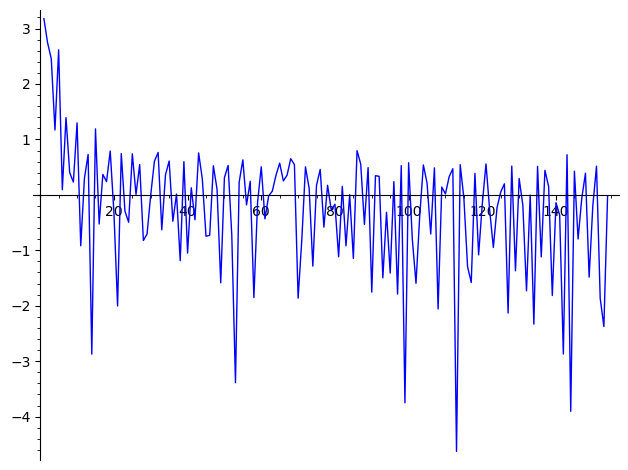

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


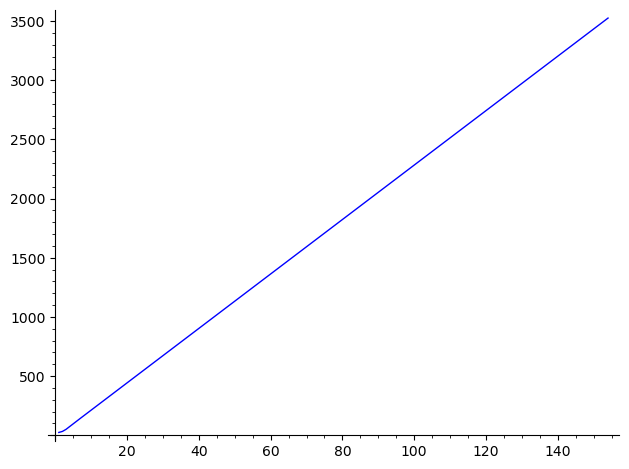

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(155, 0)
MINIMUM MODULI


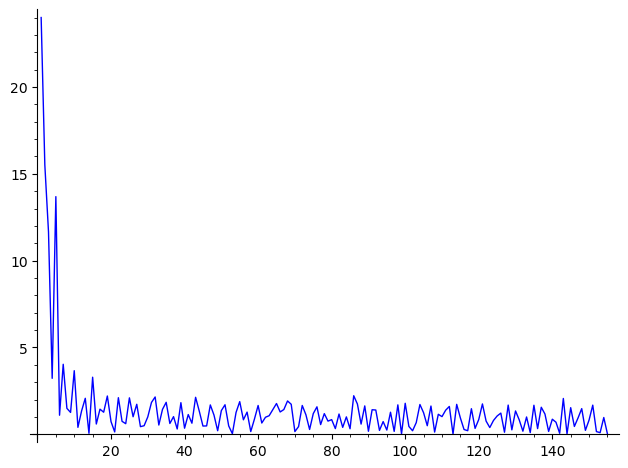

LOGS MINIMUM MODULI


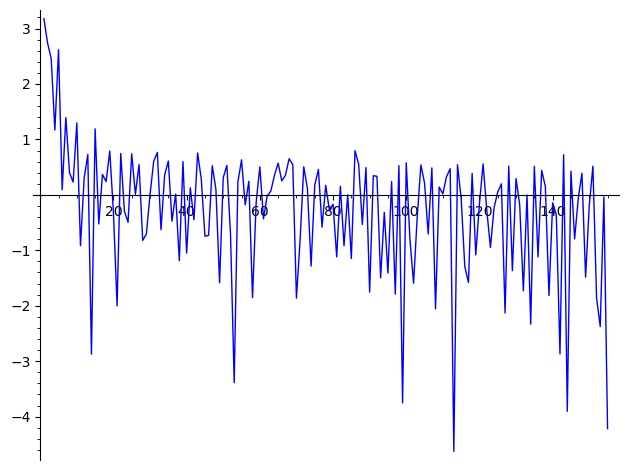

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


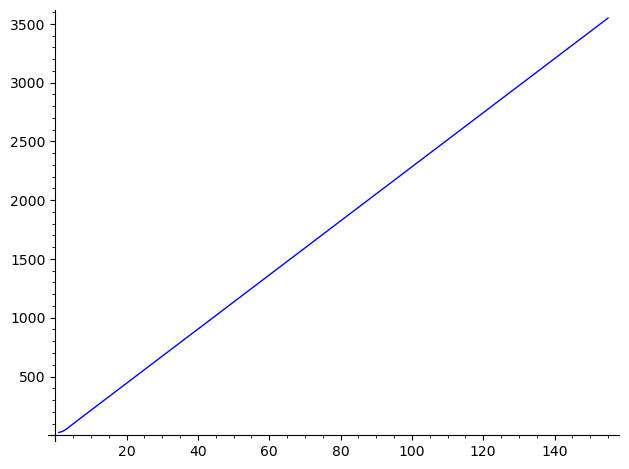

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(156, 0)
MINIMUM MODULI


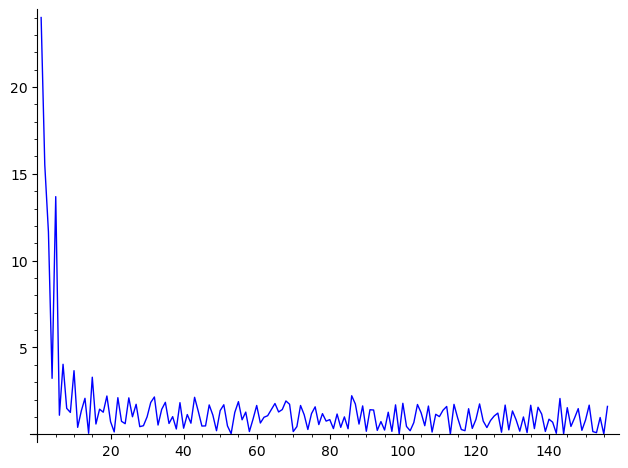

LOGS MINIMUM MODULI


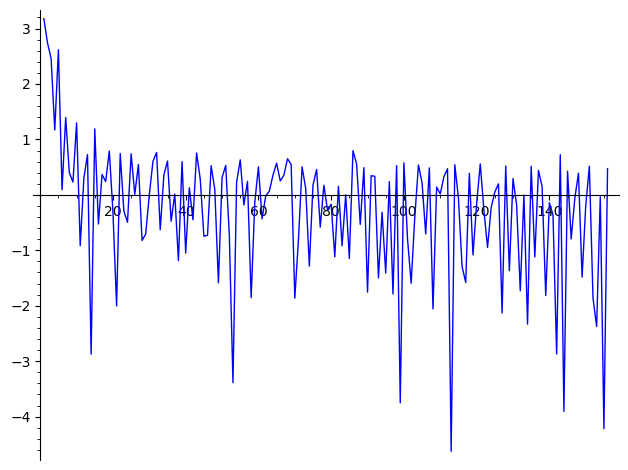

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


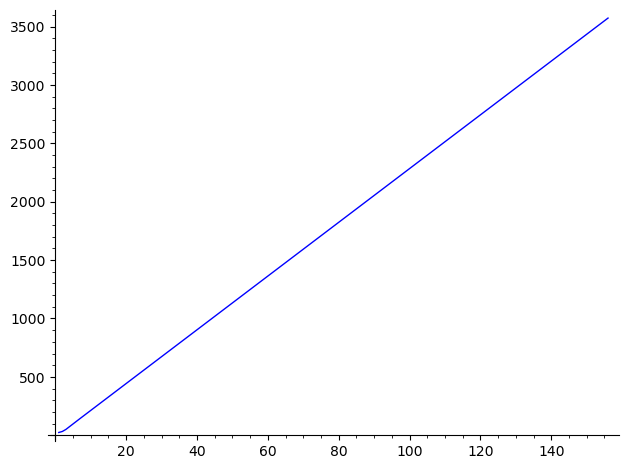

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(157, 0)
MINIMUM MODULI


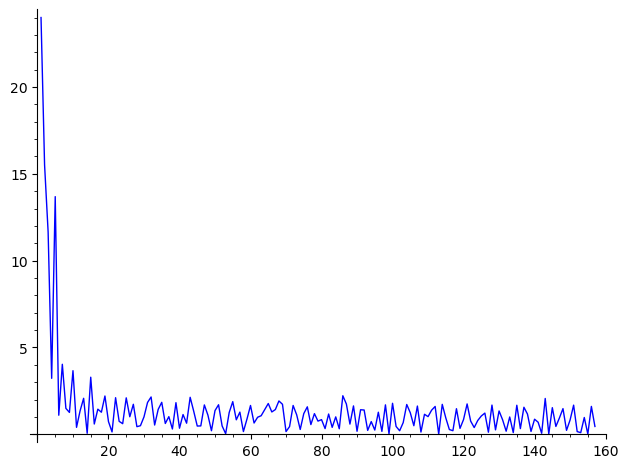

LOGS MINIMUM MODULI


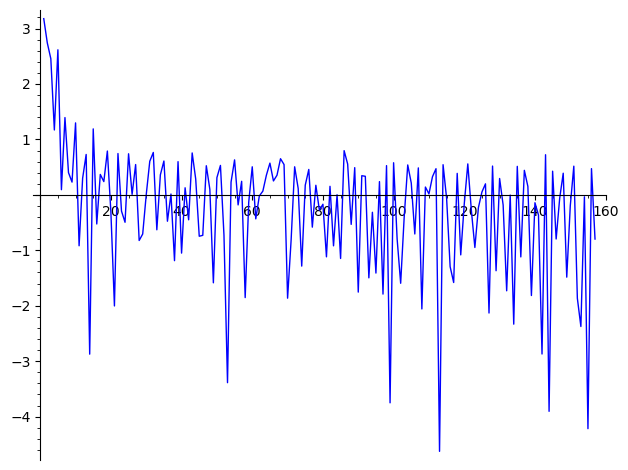

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


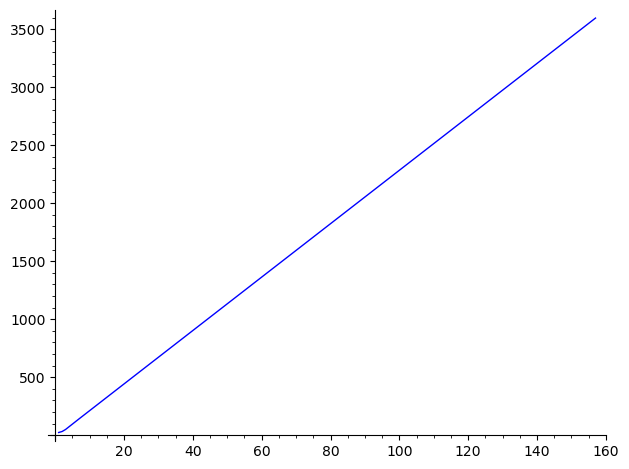

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(158, 0)
MINIMUM MODULI


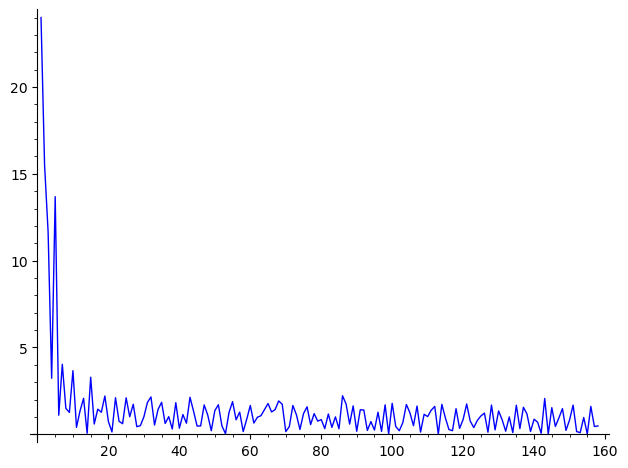

LOGS MINIMUM MODULI


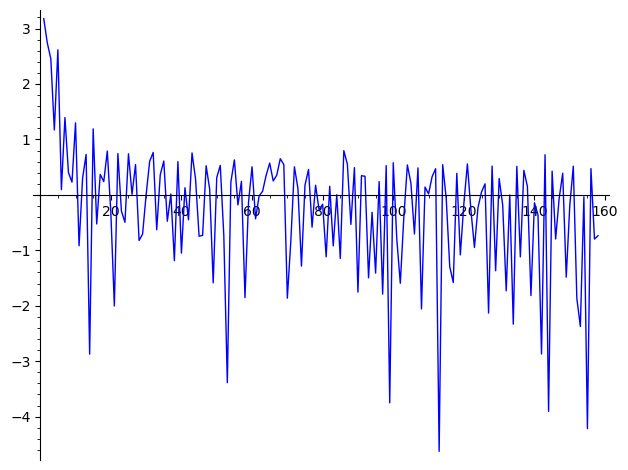

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


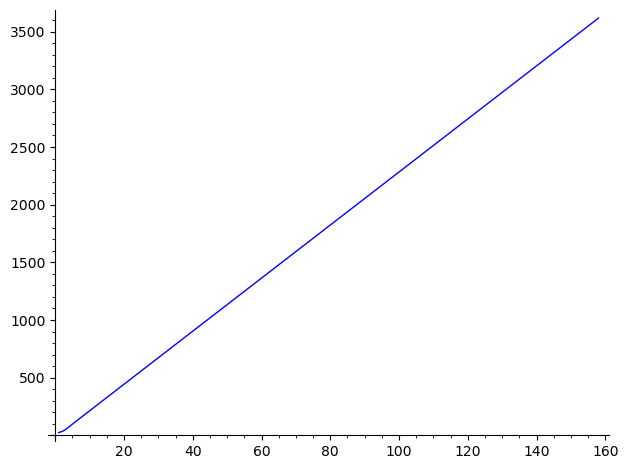

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(159, 0)
MINIMUM MODULI


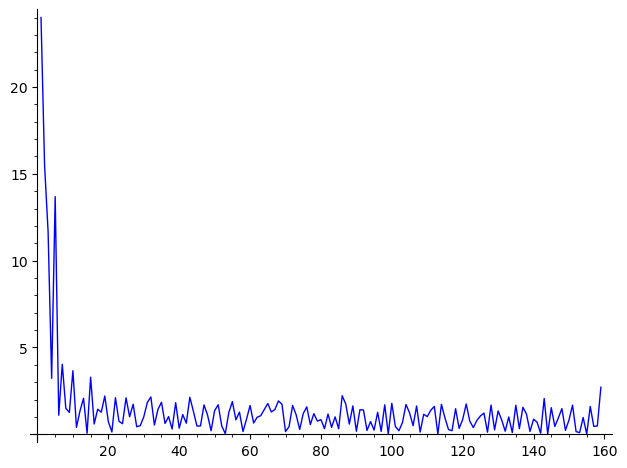

LOGS MINIMUM MODULI


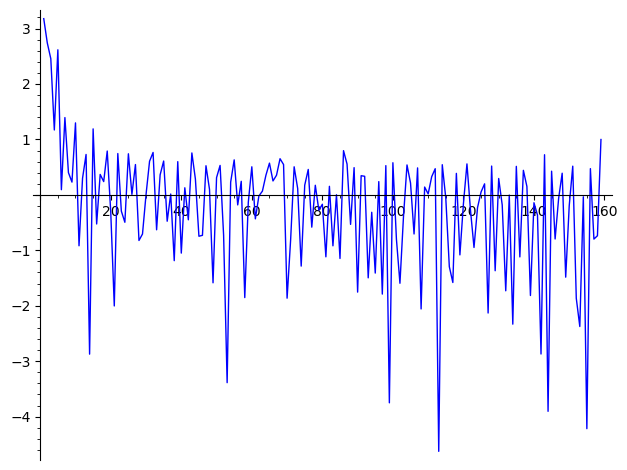

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


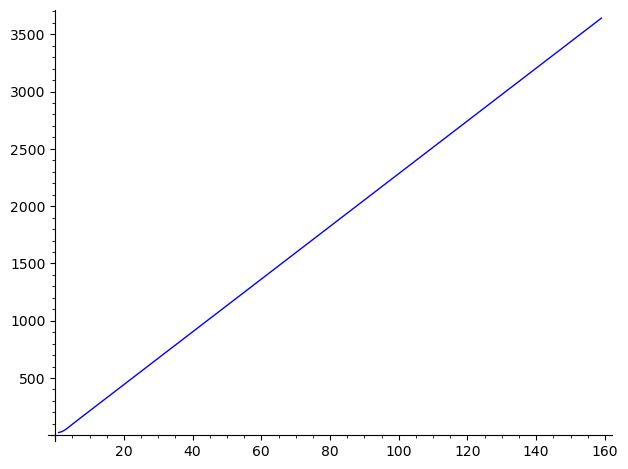

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(160, 0)
MINIMUM MODULI


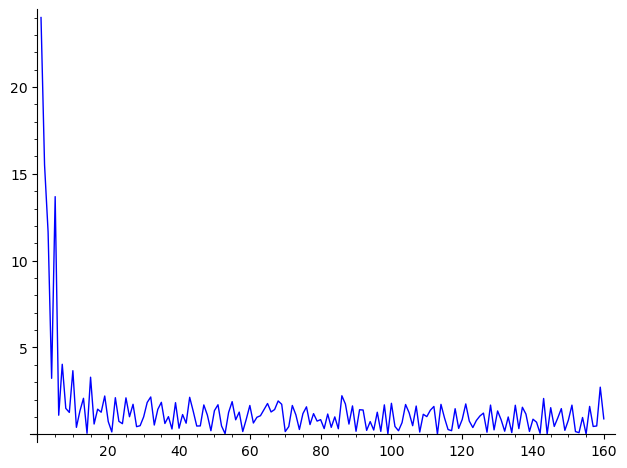

LOGS MINIMUM MODULI


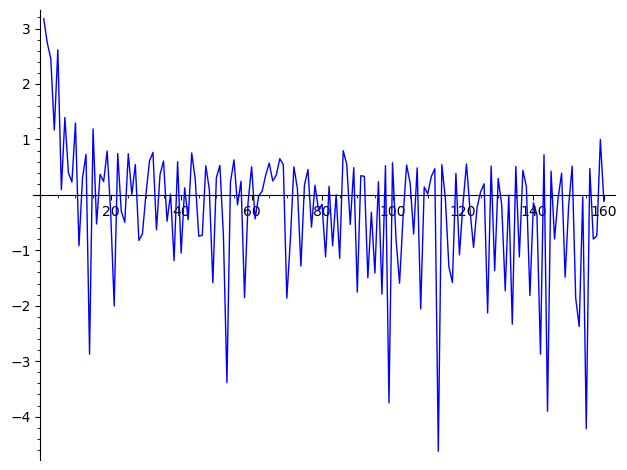

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


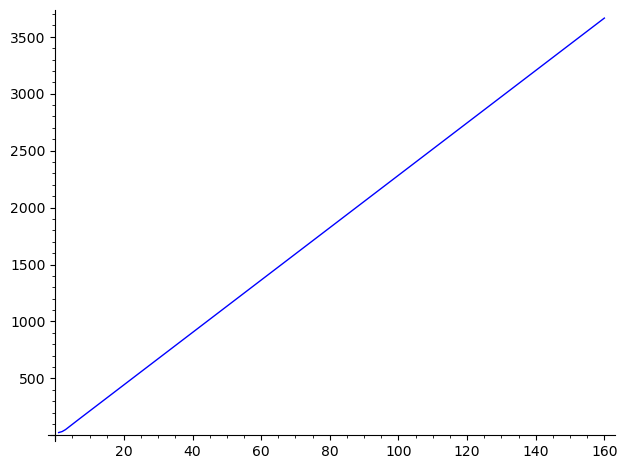

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(161, 0)
MINIMUM MODULI


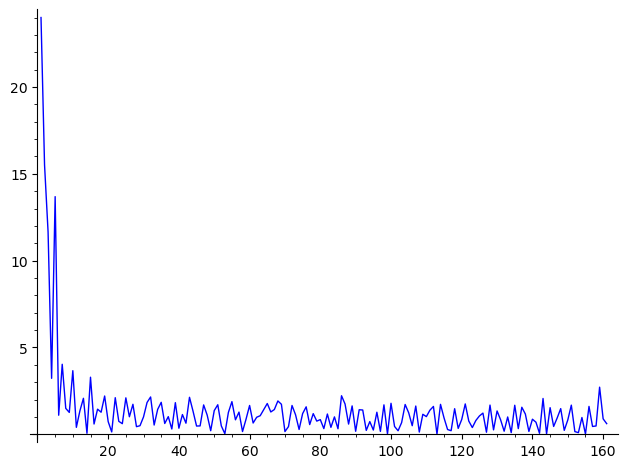

LOGS MINIMUM MODULI


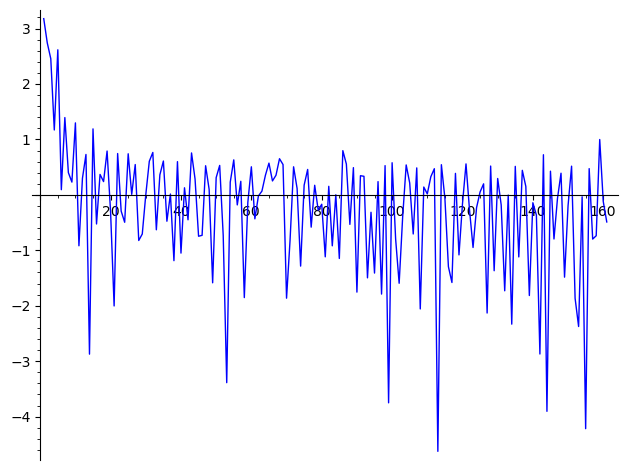

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


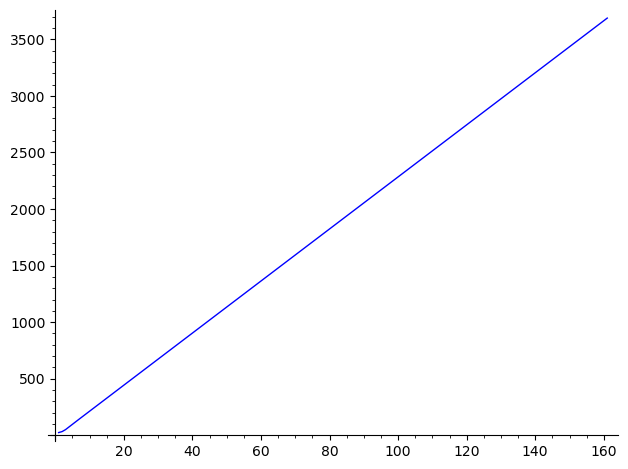

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(162, 0)
MINIMUM MODULI


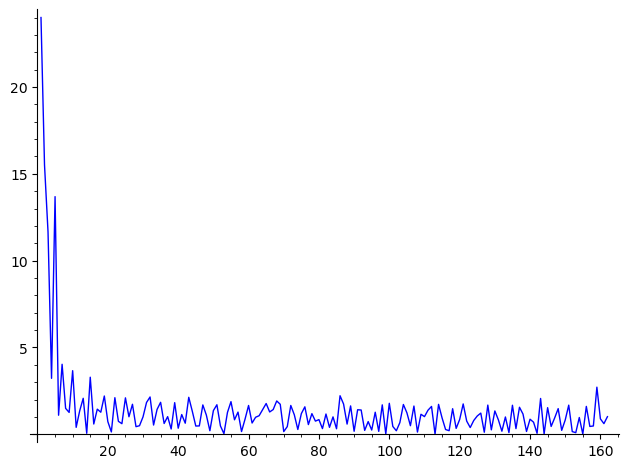

LOGS MINIMUM MODULI


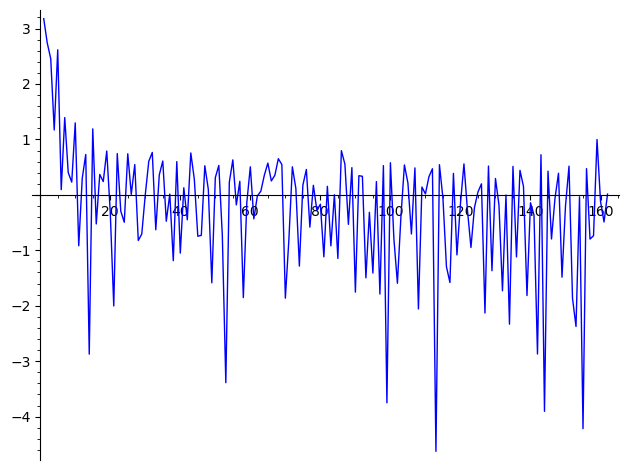

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


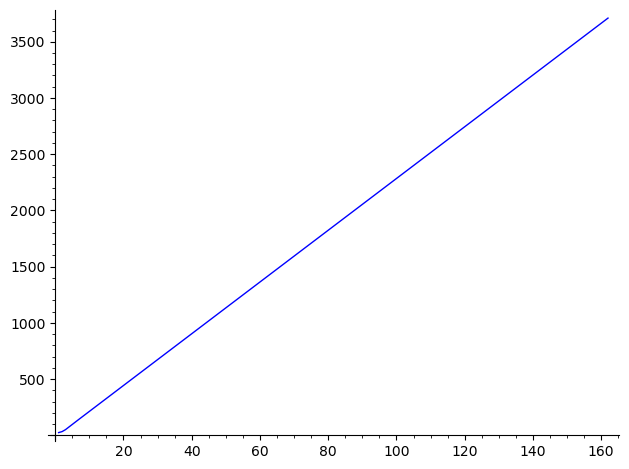

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(163, 0)
MINIMUM MODULI


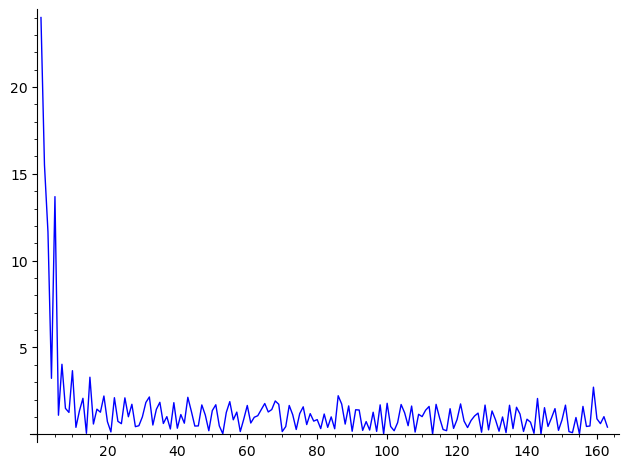

LOGS MINIMUM MODULI


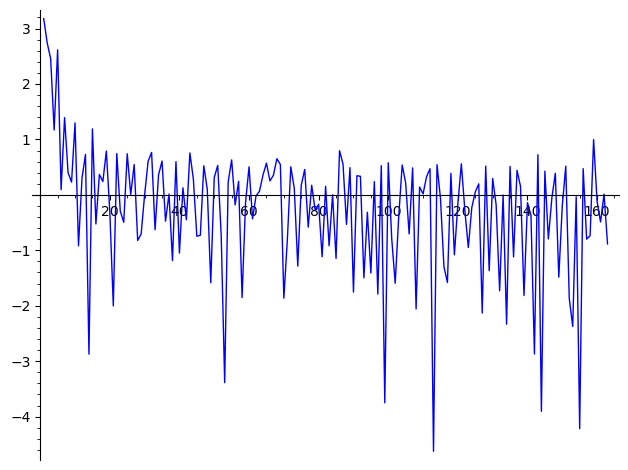

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


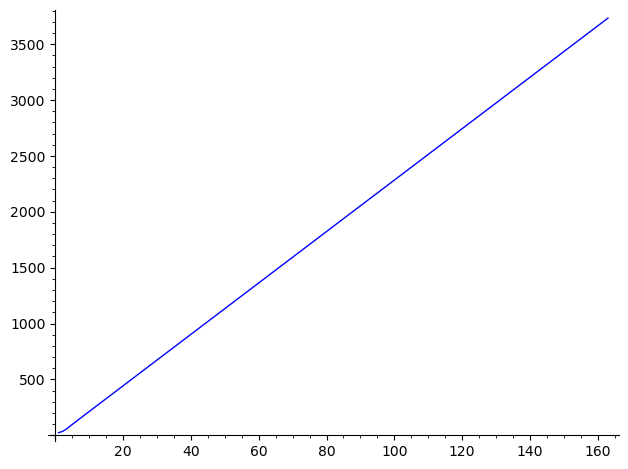

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(164, 0)
MINIMUM MODULI


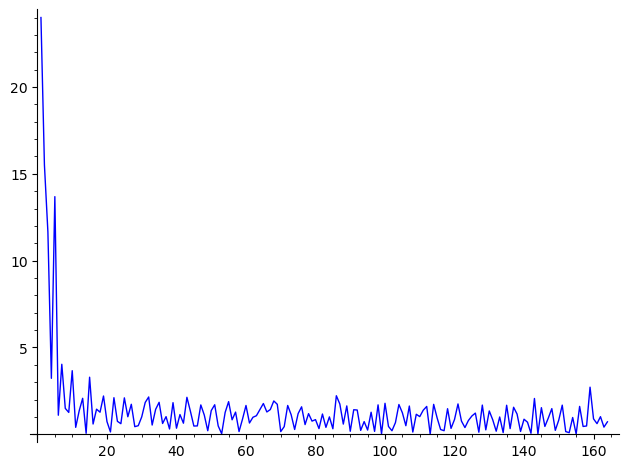

LOGS MINIMUM MODULI


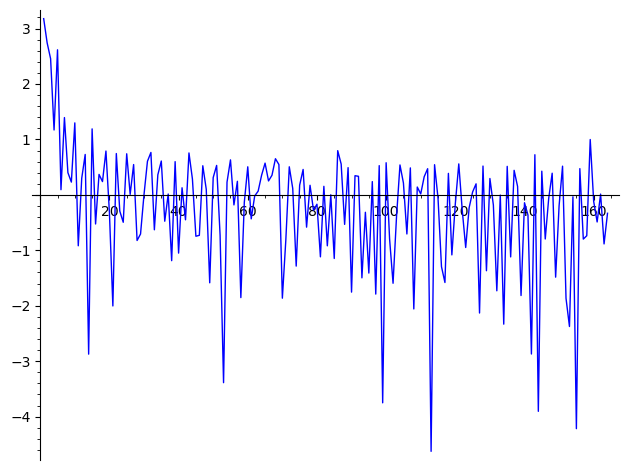

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


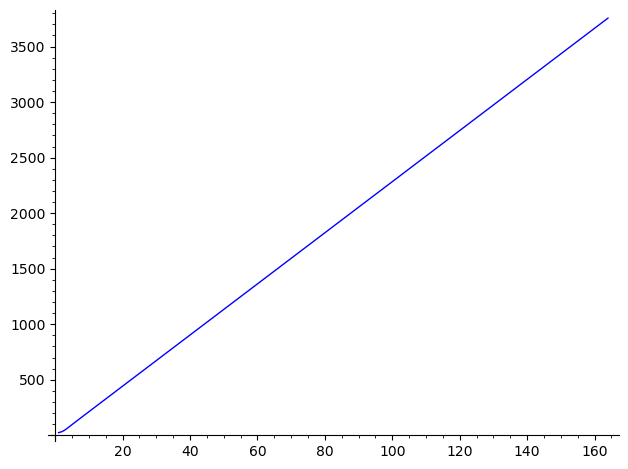

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(165, 0)
MINIMUM MODULI


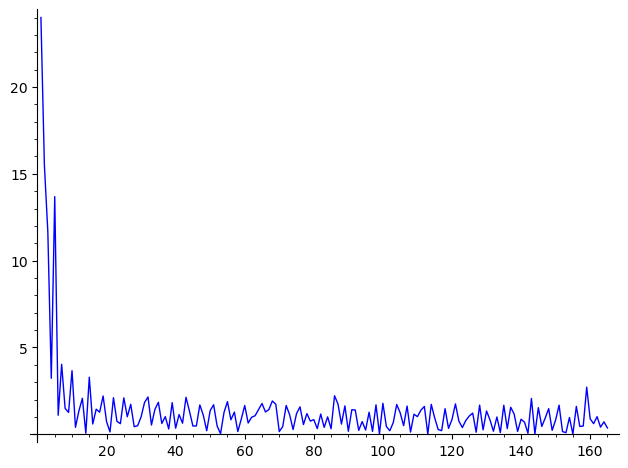

LOGS MINIMUM MODULI


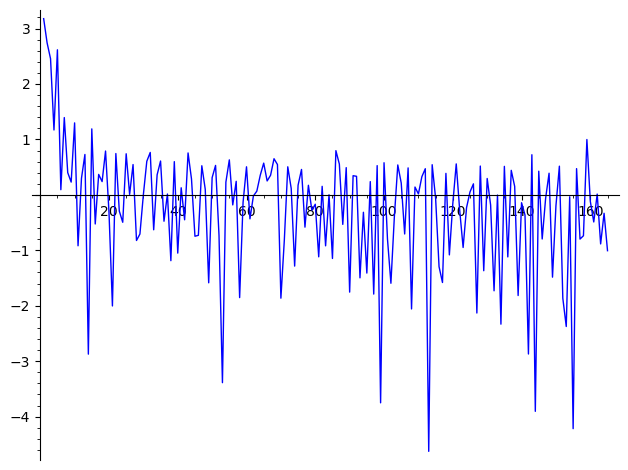

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


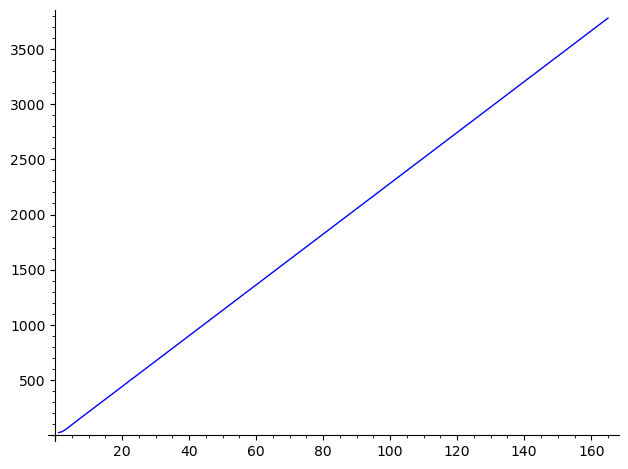

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(166, 0)
MINIMUM MODULI


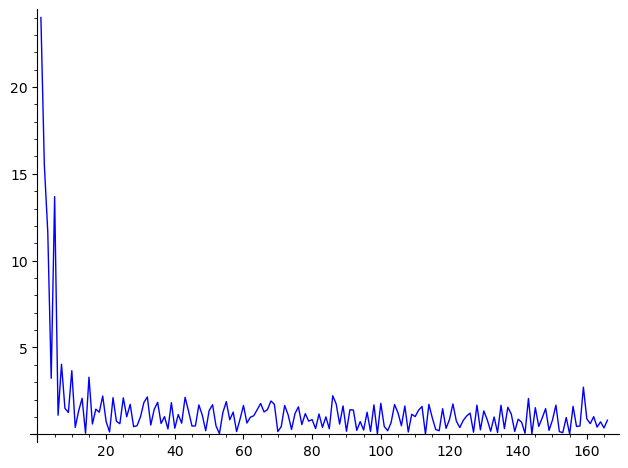

LOGS MINIMUM MODULI


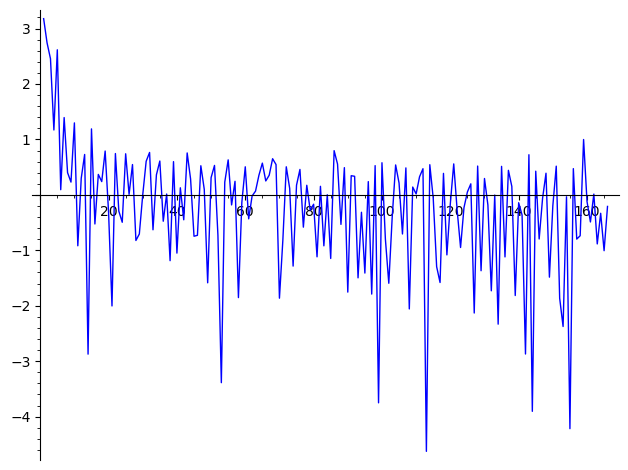

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


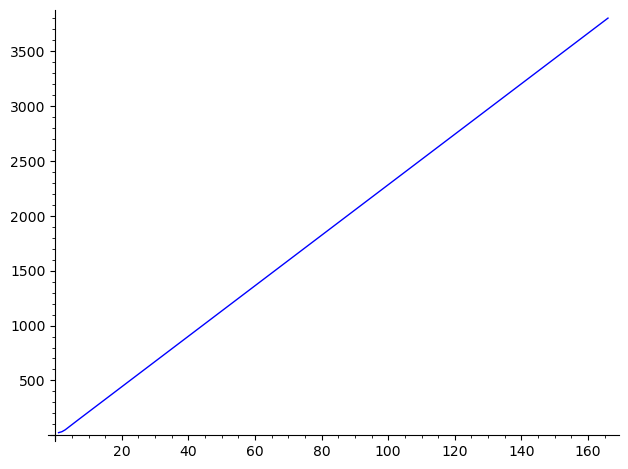

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(167, 0)
MINIMUM MODULI


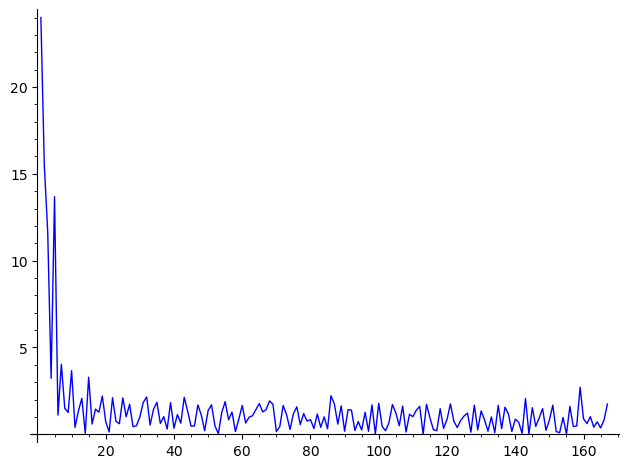

LOGS MINIMUM MODULI


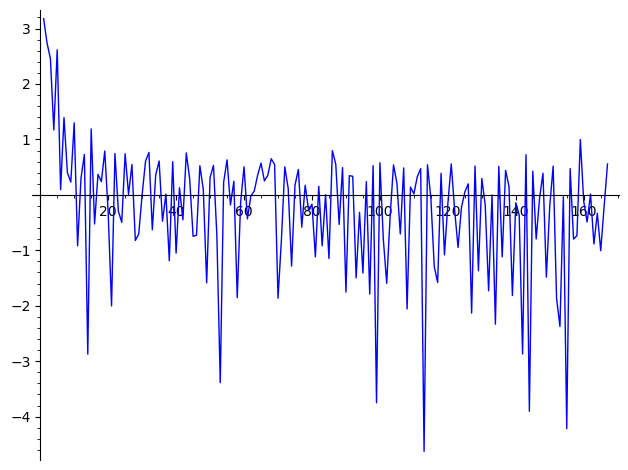

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


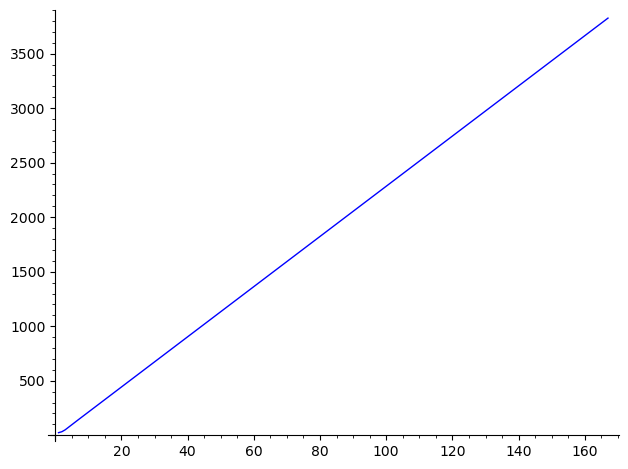

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(168, 0)
MINIMUM MODULI


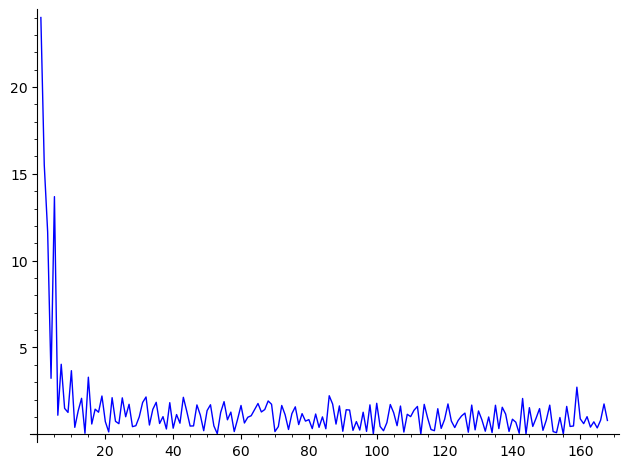

LOGS MINIMUM MODULI


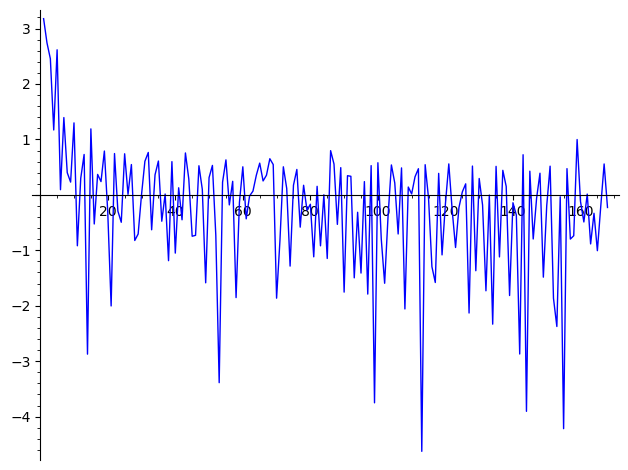

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


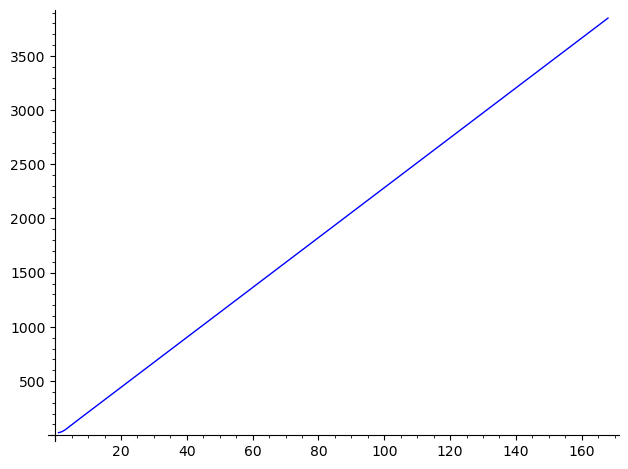

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(169, 0)
MINIMUM MODULI


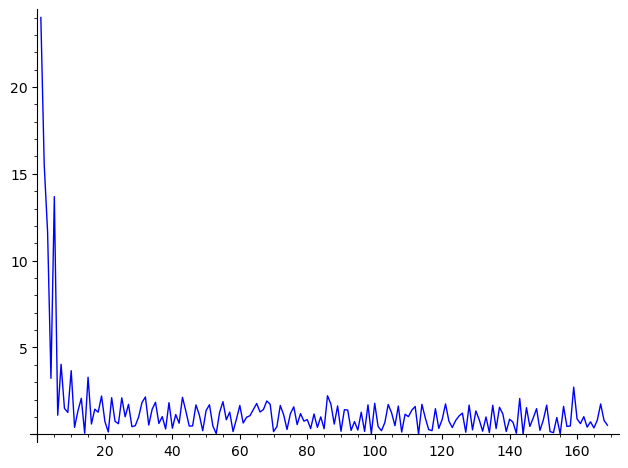

LOGS MINIMUM MODULI


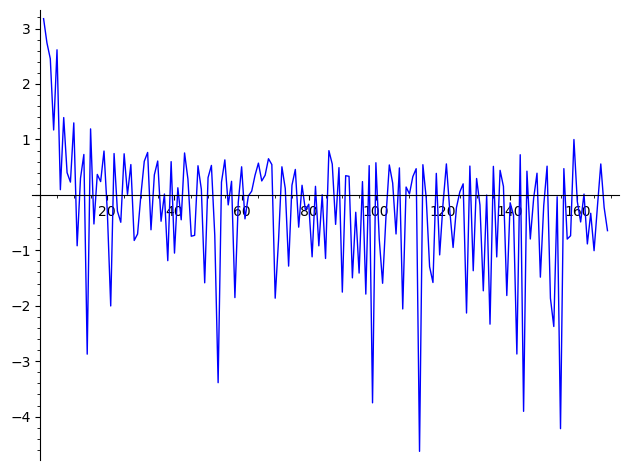

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


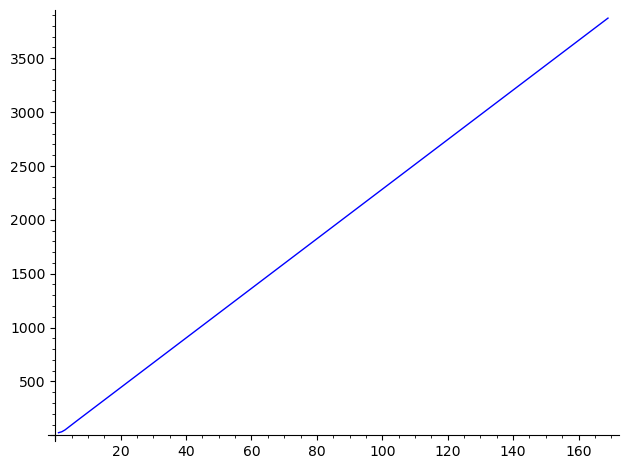

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(170, 0)
MINIMUM MODULI


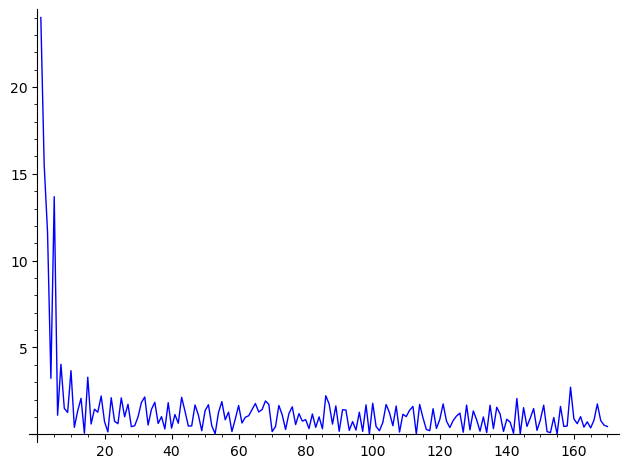

LOGS MINIMUM MODULI


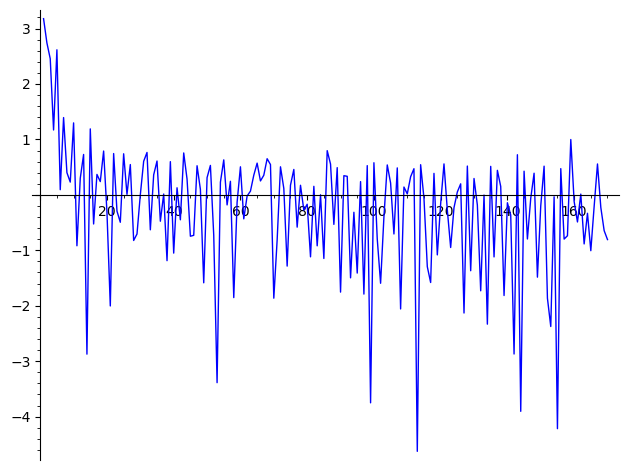

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


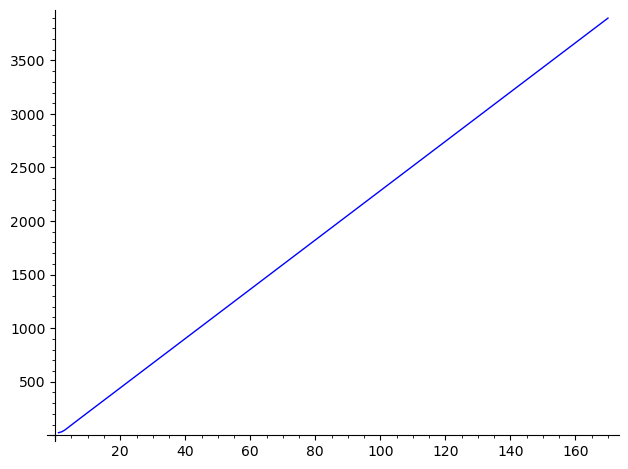

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(171, 0)
MINIMUM MODULI


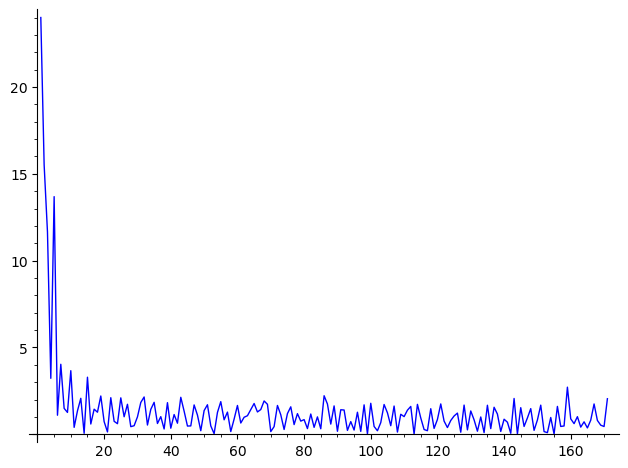

LOGS MINIMUM MODULI


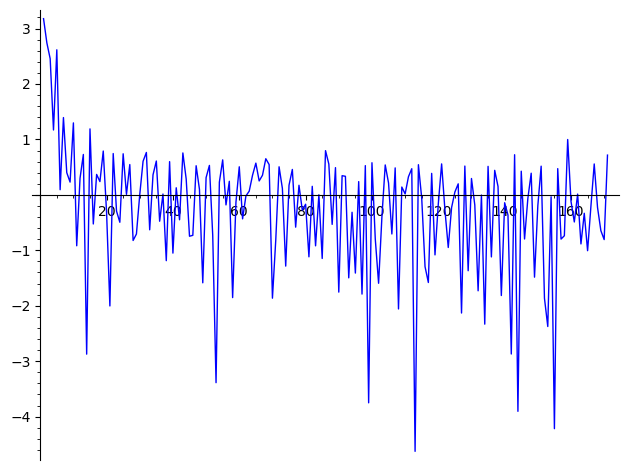

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


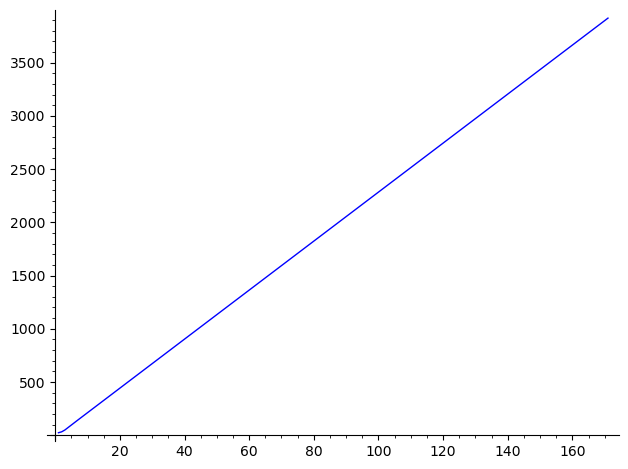

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(172, 0)
MINIMUM MODULI


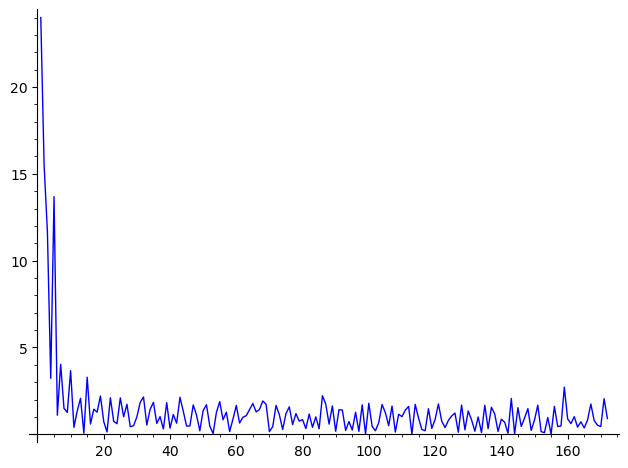

LOGS MINIMUM MODULI


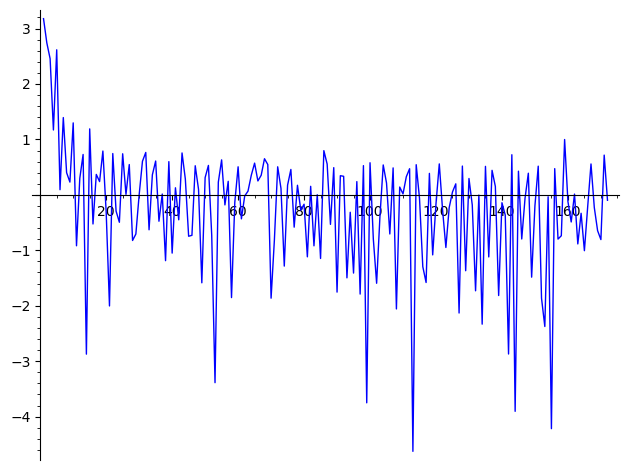

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


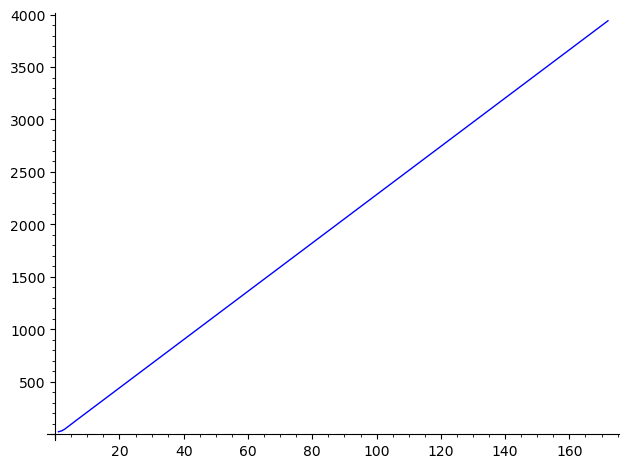

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(173, 0)
MINIMUM MODULI


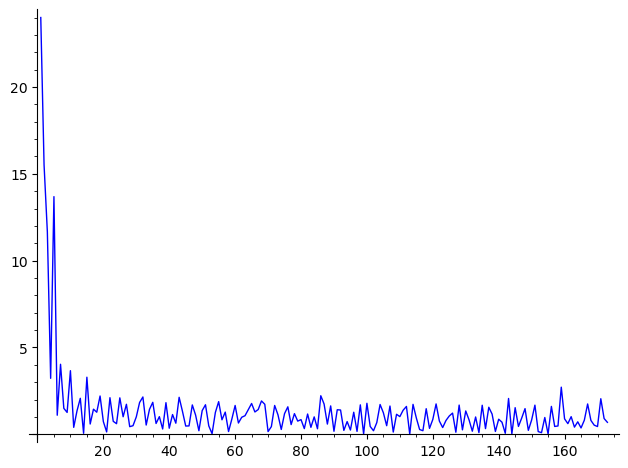

LOGS MINIMUM MODULI


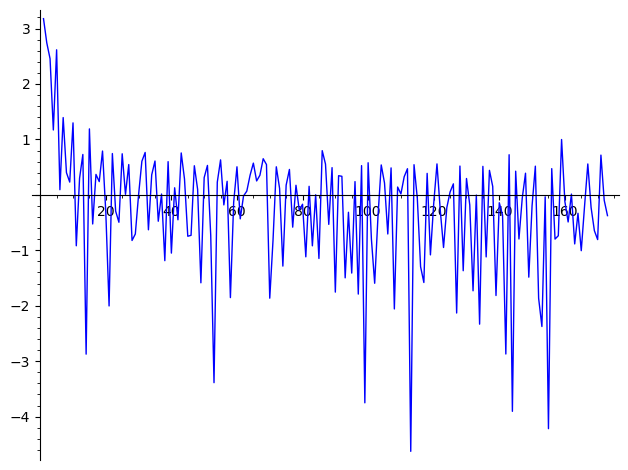

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


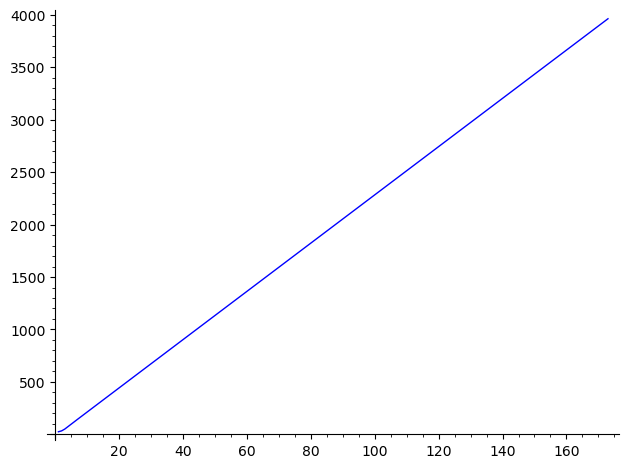

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(174, 0)
MINIMUM MODULI


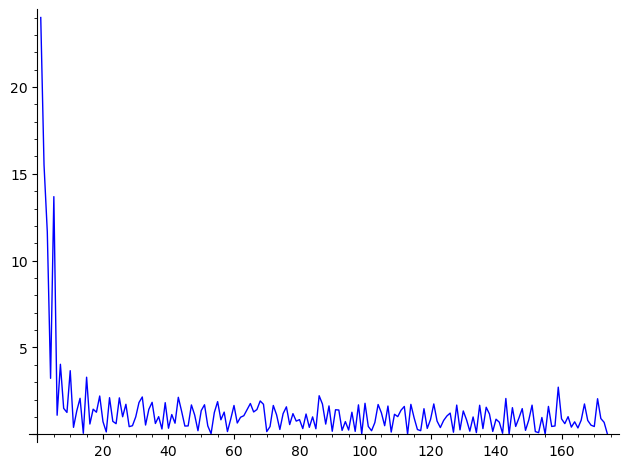

LOGS MINIMUM MODULI


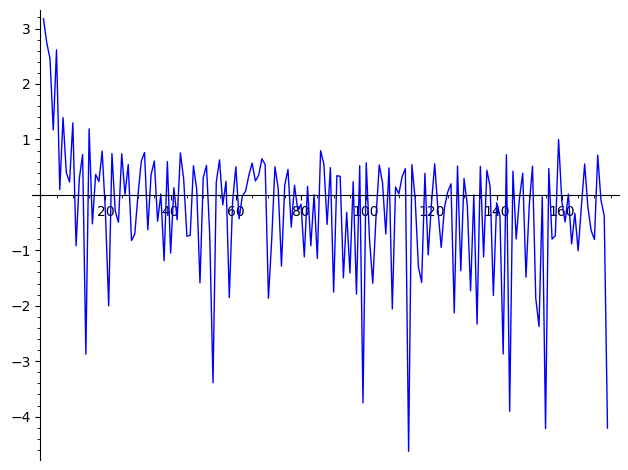

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


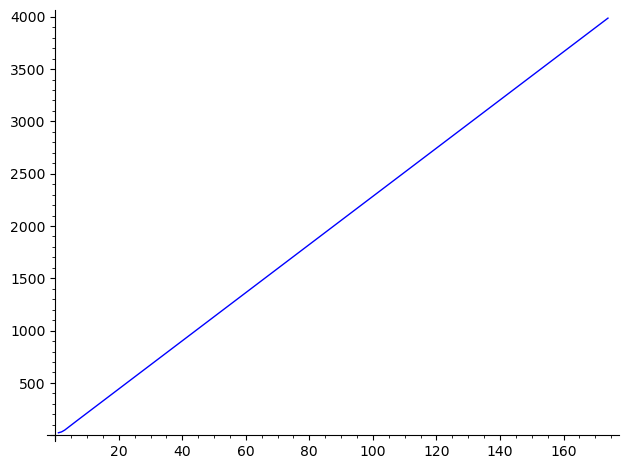

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(175, 0)
MINIMUM MODULI


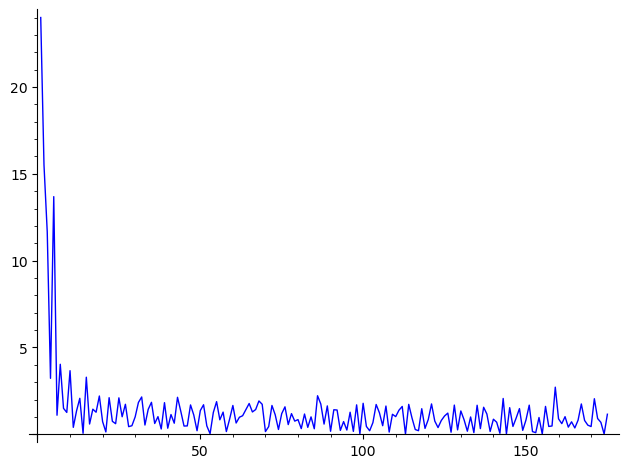

LOGS MINIMUM MODULI


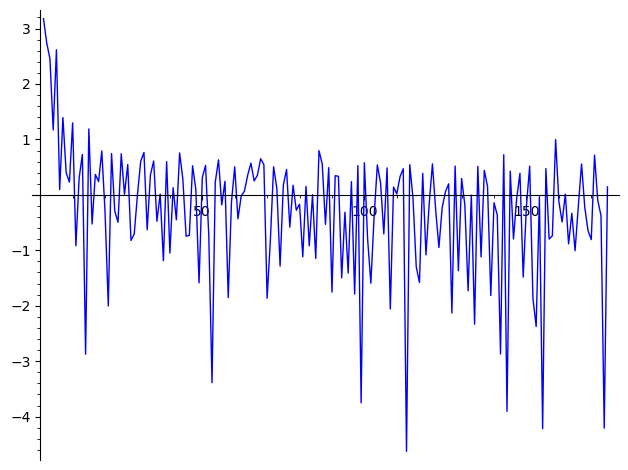

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


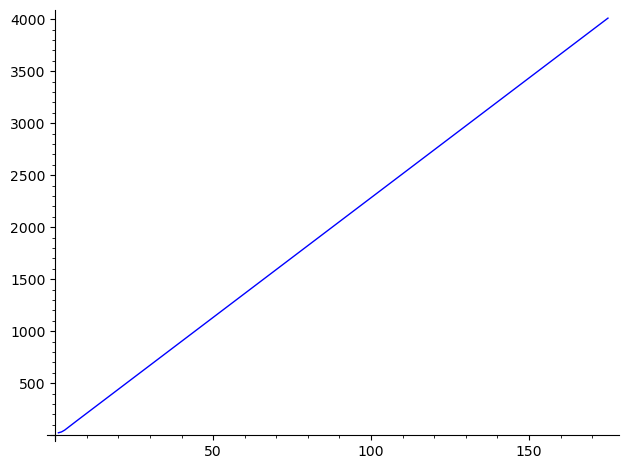

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(176, 0)
MINIMUM MODULI


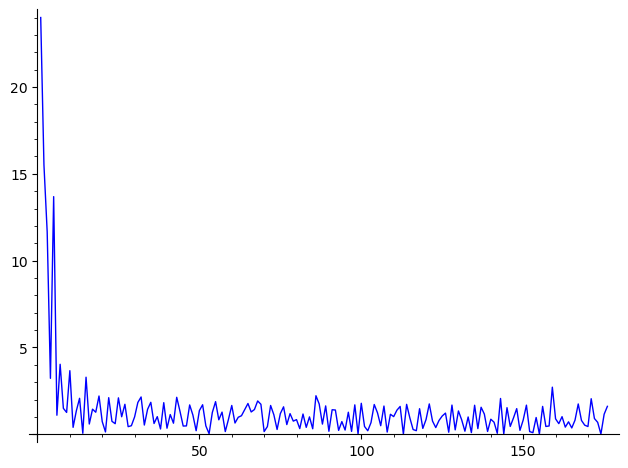

LOGS MINIMUM MODULI


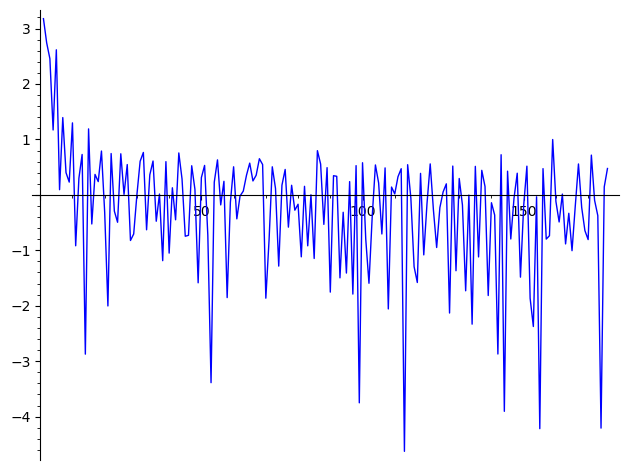

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


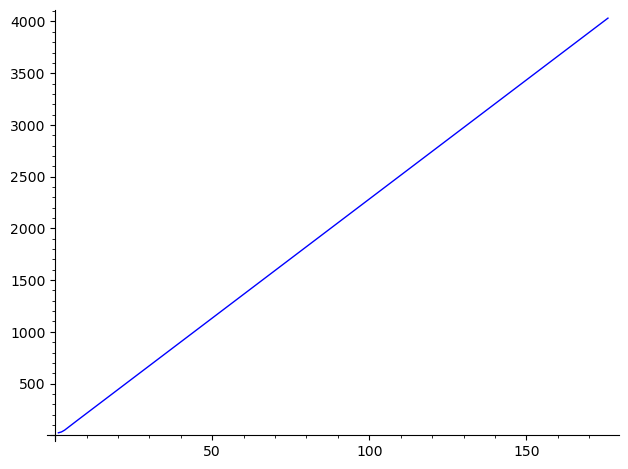

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(177, 0)
MINIMUM MODULI


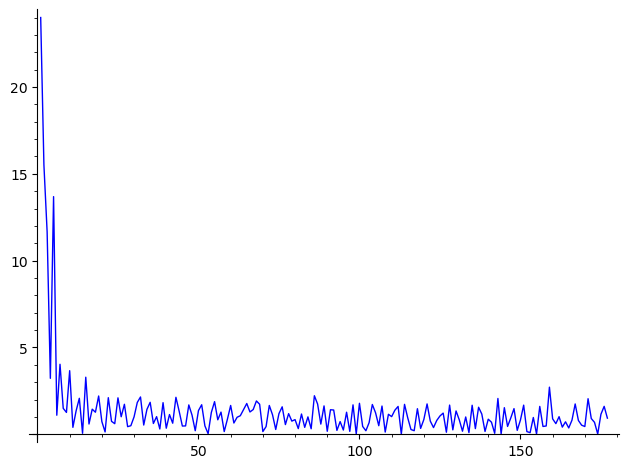

LOGS MINIMUM MODULI


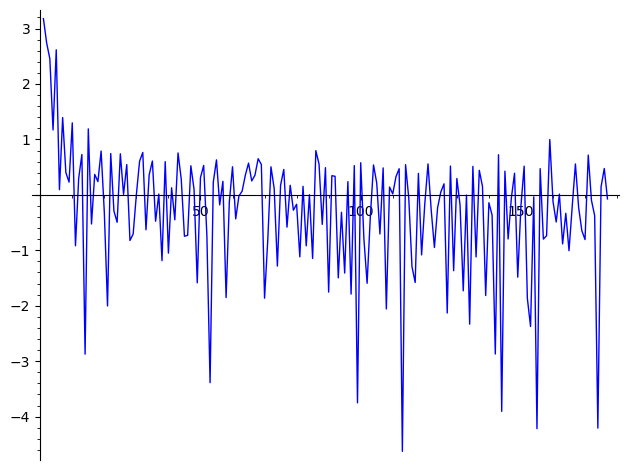

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


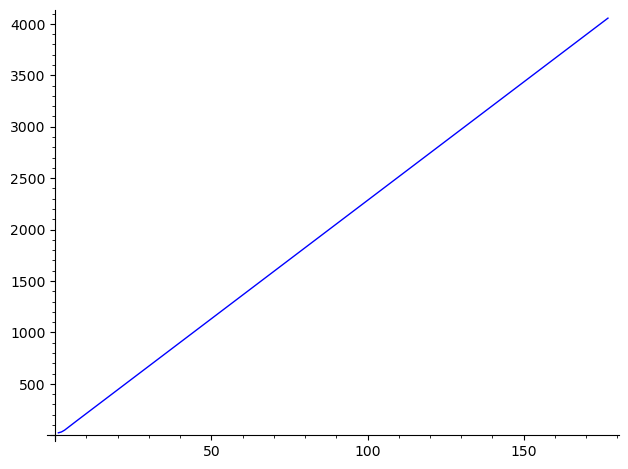

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(178, 0)
MINIMUM MODULI


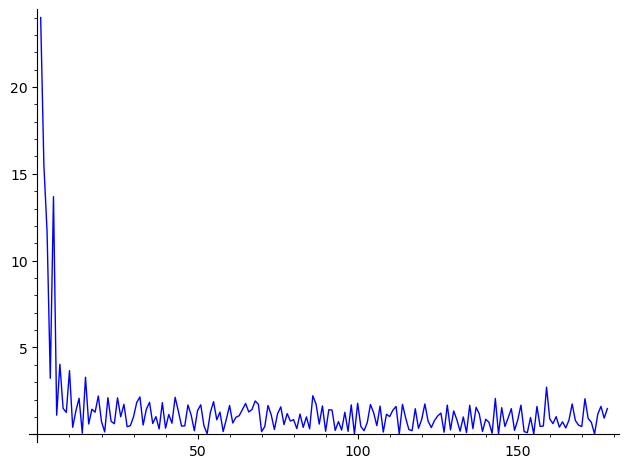

LOGS MINIMUM MODULI


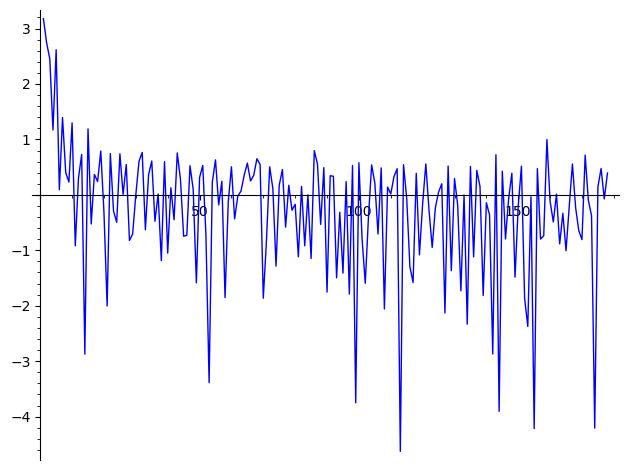

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


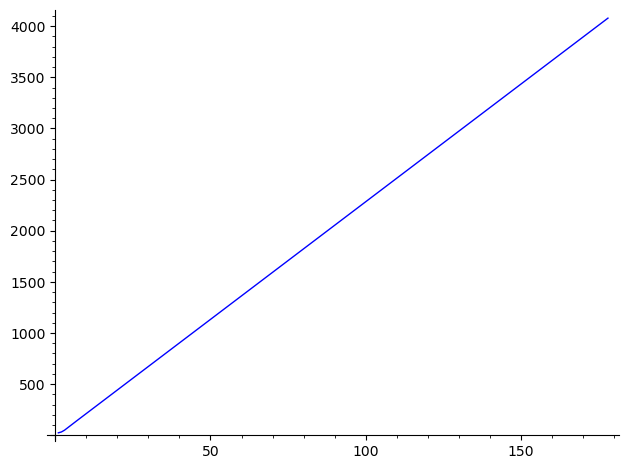

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(179, 0)
MINIMUM MODULI


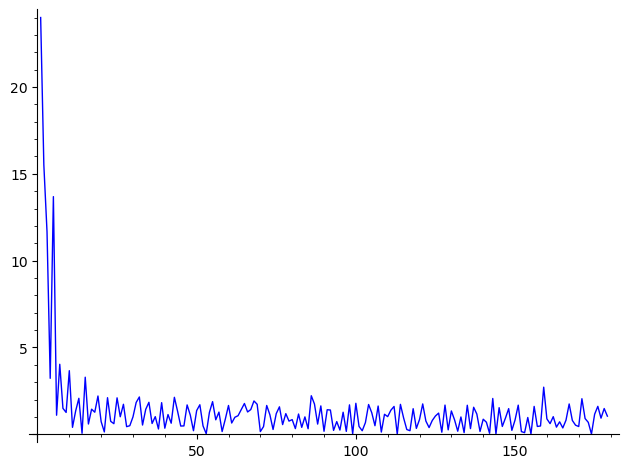

LOGS MINIMUM MODULI


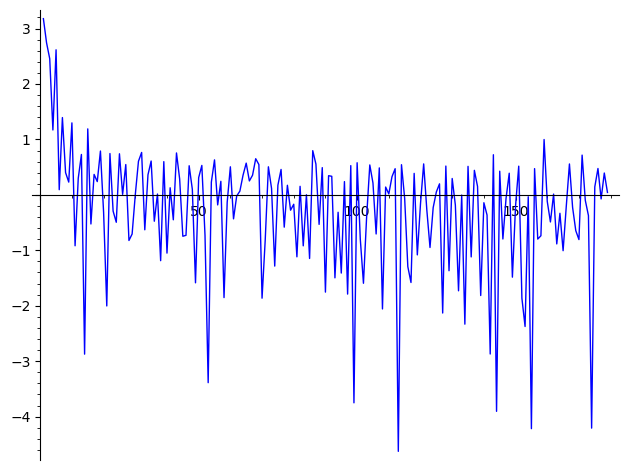

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


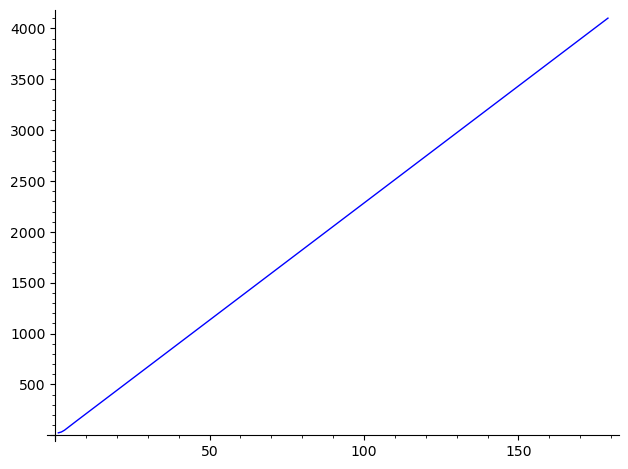

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(180, 0)
MINIMUM MODULI


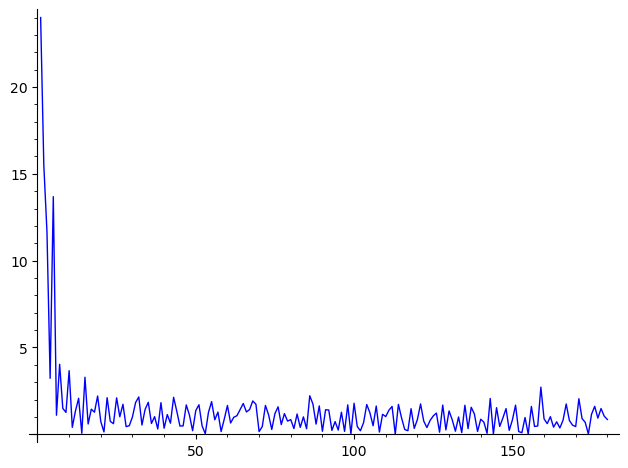

LOGS MINIMUM MODULI


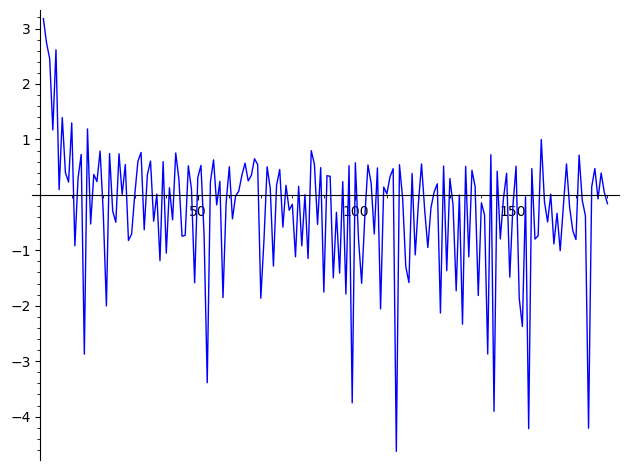

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


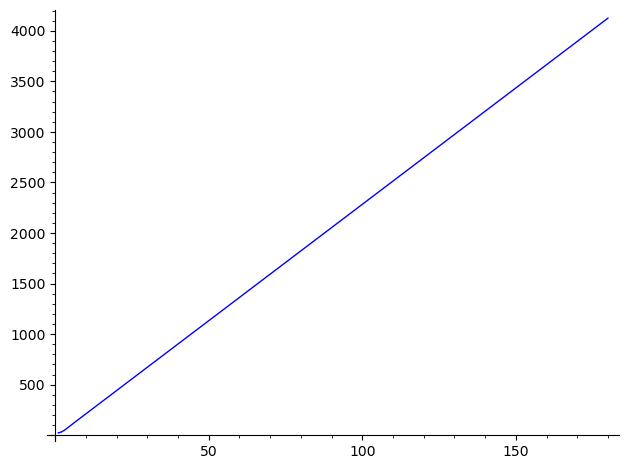

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(181, 0)
MINIMUM MODULI


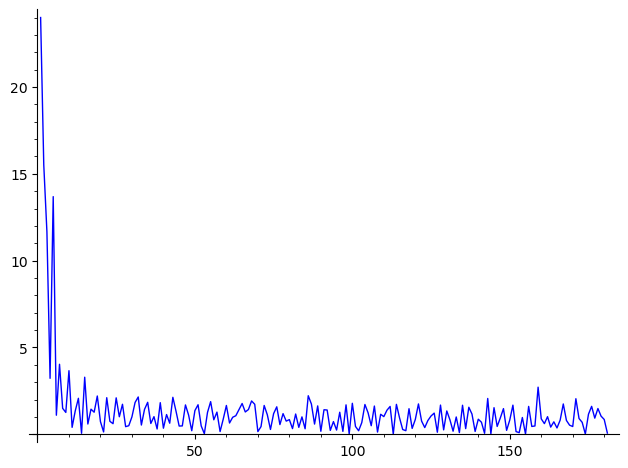

LOGS MINIMUM MODULI


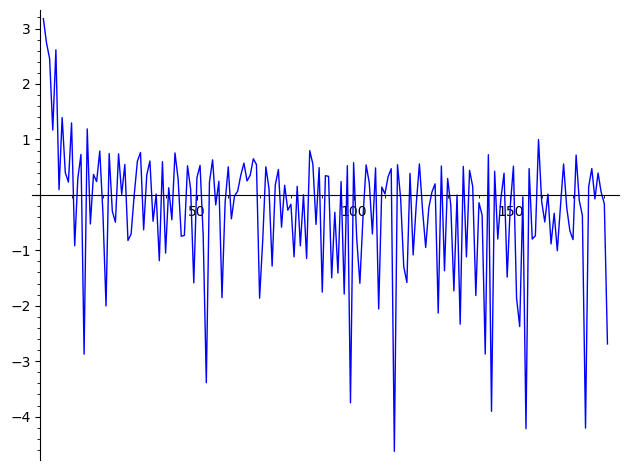

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


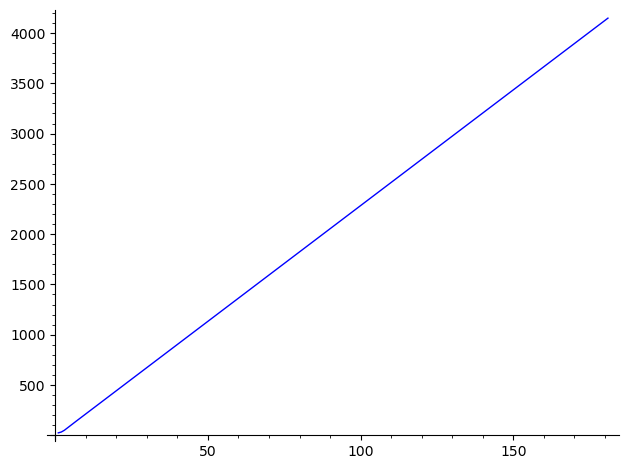

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(182, 0)
MINIMUM MODULI


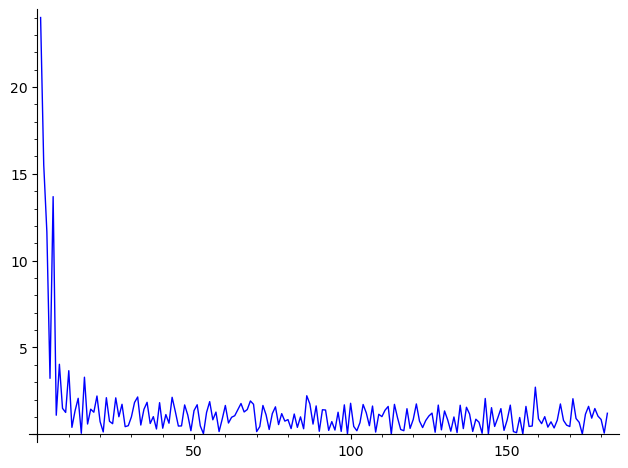

LOGS MINIMUM MODULI


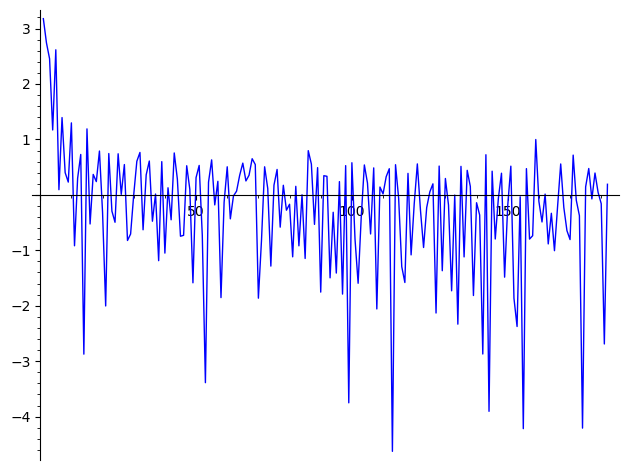

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


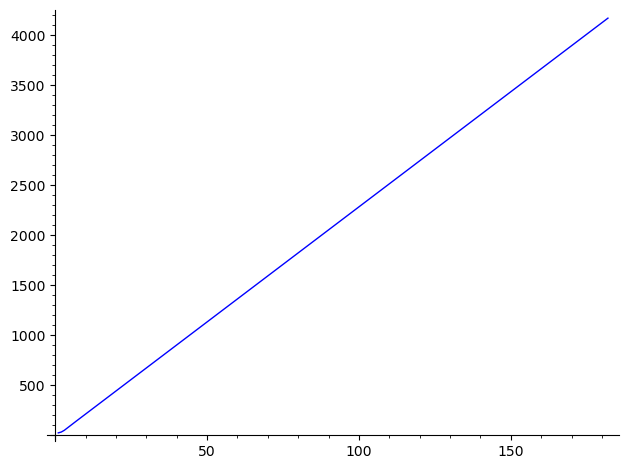

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(183, 0)
MINIMUM MODULI


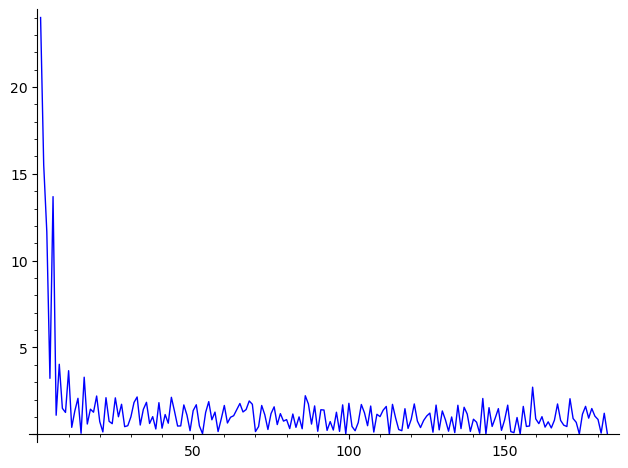

LOGS MINIMUM MODULI


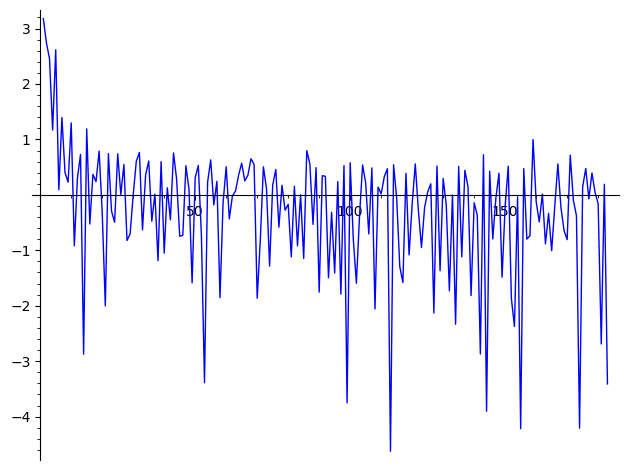

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


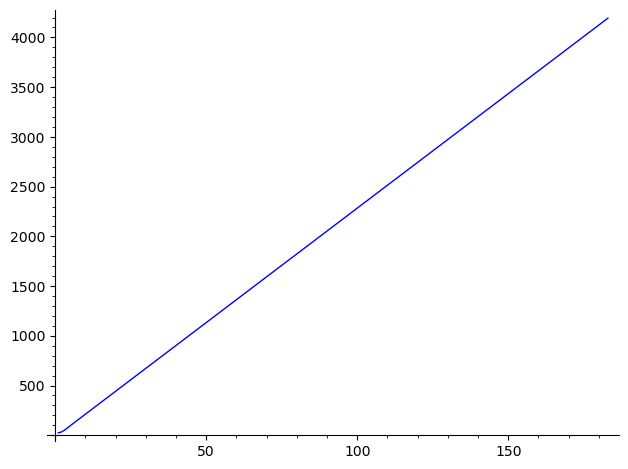

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(184, 0)
MINIMUM MODULI


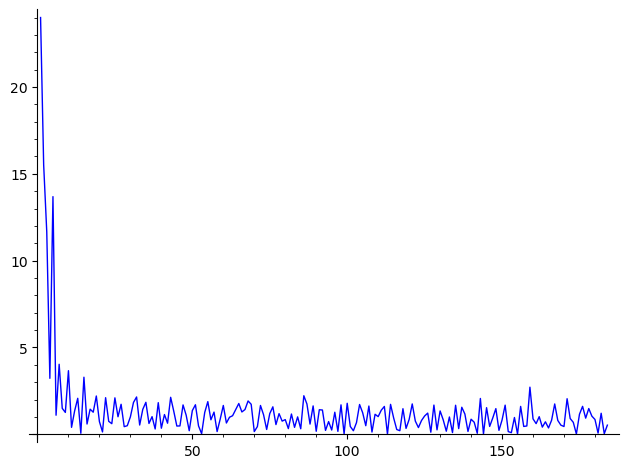

LOGS MINIMUM MODULI


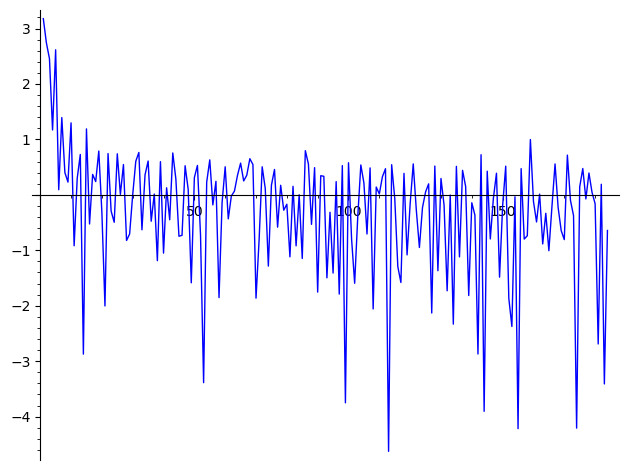

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


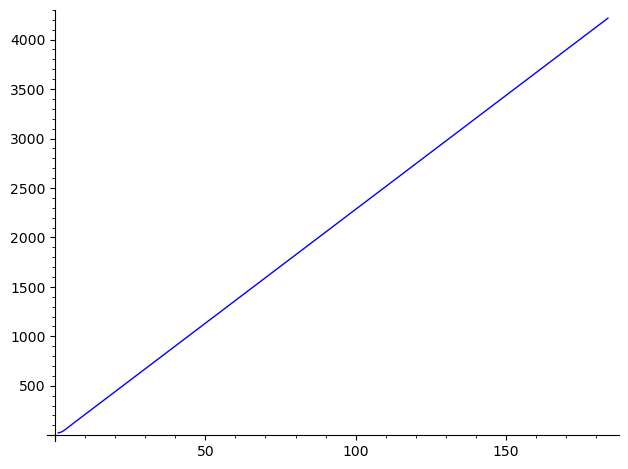

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(185, 0)
MINIMUM MODULI


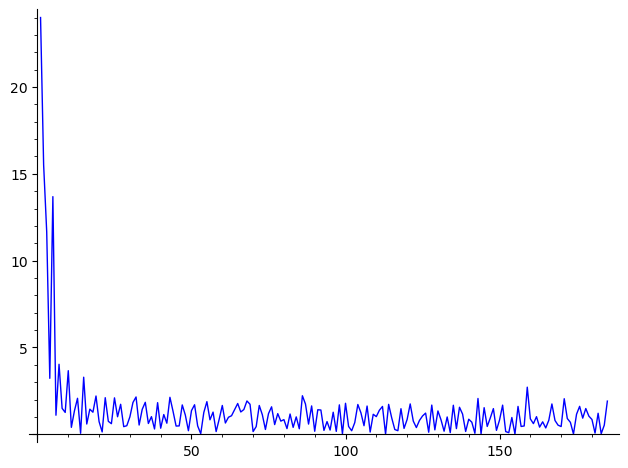

LOGS MINIMUM MODULI


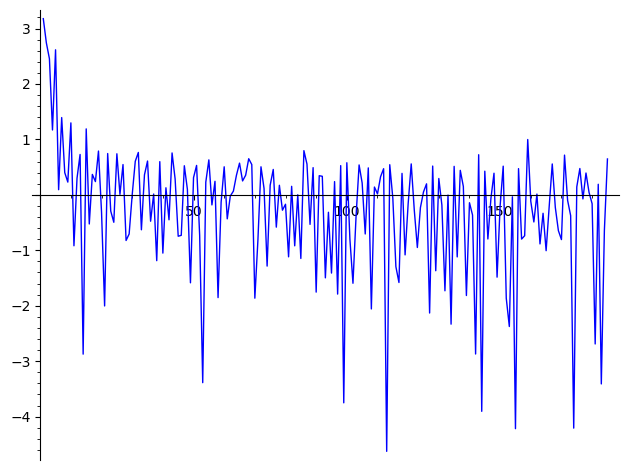

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


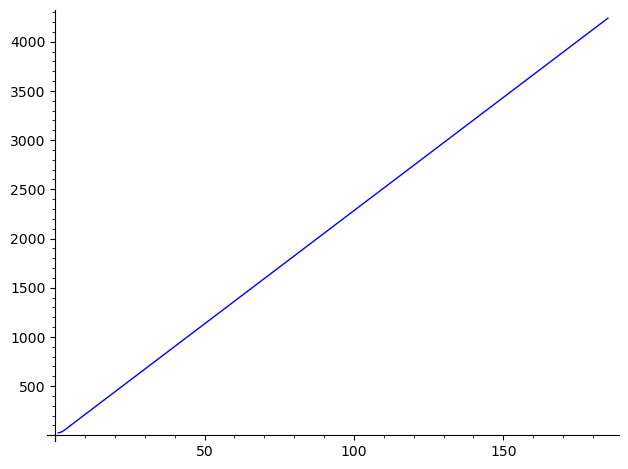

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(186, 0)
MINIMUM MODULI


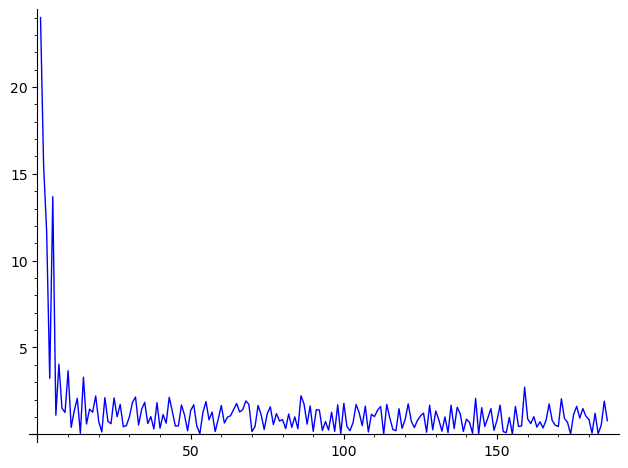

LOGS MINIMUM MODULI


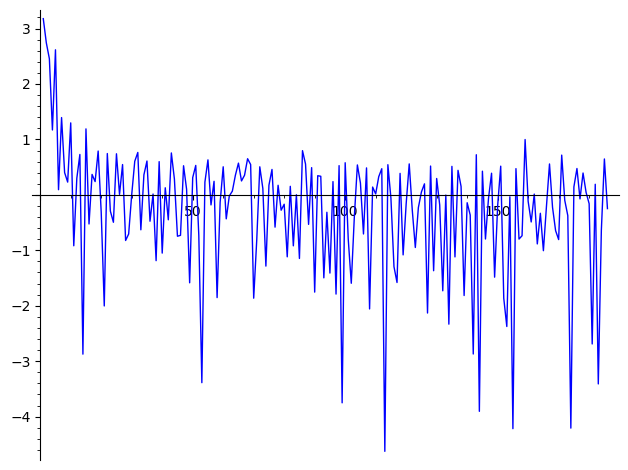

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


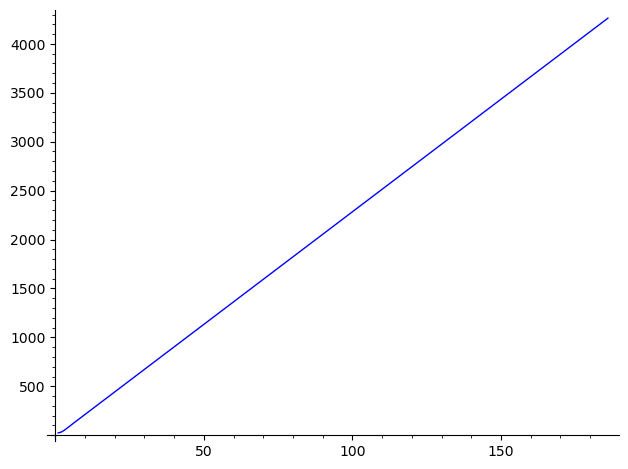

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(187, 0)
MINIMUM MODULI


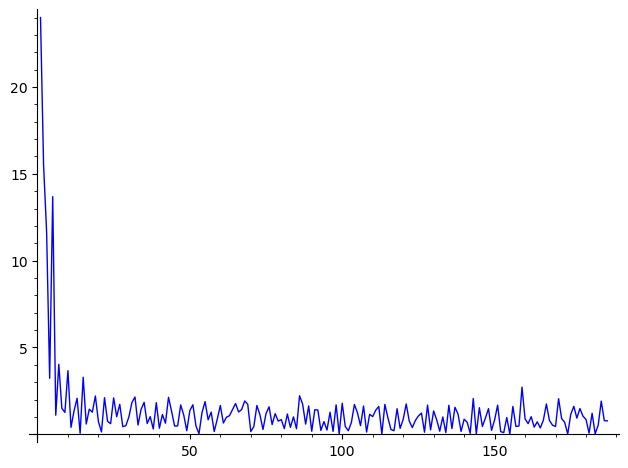

LOGS MINIMUM MODULI


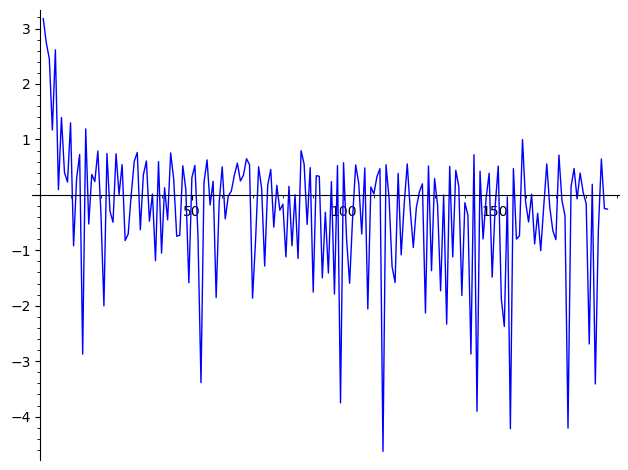

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


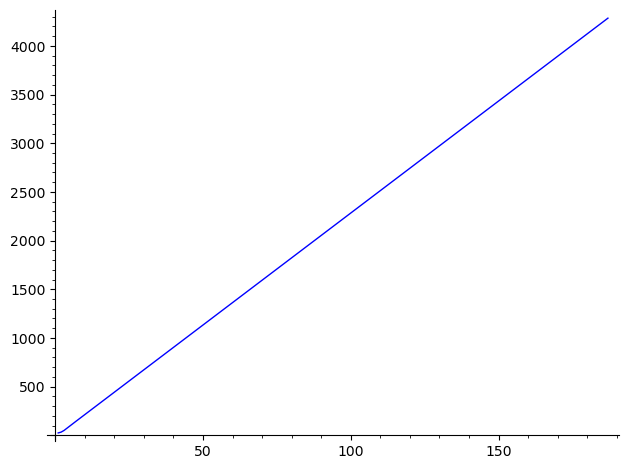

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(188, 0)
MINIMUM MODULI


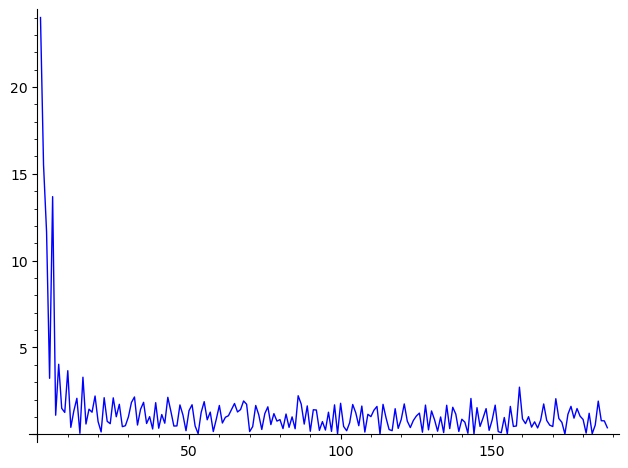

LOGS MINIMUM MODULI


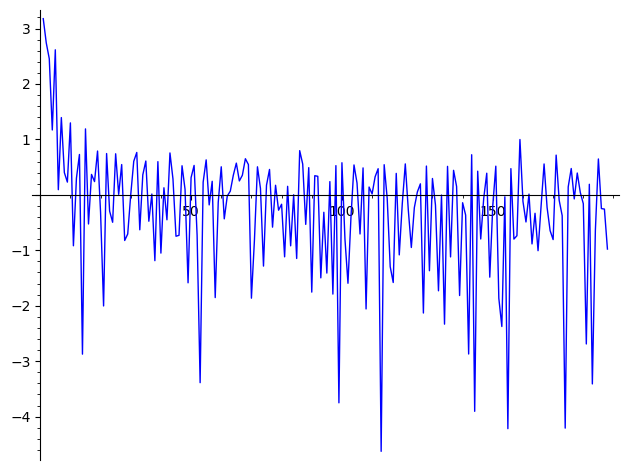

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


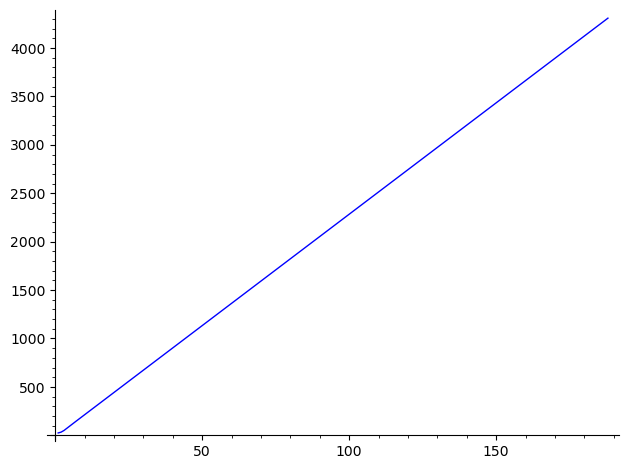

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(189, 0)
MINIMUM MODULI


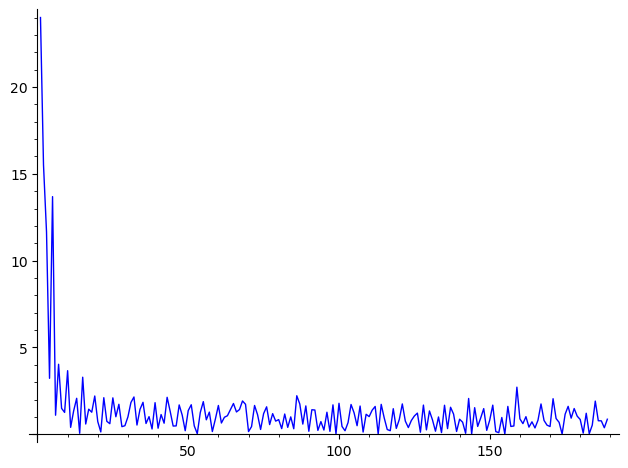

LOGS MINIMUM MODULI


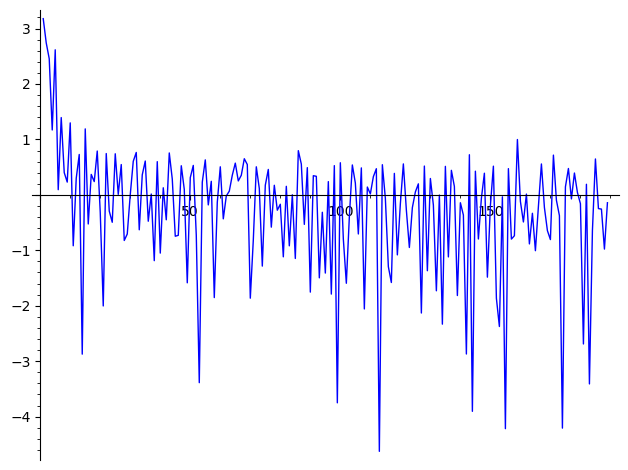

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


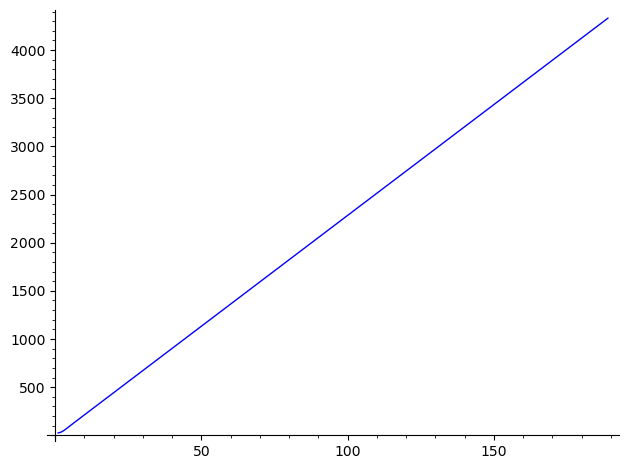

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(190, 0)
MINIMUM MODULI


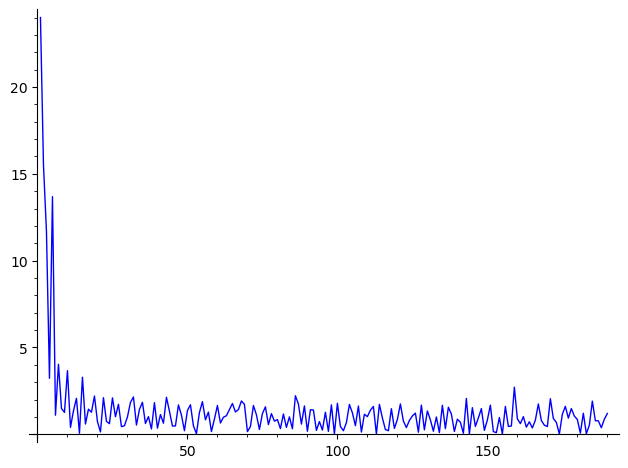

LOGS MINIMUM MODULI


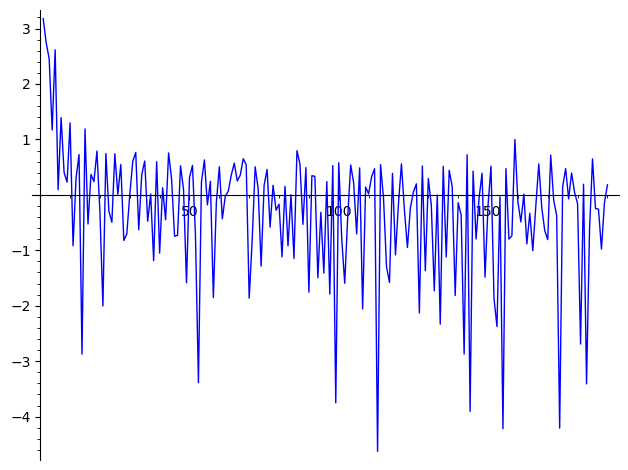

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


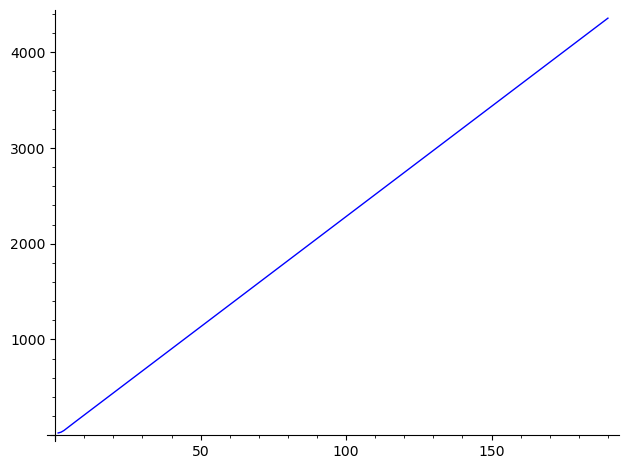

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(191, 0)
MINIMUM MODULI


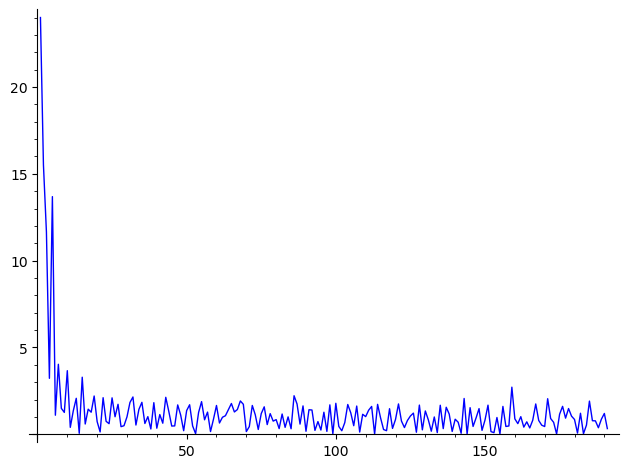

LOGS MINIMUM MODULI


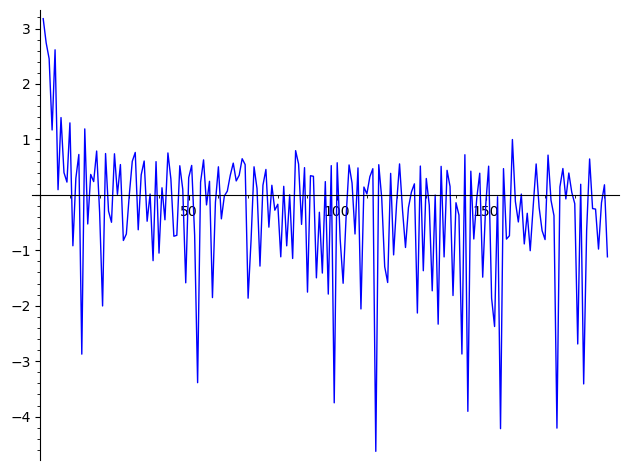

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


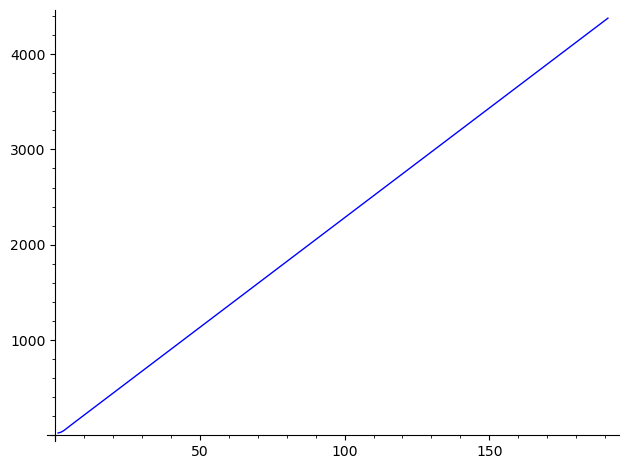

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(192, 0)
MINIMUM MODULI


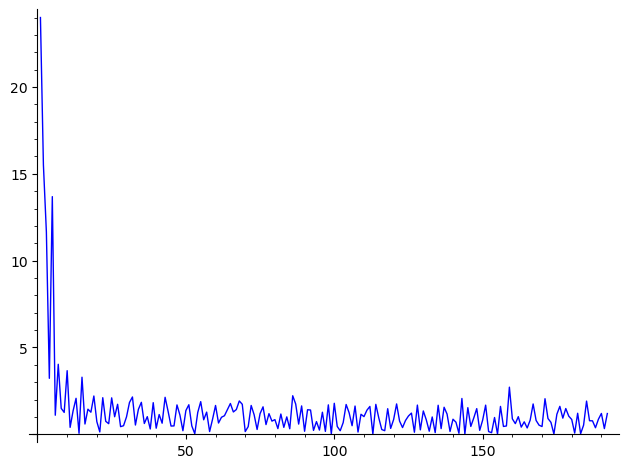

LOGS MINIMUM MODULI


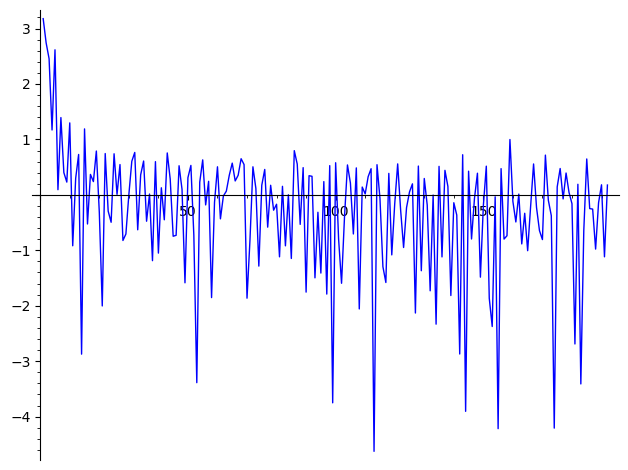

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


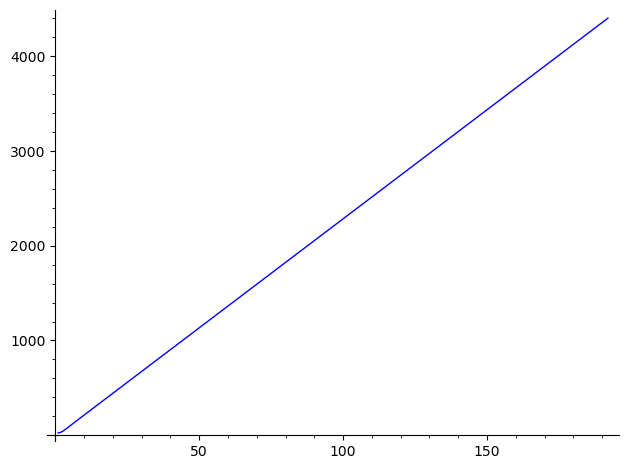

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(193, 0)
MINIMUM MODULI


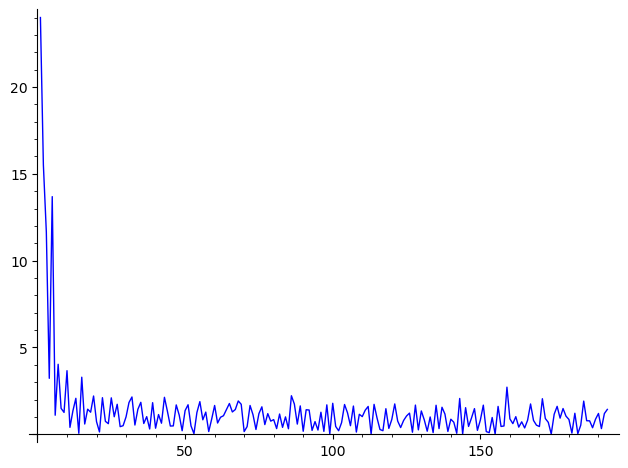

LOGS MINIMUM MODULI


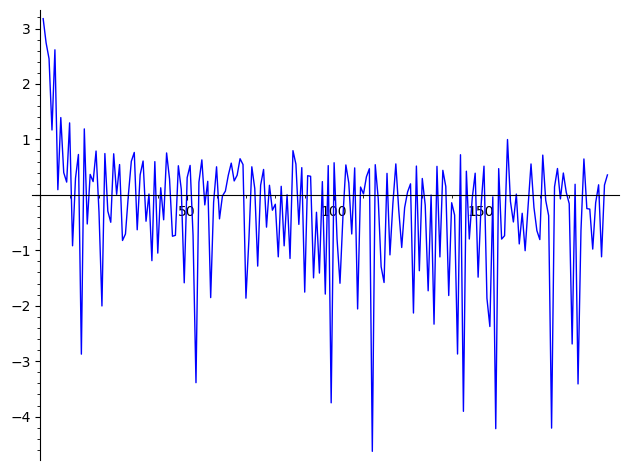

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


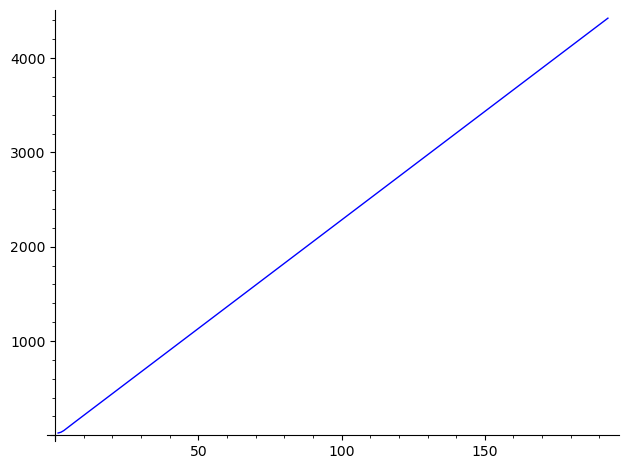

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(194, 0)
MINIMUM MODULI


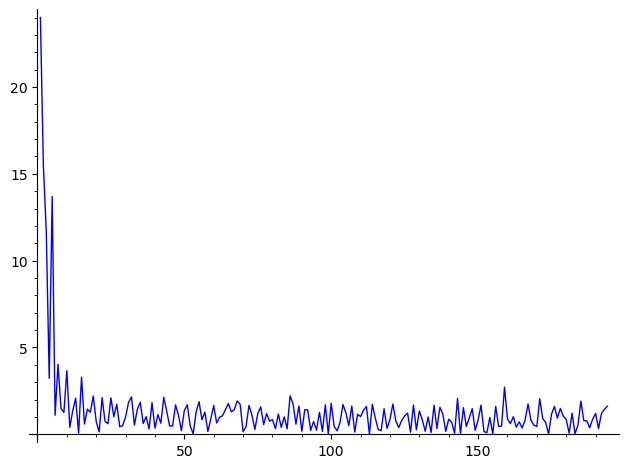

LOGS MINIMUM MODULI


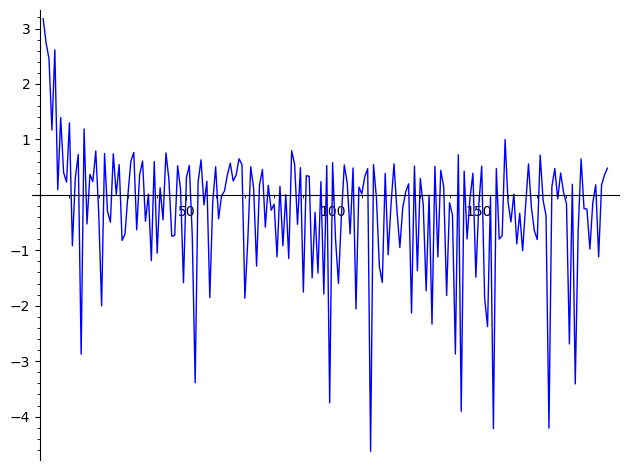

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


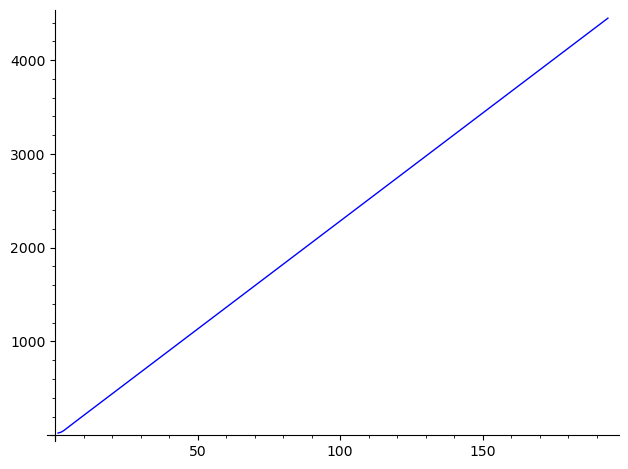

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(195, 0)
MINIMUM MODULI


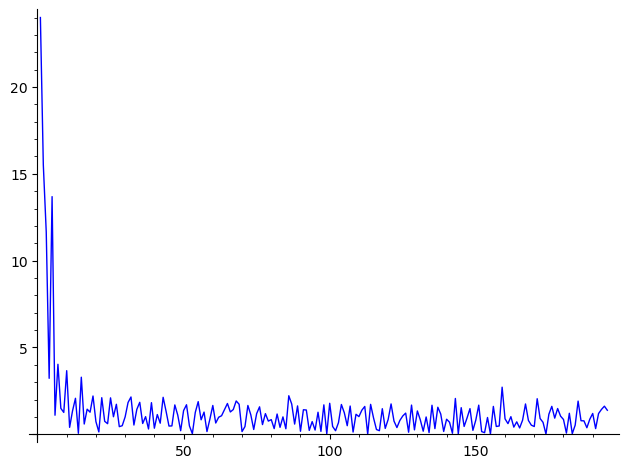

LOGS MINIMUM MODULI


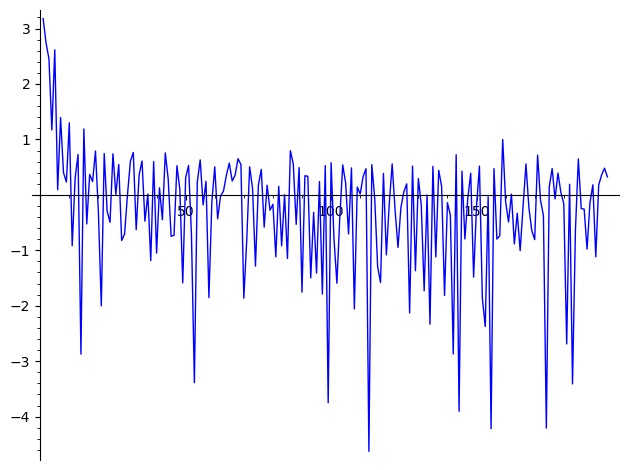

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


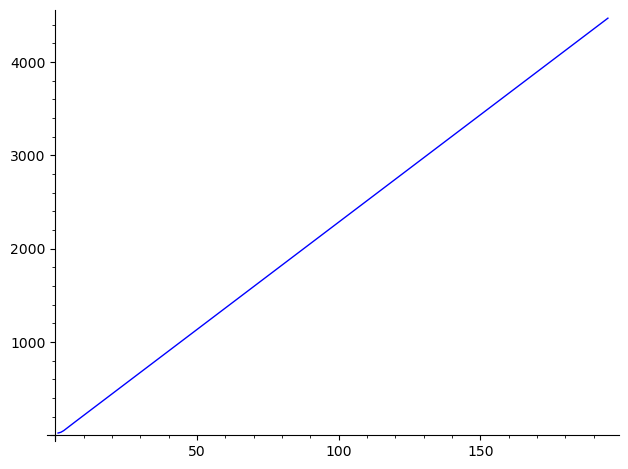

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(196, 0)
MINIMUM MODULI


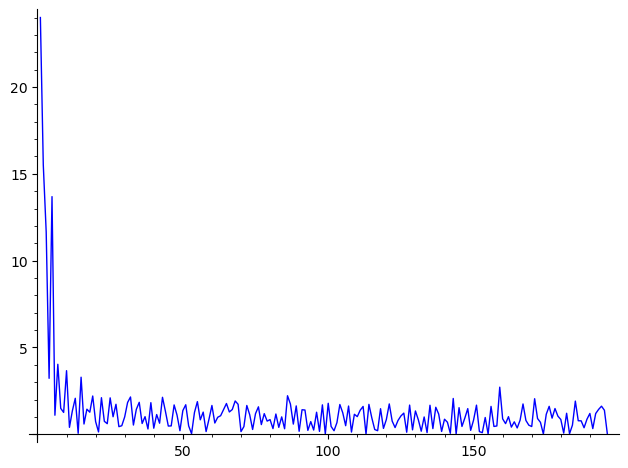

LOGS MINIMUM MODULI


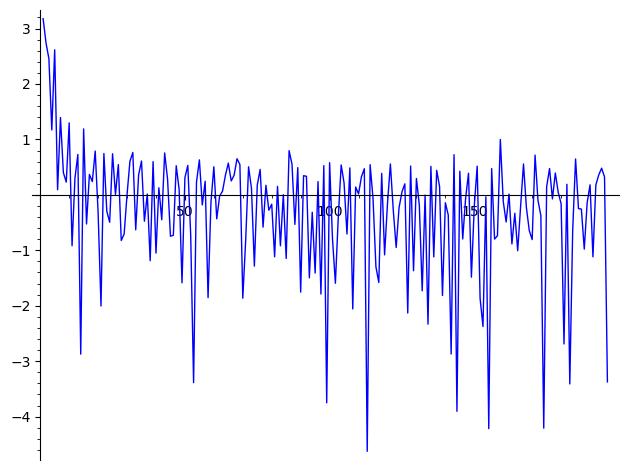

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


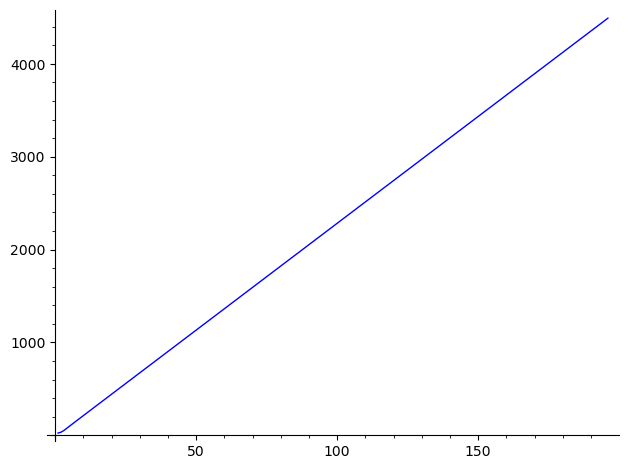

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(197, 0)
MINIMUM MODULI


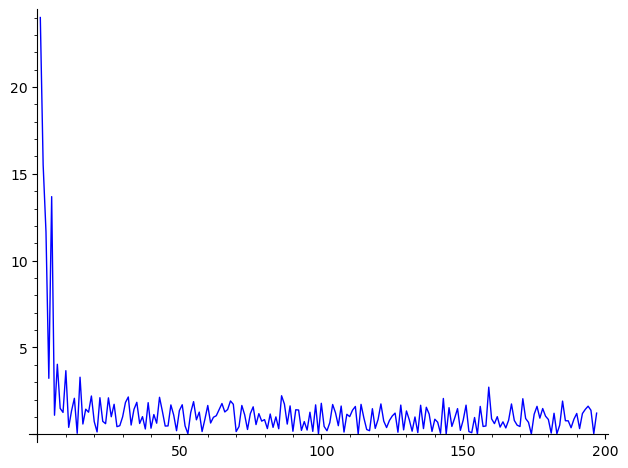

LOGS MINIMUM MODULI


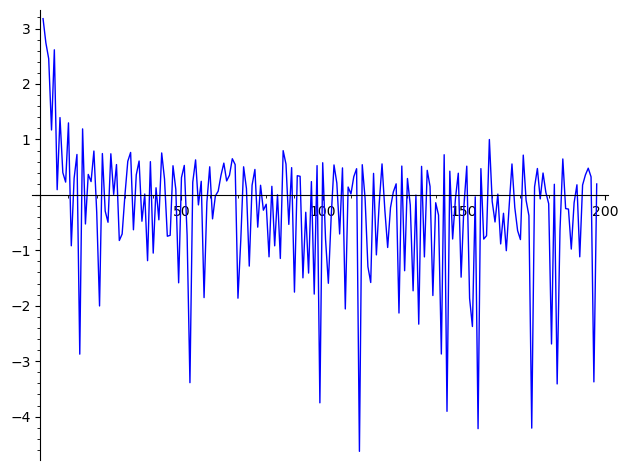

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


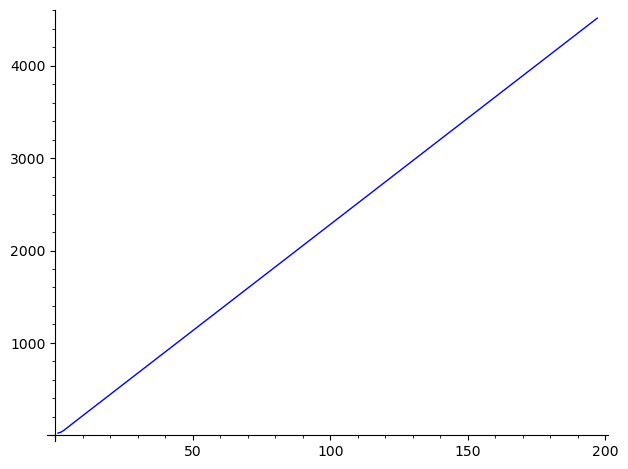

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(198, 0)
MINIMUM MODULI


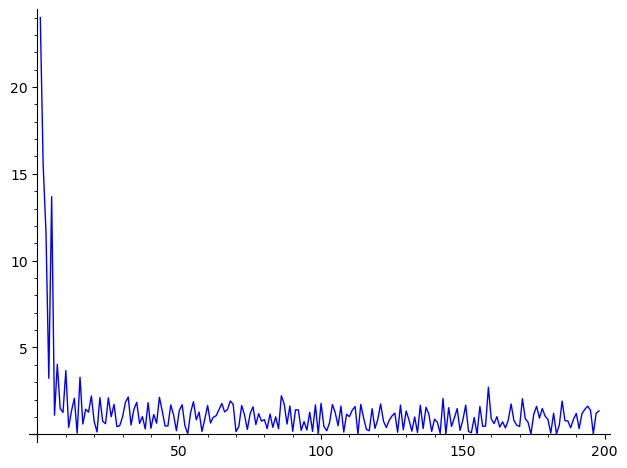

LOGS MINIMUM MODULI


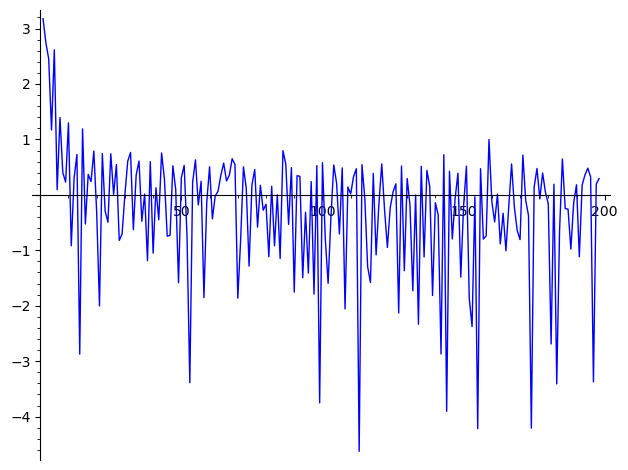

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


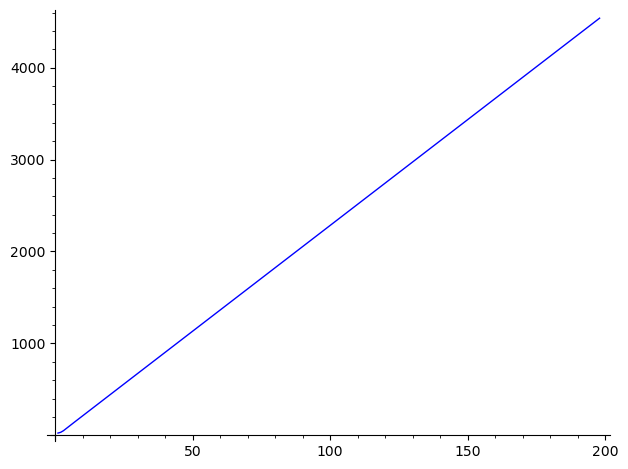

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(199, 0)
MINIMUM MODULI


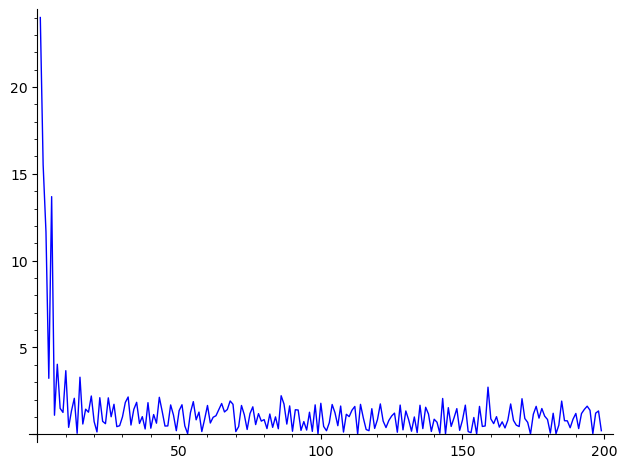

LOGS MINIMUM MODULI


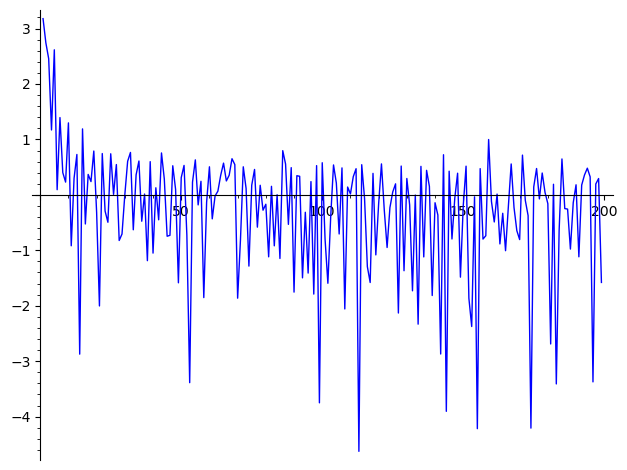

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


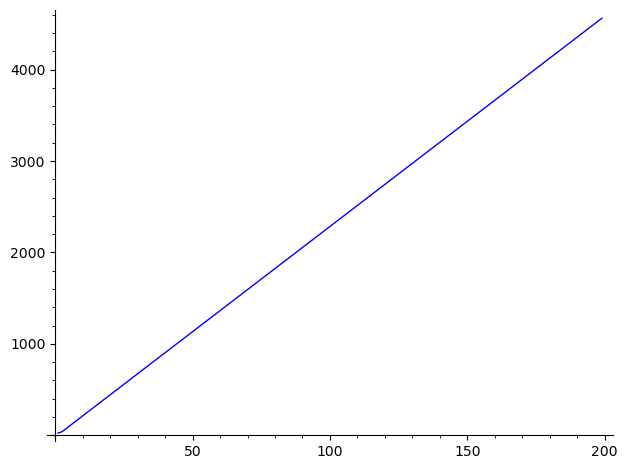

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
----------------------------------------------------------------------------------------------------
(200, 0)
MINIMUM MODULI


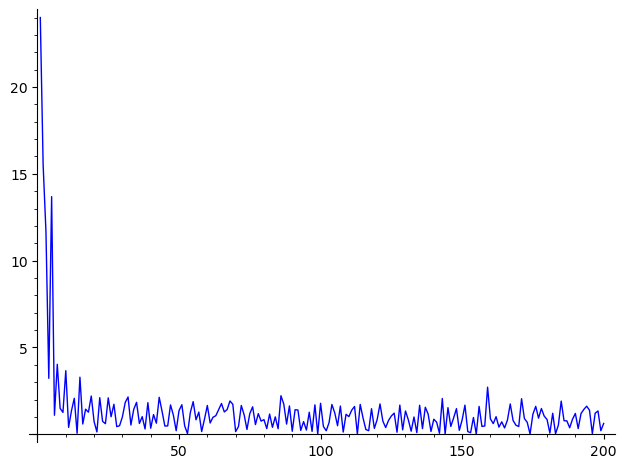

LOGS MINIMUM MODULI


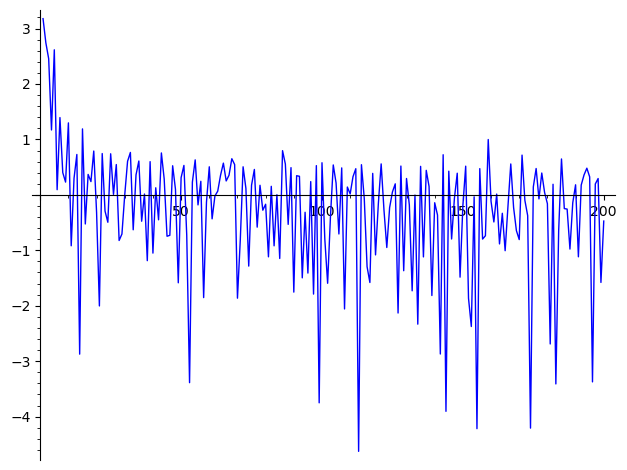

minimum logarithm of minimum modulus: -4.6261470117671332106042427363
MAXIMUM MODULI


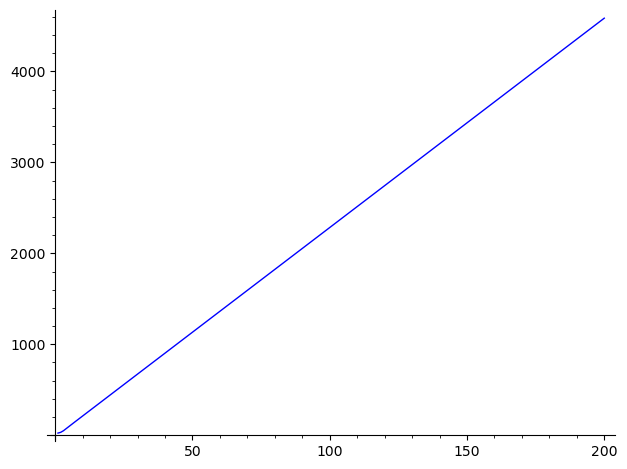

PERIODIC BEHAVIOR ANALYSIS RESULTS
(Rejecting: score < 0.300000000000000 or period > 100)

ANALYSIS COMPLETE: 0 valid results, 0 rejected
tests:
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


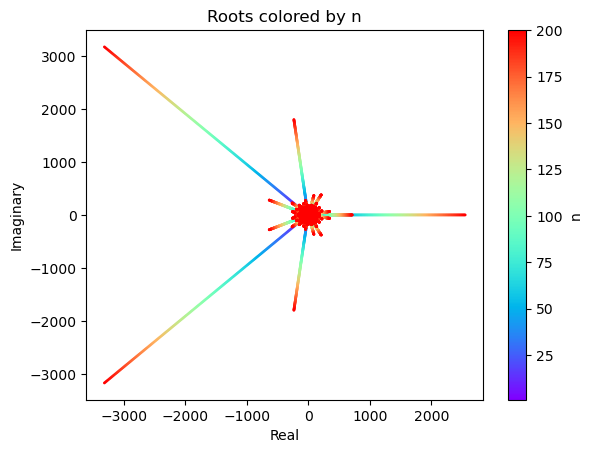

In [2]:
import pickle
from sage.all import sigma, nth_prime
import ast

def nieburTau(n):
    def step1(n, k):
        return 35*k^4 - 52*k^3*n + 18*k^2*n^2
    def step2(n, k):
        return sigma(k) * sigma(n - k)
    def step3(n):
        ans = 0
        for k in range(1, n):
            ans += step1(n, k) * step2(n, k)
        return 24*ans
    return n^4 * sigma(n) - step3(n)

def h(n):
    if n>0:
        return nieburTau(nth_prime(n)) # i.e., tauPrime(n)
    if n==0:
        return 1

h_list=[]
with open('/Users/barrybrent/data/run17oct25no16.txt', 'rb') as rfile:
    j_list = pickle.load(rfile) #tauPrime(n) j-companion
    
def P_matrix(lst):
    lenlist=len(lst)
    columns=[lst]
    for k in range(1,lenlist):
        column=[0]*(k-1)
        column=column+[-k]
        column=flatten(column+[lst])
        column=column+[lst]
        column=column[:lenlist]
        columns+=[column]
    return (matrix(columns)).transpose()

def periodic_behavior_score(main_local_minima_list, min_score=0.3, max_period=100):
    """
    Analyzes periodic behavior for all v values in main_local_minima_list.
    Uses autocorrelation and FFT to detect ANY periodic pattern (not just sine waves).
    Filters out results with weak periodicity or unreasonably large periods.
    
    Args:
        main_local_minima_list: List of tuples [(v1, points1), (v2, points2), ...]
                                where points are [(x1, y1), (x2, y2), ...]
        min_score: Minimum periodicity score to accept (default: 0.3)
        max_period: Maximum allowed period (default: 100). Results with larger periods are rejected.
    
    Returns:
        results: List of tuples [(v, score, info_dict), ...] for valid results only
    """
    
    results = []
    rejected = []
    
    print("=" * 80)
    print("PERIODIC BEHAVIOR ANALYSIS RESULTS")
    print(f"(Rejecting: score < {min_score} or period > {max_period})")
    print("=" * 80)
    
    for points in mins_list:
        if len(points) < 4:
            continue
        
        # Extract x and y coordinates, converting to plain floats
        x_data = np.array([float(p[0]) for p in points])
        y_data = np.array([float(p[1]) for p in points])
        
        # Remove mean (detrend)
        y_detrended = y_data - np.mean(y_data)
        
        # --- Method 1: Autocorrelation Analysis ---
        autocorr = correlate(y_detrended, y_detrended, mode='full')
        autocorr = autocorr[len(autocorr)//2:]
        autocorr = autocorr / autocorr[0]  # Normalize
        
        # Find peaks in autocorrelation (excluding the first peak at lag=0)
        peaks, properties = find_peaks(autocorr[1:], prominence=0.1, distance=3)
        peaks = peaks + 1  # Adjust for excluding first element
        
        # Calculate periodicity score from autocorrelation
        if len(peaks) > 0:
            autocorr_score = autocorr[peaks[0]] if peaks[0] < len(autocorr) else 0
            spacing = np.mean(np.diff(x_data))
            autocorr_period = peaks[0] * spacing
        else:
            autocorr_score = 0
            autocorr_period = None
        
        # --- Method 2: FFT Analysis ---
        n = len(y_detrended)
        yf = fft(y_detrended)
        spacing = np.mean(np.diff(x_data))
        xf = fftfreq(n, spacing)[:n//2]
        power = 2.0/n * np.abs(yf[:n//2])
        
        if len(power) > 1:
            dominant_freq_idx = np.argmax(power[1:]) + 1
            dominant_freq = xf[dominant_freq_idx]
            fft_period = 1/dominant_freq if dominant_freq > 0 else None
            
            # FFT score: ratio of dominant peak to mean power
            mean_power = np.mean(power[1:])
            fft_score = power[dominant_freq_idx] / mean_power if mean_power > 0 else 0
            fft_score = min(fft_score / 10, 1.0)  # Normalize to 0-1 range
        else:
            fft_period = None
            fft_score = 0
            dominant_freq = 0
        
        # --- Combined Score ---
        combined_score = (autocorr_score + fft_score) / 2
        
        # Determine best period estimate
        if autocorr_period and fft_period:
            # Use autocorr period if both are available and similar
            if abs(autocorr_period - fft_period) / max(autocorr_period, fft_period) < 0.3:
                best_period = autocorr_period
                period_confidence = "high"
            else:
                # Use the one with higher score
                best_period = autocorr_period if autocorr_score > fft_score else fft_period
                period_confidence = "moderate"
        elif autocorr_period:
            best_period = autocorr_period
            period_confidence = "moderate"
        elif fft_period:
            best_period = fft_period
            period_confidence = "low"
        else:
            best_period = None
            period_confidence = "none"
        
        # Check rejection criteria
        rejection_reason = None
        if combined_score < min_score:
            rejection_reason = f"score = {combined_score:.3f} (too low)"
        elif best_period and best_period > max_period:
            rejection_reason = f"period = {best_period:.2f} (too large)"
        
        if rejection_reason:
            print(f"\nREJECTED v = {v}: {rejection_reason}")
            print(f"  ({len(peaks)} autocorrelation peaks found)")
            rejected.append((v, combined_score, best_period))
            continue
        
        # Package results
        info_dict = {
            'combined_score': combined_score,
            'autocorr_score': autocorr_score,
            'autocorr_period': autocorr_period,
            'autocorr_peaks': len(peaks),
            'fft_score': fft_score,
            'fft_period': fft_period,
            'dominant_frequency': dominant_freq,
            'best_period': best_period,
            'period_confidence': period_confidence
        }
        
        results.append((v, combined_score, info_dict))
        
        print(f"\nAnalyzing v = {v}:")
        print(f"  Autocorrelation peaks found: {len(peaks)}")
        print(f"  Combined periodicity score = {combined_score:.6f}")
        print(f"  Best period estimate = {best_period:.4f} (confidence: {period_confidence})")
        print(f"  Autocorrelation: score = {autocorr_score:.4f}, period = {(autocorr_period if autocorr_period else 0):.4f}")
        print(f"  FFT: score = {fft_score:.4f}, period = {(fft_period if fft_period else 0):.4f}")
        print(f"  Dominant frequency = {dominant_freq:.6f}")
    
    print("\n" + "=" * 80)
    print(f"ANALYSIS COMPLETE: {len(results)} valid results, {len(rejected)} rejected")
    print("=" * 80)
    
    return results

from sage.all import *
precision_bits = 100
CC = ComplexField(precision_bits)
x = polygen(QQ)  # Can remain in preamble if all polynomials are in one variable
matrix_list=[]
charpol_list=[]
roots_list=[]
aar_list=[]
centers_list=[]
max_diameter_list=[]
mins_list=[]
log_mins_list=[]
maxes_list=[]
log_maxes_list=[]
dets=[]
tests=[]
for n in range(1, 201):
    print("----------------------------------------------------------------------------------------------------")
    
    undeformed_j_list=j_list[1:n+1]
    inputs=[pair[1] for pair in undeformed_j_list]
    pl=P_matrix(inputs) ### UNDEFORMED
    det=pl.det()
    test=det-h(n)*factorial(n)
    tests.append(test)
    print((n,test))
    dets.append((n,det))
    matrix_list+=[(n,pl)]
    cp=pl.charpoly()
    charpol_list+=[(n,cp)]
    roots = cp.roots(ring=CC, multiplicities=False)       
    roots_list+=[(n,roots)]
    pairs = [(z.real(), z.imag()) for z in roots]
    aar = [r.abs() for r in roots]
    aar_list+=[(n,aar)]
    # compute absolute value for each root (before any conversion)
    if aar!=[]:
        minn = min(aar)  
        mins_list+=[(n,minn)]
        mins_list.append((n,minn))
        if minn>0:
            log_minn=log(minn)
        log_mins_list.append((n,log_minn))
        maxx = max(aar)  
        maxes_list.append((n,maxx))
        if maxx>0:
            log_maxx=log(maxx)
            log_maxes_list.append((n,log_maxx))
    p = list_plot(mins_list, plotjoined=True, axes_labels=['', ''])
    print("MINIMUM MODULI")
    p.show()
    p = list_plot(log_mins_list, plotjoined=True, axes_labels=['', ''])
    print("LOGS MINIMUM MODULI")
    p.show()
    mml=[pair[1] for pair in log_mins_list]
    print("minimum logarithm of minimum modulus:",min(mml))
    p = list_plot(maxes_list, plotjoined=True, axes_labels=['', ''])
    print("MAXIMUM MODULI")
    p.show()
    results = periodic_behavior_score(mins_list, min_score=0.3, max_period=100)
print("tests:")
print(tests)
with open('/Users/barrybrent/data/run18oct25no101.txt', 'wb') as wfile:
    pickle.dump(roots_list, wfile) #output snipped

with open('/Users/barrybrent/data/run18oct25no102.txt', 'wb') as wfile:
    pickle.dump(charpol_list, wfile) #output snipped

with open('/Users/barrybrent/data/run18oct25no103.txt', 'wb') as wfile:
    pickle.dump(max_diameter_list, wfile) #output snipped

with open('/Users/barrybrent/data/run18oct25no104.txt', 'wb') as wfile:
    pickle.dump(dets, wfile) #output snipped
    
with open('/Users/barrybrent/data/run18oct25no105.txt', 'wb') as wfile:
    pickle.dump(log_mins_list, wfile) #output snipped

with open('/Users/barrybrent/data/run18oct25no106.txt', 'wb') as wfile:
    pickle.dump(maxes_list, wfile) #output snipped

from sage.plot.colors import rainbow
import matplotlib.pyplot as plt

n_values = [n for n, roots in roots_list]
n_min, n_max = min(n_values), max(n_values)
colors = rainbow(len(n_values))

# Collect all points with their n values for matplotlib
all_points = []
all_n_values = []
for n, roots in roots_list:
    for z in roots:
        all_points.append((float(z.real()), float(z.imag())))
        all_n_values.append(n)

# Use matplotlib for better color mapping
real_parts = [p[0] for p in all_points]
imag_parts = [p[1] for p in all_points]

plt.scatter(real_parts, imag_parts, c=all_n_values, cmap='rainbow', s=1)
plt.colorbar(label='n')
plt.xlabel('Real')
plt.ylabel('Imaginary')
plt.title('Roots colored by n')
plt.show()